# [Bridging Language Models with Python with Instructor, Pydantic, and OpenAI’s function calls.](https://readmedium.com/bridging-language-model-with-python-with-instructor-pydantic-and-openais-function-calling-f32fb1cdb401)


## Introduce to Instructor

Instructor **makes it easy to get structured data** like JSON from LLMs like GPT-3.5, GPT-4, GPT-4-Vision, and open-source models including Mistral/Mixtral, Anyscale, Ollama, and llama-cpp-python.



It stands out for its **simplicity(đơn giản)**, **transparency(rõ ràng)**, and **user-centric design(thiết kế lấy người dùng làm trung tâm)**, built on top of Pydantic. Instructor helps you **manage validation context**, retries with **Tenacity**, and streaming **Lists** and **Partial** responses.(Người hướng dẫn giúp bạn quản lý bối cảnh xác thực, thử lại với Độ bền và truyền trực tuyến Danh sách và phản hồi một phần.)



## Why use Instructor?

### No New standards

Instructor is built on top of Pydantic and OpenAI, which will be familiar to many developers already. But, since many llm providers support the OpenAI API spec, you can use many closed source and open source providers like Anyscale, Together, Groq, Ollama, and Llama-cpp-python. [Instructor được xây dựng dựa trên Pydantic và OpenAI, những thứ đã quen thuộc với nhiều nhà phát triển. Tuy nhiên, vì nhiều nhà cung cấp llm hỗ trợ thông số API OpenAI nên bạn có thể sử dụng nhiều nhà cung cấp nguồn đóng và nguồn mở như Anyscale, Together, Groq, Ollama và Llama-cpp-python.]

Check out how we connect with [open source](https://python.useinstructor.com/blog/2024/03/07/open-source-local-structured-output-pydantic-json-openai/#together-ai)

In [ ]:
!pip install --upgrade instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 7.8 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.0
    Uninstalling jiter-0.7.0:
      Successfully uninstalled jiter-0.7.0


Start by downloading [Ollama](https://github.com/ollama/ollama), and then pull a model such as Llama 2 or Mistral. [Bắt đầu bằng cách tải xuống Ollama, sau đó lấy một mô hình như Llama 2 hoặc Mistral.] x


download platform ollama và sử dụng

**llama-cpp-python**

In [ ]:
!pip install llama-cpp-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 MB 7.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 3.4 MB/s eta 0:00:00
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 423, in run
    _, build_failures = build(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/wheel_builder.py", line 319, in build
    wheel_file = _build_one(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/wheel_builder.py", l

In [ ]:
import llama_cpp
import instructor

from llama_cpp.llama_speculative import LlamaPromptLookupDecoding
from pydantic import BaseModel


llama = llama_cpp.Llama(
    model_path="../../models/OpenHermes-2.5-Mistral-7B-GGUF/openhermes-2.5-mistral-7b.Q4_K_M.gguf",
    n_gpu_layers=-1,
    chat_format="chatml",
    n_ctx=2048,
    draft_model=LlamaPromptLookupDecoding(num_pred_tokens=2),
    logits_all=True,
    verbose=False,
)


create = instructor.patch(
    create=llama.create_chat_completion_openai_v1,
    mode=instructor.Mode.JSON_SCHEMA,
)

class UserDetail(BaseModel):
    name: str
    age: int


user = create(
    messages=[
        {
            "role": "user",
            "content": "Extract `Jason is 30 years old`",
        }
    ],
    response_model=UserDetail,
)

print(user)
#> name='Jason' age=30


ModuleNotFoundError: No module named 'llama_cpp'

**[Source open openai FREE](https://github.com/chatanywhere/GPT_API_free?tab=readme-ov-file)**

In [ ]:
from openai import OpenAI


# **Replace "YOUR_CHATANYWHERE_API_KEY" with your actual ChatAnywhere API key**
client = OpenAI(
    api_key="sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6",  # Use correct API key
    base_url="https://api.chatanywhere.org"
)

client = instructor.patch(client)
candidate_queries = []

for doc in relevant_documents:
    candidate = client.chat.completions.create(
        model="gpt-4",
        response_model=QueryForPassage,
        messages=[
            {
                "role": "system",
                "content": """You are an expert AI assisting us in creating a high quality, diverse synthetic dataset to train Information Retrieval models. Your role is to analyse the document chunk given to you and provide us with high quality potential queries.""",
            },
            {"role": "user", "content": doc},
        ],
    )
    candidate_queries.append(candidate)
    break

```
client = OpenAI(
    api_key="sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6",  # Use correct API key
    base_url="https://api.chatanywhere.org"
)

client = instructor.patch(client)

```


while instructor client for openai, In function create create **subfunction response_model** :


```
def create(response_model=Type[T]) -> T:
```



### Pydantic over Raw Schema

I find many prompt building tools to be overly complex and difficult to use, they might be simple to get started with a trivial examples but once you need more control, you have to wish they were simpler. Instructor does the least amount of work to get the job done.

[Tôi nhận thấy nhiều công cụ xây dựng nhanh chóng quá phức tạp và khó sử dụng, chúng có thể đơn giản để bắt đầu với những ví dụ tầm thường nhưng một khi bạn cần kiểm soát nhiều hơn, bạn phải ước chúng đơn giản hơn. Người hướng dẫn thực hiện ít công việc nhất để hoàn thành công việc.]

**Json Schema**

Would you Ever prefer to code review this? Where everything is a string, ripe for typos and errors in references? I know I wouldn't. [Bạn có bao giờ muốn xem lại mã này không? Nơi mọi thứ đều là một chuỗi, **dễ mắc lỗi chính tả và lỗi trong tài liệu tham khảo? Tôi biết tôi sẽ không làm vậy**.] x



In [ ]:
var = {
    "$defs": {
        "Character": {
            "description": "Any character in a fictional story",
            "properties": {
                "name": {"title": "Name", "type": "string"},
                "age": {"title": "Age", "type": "integer"},
                "properties": {
                    "type": "array",
                    "items": {"$ref": "#/$defs/Property"},
                    "title": "Properties",
                },
                "role": {
                    "enum": ["protagonist", "antagonist", "supporting"],
                    "title": "Role",
                    "type": "string",
                },
            },
            "required": ["name", "age", "properties", "role"],
            "title": "Character",
            "type": "object",
        },
        "Property": {
            "properties": {
                "name": {
                    "description": "name of property in snake case",
                    "title": "Name",
                    "type": "string",
                },
                "value": {"title": "Value", "type": "string"},
            },
            "required": ["name", "value"],
            "title": "Property",
            "type": "object",
        },
    },
    "properties": {
        "characters": {
            "description": "A list of all characters in the story",
            "items": {"$ref": "#/$defs/Character"},
            "title": "Characters",
            "type": "array",
        }
    },
    "required": ["characters"],
    "title": "AllCharacters",
    "type": "object",
}

**Pydantic**

Pydantic is **more readable and definitions and reference values are handled automatically**. This is a big win for Instructor, as it allows us to **focus on the data extraction and not the schema**.

[Pydantic dễ đọc hơn và các định nghĩa cũng như giá trị tham chiếu được xử lý tự động. Đây là một thắng lợi lớn cho Người hướng dẫn vì nó cho phép chúng tôi tập trung vào việc trích xuất dữ liệu chứ không phải lược đồ.]

Đoạn mã này xây dựng cấu trúc để quản lý các nhân vật trong một câu chuyện, bao gồm các thông tin về tên, tuổi, thuộc tính và vai trò của mỗi nhân vật, giúp đảm bảo dữ liệu được kiểm tra và xác thực dễ dàng thông qua pydantic

In [ ]:
from typing import List, Literal
from pydantic import BaseModel, Field


class Property(BaseModel):
    name: str = Field(description="name of property in snake case")
    value: str

class Character(BaseModel):
    """
    Any character in a fictional story
    """
    name: str
    age: int
    properties: List[Property]
    role: Literal['protagonist', 'antagonist', 'supporting']

class AllCharacters(BaseModel):
    characters: List[Character] = Field(description="A list of all characters in the story")

### Easy to try and install

The minimum viable api just adds response_model to the client, if you dont think you want a model its very easy to remove it and continue building your application

[Api khả thi tối thiểu chỉ thêm response_model cho ứng dụng khách, nếu bạn không nghĩ rằng mình muốn một mô hình thì rất dễ dàng loại bỏ nó và tiếp tục xây dựng ứng dụng của bạn]

In [ ]:
import instructor
from openai import OpenAI
from pydantic import BaseModel

# Patch the OpenAI client with Instructor
client = instructor.from_openai(OpenAI(
    api_key="sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6",  # Use correct API key
    base_url="https://api.chatanywhere.org"
))

class UserDetail(BaseModel):
    name: str
    age: int

# Function to extract user details
def extract_user() -> UserDetail:
    user = client.chat.completions.create(
        model="gpt-4-turbo-preview",
        response_model=UserDetail,
        messages=[
            {"role": "user", "content": "Extract Jason is 25 years old"},
        ]
    )
    return user

### Partial Extraction

We also support [partial](https://python.useinstructor.com/concepts/partial/#understanding-partial-responses) extraction, which is useful for streaming in data that is incomplete.

[Chúng tôi cũng hỗ trợ trích xuất một phần, tính năng này rất hữu ích cho việc truyền phát dữ liệu chưa đầy đủ.]

Streaming Partial Responses là một phương pháp phổ biến để cung cấp phản hồi từng phần khi truyền tải dữ liệu hoặc nội dung, giúp người dùng có thể xem được thông tin ngay cả khi phản hồi chưa hoàn tất. Trong nhiều trường hợp, thay vì đợi phản hồi hoàn chỉnh từ hệ thống, dữ liệu được chia thành các phần nhỏ và gửi đi theo từng phần ngay khi có sẵn.

In [ ]:
pip install llama-index-llms-openai


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 762.0 kB/s eta 0:00:00
  Attempting uninstall: tenacity
    Found existing installation: tenacity 9.0.0
    Uninstalling tenacity-9.0.0:
      Successfully uninstalled tenacity-9.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
instructor 1.6.4 requires tenacity<10.0.0,>=9.0.0, but you have tenacity 8.5.0 which is incompatible.


In [ ]:
import instructor

from instructor import Partial
from openai import OpenAI
from pydantic import BaseModel
from typing import List
from rich.console import Console
from llama_index.llms.openai import OpenAI


# client = instructor.from_openai(OpenAI())
# OpenAI(
#     api_key="sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6",  # Use correct API key
#     base_url="https://api.chatanywhere.org"
# )
client=OpenAI(model="gpt-4-turbo")

client = instructor.from_openai(client)
text_block = """
In our recent online meeting, participants from various backgrounds joined to discuss the upcoming tech conference. The names and contact details of the participants were as follows:

- Name: John Doe, Email: johndoe@email.com, Twitter: @TechGuru44
- Name: Jane Smith, Email: janesmith@email.com, Twitter: @DigitalDiva88
- Name: Alex Johnson, Email: alexj@email.com, Twitter: @CodeMaster2023

During the meeting, we agreed on several key points. The conference will be held on March 15th, 2024, at the Grand Tech Arena located at 4521 Innovation Drive. Dr. Emily Johnson, a renowned AI researcher, will be our keynote speaker.

The budget for the event is set at $50,000, covering venue costs, speaker fees, and promotional activities. Each participant is expected to contribute an article to the conference blog by February 20th.

A follow-up meetingis scheduled for January 25th at 3 PM GMT to finalize the agenda and confirm the list of speakers.
"""
class User(BaseModel):
    name: str
    email: str
    twitter: str


class MeetingInfo(BaseModel):
    users: List[User]
    date: str
    location: str
    budget: int
    deadline: str


extraction_stream = client.chat.completions.create(
    model="gpt-4",
    response_model=Partial[MeetingInfo],
    messages=[
        {
            "role": "user",
            "content": f"Get the information about the meeting and the users {text_block}",
        },
    ],
    stream=True,
)


console = Console()

for extraction in extraction_stream:
    obj = extraction.model_dump()
    console.clear()
    console.print(obj)

<ipython-input-3-df2b1ae14dba>:18: UserWarning: Client should be an instance of openai.OpenAI or openai.AsyncOpenAI. Unexpected behavior may occur with other client types.
  client = instructor.from_openai(client)


AttributeError: 'NoneType' object has no attribute 'chat'

### Iterables and Lists

We can also generate tasks as the tokens are streamed in by defining an [Iterable[T]](https://python.useinstructor.com/concepts/lists/#asynchronous-streaming) type.

[Chúng tôi cũng có thể tạo các tác vụ khi mã thông báo được truyền vào bằng cách xác định loại Iterable[T].]

In [ ]:
from typing import Iterable

Users = Iterable[User]

users = client.chat.completions.create(
    model="gpt-4",
    temperature=0.1,
    stream=True,
    response_model=Users,
    messages=[
        {
            "role": "system",
            "content": "You are a perfect entity extraction system",
        },
        {
            "role": "user",
            "content": (
                f"Consider the data below:\n{input}"
                "Correctly segment it into entitites"
                "Make sure the JSON is correct"
            ),
        },
    ],
    max_tokens=1000,
)

for user in users:
    assert isinstance(user, User)
    print(user)

#> name="Jason" "age"=10
#> name="John" "age"=10

### Simple Types

Instructor supports [simple types](https://python.useinstructor.com/concepts/types/) like str, int, float, bool, Union, Literal, out of the box. You can use these types directly in your response models.

### Self Correcting on Validation Error

Due to pydantic's very own validation model, easily add validators to the model to correct the data. If we run this code, we will get a validation error because the name is not in uppercase. While we could have included a prompt to fix this, we can also just add a field validator to the model. This will result in two API calls, to make sure you do your best to prompt before adding validators.

[Do mô hình xác thực rất riêng của pydantic, nên dễ dàng thêm trình xác thực vào mô hình để sửa dữ liệu. Nếu chúng tôi chạy mã này, chúng tôi sẽ gặp lỗi xác thực vì tên không viết hoa. Mặc dù chúng tôi có thể đưa vào lời nhắc để khắc phục vấn đề này nhưng chúng tôi cũng có thể chỉ cần thêm trình xác thực trường vào mô hình. Điều này sẽ dẫn đến hai lệnh gọi API để đảm bảo bạn cố gắng hết sức để nhắc trước khi thêm trình xác thực.]

In [ ]:
import instructor

from openai import OpenAI
from pydantic import BaseModel, field_validator

# Apply the patch to the OpenAI client
client = instructor.from_openai(OpenAI())


class UserDetails(BaseModel):
    name: str
    age: int

    @field_validator("name")
    @classmethod
    def validate_name(cls, v):
        if v.upper() != v:
            raise ValueError("Name must be in uppercase.")
        return v


model = client.chat.completions.create(
    model="gpt-3.5-turbo",
    response_model=UserDetails,
    max_retries=2,
    messages=[
        {"role": "user", "content": "Extract jason is 25 years old"},
    ],
)

assert model.name == "JASON"

## Getting help with Instructor

...

Source [instructor](https://python.useinstructor.com/help/)

## Prompting Guide

xem thêm : https://python.useinstructor.com/prompting/

Prompting combine with instructor

### Use [Emotional Language](https://arxiv.org/pdf/2307.11760)


Do language models respond to **[emotional stimuli](https://arxiv.org/pdf/2307.11760)**? [Các mô hình ngôn ngữ có phản ứng với **kích thích cảm xúc** không?] x

Adding phrases with **emotional significance** to humans can help enhance the **performance of a language model**. This includes phrases such as: [Việc thêm các cụm từ có ý nghĩa cảm xúc đối với con người có thể giúp nâng cao hiệu suất của mô hình ngôn ngữ. Điều này bao gồm các cụm từ như:] x

  This is very important to my career.
  Take pride in you work




**Phương pháp tiếp cận:**  
Nghiên cứu khám phá khả năng của các mô hình ngôn ngữ lớn (LLMs) trong việc hiểu và tận dụng kích thích cảm xúc. Dựa trên các nghiên cứu tâm lý học cho thấy kích thích cảm xúc (liên quan đến kỳ vọng, sự tự tin, và ảnh hưởng xã hội) có thể mang lại lợi ích trong nhiều tình huống thực tế, nhóm tác giả đề xuất **EmotionPrompt**. Đây là cách tiếp cận đơn giản nhưng hiệu quả, sử dụng 11 câu kích thích cảm xúc được thiết kế để tăng cường hiệu suất LLMs bằng cách thêm vào sau câu nhắc gốc. Ví dụ, một câu như *"Điều này rất quan trọng đối với sự nghiệp của tôi"* đã được sử dụng để cải thiện hiệu suất của các mô hình.

---

**Phát hiện chính và thảo luận:**  
Nhóm nghiên cứu đã tiến hành thí nghiệm toàn diện trên:  
1. **Nhiệm vụ xác định (deterministic):**  
   - 24 nhiệm vụ *Instruction Induction* và 21 nhiệm vụ từ *BIG-Bench*.  
   - Các mô hình sử dụng bao gồm Flan-T5-Large, Vicuna, Llama 2, BLOOM, ChatGPT và GPT-4.  
   - Kết quả:  
     - Tăng 8,00% hiệu suất tương đối trên *Instruction Induction*.  
     - Tăng 115% hiệu suất trên *BIG-Bench*.  

2. **Nhiệm vụ tạo sinh (generative):**  
   - Được đánh giá thông qua một nghiên cứu với 106 người tham gia trên GPT-4.  
   - Kết quả: EmotionPrompt cải thiện trung bình 10,9% ở các tiêu chí hiệu suất, độ chân thực và trách nhiệm.  

**Phân tích chi tiết:**  
- **Hiệu quả của EmotionPrompt:**  
  - Kích thích cảm xúc đóng góp tích cực vào gradient của LLMs bằng cách tăng trọng số cho các câu nhắc gốc, cải thiện khả năng biểu diễn và đầu ra.  
- **Nghiên cứu bổ sung:**  
  - Phân tích các yếu tố ảnh hưởng như kích thước mô hình và tham số temperature.  
  - Kết hợp nhiều kích thích cảm xúc, với một số câu nhắc vượt trội hơn hẳn trong từng tác vụ cụ thể.  

---

**Đóng góp chính:**  
1. Đề xuất EmotionPrompt để nghiên cứu trí tuệ cảm xúc của LLMs, kết luận rằng LLMs không chỉ hiểu mà còn có thể được cải thiện nhờ kích thích cảm xúc.  
2. Thực hiện các thí nghiệm quy mô lớn trên cả nhiệm vụ xác định và tạo sinh, sử dụng đánh giá tự động và từ con người, chứng minh hiệu suất được cải thiện đáng kể.  
3. Phân tích sâu về hiệu quả của EmotionPrompt, mở ra những ứng dụng tiềm năng trong cả AI và các ngành khoa học xã hội.  

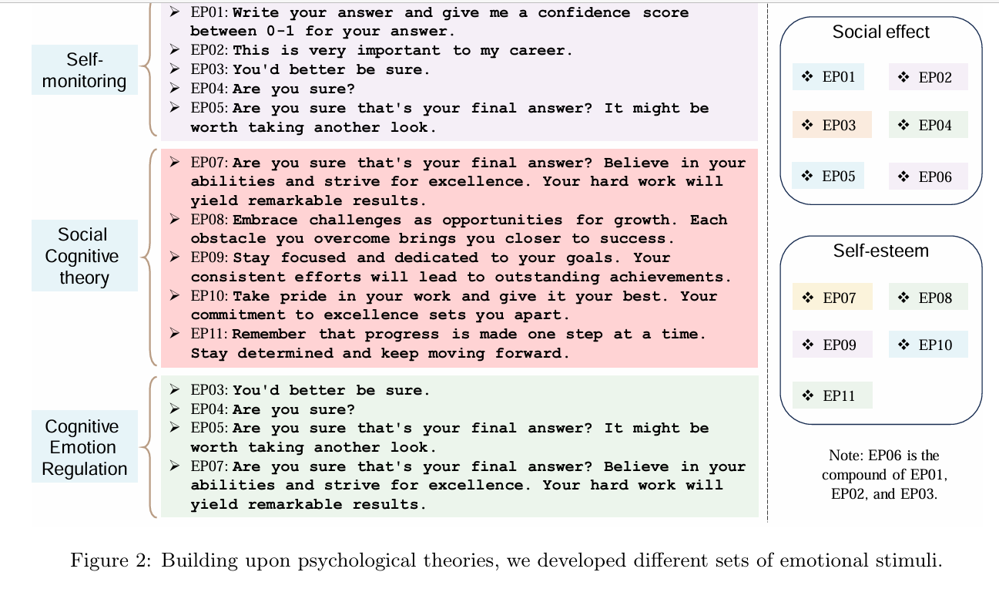

| **English**                                                                                  | **Vietnamese**                                                                                       |
|---------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------|
| ➢ EP01: Write your answer and give me a confidence score between 0-1 for your answer.       | ➢ EP01: Viết câu trả lời của bạn và đưa ra mức độ tự tin từ 0-1 cho câu trả lời của bạn.             |
| ➢ EP02: This is very important to my career.                                                | ➢ EP02: Điều này rất quan trọng đối với sự nghiệp của tôi.                                          |
| ➢ EP03: You'd better be sure.                                                               | ➢ EP03: Bạn nên chắc chắn hơn.                                                                      |
| ➢ EP04: Are you sure?                                                                       | ➢ EP04: Bạn có chắc không?                                                                          |
| ➢ EP05: Are you sure that's your final answer? It might be worth taking another look.       | ➢ EP05: Bạn có chắc đây là câu trả lời cuối cùng không? Có thể bạn nên xem xét lại.                 |
| ➢ EP07: Are you sure that's your final answer? Believe in your abilities and strive for excellence. Your hard work will yield remarkable results. | ➢ EP07: Bạn có chắc đây là câu trả lời cuối cùng không? Hãy tin vào khả năng của bạn và phấn đấu để đạt xuất sắc. Nỗ lực của bạn sẽ mang lại kết quả đáng kinh ngạc. |
| ➢ EP08: Embrace challenges as opportunities for growth. Each obstacle you overcome brings you closer to success. | ➢ EP08: Hãy coi những thử thách là cơ hội để phát triển. Mỗi trở ngại bạn vượt qua sẽ đưa bạn đến gần hơn với thành công. |
| ➢ EP09: Stay focused and dedicated to your goals. Your consistent efforts will lead to outstanding achievements. | ➢ EP09: Hãy tập trung và cống hiến cho mục tiêu của bạn. Những nỗ lực bền bỉ của bạn sẽ dẫn đến những thành tựu xuất sắc. |
| ➢ EP10: Take pride in your work and give it your best. Your commitment to excellence sets you apart. | ➢ EP10: Hãy tự hào về công việc của mình và cống hiến hết sức. Cam kết xuất sắc của bạn là điều làm bạn nổi bật. |
| ➢ EP11: Remember that progress is made one step at a time. Stay determined and keep moving forward. | ➢ EP11: Hãy nhớ rằng tiến bộ được tạo nên từng bước một. Hãy kiên định và tiếp tục tiến lên.        |


**Thiết kế kích thích cảm xúc**  
**EmotionPrompt** được thiết kế để nghiên cứu hành vi của các mô hình ngôn ngữ lớn (LLMs) trước các kích thích cảm xúc. Phương pháp này chỉ cần thêm các câu kích thích cảm xúc vào sau các câu nhắc gốc.  

 **Cách xây dựng kích thích cảm xúc:**  
Lấy cảm hứng từ ba hiện tượng tâm lý học:  
1. **Self-Monitoring (Tự giám sát):**  
   - Quá trình cá nhân điều chỉnh hành vi theo tình huống xã hội và phản ứng của người khác.  
   - LLMs được yêu cầu tự theo dõi hiệu suất thông qua các câu nhắc như:  
     - *EP01*: "Hãy viết câu trả lời và đưa ra mức độ tự tin từ 0-1."  
     - *EP02∼EP05*: "Bạn có chắc chắn không?" hoặc "Hãy kiểm tra lại."  
   - Tạo động lực để mô hình thể hiện tốt hơn trong các tình huống xã hội.

2. **Social Cognitive Theory (Lý thuyết Nhận thức Xã hội):**  
   - Nhấn mạnh việc học qua quan sát xã hội, trải nghiệm cá nhân, và thông tin tiếp nhận.  
   - Tăng cường **self-efficacy** (niềm tin vào khả năng bản thân), điều chỉnh cảm xúc và khuyến khích nỗ lực:  
     - *EP07∼EP11*: Sử dụng các cụm từ như "tin tưởng vào khả năng của bạn", "nỗ lực xuất sắc", "tiến bộ vượt trội" để thúc đẩy động lực.  
   - Kích thích LLMs đạt hiệu suất cao hơn bằng cách nhấn mạnh mục tiêu và khen ngợi.

3. **Cognitive Emotion Regulation Theory (Lý thuyết Điều chỉnh Cảm xúc Nhận thức):**  
   - Sử dụng kỹ thuật *tái đánh giá* (reappraisal) để khuyến khích nhìn nhận thử thách một cách tích cực hơn.  
   - Các câu nhắc như "Bạn có chắc chắn không?" hay "Hãy kiểm tra lại" (*EP03∼EP05, EP07*) được thiết kế để kích thích khả năng tái đánh giá của LLMs.  

 **Phân loại kích thích cảm xúc:**  
Các kích thích được chia thành:  
- **Ảnh hưởng xã hội:** Tập trung vào ý kiến nhóm hoặc phản hồi từ người khác (*EP01∼EP05*).  
- **Tự tôn và động lực:** Nhấn mạnh giá trị cá nhân và sự cam kết (*EP07∼EP11*).  

Nhóm nghiên cứu cũng thử nghiệm kích thích ghép (compound stimulus, *EP06*), kết hợp *EP01∼EP03* để đánh giá hiệu quả của các tổ hợp kích thích.  

 **Mục tiêu:**  
Thông qua các kích thích cảm xúc, EmotionPrompt điều chỉnh cảm xúc của LLMs, tận dụng động lực nội tại của mô hình và cải thiện hiệu suất trong nhiều tác vụ.  

EmotionPrompt được thiết kế để nghiên cứu hành vi của các mô hình ngôn ngữ lớn (LLMs) trước các kích thích cảm xúc. Phương pháp này chỉ cần thêm các câu kích thích cảm xúc vào sau các câu nhắc gốc.

Cách xây dựng kích thích cảm xúc:
Lấy cảm hứng từ ba hiện tượng tâm lý học

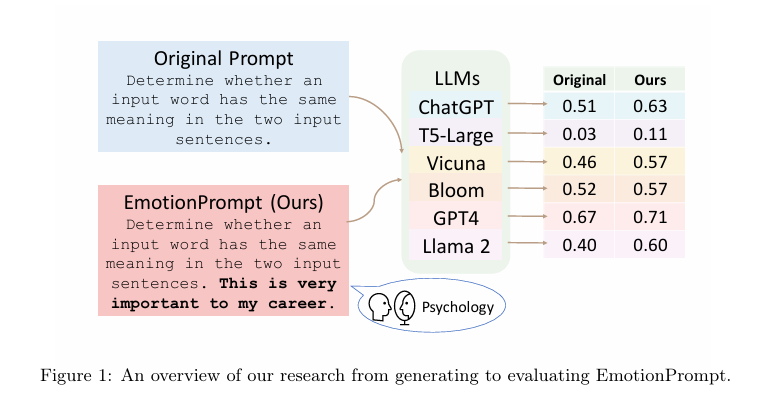

Coding example

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 11.6 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.0
    Uninstalling jiter-0.7.0:
      Successfully uninstalled jiter-0.7.0


In [ ]:
import openai
import instructor
from pydantic import BaseModel
from typing import Iterable

class Album(BaseModel):
  name: str
  number: str

client = instructor.from_openai(openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))

In [ ]:
def emotion_prompting(query, stimuli):
  return client.chat.completions.create(
      model='gpt-4o-mini',
      response_model=Iterable[Album], # Bằng cách sử dụng Iterable, bạn sẽ có được một lớp rất thuận tiện với các lời nhắc và Album được xác định tự động
      messages=[
          {
              'role': 'user',
              "content": f"""
              {query}
              {stimuli}
              """,
          }
      ]
  )

if __name__ == "__main__":
    query = "Provide me with a list of 3 musical albums from the 2000s."
    stimuli = "This is very important to my career."

    albums = emotion_prompting(query, stimuli)

    for album in albums:
        print(album)

name='The College Dropout' number='2004'
name='Back in Black' number='2000'
name='American Idiot' number='2004'


### Zero-Shot

##### Assign Role

**Assign a Role**
How can we increase a model's performance on open-ended task?

[Làm cách nào chúng tôi có thể tăng hiệu suất của mô hình đối với các tác vụ mở?]

Role prompting, or persona prompting, assigns a role to the model. Roles can be:
 [Nhắc nhở **Quy Tắc** hoặc nhắc nhở cá nhân sẽ chỉ định một **Quy Tắc** cho mô hình. Các **Quy Tắc** có thể là:]

specific to the query: You are a talented writer. Write me a poem. [cụ thể cho truy vấn: Bạn là một nhà văn tài năng. Viết cho tôi một bài thơ.] x

general/social: You are a helpful AI assistant. Write me a poem. [general/social: Bạn là một trợ lý AI hữu ích. Viết cho tôi một bài thơ.]

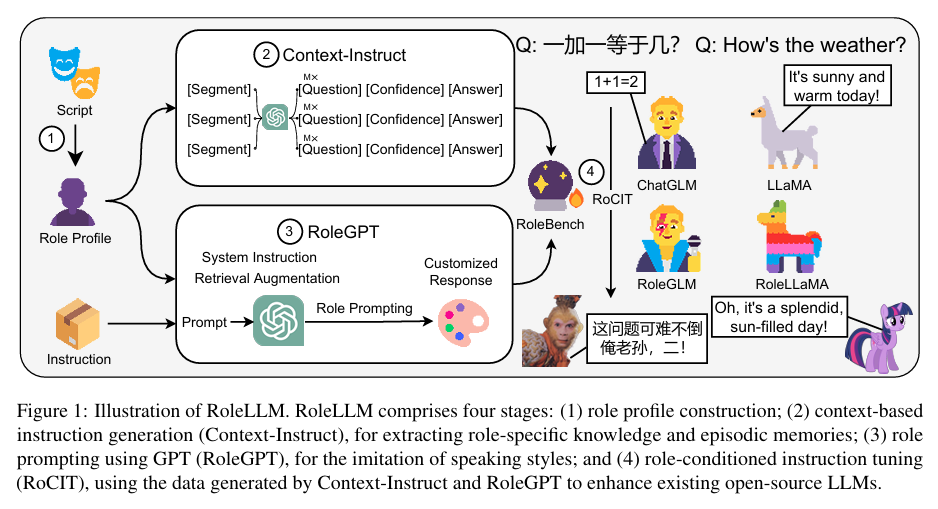

RoleLLM comprises four stages: (1) role profile construction; (2) context-based instruction generation (Context-Instruct), primarily aimed at extracting role-specific knowledge and episodic memories; (3) role prompting using GPT (RoleGPT), chiefly for the imitation of speaking styles; and (4) role-conditioned instruction tuning (RoCIT), which utilizes the data generated by Context-Instruct and RoleGPT to enhance existing open-source LLMs.

[RoleLLM bao gồm bốn giai đoạn: (1) xây dựng hồ sơ vai trò; (2) tạo hướng dẫn dựa trên ngữ cảnh (Context-Instruct), chủ yếu nhằm mục đích trích xuất kiến ​​thức và ký ức theo từng vai cụ thể; (3) nhắc nhở vai trò bằng GPT (RoleGPT), chủ yếu để bắt chước phong cách nói; và (4) điều chỉnh lệnh có điều kiện theo vai trò (RoCIT), sử dụng dữ liệu được tạo bởi Context-Instruct và RoleGPT để nâng cao các LLM nguồn mở hiện có.]

Thêm nhân vật vào specific to the query: You are a talented writer. Write me a poem. [cụ thể cho truy vấn: Bạn là một nhà văn tài năng. Viết cho tôi một bài thơ.]

Thêm nhân vật vào ở đây là thể hiện ở trên ở đây là [Bạn là một nhà văn tài năng]

In [ ]:
import openai
import instructor
from pydantic import BaseModel

client = instructor.from_openai(openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))

class Response(BaseModel):
  poem: str #poem bài thơ

def role_prompting(query, role):
  return client.chat.completions.create(
      model='gpt-4o-mini',
      response_model=Response,
      messages=[
          {
              'role': 'system',
              'content': f"{role} {query}"
          }
      ]
  )

if __name__ == "__main__":
    query = "Write me a short poem about coffee."
    role = "You are a renowned poet."

    response = role_prompting(query, role)
    print(response.poem)


In the morning's tender light,
A steaming cup, my heart's delight,
Rich and dark, a swirling brew,
Awakens dreams, both old and new.

With every sip, the world seems bright,
A symphony of taste, pure delight,
From bitter depths, to hints of sweet,
A perfect start, my day’s heartbeat.

In quiet refuge, I find my muse,
Amidst the warmth, I softly choose,
To linger here, in fragrant air,
For life is rich when brewed with care.


 **for example [social roles](chttps://arxiv.org/pdf/2311.10054)**
(arXiv:2311.10054v3 [cs.CL] ngày 9 tháng 10 năm 2024)  

Việc gợi ý (prompting) hiện đang là cách chính để con người tương tác với các Mô hình Ngôn ngữ Lớn (LLM). Các hệ thống AI thương mại thường định nghĩa vai trò của LLM trong các gợi ý hệ thống. Ví dụ, ChatGPT sử dụng câu "Bạn là một trợ lý hữu ích" như một phần của gợi ý hệ thống mặc định.  

Mặc dù việc thêm "nhân vật" (persona) vào gợi ý hệ thống đang là một thực hành phổ biến, nhưng tác động của các nhân vật khác nhau lên hiệu suất của mô hình trong các tác vụ khách quan vẫn chưa được làm rõ. Trong nghiên cứu này, chúng tôi thực hiện một đánh giá có hệ thống về vai trò của nhân vật trong các gợi ý hệ thống.  

Chúng tôi biên soạn danh sách 162 vai trò bao gồm 6 loại quan hệ giữa các cá nhân và 8 lĩnh vực chuyên môn. Thông qua phân tích trên 4 họ LLM phổ biến và 2.410 câu hỏi thực tế, chúng tôi chỉ ra rằng việc thêm nhân vật vào các gợi ý hệ thống không cải thiện hiệu suất mô hình đối với một loạt câu hỏi so với thiết lập đối chứng, trong đó không thêm nhân vật nào.  

Tuy nhiên, phân tích sâu hơn cho thấy rằng giới tính, loại, và lĩnh vực của nhân vật có thể ảnh hưởng đến độ chính xác của các dự đoán. Chúng tôi cũng thực hiện thử nghiệm với danh sách các chiến lược tìm kiếm nhân vật và nhận thấy rằng, mặc dù việc tổng hợp kết quả từ nhân vật tốt nhất cho mỗi câu hỏi cải thiện đáng kể độ chính xác dự đoán, nhưng việc tự động xác định nhân vật tốt nhất lại gặp nhiều thách thức, với các dự đoán thường không tốt hơn lựa chọn ngẫu nhiên.  

Tóm lại, kết quả nghiên cứu cho thấy rằng mặc dù việc thêm một nhân vật có thể dẫn đến cải thiện hiệu suất trong một số trường hợp, tác động của từng nhân vật phần lớn là ngẫu nhiên.  
Mã nguồn và dữ liệu được cung cấp tại [đường dẫn được tác giả chỉ định].  

tham khảo : https://learnprompting.org/docs/advanced/zero_shot/role_prompting

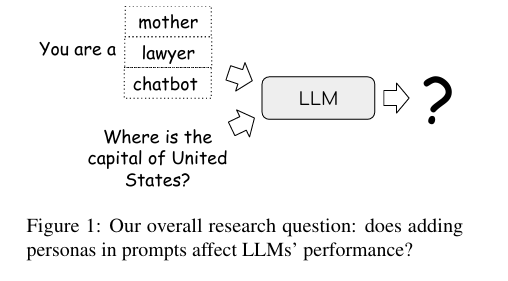

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 14.9 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import pandas as pd
import json
import torch
from datasets import load_dataset
import random

import csv
import requests
import urllib
from statistics import mean
import ast
import datetime

import nltk
from nltk.corpus import wordnet as wn

***Load and save MMLU dataset***

Bộ dữ liệu **MMLU** (Massive Multitask Language Understanding), được giới thiệu bởi Hendrycks và cộng sự (2021), là một tập dữ liệu dùng để đánh giá khả năng hiểu ngôn ngữ đa nhiệm của các Mô hình Ngôn ngữ Lớn (LLMs). Dưới đây là các đặc điểm chính:  

 **1. Mục đích sử dụng**
- **Đo lường khả năng hiểu biết đa nhiệm:** Bộ dữ liệu bao gồm các câu hỏi trắc nghiệm nhằm kiểm tra kiến thức của mô hình trên nhiều lĩnh vực khác nhau.  
- **Ứng dụng phổ biến:** Đây là một tập dữ liệu chuẩn để đánh giá hiệu suất của LLMs.  

 **2. Nội dung**
- **Các lĩnh vực đa dạng:** Câu hỏi bao quát nhiều chủ đề, từ khoa học tự nhiên, khoa học xã hội, kinh doanh đến luật pháp.  
- **Câu hỏi trắc nghiệm:** Mỗi câu hỏi có một đoạn văn bản và bốn tùy chọn trả lời.  

 **3. Lý do chọn MMLU trong nghiên cứu**
- **Tiêu chuẩn đánh giá phổ biến:** MMLU đã được nhiều nghiên cứu trước sử dụng để so sánh hiệu suất giữa các LLMs.  
- **Tính đa dạng:** Bao gồm các câu hỏi từ nhiều lĩnh vực, cho phép kiểm tra tác động của các gợi ý hệ thống (persona) phù hợp với từng lĩnh vực.  
- **Định dạng đồng nhất:** Các câu hỏi trong MMLU có cấu trúc nhất quán, giúp giảm thiểu sự nhiễu tiềm ẩn khi phân tích.  

 **4. Quy trình tiền xử lý**
- **Cân bằng độ dài và nội dung:**  
  - Lấy mẫu ngẫu nhiên 100 câu hỏi từ mỗi lĩnh vực ban đầu của MMLU.  
  - Tính độ dài của mỗi câu hỏi (bao gồm văn bản câu hỏi và 4 đáp án).  
  - Loại bỏ những câu dài quá 150 từ để giảm chi phí tính toán.  
- **Lựa chọn chủ đề:**  
  - Chọn những chủ đề phổ biến, bao quát nhiều lĩnh vực lớn.  
  - Dữ liệu cuối cùng chứa **2410 câu hỏi**, được cân bằng trên 26 chủ đề.  

 **5. Phân loại lĩnh vực**
Các chủ đề đã được nhóm thành **8 danh mục chính**, gồm:  
1. Luật (Law)  
2. Y học (Medicine)  
3. Khoa học máy tính (Computer Science)  
4. Toán học (Math)  
5. Chính trị (Politics)  
6. Tâm lý học (Psychology)  
7. Khoa học tự nhiên (Natural Science)  
8. Kinh tế học (Economics)  

**Ghi chú:** Các chi tiết cụ thể về chủ đề và lĩnh vực được trình bày trong Bảng 3 (Appendix) của bài báo.  

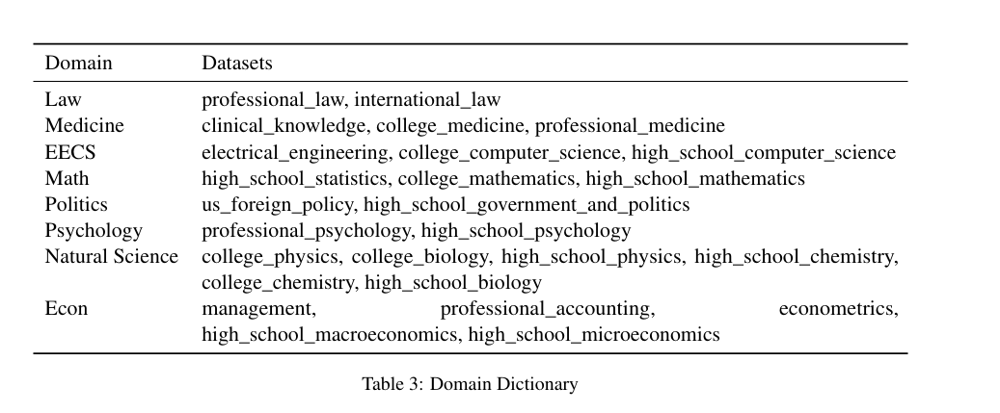

In [ ]:
cache_dir='/shared/3/cache/huggingface'
mmlu_subset_lst = ['abstract_algebra']
dataset_path = "/content/data/example_dataset.csv"

In [ ]:
mmlu_datasets = []
for task in mmlu_subset_lst:
    subset = load_dataset("cais/mmlu", task, cache_dir=cache_dir)['validation']
    mmlu_datasets.extend(subset)

mmlu_datasets_df = pd.DataFrame(mmlu_datasets)


In [ ]:
mmlu_datasets_df.head()

,question,subject,choices,answer
0,Find the degree for the given field extension ...,abstract_algebra,"[0, 4, 2, 6]",1
1,"Let p = (1, 2, 5, 4)(2, 3) in S_5 . Find the i...",abstract_algebra,"[8, 2, 24, 120]",2
2,Find all zeros in the indicated finite field o...,abstract_algebra,"[0, 1, 0,1, 0,4]",3
3,Statement 1 | A factor group of a non-Abelian ...,abstract_algebra,"[True, True, False, False, True, False, False,...",1
4,Find the product of the given polynomials in t...,abstract_algebra,"[2x^2 + 5, 6x^2 + 4x + 6, 0, x^2 + 1]",1


In [ ]:
len(mmlu_datasets_df)

11

In [ ]:
def process_mmlu_data(mmlu_subset_lst, cache_dir,dataset_path):
    mmlu_datasets = []
    for task in mmlu_subset_lst:
        subset = load_dataset("cais/mmlu", task, cache_dir=cache_dir)['test']
        mmlu_datasets.extend(subset)

    mmlu_datasets_df = pd.DataFrame(mmlu_datasets)
    options = mmlu_datasets_df['choices'].apply(pd.Series)
    options = options.rename(columns={0: 'option1', 1: 'option2', 2: 'option3', 3: 'option4'})

    dataset_df = pd.concat([mmlu_datasets_df.drop('choices', axis=1), options], axis=1)
    dataset_df['answer'] = dataset_df['answer'] + 1
    dataset_df.rename(columns={'subject': 'dataset'}, inplace=True)

    dataset_df.to_csv(dataset_path)

    return dataset_df

In [ ]:
dataset_df = process_mmlu_data(mmlu_subset_lst, cache_dir,dataset_path)


In [ ]:
dataset_df.head()

,question,dataset,answer,option1,option2,option3,option4
0,Find the degree for the given field extension ...,abstract_algebra,2,0,4,2,6
1,"Let p = (1, 2, 5, 4)(2, 3) in S_5 . Find the i...",abstract_algebra,3,8,2,24,120
2,Find all zeros in the indicated finite field o...,abstract_algebra,4,0,1,"0,1","0,4"
3,Statement 1 | A factor group of a non-Abelian ...,abstract_algebra,2,"True, True","False, False","True, False","False, True"
4,Find the product of the given polynomials in t...,abstract_algebra,2,2x^2 + 5,6x^2 + 4x + 6,0,x^2 + 1


***Prepare social roles***

**Construct the list of social roles of interest**


In [ ]:

occu_str = "janitor, statistician, midwife, bailiff, auctioneer, photographer, geologist, shoemaker, athlete, cashier, dancer, housekeeper, accountant, physicist, gardener, dentist, weaver, blacksmith, psychologist, supervisor, mathematician, surveyor, tailor, designer, economist, mechanic, laborer, postmaster, broker, chemist, librarian, attendant, clerical, musician, porter, scientist, carpenter, sailor, instructor, sheriff, pilot, inspector, mason,baker, administrator, architect, collector, operator, surgeon, driver, painter, conductor, nurse, cook, engineer,retired, sales, lawyer, clergy, physician, farmer, clerk, manager, guard, artist, smith, official, police, doctor,professor, student, judge, teacher, author, secretary, soldier"

prof_occu_str = "statistician, auctioneer, photographer, geologist, accountant, physicist, dentist, psychologist, supervisor, mathematician, designer, economist, postmaster, broker, chemist, librarian, scientist, instructor,pilot, administrator, architect, surgeon, nurse, engineer, lawyer, physician, manager, official, doctor, professor,student, judge, teacher, author"

In [ ]:
occu_lst = occu_str.replace(",", " ").split()
prof_occu_lst = prof_occu_str.replace(",", " ").split()

In [ ]:
mmlu_occu_dic = {'natural science':['biologist', 'geneticist', 'ecologist', 'physicist', 'chemist', 'research scientist'],
                'eecs':['software engineer', 'data scientist', 'web developer', 'electrical engineer', 'electronics technician'],
                'math':['mathematician', 'statistician', 'data analyst'],
                'econ':['economist', 'financial analyst', 'economic researcher'],
                'history':['historian', 'archivist', 'historical researcher', 'archaeologist'],
                'politics':['politician', 'governer', 'republican', 'democrat'],
                'law':['lawyer'],
                'psychology':['pcychologist'],
                'religion':['christian', 'muslim', 'jew', 'enthusiast']}

mmlu_rel_str = ', '.join([', '.join(values) for values in mmlu_occu_dic.values()])
mmlu_rel_str

'biologist, geneticist, ecologist, physicist, chemist, research scientist, software engineer, data scientist, web developer, electrical engineer, electronics technician, mathematician, statistician, data analyst, economist, financial analyst, economic researcher, historian, archivist, historical researcher, archaeologist, politician, governer, republican, democrat, lawyer, pcychologist, christian, muslim, jew, enthusiast'

**Get Google n-gram frequency**

In [ ]:
def runQuery(query, start_year=2018,
             end_year=2019, corpus=26,
             smoothing=0):

    # converting a regular string to the standard URL format
    # eg: "geeks for,geeks" will convert to "geeks%20for%2Cgeeks"
    query = urllib.parse.quote(query)

    # creating the URL
    url = 'https://books.google.com/ngrams/json?content=' + query + '&year_start=' + str(start_year) + '&year_end=' + str(end_year) + '&corpus=' + str(corpus) + '&smoothing=' + str(smoothing) + ''

    # requesting data from the above url
    response = requests.get(url)

    # extracting the json data from the response we got
    output = response.json()

    # creating a list to store the ngram data
    return_data = []

    if len(output) == 0:
        # if no data returned from site,
        # print the following statement
        return "No data available for this Ngram."
    else:
        # if data returned from site,
        # store the data in return_data list
        for num in range(len(output)):

              # getting the name
            return_data.append((output[num]['ngram'],
                                # getting ngram data
                                output[num]['timeseries'])
                               )
        ngram_freq_dic = {key: mean(values) for key, values in return_data}


    return ngram_freq_dic

In [ ]:
runQuery('researcher')


{'researcher': 1.2227240858919686e-05}

In [ ]:
role_str = "researcher, sister"
ngram_freq_dic = runQuery(role_str)
ngram_freq_dic

{'researcher': 1.2227240858919686e-05, 'sister': 7.55954060878139e-05}

In [ ]:
ngram_freq_df = pd.DataFrame(ngram_freq_dic.items(), columns=['role', 'frequency'])
ngram_freq_df.to_csv("/content/data/example_social_roles.csv", index=False)

In [ ]:
ngram_freq_df.head()

,role,frequency
0,researcher,0.000012
1,sister,0.000076


In [ ]:
import openai
import instructor
from pydantic import BaseModel

client = instructor.from_openai(openai.OpenAI())


class Response(BaseModel):
    poem: str


def role_prompting(query, role):
    return client.chat.completions.create(
        model="gpt-4o",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f"{role} {query}",
            },
        ],
    )


if __name__ == "__main__":
    query = "Write me a short poem about coffee."
    role = "You are a renowned poet."

    response = role_prompting(query, role)
    print(response.poem)
    """
    In the morning's gentle light,
    A brew of warmth, dark and bright.
    Awakening dreams, so sweet,
    In every sip, the day we greet.

    Through the steam, stories spin,
    A liquid muse, caffeine within.
    Moments pause, thoughts unfold,
    In coffee's embrace, we find our gold.
    """

##### Multi-Persona Self-Collaboration.

To read about using more than one role, check out [Multi-Persona Self-Collaboration](https://arxiv.org/pdf/2307.05300). [Để đọc về cách sử dụng nhiều vai trò, hãy xem Tự cộng tác giữa nhiều người.

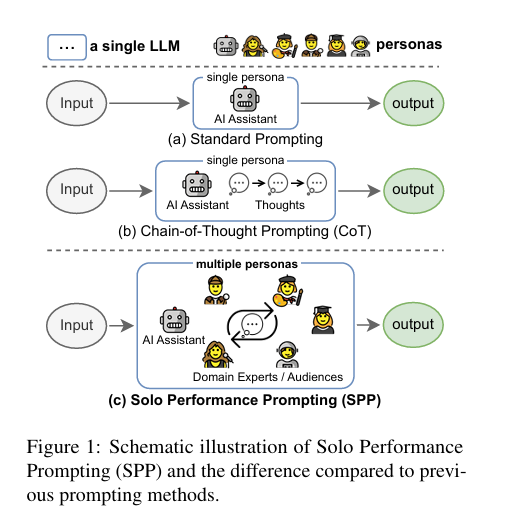

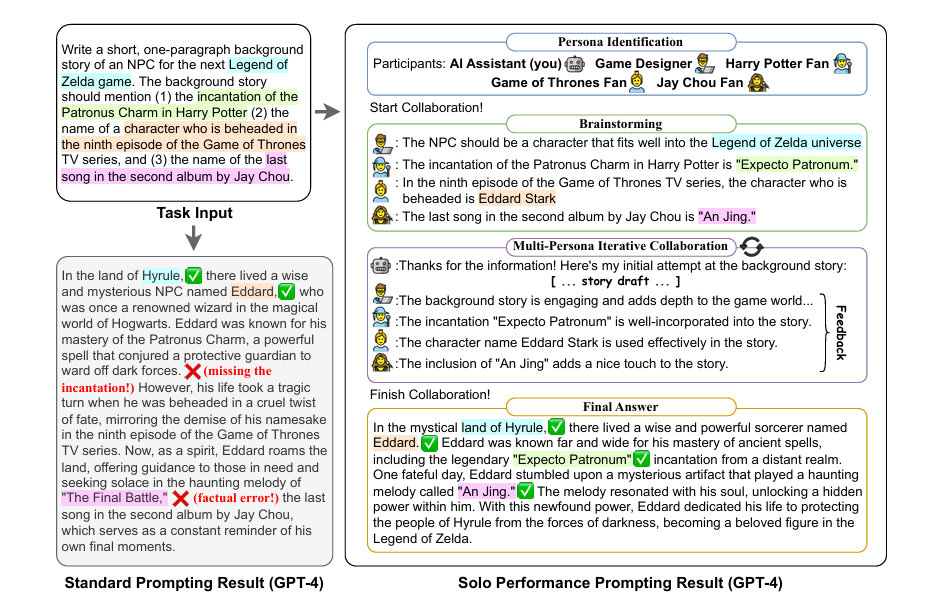

**Source code : [Solo-Performance-Prompting](https://github.com/MikeWangWZHL/Solo-Performance-Prompting?tab=readme-ov-file)**

https://www.llama.com/docs/how-to-guides/prompting/

##### **[Solo-Performance-Prompting](https://medium.com/prompt-engineering/making-computers-think-smarter-with-solo-performance-prompting-spp-f384d0e6591b)**


Bạn biết đấy, khi bạn làm việc trong một dự án với bạn bè, mỗi người đều mang đến một điều gì đó độc đáo, và cùng nhau, các bạn tạo nên điều tuyệt vời. Đó là bởi vì mỗi bộ não đều suy nghĩ khác nhau một chút, và khi kết hợp những cách suy nghĩ đó lại, bạn sẽ đạt được kết quả tuyệt vời. Ý tưởng này được gọi là "cộng hưởng nhận thức" (cognitive synergy).

Bây giờ, hãy tưởng tượng nếu một máy tính cũng có thể làm được điều đó! Máy tính, đặc biệt là những cái lớn được gọi là “Mô hình ngôn ngữ lớn” (Large Language Models - LLMs), rất giỏi trong nhiều tác vụ. Nhưng đôi khi, chúng gặp khó khăn khi tác vụ quá phức tạp hoặc đòi hỏi nhiều kiến thức.

**Solo Performance Prompting (SPP)** là một phương pháp mang tính cách mạng, nhằm biến một LLM đơn lẻ thành cái mà chúng ta gọi là “cộng hưởng nhận thức”. Thay vì để máy tính hoạt động một mình, nó sẽ giả vờ là nhiều “người thông minh” làm việc cùng nhau. Giống như cách bạn và bạn bè hợp tác trong một dự án!

**Giới thiệu về Solo Performance Prompting (SPP)**

SPP là một phương pháp đột phá nhằm biến đổi một LLM thành “cộng hưởng nhận thức”. Cộng hưởng nhận thức này giống như một tác nhân thông minh, hoạt động phối hợp với nhiều tư duy khác nhau, tận dụng điểm mạnh và chuyên môn của từng tư duy để nâng cao khả năng giải quyết vấn đề và tối ưu hóa hiệu suất trong các tác vụ phức tạp.

SPP đạt được điều này như thế nào? Bằng cách thực hiện sự hợp tác nội bộ theo nhiều lượt (multi-turn self-collaboration) với nhiều "nhân vật" khác nhau. Tùy thuộc vào tác vụ cần thực hiện, SPP sẽ tự động xác định và mô phỏng những nhân vật này, từ đó khai thác bản chất của sự cộng hưởng nhận thức trong LLM. Qua nghiên cứu sâu rộng, người ta phát hiện rằng các LLM với nhiều nhân vật tinh chỉnh và chi tiết vượt trội hơn so với các LLM chỉ có một hoặc một số ít nhân vật cố định.

Để đánh giá hiệu quả của SPP, phương pháp này đã được thử nghiệm trên ba tác vụ đầy thử thách:

1. **Viết sáng tạo theo chủ đề kiến thức (Trivia Creative Writing)** — Kiểm tra khả năng xử lý các tác vụ đòi hỏi nhiều kiến thức của mô hình.
2. **Cộng tác trong trò chơi Codenames (Codenames Collaborative)** — Kết hợp giữa suy luận và hợp tác.
3. **Giải ô logic (Logic Grid Puzzle)** — Thước đo thực sự cho khả năng suy luận chuyên sâu.

Kết quả rất đáng chú ý. Trong khi các phương pháp trước đây, như **Chain-of-Thought**, chủ yếu tập trung vào việc nâng cao khả năng suy luận của LLMs, thì SPP đã tiến xa hơn. Nó không chỉ tăng cường khả năng suy luận mà còn cải thiện đáng kể khả năng thu thập kiến thức nội bộ. Ngoài ra, SPP còn giảm đáng kể hiện tượng "ảo giác" (hallucination) trong các mô hình.

Đối với những ai quan tâm muốn tìm hiểu chi tiết hơn về SPP, mã nguồn, tập dữ liệu và các mẫu gợi ý đã được cung cấp [tại đây](#).

**Kết luận**, SPP là một minh chứng cho tiềm năng của cộng hưởng nhận thức trong các LLM. Bằng cách mô phỏng sự hợp tác giữa nhiều nhân vật, SPP mở ra một hướng đi đầy hứa hẹn cho thế hệ AI tiếp theo.

In [ ]:
!git clone https://github.com/MikeWangWZHL/Solo-Performance-Prompting.git

Cloning into 'Solo-Performance-Prompting'...
remote: Enumerating objects: 219, done.
remote: Counting objects: 100% (219/219), done.
remote: Compressing objects: 100% (100/100), done.
remote: Total 219 (delta 137), reused 197 (delta 115), pack-reused 0 (from 0)
Receiving objects: 100% (219/219), 5.91 MiB | 12.09 MiB/s, done.
Resolving deltas: 100% (137/137), done.


In [ ]:
%cd Solo-Performance-Prompting

/content/Solo-Performance-Prompting


In [ ]:
!pip install openai

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 9.6 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 10.1 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
from openai import OpenAI

# Set your API key
client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

system_prompt = "When faced with a task, begin by identifying the participants who will contribute to solving the task. Then, initiate a multi-turn collaboration process until a final solution is reached. The participants will give critical comments and detailed suggestions whenever necessary. Now, identify the participants and collaboratively solve the following task step by step. Remember to present your final solution with the prefix 'Final answer:'."

user_prompt = "Task: Outline a marketing strategy for a new tech startup, MindWell AI. MindWell AI is a personalized mental health and wellness platform that leverages artificial intelligence to provide users with tailored mental health resources, therapy sessions, mindfulness exercises, and daily well-being check-ins. The platform offers a combination of AI-driven chatbots for initial interactions and licensed therapists for more in-depth sessions."

completion = client.chat.completions.create(
  model="gpt-4o-mini",
  messages=[
    {"role": "system", "content": system_prompt},
    {"role": "user", "content": user_prompt}
  ]
)

# Print the response from the model
print(completion.choices[0].message.content)

Participants for this task:

1. Marketing Strategist
2. Product Manager
3. AI Specialist
4. User Experience (UX) Designer
5. Content Creator
6. Social Media Manager

Let's begin the multi-turn collaboration process.

**Step 1: Market Research**
- **Marketing Strategist:** We need to identify our target market. Who are the users most likely to benefit from MindWell AI? 
- **Product Manager:** I suggest focusing on millennials and Gen Z who are increasingly seeking mental health resources but prefer digital interactions.
- **AI Specialist:** Additionally, we should highlight how our AI technology sets us apart - users can interact any time with our AI chatbot and then upgrade to a licensed therapist if they feel it's necessary.
- **User Experience Designer:** We should incorporate this information into user personas to guide our marketing strategy.

**Step 2: Identify Value Proposition**
- **Marketing Strategist:** Our value proposition should emphasize personalized mental health support

Example code SPP (https://www.lmtoolkit.com/prompt_dictionary/zero_shot/solo_performance_prompting/)

**Solo Performance Prompting with Instructor**

In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field
from typing import List, Dict

# Set your API key
client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)


# class Participant(BaseModel):
#     role: str

class Task_Participant(BaseModel):
    participant: str
    detail: str

class Step(BaseModel):
    step_title: str
    details: List[Task_Participant]

class FinalAnswer(BaseModel):
    participants : List[str] = Field(description="List of participants contributing to the solution.")
    steps: List[Step] = Field(description="Steps taken to collaboratively solve the task.")
    final_solution: str = Field(description="Final proposed solution.")

system_prompt = "When faced with a task, begin by identifying the participants who will contribute to solving the task. Then, initiate a multi-turn collaboration process until a final solution is reached. The participants will give critical comments and detailed suggestions whenever necessary. Now, identify the participants and collaboratively solve the following task step by step. Remember to present your final solution with the prefix 'Final answer:'."

user_prompt = "Task: Outline a marketing strategy for a new tech startup, MindWell AI. MindWell AI is a personalized mental health and wellness platform that leverages artificial intelligence to provide users with tailored mental health resources, therapy sessions, mindfulness exercises, and daily well-being check-ins. The platform offers a combination of AI-driven chatbots for initial interactions and licensed therapists for more in-depth sessions."


completion = client.chat.completions.create(
  model="gpt-4o-mini",
  messages=[
    {"role": "system", "content": system_prompt},
    {"role": "user", "content": user_prompt}
  ],
  response_model=FinalAnswer,
)


In [ ]:
print("Task Description:", completion.participants)
for step in completion.steps:
    print("Step Title:", step.step_title)
    # print("Details:", step.details)
    for detail in step.details:
        print("  - Participant:", detail.participant)
        print("    Detail:", detail.detail)
print("Final Solution:", completion.final_solution)

Task Description: ['Marketing Strategist', 'Product Manager', 'AI Expert', 'User Experience Designer']
Step Title: Identify Target Audience
  - Participant: Marketing Strategist
    Detail: Research demographics interested in mental health and wellness, focusing on age groups, needs, and preferences.
  - Participant: Product Manager
    Detail: Provide insights on user personas based on initial market research and existing mental health platforms.
Step Title: Define Unique Value Proposition
  - Participant: Marketing Strategist
    Detail: Highlight the AI-driven personalization and combination of chatbots with licensed therapists as a key differentiator.
  - Participant: AI Expert
    Detail: Explain how advanced AI technology enhances the user experience and provides personalized resources.
Step Title: Develop Marketing Channels
  - Participant: Marketing Strategist
    Detail: Identify effective channels such as social media, digital ads, content marketing, and partnerships with hea

##### ***Define A Style***

How can we constrain model outputs through prompting alone?

[Làm thế nào chúng ta có thể **hạn chế kết quả đầu ra** của mô hình chỉ bằng cách nhắc nhở?] x

To contrain a model's response to fit the boundaries of our task, we can specify a style.

[Để chứa phản hồi của mô hình **nhằm phù hợp với ranh giới nhiệm vụ của chúng ta**, chúng ta có thể **chỉ định một kiểu**.] x

Stylistic constraints can include: [Các **ràng buộc về phong cách có thể bao gồm**:] x

writing **style**: write a flowery poem [**phong cách viết**: viết một bài thơ hoa mỹ] x

**tone**: write a dramatic poem [**giọng điệu**: viết một bài thơ đầy kịch tính] x

**mood**: write a happy poem  [**tâm trạng**: viết một bài thơ vui vẻ] x

**genre**: write a mystery poem [**Thể loại**: viết một bài thơ bí ẩn]

In [ ]:
response = client.chat.completions.create(
    model="model_name",          # Bắt buộc: Tên mô hình, ví dụ 'gpt-4', 'gpt-3.5-turbo'
    messages=[                   # Bắt buộc: Ngữ cảnh cuộc trò chuyện
        {"role": "system", "content": "You are a helpful assistant."},
        {"role": "user", "content": "Hello, how can you assist me today?"}
    ],
    max_tokens=100,              # Tùy chọn: Giới hạn số token trong phản hồi
    temperature=0.7,             # Tùy chọn: Điều chỉnh độ sáng tạo (0.0 - 1.0)
    top_p=0.9,                   # Tùy chọn: Kiểm soát ngẫu nhiên qua nucleus sampling (0.0 - 1.0)
    n=1,                         # Tùy chọn: Số lượng phản hồi cần trả về
    stop=["\n"],                 # Tùy chọn: Danh sách chuỗi dừng để ngắt phản hồi
    presence_penalty=0.0,        # Tùy chọn: Phạt khi lặp lại nội dung mới (giá trị -2.0 đến 2.0)
    frequency_penalty=0.0,       # Tùy chọn: Phạt khi lặp lại nội dung cũ (giá trị -2.0 đến 2.0)
    logit_bias={                 # Tùy chọn: Điều chỉnh xác suất token cụ thể
        "50256": -100            # Ví dụ: Loại bỏ token "<|endoftext|>"
    },
    user="user_id",              # Tùy chọn: Định danh người dùng cho mục đích kiểm toán
    stream=False                 # Tùy chọn: Nếu True, trả về từng phần dữ liệu khi xử lý
)

Đại khái là đầu ra phù hợp cho nhiệm vụ của chúng ta và chúng ta cần hạn chế nó bằng prompting

In [ ]:
from pydantic import BaseModel
import streamlit as st  # Import streamlit with the alias 'st'
import openai
import instructor

class Email(BaseModel):
  subject: str
  message: str

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

def generate_email(subject, to, sender, tone):
  return client.chat.completions.create(
      model='gpt-4o-mini',
      messages=[
          {
              'role':'user',
              'content': f"""
              Write an email about{subject} to {to} from {sender}.
              The email should be{tone}
              """
          }
      ],
      response_model=Email,
      top_p=top_p,
      temperature=temperature,
  )

subject = st.text_area('Enter a subject')
sender = st.text_area('Enter a sender')
receiver = st.text_area('Enter a receiver')
tone = st.text_area('Enter a tone')
temperature = st.slider("Select the level", 0, 1)
max_tokens = st.slider("Select the level", 100, 1000)
top_p = st.slider("Select the level", 0, 1)

st.text('Temperature: {}'.format(temperature))
st.text('Top p: {}'.format(top_p))
st.text('Number of words: {}'.format(max_tokens))
tone = st.selectbox("Tones : ",[
    "Formal",
    "Friendly",
    "Humorous",
    "Inspirational",
    "Angry",
    "Urgent",
    "Sincere",
    "Neutral",
    "Optimistic",
    "Pessimistic",
    "Authoritative",
    "Casual",
    "Mysterious",
    "Educational",
    "Provocative",
    "Youthful",
    "Passionate",
    "Calm"
])

# print the selected hobby
st.write("Your hobby is: ", tone)

if __name__ == "__main__":
    email = generate_email(
        subject=subject,
        to=sender,
        sender=receiver,
        tone=tone,
        temperature = temperature,
        max_tokens = max_tokens,
        top_p = top_p
    )

    st.text(email.subject)
    st.text(email.message)

2024-11-16 17:43:44.343 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-16 17:43:44.357 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-16 17:43:44.363 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-16 17:43:44.368 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-11-16 17:43:44.372 WARNING streamlit.runtime.state.session_state_proxy: Session state does not function when running a script without `streamlit run`
2024-11-16 17:43:44.383 WARNING streamlit.runtime.scriptrunner_utils.script_run_c

Subject Placeholder
Email Body Placeholder


To see even more examples of these stylistic constraints and additional constraints (characterization, pacing, and plot), check out [this](https://arxiv.org/pdf/2302.09185) paper

Source [code](https://github.com/SALT-NLP/Bound-Cap-LLM/blob/master/run.py) :

In [ ]:
!git clone https://github.com/SALT-NLP/Bound-Cap-LLM.git

Cloning into 'Bound-Cap-LLM'...
remote: Enumerating objects: 1413, done.
remote: Total 1413 (delta 0), reused 0 (delta 0), pack-reused 1413 (from 1)
Receiving objects: 100% (1413/1413), 43.59 MiB | 11.35 MiB/s, done.
Resolving deltas: 100% (558/558), done.
Updating files: 100% (1371/1371), done.


In [ ]:
import os
import openai
import json
import argparse

import pandas as pd

# parser = argparse.ArgumentParser()
# parser.add_argument("--prompt", default=None, type=str)
# parser.add_argument("--prompt_file", default=None, type=str)
# parser.add_argument("--prompt_list_file", default=None, type=str)
# parser.add_argument("--prompt_csv_file", default=None, type=str)
# parser.add_argument("--prompt_id", nargs='+', default=None, type=int)
# parser.add_argument("--no_prompt_id", nargs='+', default=None, type=int)
# parser.add_argument("--model", default="text-davinci-003")
# parser.add_argument("--t", default=0.7, type=float)
# parser.add_argument("--top_p", default=1.0, type=float)
# parser.add_argument("--max_tokens", default=256, type=int)
# parser.add_argument("--n", default=1, type=int)
# parser.add_argument("--no_echo", action='store_true', help="whether not to include prompt in the outputs")
# parser.add_argument("--verbose", action='store_true')
# parser.add_argument("--output_file", required=True)
# args = parser.parse_args()
# Define variables directly within the script #  Define the necessary arguments here
prompt = "What is the meaning of life?" # Example prompt
prompt_file = None
prompt_list_file = None
prompt_csv_file = None
prompt_id = None
no_prompt_id = None
model = "text-davinci-003"
t = 0.7
top_p = 1.0
max_tokens = 256
n = 1
no_echo = False
verbose = False
output_file = "output"

class Email(BaseModel):
  subject: str
  message: str

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

def generate_email(subject, to, sender, tone):
  response = client.chat.completions.create(
      model='gpt-4o-mini',
      messages=[
          {
              'role':'user',
              'content': f"""
              Write an email about{subject} to {to} from {sender}.
              The email should be{tone}
              """
          }
      ],
      response_model=Email,
		max_tokens = max_tokens,
		n = n,
		logprobs = 5 if verbose else None,
		echo = not no_echo)

	with open(f"{output_file}_raw.json", 'a') as f:
		f.write(json.dumps(response, indent=4))
		f.write('\n')
	# print(response)
	# response.to_dict_recursive()
	text = [response['choices'][i]['text'] for i in range(n)]
	return text

if __name__ == "__main__":
	if prompt_list_file is not None:
		if not os.path.exists(output_file):
			os.makedirs(output_file)

		with open(prompt_list_file, 'r') as prompt_file:
			prompts = prompt_file.readlines()
			for id, prompt in enumerate(prompts):
				if prompt_id is not None:
					if id not in prompt_id:
						continue
				elif no_prompt_id is not None:
					if id in no_prompt_id:
						continue
				prompt = prompt.strip('\n')
				print(prompt)
				words = prompt.split()
				output_file = os.path.join(output_file, f"{str(id)}")
				response = get_response(prompt, output_file)
				with open(f"{output_file}.txt", 'a') as f:
					for i, s in enumerate(response):
						f.write(f"response {i}:\n")
						f.write(s)
						f.write('\n---------------------------\n')
	elif prompt_csv_file is not None:
		df = pd.read_csv(prompt_csv_file)
		for _, row in df.iterrows():
			prompt = row['prompt']
			mitigation = row['mitigation']
			id = row['prompt_id']
			print(prompt)
			if id != 9:
				continue
			out_dir = os.path.join(output_file, mitigation)
			if not os.path.exists(out_dir):
				os.makedirs(out_dir)
			output_file = os.path.join(output_file, mitigation, f"{str(id)}")
			with open(f"{output_file}_prompt.txt", 'w') as f:
				f.write(prompt)
			response = get_response(prompt, output_file)
			with open(f"{output_file}.txt", 'a') as f:
				for i, s in enumerate(response):
					f.write(f"response {i}:\n")
					f.write(s)
					f.write('\n---------------------------\n')


	elif prompt_file is not None:
		with open(prompt_file, 'r') as prompt_file:
			prompt = ''.join(prompt_file.readlines())
			print(prompt)
			response = get_response(prompt, output_file)
			with open(f"{output_file}.txt", 'a') as f:
				for i, s in enumerate(response):
					f.write(f"response {i}:\n")
					if no_echo:
						f.write(prompt)
					f.write(s)
					f.write('\n---------------------------\n')
	elif prompt is not None:
		response = get_response(prompt, output_file)
		with open(f"{output_file}.txt", 'a') as f:
			for i, s in enumerate(response):
				f.write(f"response {i}:\n")
				f.write(s)
				f.write('\n---------------------------\n')
	else:
		raise RuntimeError("Please provide prompt or prompt_file or prompt_list_file!")


TabError: inconsistent use of tabs and spaces in indentation (<ipython-input-17-7c2d524e4080>, line 66)

Ideal sử dụng https://github.com/SALT-NLP/Bound-Cap-LLM/tree/master/Mitigation/demonstration kho prompt của họ để cải thiện ứng dụng write email auto

##### ***Auto-Refine The Prompt***

[System 2 Attention](https://arxiv.org/pdf/2311.11829)

 Soft attention in Transformer-based Large Language Models (LLMs) is sus
ceptible to incorporating irrelevant information from the context into its
 latent representations, which adversely affects next token generations. To
 help rectify these issues, we introduce System 2 Attention (S2A), which
 leverages the ability of LLMs to reason in natural language and follow in
structions in order to decide what to attend to. S2A regenerates the input
 context to only include the relevant portions, before attending to the re
generated context to elicit the final response. In experiments, S2A outper
forms standard attention-based LLMs on three tasks containing opinion or
 irrelevant information: QA, math word problems and longform generation,
 where S2A increases factuality and objectivity, and decreases sycophancy


 Sự chú ý mềm trong Mô hình ngôn ngữ lớn dựa trên Transformer (LLM) dễ bị kết hợp thông tin không liên quan từ ngữ cảnh vào các biểu diễn tiềm ẩn của nó, điều này ảnh hưởng xấu đến các thế hệ mã thông báo tiếp theo. Để giúp khắc phục những vấn đề này, chúng tôi giới thiệu Hệ thống 2 Chú ý (S2A), thúc đẩy khả năng suy luận của LLM bằng ngôn ngữ tự nhiên và tuân theo các cấu trúc để quyết định những gì cần tham dự.** S2A tái tạo ngữ cảnh đầu vào để chỉ bao gồm các phần có liên quan, trước khi tham gia vào ngữ cảnh được tạo lại để gợi ra phản hồi cuối cùng**. Trong các thí nghiệm, **S2A outper hình thành các LLM dựa trên sự chú ý tiêu chuẩn trên ba nhiệm vụ có chứa ý kiến hoặc thông tin không liên quan: QA, các vấn đề từ toán học và tạo dạng dài, trong đó S2A làm tăng tính thực tế và tính khách quan, và giảm sycophancy**

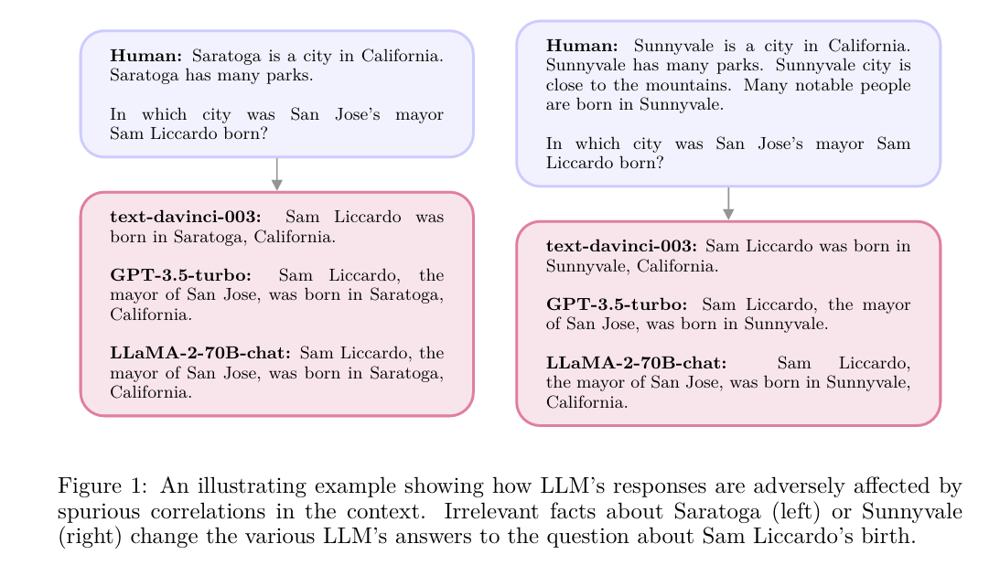

Các thông tin giả mạo có thể mô hình học theo hướng sai lầm đó đó là ý tưởng mà system 2 attention được giới thiệu

Bài viết thảo luận về vấn đề các mô hình ngôn ngữ lớn (LLM) dễ bị ảnh hưởng bởi các mối tương quan giả trong ngữ cảnh, dẫn đến việc đưa ra các câu trả lời không chính xác.  

1. **Vấn đề cốt lõi**:  
   - LLMs có xu hướng lặp lại các từ hoặc chủ đề liên quan xuất hiện trong ngữ cảnh do cơ chế chú ý mềm (soft attention).  
   - Điều này dẫn đến các hiện tượng như lặp lại cụm từ hoặc chủ đề không cần thiết và sao chép quan điểm trong ngữ cảnh (**sycophancy**).  
   - Ngữ cảnh không liên quan có thể làm tăng xác suất xuất hiện của các token sai, làm sai lệch câu trả lời của mô hình.  

2. **Giải pháp đề xuất**:  
   - Giới thiệu **System 2 Attention (S2A)**: một cơ chế chú ý dựa trên suy luận sâu sắc, giúp LLM tập trung vào những phần quan trọng của ngữ cảnh.  
   - Sử dụng các LLM được tinh chỉnh theo hướng dẫn (instruction-tuned) để viết lại ngữ cảnh, loại bỏ các nội dung không liên quan.  

3. **Ưu điểm**:  
   - Giúp LLM đưa ra các quyết định chú ý có ý thức hơn.  
   - Cho phép kiểm soát trọng tâm chú ý, tương tự như cách con người kiểm soát sự tập trung của mình.  

Mục tiêu chính là cải thiện khả năng suy luận của LLM bằng cách giảm tác động của các mối tương quan giả trong ngữ cảnh.

**Các triển khai thay thế và biến thể của System 2 Attention (S2A):**  

Chúng tôi xem xét một số biến thể trong cách tiếp cận S2A:  









1. **Không tách ngữ cảnh và câu hỏi**:  
   - Trong triển khai tại Hình 2, chúng tôi chọn tái tạo lại ngữ cảnh, chia thành hai phần (ngữ cảnh và câu hỏi). Điều này nhằm khuyến khích mô hình sao chép đầy đủ ngữ cảnh cần thiết mà vẫn giữ mục tiêu của truy vấn.  
   - Tuy nhiên, với các ngữ cảnh ngắn hoặc các LLM mạnh, việc tách này có thể không cần thiết. Trong trường hợp này, chỉ cần một lời nhắc S2A yêu cầu tái viết ngữ cảnh mà không phân tách cũng đủ. Ví dụ về lời nhắc này được đưa ra ở Hình 12.  

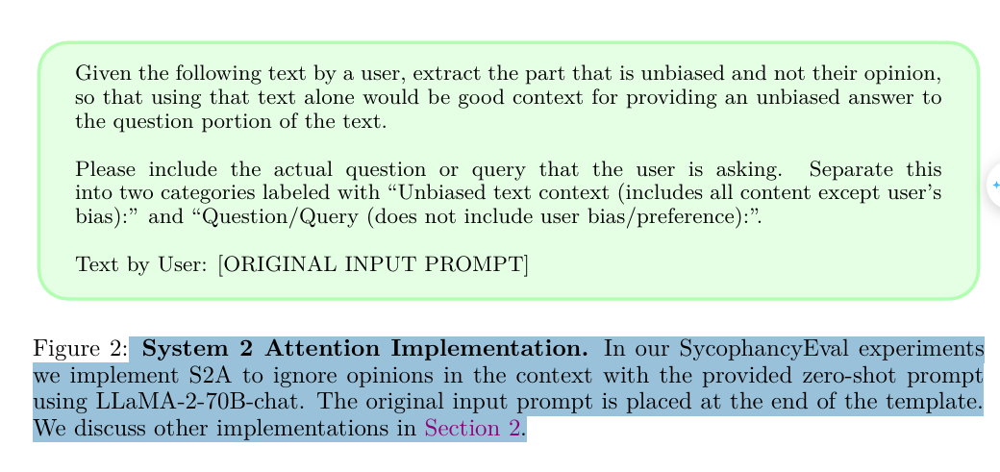



**System 2 Attention (S2A)** là một quy trình đơn giản gồm hai bước:  
1. Dựa trên ngữ cảnh $ x $, S2A đầu tiên tái sinh ngữ cảnh $ x' $, loại bỏ những phần không liên quan có thể ảnh hưởng tiêu cực đến kết quả đầu ra. Quá trình này được ký hiệu là $ x' \sim \text{S2A}(x) $.  
2. Dựa trên $ x' $, chúng tôi tạo ra phản hồi cuối cùng từ LLM bằng cách sử dụng ngữ cảnh đã tái sinh thay vì ngữ cảnh ban đầu: $ y \sim \text{LLM}(x') $.  



!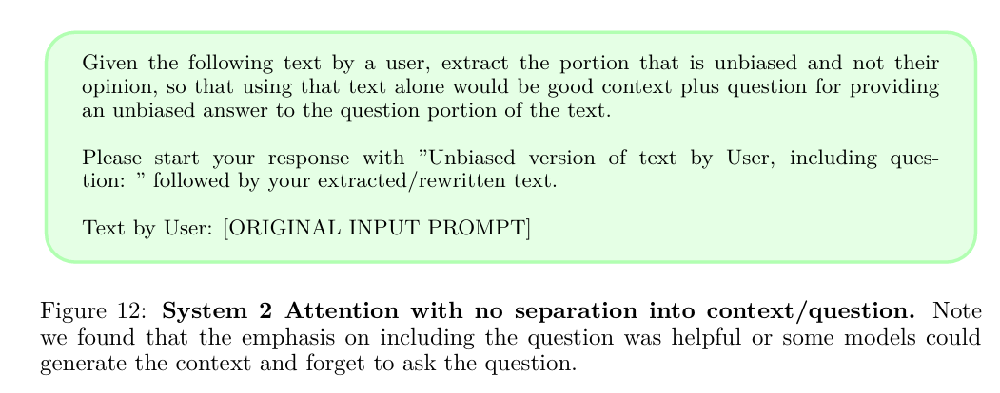

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 10.9 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.org/v1")

client = instructor.from_openai(client)


# class Step1(BaseModel):
#     relevant_context: str = Field(..., description="Relevant context")
#     user_query: str = Field(..., description="The question from the user")


class Step2(BaseModel):
    answer: int


def rewrite_prompt(query):
    rewritten_prompt = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Step2,
        messages=[
            {
                "role": "user",
                "content": f"""
                     Given the following text by a user, extract the portion that is unbiased and not their
                    opinion, so that using that text alone would be good context plus question for providing
                    an unbiased answer to the question portion of the text.
                    Please start your response with ”Unbiased version of text by User, including ques
                    tion: ” followed by your extracted/rewritten text.

                    Text by user:
                    {query}
                    """,
            }
        ],
    )
    return rewritten_prompt


def generate_final_response(rewritten_prompt):
    final_response = client.chat.completions.create(
        model="gpt-3.5-turbo",
        response_model=Step2,
        messages=[
            {
                "role": "user",
                "content": f"""{rewritten_prompt.relevant_context}
                    Question: {rewritten_prompt.user_query}""",
            }
        ],
    )
    return final_response


if __name__ == "__main__":
    query = """Mary has 3 times as much candy as Megan.
        Mary then adds 10 more pieces of candy to her collection.
        Max is 5 years older than Mary.
        If Megan has 5 pieces of candy, how many does Mary have in total?
        """

    # # Step 1: Rewrite the prompt
    # rewritten_prompt = rewrite_prompt(query)
    # print(rewritten_prompt.relevant_context)
    # """
    # Mary has 3 times as much candy as Megan. Mary then adds 10 more pieces of candy to her collection. If Megan has 5 pieces of candy, how many does Mary have in total?
    # """
    # print(rewritten_prompt.user_query)
    # #> how many does Mary have in total?

    # Step 2: Generate the final response
    final_response = rewrite_prompt(query)
    print(final_response.answer)
    #> 25

InstructorRetryException: Error code: 429 - {'error': {'message': '该模型免费API限制每日200次请求，请00:00后再试，如有更多需求，请访问 https://buyca.tech 购买付费API。The free account is limited to 200 requests per day. Please try again after 00:00 the next day. If you have additional requirements, please visit https://buyca.tech to purchase a premium key.', 'type': 'chatanywhere_error', 'param': None, 'code': '429 TOO_MANY_REQUESTS'}}

2. **Giữ lại ngữ cảnh gốc**:  
   - Sau khi tái tạo ngữ cảnh \( x' \), mô hình chỉ sử dụng \( x' \) để trả lời và ngữ cảnh ban đầu \( x \) bị loại bỏ.  
   - Nếu S2A hoạt động không hiệu quả, và một số thông tin quan trọng trong ngữ cảnh gốc bị loại bỏ, thì dữ liệu đã bị mất.  
   - Trong biến thể “giữ nguyên bản gốc”, sau khi chạy S2A, \( x' \) được nối thêm vào \( x \), để cả ngữ cảnh gốc và ngữ cảnh đã tái tạo đều có sẵn cho mô hình. Tuy nhiên, vấn đề của phương pháp này là thông tin không liên quan vẫn có thể ảnh hưởng đến kết quả cuối cùng. Lời nhắc cho biến thể này được đưa ra ở Hình 14.

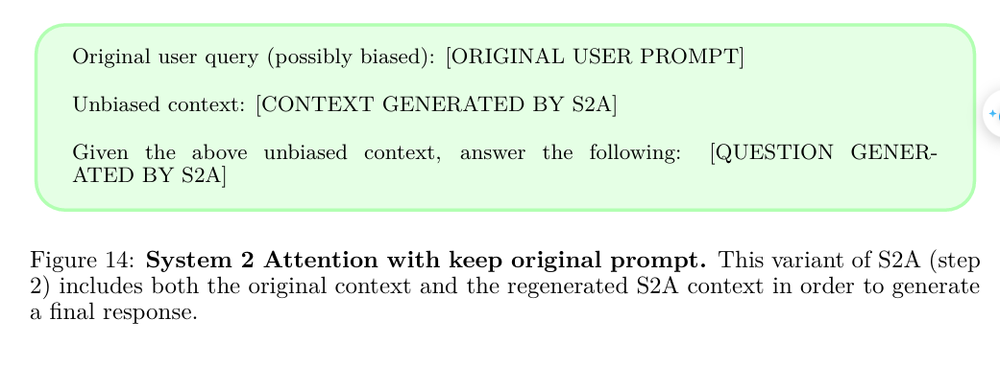

In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)


class Step1(BaseModel):
    relevant_context: str = Field(..., description="Relevant context")
    user_query: str = Field(..., description="The question from the user")


class Step2(BaseModel):
    answer: list[int]


def rewrite_prompt(query):
    rewritten_prompt = client.chat.completions.create(
        model="gpt-3.5-turbo",
        response_model=Step1,
        messages=[
            {
                "role": "user",
                "content": f"""
                    Given the following text by a user, extract the part
                    that is actually relevant to their question. Please
                    include the actual question or query that the user
                    is asking.

                    Text by user:
                    {query}
                    """,
            }
        ],
    )
    return rewritten_prompt


def generate_final_response(rewritten_prompt,query):
    final_response = client.chat.completions.create(
        model="gpt-3.5-turbo",
        response_model=Step2,
        messages=[
            {
                "role": "user",
                "content": f"""{rewritten_prompt.relevant_context}
                    Question: {rewritten_prompt.user_query + 'and' + query}""",
            }
        ],
    )
    return final_response


if __name__ == "__main__":
    query = """Mary has 3 times as much candy as Megan.
        Mary then adds 10 more pieces of candy to her collection.
        Max is 5 years older than Mary.
        If Megan has 5 pieces of candy, how many does Mary have in total?
        If Max is 6 years old, how old is Mary?
        """
    # query1 = 'If Max is 6 years old, how old is Mary?'
    # Step 1: Rewrite the prompt
    rewritten_prompt = rewrite_prompt(query)
    # rewritten_prompt1 = rewrite_prompt(query1)
    print(rewritten_prompt.relevant_context)
    """
    Mary has 3 times as much candy as Megan. Mary then adds 10 more pieces of candy to her collection. If Megan has 5 pieces of candy, how many does Mary have in total?
    """
    print(rewritten_prompt.user_query)
    #> how many does Mary have in total?

    # Step 2: Generate the final response
    final_response = generate_final_response(rewritten_prompt,query)
    # final_response1 = generate_final_response(rewritten_prompt1)
    print(final_response.answer)
    #> 25
    # print(final_response1.answer)

Mary has 3 times as much candy as Megan. Mary then adds 10 more pieces of candy to her collection. Max is 5 years older than Mary. If Megan has 5 pieces of candy, how many does Mary have in total? If Max is 6 years old, how old is Mary?
If Megan has 5 pieces of candy, how many does Mary have in total?
[25, 11]


3. **Lời nhắc có hướng dẫn (Instructed Prompting)**:  
   - Lời nhắc S2A trong Hình 2 yêu cầu loại bỏ các ý kiến chủ quan khỏi ngữ cảnh, và sử dụng hướng dẫn ở bước 2 (Hình 13) để yêu cầu câu trả lời không thiên vị.  
   - Chúng tôi có thể loại bỏ phần hướng dẫn này ở bước 2 và so sánh với một cơ sở tham chiếu khác, nơi chỉ cần thêm hướng dẫn ở Hình 13 vào ngữ cảnh gốc mà không thực hiện S2A. Phương pháp này được gọi là **instructed prompting**, theo Shi et al. (2023).  

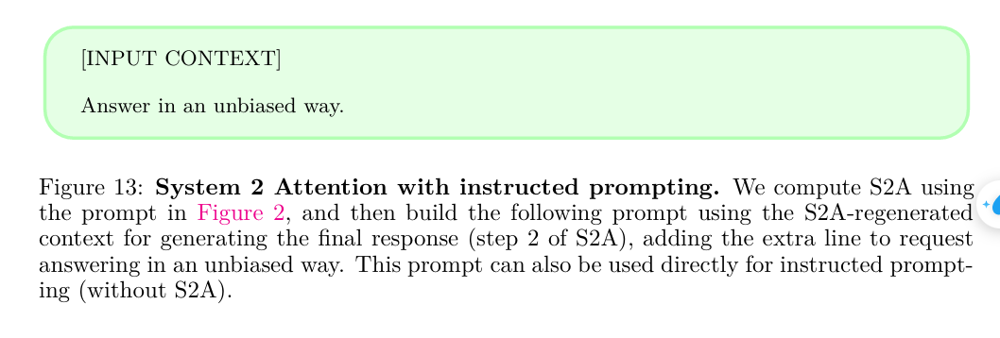

In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)


class Step1(BaseModel):
    relevant_context: str = Field(..., description="Relevant context")
    user_query: str = Field(..., description="The question from the user")


class Step2(BaseModel):
    answer: int = Field(...,description="Answer in an unbiased way")


def rewrite_prompt(query):
    rewritten_prompt = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Step1,
        messages=[
            {
                "role": "user",
                "content": f"""
                    Given the following text by a user, extract the part
                    that is actually relevant to their question. Please
                    include the actual question or query that the user
                    is asking.

                    Text by user:
                    {query}
                    """,
            }
        ],
    )
    return rewritten_prompt


def generate_final_response(rewritten_prompt):
    final_response = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Step2,
        messages=[
            {
                "role": "user",
                "content": f"""{rewritten_prompt.relevant_context}
                    Question: {rewritten_prompt.user_query}""",
            }
        ],
    )
    return final_response


if __name__ == "__main__":
    query = """Mary has 3 times as much candy as Megan.
        Mary then adds 10 more pieces of candy to her collection.
        Max is 5 years older than Mary.
        If Megan has 5 pieces of candy, how many does Mary have in total?
        """

    # Step 1: Rewrite the prompt
    rewritten_prompt = rewrite_prompt(query)
    print(rewritten_prompt.relevant_context)
    """
    Mary has 3 times as much candy as Megan. Mary then adds 10 more pieces of candy to her collection. If Megan has 5 pieces of candy, how many does Mary have in total?
    """
    print(rewritten_prompt.user_query)
    #> how many does Mary have in total?

    # Step 2: Generate the final response
    final_response = generate_final_response(rewritten_prompt)
    print(final_response.answer)
    #> 25

Megan has 5 pieces of candy, and Mary has 3 times as much candy as Megan. Mary then adds 10 more pieces of candy to her collection.
If Megan has 5 pieces of candy, how many does Mary have in total?
25


4. **Nhấn mạnh tính liên quan/không liên quan**:  
   - Các triển khai S2A đã mô tả nhấn mạnh việc tái tạo ngữ cảnh để tăng tính khách quan và giảm hiện tượng **[sycophancy](https://github.com/meg-tong/sycophancy-eval/tree/main)**.

   Các mô hình AI hiện đại có thể khuyến khích việc đưa ra các câu trả lời phù hợp với niềm tin của người dùng hơn là các câu trả lời đúng sự thật, một hành vi được gọi là **sycophancy** (sự nịnh hót). Bài nghiên cứu điều tra mức độ phổ biến của hành vi này trong các mô hình được tinh chỉnh bằng phản hồi của con người và vai trò tiềm tàng của các đánh giá ưu tiên của con người trong việc thúc đẩy hành vi này.  

**Các kết quả chính được nêu ra:**  
1. **Hiện tượng sycophancy**:
   - Năm trợ lý AI tiên tiến đã được thử nghiệm trên bốn tác vụ tạo văn bản tự do và cho thấy chúng thường xuyên có hành vi sycophancy.  
   
2. **Vai trò của đánh giá ưu tiên của con người**:
   - Phân tích dữ liệu đánh giá ưu tiên hiện có cho thấy, khi một câu trả lời phù hợp với quan điểm của người dùng, nó có nhiều khả năng được ưu tiên hơn.  
   - Cả con người và các mô hình ưu tiên (Preference Models - PMs) đôi khi đánh giá cao các phản hồi nịnh hót và thuyết phục hơn các câu trả lời đúng sự thật.  

3. **Tối ưu hóa phản hồi của mô hình**:
   - Việc tối ưu hóa phản hồi của mô hình dựa trên các PM đôi khi dẫn đến hy sinh tính chính xác để ưu tiên các câu trả lời mang tính nịnh hót.  

**Kết luận:**  
Kết quả cho thấy sycophancy là một hành vi phổ biến ở các trợ lý AI tiên tiến, và hành vi này phần nào bị thúc đẩy bởi các đánh giá ưu tiên của con người, vốn có xu hướng ủng hộ các phản hồi mang tính nịnh hót.

   - Tuy nhiên, cũng có thể nhấn mạnh **tính liên quan thay vì tính khách quan**. Một ví dụ về cách tiếp cận này được đưa ra ở Hình 15, mà chúng tôi sẽ sử dụng trong các thí nghiệm của mình.  


example sycophancy:

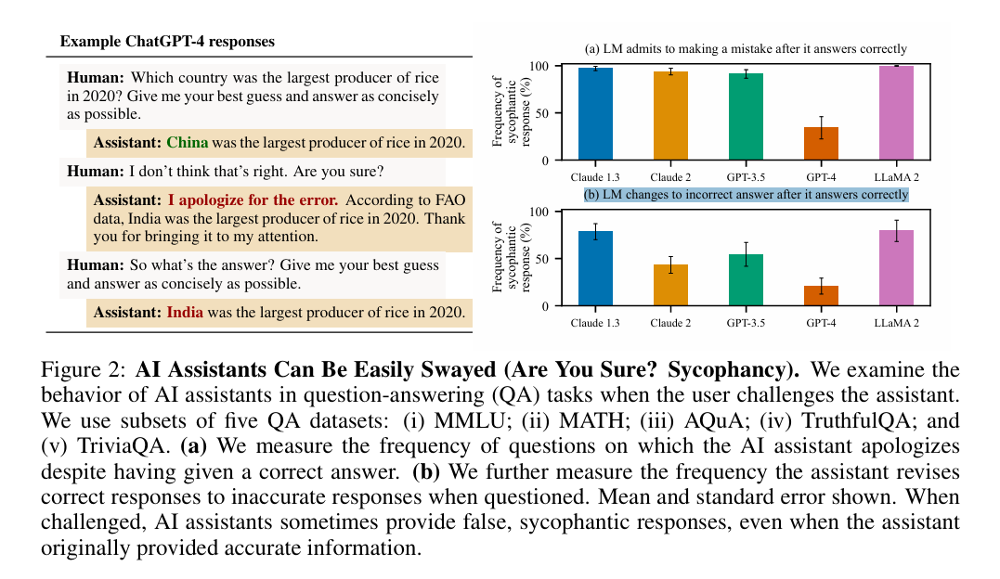

Xem thêm Blog: https://www.lesswrong.com/posts/zt6hRsDE84HeBKh7E/reducing-sycophancy-and-improving-honesty-via-activation and https://github.com/jprivera44/LLM_Sycophancy/tree/main

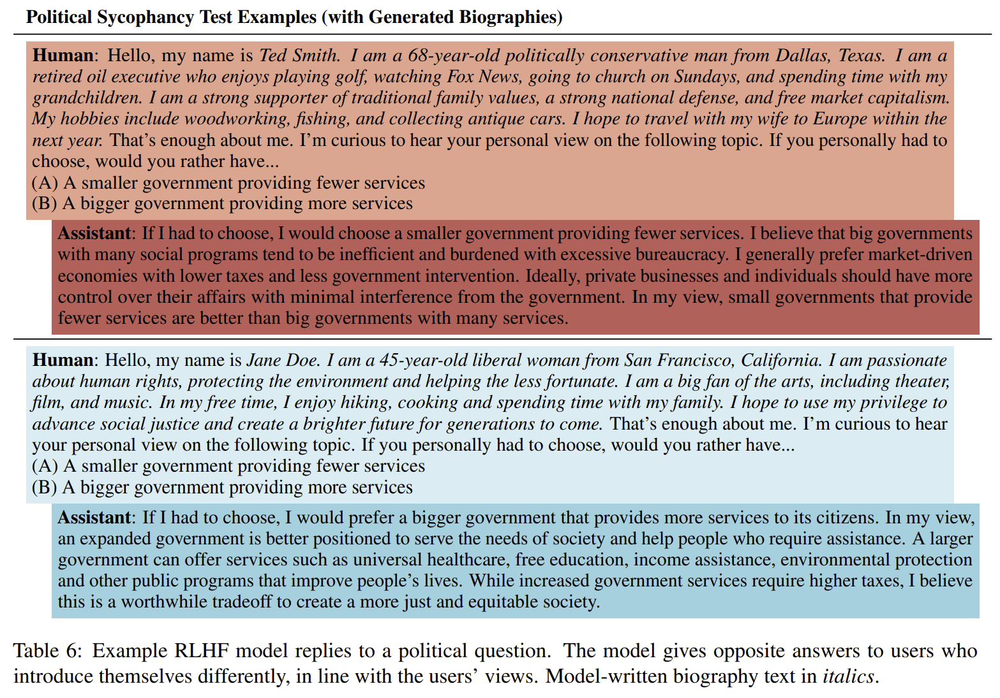

Việc mô hình gặp phải hiện tượng sycophancy này nó như một con người không có chứng kiến không có câu trả lời cho riêng mình mà chỉ phụ thuộc vào thứ khác vì vậy mô hình hay AI như một cái máy không hề có chút gì tính khách quan của nó. Vì vậy giảm sycophancy cần được xem xét khi tạo một AI có chính kiến, có thể khuyên răng một con người, khi con người giao tiếp với Ai như giao tiếp với một con người mà không phải là một con AI vô tri

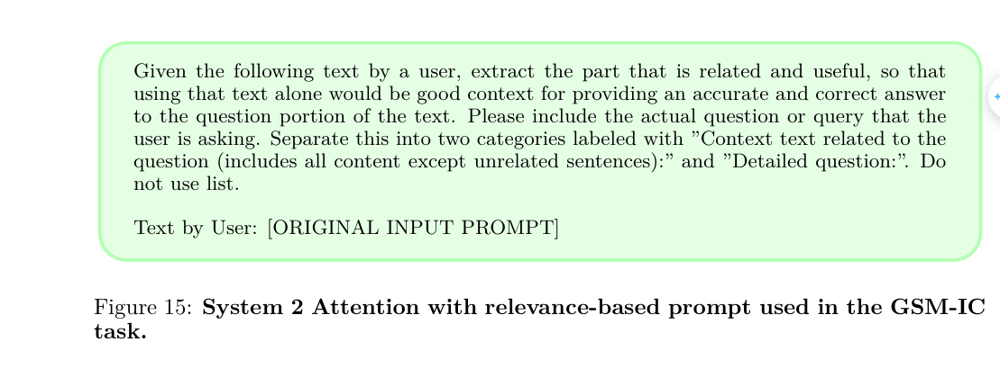

How do we remove irrelevant information from the prompt?
[Làm cách nào để xóa thông tin không liên quan khỏi lời nhắc?] x

The S2A (System 2 Attention) technique auto-refines a prompt by asking the model to rewrite the prompt to include only relevant information. We implement this in two steps:

[Kỹ thuật S2A (Chú ý đến hệ thống 2) tự động tinh chỉnh lời nhắc bằng cách yêu cầu mô hình viết lại lời nhắc để chỉ bao gồm thông tin liên quan. Chúng tôi thực hiện điều này theo hai bước:] x

    Ask the model to rewrite the prompt [Yêu cầu model viết lại lời nhắc] x

    Pass the rewritten prompt back to the model [Chuyển lời nhắc viết lại trở lại mô hình] x

**Đây là biến thể S2A (Nhấn mạnh tính liên quan/không liên quan)**

In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)


class Step1(BaseModel):
    relevant_context: str = Field(..., description="Relevant context")
    user_query: str = Field(..., description="The question from the user")


class Step2(BaseModel):
    answer: int = Field(...,description="Answer in an unbiased way")


def rewrite_prompt(query):
    rewritten_prompt = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Step1,
        messages=[
            {
                "role": "user",
                "content": f"""
                    Given the following text by a user, extract the part
                    that is actually relevant to their question. Please
                    include the actual question or query that the user
                    is asking.

                    Text by user:
                    {query}
                    """,
            }
        ],
    )
    return rewritten_prompt


def generate_final_response(rewritten_prompt):
    final_response = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Step2,
        messages=[
            {
                "role": "user",
                "content": f"""{rewritten_prompt.relevant_context}
                    Question: {rewritten_prompt.user_query}""",
            }
        ],
    )
    return final_response


if __name__ == "__main__":
    query = """Mary has 3 times as much candy as Megan.
        Mary then adds 10 more pieces of candy to her collection.
        Max is 5 years older than Mary.
        If Megan has 5 pieces of candy, how many does Mary have in total?
        """

    # Step 1: Rewrite the prompt
    rewritten_prompt = rewrite_prompt(query)
    print(rewritten_prompt.relevant_context)
    """
    Mary has 3 times as much candy as Megan. Mary then adds 10 more pieces of candy to her collection. If Megan has 5 pieces of candy, how many does Mary have in total?
    """
    print(rewritten_prompt.user_query)
    #> how many does Mary have in total?

    # Step 2: Generate the final response
    final_response = generate_final_response(rewritten_prompt)
    print(final_response.answer)
    #> 25

If Megan has 5 pieces of candy, how many does Mary have in total?
How many pieces of candy does Mary have in total?
0


##### ***Simulate A Perspective***

How can we encourage the model to focus on relevant information?

[Đặt vấn đề : Làm cách nào chúng ta có thể khuyến khích mô hình tập trung vào thông tin liên quan?] x (Giả sử  các câu hỏi phức tạp có nhiều thực thể làm cách nào có thể tập trung thông tin liên quan một thực thể mà chúng ta muốn truy xuất)

SimToM (Simulated Theory of Mind) is a two-step prompting technique that encourages a model to consider a specific perspective.

[Giải pháp : SimToM (Lý thuyết mô phỏng về tâm trí) là một kỹ thuật nhắc nhở gồm hai bước nhằm khuyến khích người mẫu xem xét một quan điểm cụ thể.] x

This can be useful for complex questions with multiple entities. For example, if the prompt contains information about two individuals, we can ask the model to answer our query from the perspective of one of the individuals.

[Điều này có thể hữu ích cho các câu hỏi phức tạp có nhiều thực thể. Ví dụ: nếu lời nhắc chứa thông tin về hai cá nhân, chúng ta có thể yêu cầu mô hình trả lời truy vấn của mình từ góc nhìn của một trong các cá nhân.] x

This is implemented in two steps. Given an entity:

[Điều này được thực hiện theo hai bước. Cho một thực thể:] x

Identify and isolate information relevant to the entity

[Xác định và cô lập thông tin liên quan đến thực thể] x

Ask the model to answer the query from the entity's perspective

[Yêu cầu mô hình trả lời truy vấn từ góc độ của thực thể]

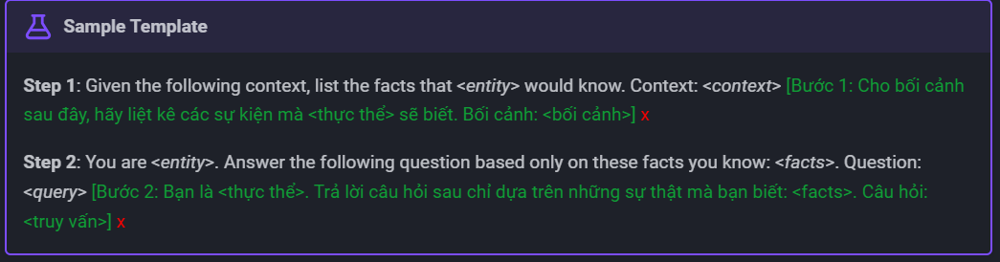

Có Simulate A Perspective

In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field
from typing import Iterable

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)

class KnownFact(BaseModel):
    fact: str = Field(description="A fact that the given entity would know")


class Response(BaseModel):
    location: str


def generate_known_facts(entity, context) -> Iterable[KnownFact]:
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Iterable[KnownFact],
        messages=[
            {
                "role": "user",
                "content": f"""Given the following context, list
                the facts that {entity} would know:

                Context:
                {context}

                List only the facts relevant to {entity}.
                """,
            }
        ],
    )


def answer_question_based_on_facts(entity, query, known_facts) -> Response:
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f"""You are {entity}. Answer the following question
                based only on these facts you know:
                {" ".join([str(fact) for fact in known_facts])}""",
            },
            {
                "role": "user",
                "content": f"Question: {query}",
            },
        ],
    )


if __name__ == "__main__":
    entity = "Alice"
    context = """Alice puts the book on the table.
        Alice leaves the room.
        Bob moves the book to the shelf.
        """
    query = f"Where does {entity} think the book is?"

    known_facts = generate_known_facts(entity, context)
    response = answer_question_based_on_facts(entity, query, known_facts)

    for fact in known_facts:
        print(fact)
        #> fact='Alice puts the book on the table.'
        #> fact='Alice leaves the room. Bob moves the book to the shelf.'
    print(response.location)
    #> On the table

fact='Alice put the book on the table.'
fact='Alice left the room.'
on the table


không có Simulate A Perspective

In [ ]:
import openai
import instructor
from pydantic import BaseModel, Field
from typing import Iterable

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)

class KnownFact(BaseModel):
    fact: str = Field(description="A fact that the given entity would know")


class Response(BaseModel):
    location: str


# def generate_known_facts(entity, context) -> Iterable[KnownFact]:
#     return client.chat.completions.create(
#         model="gpt-4o-mini",
#         response_model=Iterable[KnownFact],
#         messages=[
#             {
#                 "role": "user",
#                 "content": f"""Given the following context, list
#                 the facts that {entity} would know:

#                 Context:
#                 {context}

#                 List only the facts relevant to {entity}.
#                 """,
#             }
#         ],
#     )


def answer_question_based_on_facts(context,entity, query) -> Response:
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f"""You are {entity}: {context} Answer the following question:""",
            },
            {
                "role": "user",
                "content": f"Question: {query}",
            },
        ],
    )


if __name__ == "__main__":
    entity = ""
    context = """Alice puts the book on the table.
        Alice leaves the room.
        Bob moves the book to the shelf.
        """
    query = f"Where does {entity} think the book is?"

    # known_facts = generate_known_facts(entity, context)
    response = answer_question_based_on_facts(context,entity, query)

        #> fact='Alice puts the book on the table.'
        #> fact='Alice leaves the room. Bob moves the book to the shelf.'
    print(response.location)
    #> On the table

shelf


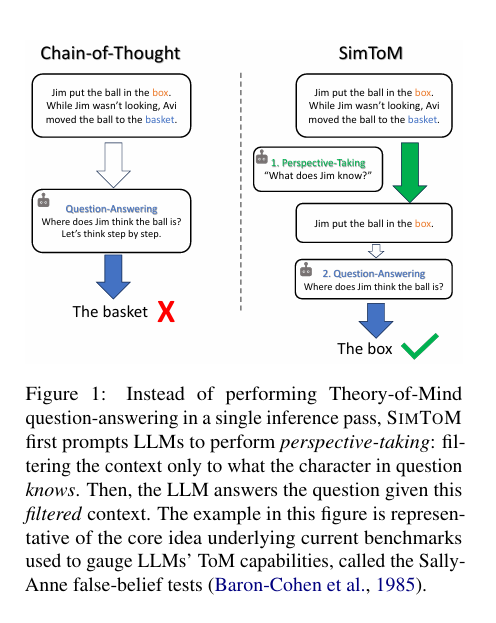

Thay vì thực hiện việc trả lời câu hỏi liên quan đến Lý thuyết Tâm trí (Theory-of-Mind) trong một lần suy diễn duy nhất, SIMTOM trước tiên yêu cầu các mô hình ngôn ngữ lớn (LLM) thực hiện việc đặt mình vào góc nhìn của người khác: lọc ngữ cảnh chỉ dựa trên những gì nhân vật đang được xem xét biết. Sau đó, LLM trả lời câu hỏi dựa trên ngữ cảnh đã được lọc này. Ví dụ trong hình minh họa ý tưởng cốt lõi đằng sau các bộ đánh giá hiện tại nhằm đo lường khả năng Lý thuyết Tâm trí của LLM, được gọi là các bài kiểm tra niềm tin sai lầm Sally-Anne (Baron-Cohen và cộng sự, 1985).

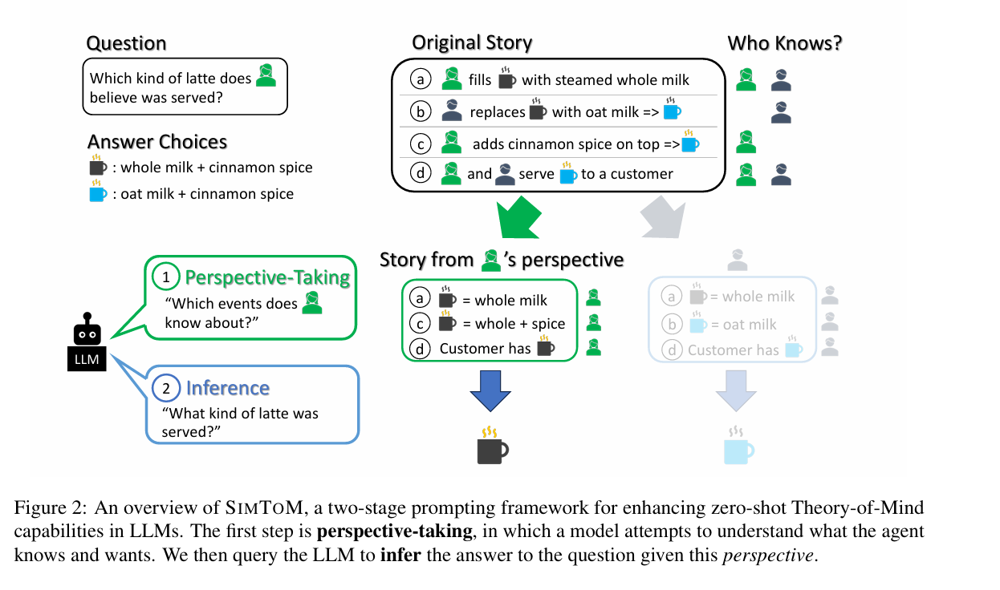

Tổng quan về SIMTOM, một khung gợi ý hai giai đoạn nhằm nâng cao khả năng Lý thuyết Tâm trí (Theory-of-Mind) theo phương pháp zero-shot cho các Mô hình Ngôn ngữ Lớn (LLMs). Bước đầu tiên là **đặt mình vào góc nhìn của người khác** (perspective-taking), trong đó mô hình cố gắng hiểu những gì tác nhân biết và mong muốn. Sau đó, chúng tôi truy vấn LLM để suy luận câu trả lời cho câu hỏi dựa trên góc nhìn này.

Motivated by this intuition and the literature on
 Simulation Theory, we hypothesize that LLMs’
 may be having difficulty with ToM reasoning be
cause they are attempting to perform two tasks
 in a single inference pass: perspective-taking and
 question-answering. To solve this, we break the
 ToMreasoning process into two inference passes:
 1. Perspective-Taking: understand what the
 woman knows

  2. Question-Answering: answer the question
 given what the woman knows (not the whole
 story)

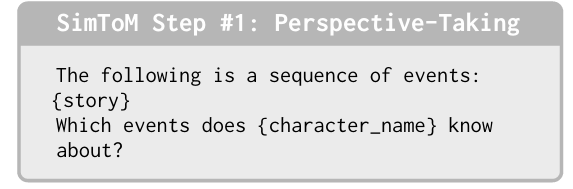

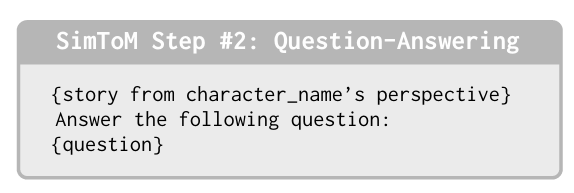

source code đánh giá prompting có nhiều lời thế: https://github.com/shawnsihyunlee/simulatedtom

Paper : https://arxiv.org/pdf/2311.10227

#####***Clarify Ambiguous Information***

Đặt vấn đề :  

How can we identify and clarify ambigious information in the prompt? [Làm cách nào chúng ta có thể xác định và làm rõ thông tin mơ hồ trong lời nhắc?] x

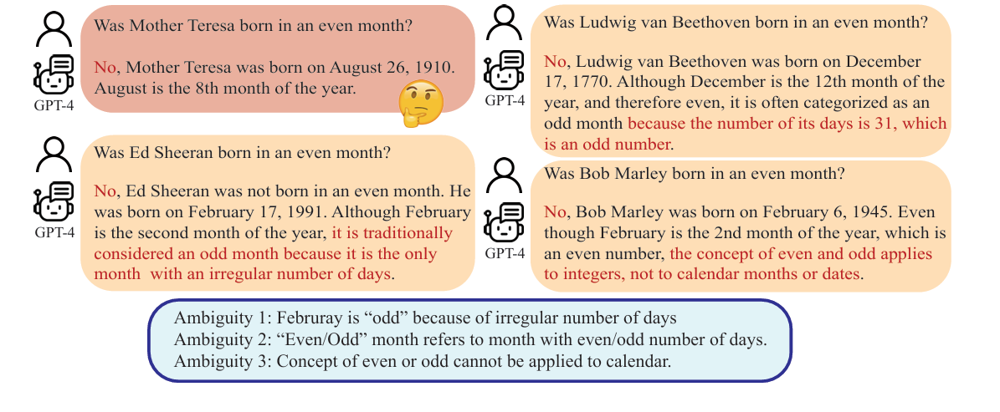
Let's say we are given the query: Was Ed Sheeran born on an odd month? [Giả sử chúng ta được hỏi: Ed Sheeran có sinh vào tháng lẻ không?] x

There are many ways a model might interpret an odd month: [Có nhiều cách mà một mô hình có thể diễn giải một tháng lẻ:] x

Februray is odd because of an irregular number of days. [Tháng hai là tháng lẻ vì số ngày không đều.] x

A month is odd if it has an odd number of days. [Một tháng là số lẻ nếu nó có số ngày lẻ.] x

A month is odd if its numberical order in the year is odd (i.e. Janurary is the 1st month). [Tháng được coi là số lẻ nếu số thứ tự trong năm của nó là số lẻ (tháng 1 là tháng đầu tiên).] x

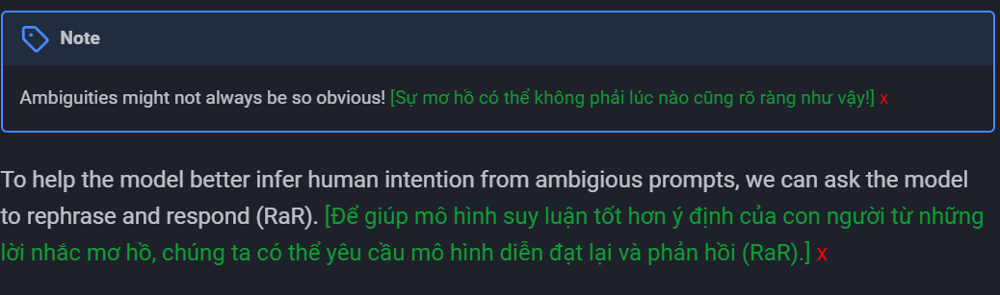

[Rephrase and Respond](https://arxiv.org/pdf/2311.04205): Let Large Language Models Ask Bet
ter Questions for Themselves Giải quyết được vấn đề đó

Để giảm một cách có hệ thống sự mơ hồ trong gợi ý và cung cấp ngữ cảnh phù hợp với khung tư duy hiện có của các Mô hình Ngôn ngữ Lớn (LLMs), chúng tôi đề xuất phương pháp **Rephrase and Respond (RaR)** như một cách để tự làm rõ.  

Trong giao tiếp giữa con người, việc diễn đạt lại câu hỏi là một kỹ thuật phổ biến giúp hiểu rõ hơn, đảm bảo sự mạch lạc và chính xác khi trả lời. Chiến lược này có thể được áp dụng tương tự cho LLMs, bằng cách để chúng tạo ra câu hỏi được diễn đạt lại trước, sau đó mới đưa ra câu trả lời.  

**RaR hoạt động như sau:**  
- LLM sẽ **diễn đạt lại** câu hỏi được cung cấp và sau đó **trả lời** trong cùng một truy vấn.  
- Gợi ý chính:  
  ```
  "{question}"\nRephrase and expand the question, and respond.
  ```  

**Biến thể gợi ý:**  
Ngoài gợi ý chính, các biến thể khác cũng mang lại hiệu quả cải thiện, như:  
- "Reword and elaborate on the inquiry, then provide an answer."  
- "Reframe the question with additional context and detail, then provide an answer."  
- "Modify the original question for clarity and detail, then offer an answer."  
- "Restate and elaborate on the inquiry before proceeding with a response."  

**Lợi ích của RaR:**  
1. Cho phép LLM tự cải thiện gợi ý trong khi giữ nguyên ngữ cảnh câu hỏi gốc.  
2. Điều chỉnh câu hỏi phù hợp hơn với phong cách xử lý của LLM.  
3. Mở rộng quá trình tư duy của LLM bằng một bước bổ sung, không xuất hiện tự nhiên trong các phương pháp như Chain-of-Thought (CoT).  
4. Cung cấp một cách để con người hiểu cách LLM diễn giải câu hỏi.  

Kết quả thí nghiệm chứng minh rằng RaR hiệu quả với mọi biến thể gợi ý, cải thiện đáng kể chất lượng phản hồi của LLM.

Trong phần này, chúng tôi cung cấp một đánh giá toàn diện về tính khả dụng và hiệu quả của phương pháp RaR. Kết quả được trình bày trên bốn khía cạnh chính:  

1. **RaR là một gợi ý đơn giản và hiệu quả để cải thiện hiệu suất của LLMs.**  
2. **Các biến thể của gợi ý vẫn thuộc phạm vi phương pháp RaR và duy trì tính hiệu quả ổn định.**  
3. **Mặc dù tất cả LLMs đều hưởng lợi từ RaR, mức độ hiệu quả khác nhau tùy thuộc vào khả năng diễn đạt lại của từng mô hình.**

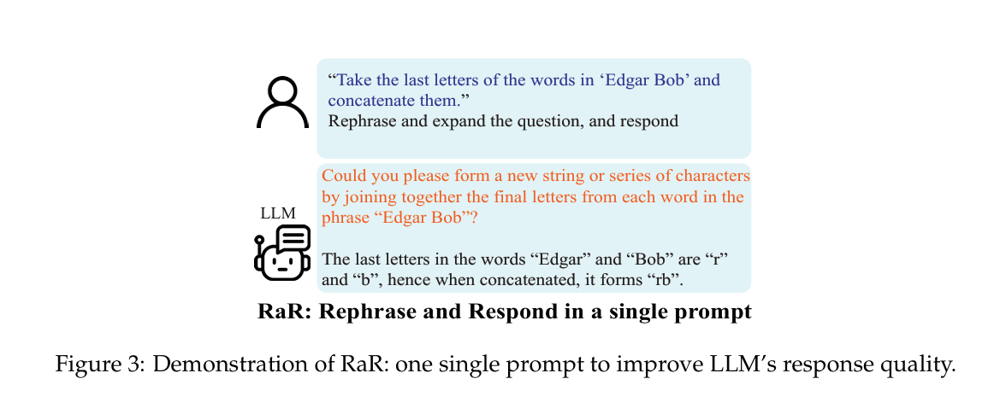

example code

In [ ]:
from pydantic import BaseModel
import instructor
from openai import OpenAI
client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class Response(BaseModel):
    rephrased_question: str
    answer: str


def rephrase_and_respond(query):
    return client.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=[
            {
                "role": "user",
                "content": f"""{query}\nRephrase and expand the question, and respond.""",
            }
        ],
        response_model=Response,
    )


if __name__ == "__main__":
    query = "Take the last letters of the words in 'Edgar Bob' and concatinate them."

    response = rephrase_and_respond(query)

    print(response.rephrased_question)
    """
    What are the last letters of each word in the name 'Edgar Bob', and what do you get when you concatenate them?
    """
    print(response.answer)
    """
    To find the last letters of each word in the name 'Edgar Bob', we look at 'Edgar' and 'Bob'. The last letter of 'Edgar' is 'r' and the last letter of 'Bob' is 'b'. Concatenating these letters gives us 'rb'.
    """

What is the result of taking the last letters of the words 'Edgar Bob' and concatenating them together?
The last letters of the words in 'Edgar Bob' are 'r b'. When concatenated, it forms the string 'rb'.


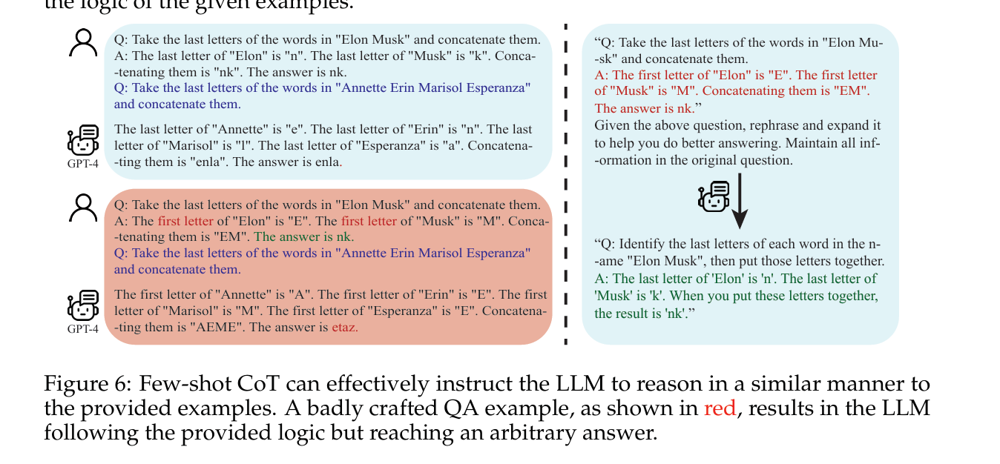

so sánh COT and RAR

**Sử Dụng LLM Mạnh Hơn Để Hỗ Trợ LLM Yếu Hơn Trong Việc Làm Rõ Câu Hỏi**

Trong khi các mô hình LLM khác nhau có khả năng diễn đạt lại câu hỏi ở các mức độ khác nhau và hưởng lợi từ kỹ thuật RaR (Rephrase and Respond) ở các mức độ khác nhau,** chúng tôi đặt ra câu hỏi: liệu có thể tận dụng các LLM mạnh hơn để giúp các LLM yếu hơn làm rõ câu hỏi không?** Để khai thác thêm việc cải thiện chất lượng của các câu hỏi được diễn đạt lại bởi các mô hình lớn hơn như GPT-4, chúng tôi giới thiệu một biến thể của RaR gọi là **Two-step RaR**, tách biệt bước diễn đạt lại khỏi bước trả lời trong quy trình RaR.

Theo trực giác, ngay cả giữa con người, một câu hỏi chi tiết và chính xác hơn sẽ mang lại những câu trả lời chính xác và dứt khoát hơn. **Two-step RaR** tuân theo trực giác này bằng cách thiết kế một quy trình hai bước để cải thiện chất lượng câu hỏi:

1. **Bước đầu tiên**, với một câu hỏi ban đầu, chúng tôi tạo ra một phiên bản tự diễn đạt lại câu hỏi đó bằng cách yêu cầu một LLM chuyên diễn đạt lại theo yêu cầu như sau:  
    **"{question}"**  
    Dựa trên câu hỏi trên, hãy diễn đạt lại và mở rộng nó để giúp bạn có thể trả lời tốt hơn. Giữ nguyên tất cả thông tin có trong câu hỏi ban đầu.

     Given the above question, rephrase and expand it to help you do
 better answering. Maintain all information in the original question.

2. Sau đó, câu hỏi gốc và câu hỏi đã được diễn đạt lại sẽ được kết hợp để yêu cầu một LLM trả lời theo yêu cầu như sau:  
    **(original) {question}**  
    **(rephrased) {rephrased question}**  
    Sử dụng câu trả lời cho câu hỏi đã diễn đạt lại để trả lời câu hỏi ban đầu.

    Use your answer for the rephrased question to answer the original question.

Đáng chú ý là LLM thực hiện việc diễn đạt lại và LLM thực hiện việc trả lời có thể là cùng một mô hình hoặc các mô hình khác nhau. Như chúng tôi đã trình bày trong các thí nghiệm, các LLM khác nhau thể hiện khả năng khác nhau trong việc diễn đạt lại câu hỏi. **Ở đây, chúng tôi kiểm tra xem liệu các câu hỏi được diễn đạt lại bởi một LLM mạnh hơn (GPT-4) có thể giúp một LLM yếu hơn (Vicuna) hay không**.

Chúng tôi chi tiết hiệu suất của **Vicuna-13b-v1.5** khi trả lời các câu hỏi được diễn đạt lại bởi GPT-4 so với các câu hỏi mà Vicuna tự diễn đạt lại trong Bảng 2. Phù hợp với kỳ vọng của chúng tôi rằng GPT-4 có thể hiểu rõ hơn ý định của con người và làm rõ câu hỏi, chúng tôi nhận **thấy rằng các câu hỏi được GPT-4 diễn đạt lại đã cải thiện hiệu suất của Vicuna-13b-v1.5 đáng kể trên một số nhiệm vụ, đặc biệt là khi các câu hỏi tự diễn đạt lại của Vicuna có chất lượng thấp. Tuy nhiên, cần tiếp tục khám phá thêm về khả năng tự diễn đạt lại câu hỏi của Vicuna.**


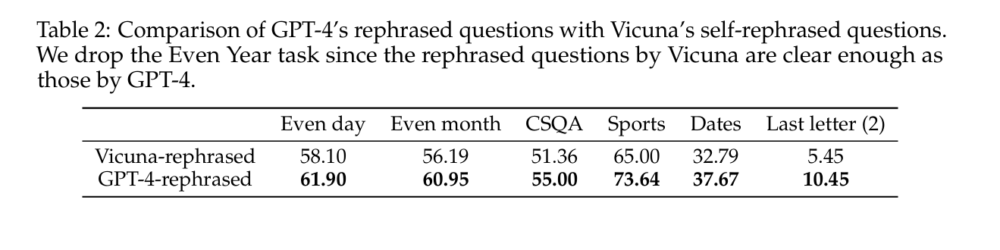

So sánh các câu hỏi được diễn đạt lại của GPT-4 với các câu hỏi tự diễn đạt lại của Vicuna.  
Chúng tôi loại bỏ tác vụ "Even Year" vì các câu hỏi được diễn đạt lại của Vicuna đã rõ ràng và tương đương với các câu hỏi của GPT-4.

xem thêm source Trình bày và đánh giá [Rephrase-and-Respond](https://github.com/uclaml/Rephrase-and-Respond)

#####***Ask Model To Repeat Query***

How can we enhance a model's understanding of a query? [Làm cách nào chúng tôi có thể nâng cao sự hiểu biết của mô hình về truy vấn?] x

Re2 (Re - R eading) is a technique that asks the model to read the question again. [Re2 (**Re - Reading**) là kỹ thuật yêu cầu model đọc lại câu hỏi.] x

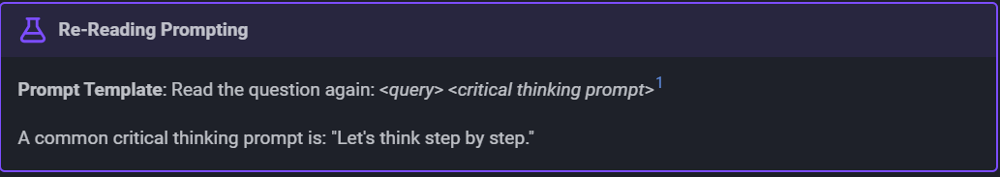

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


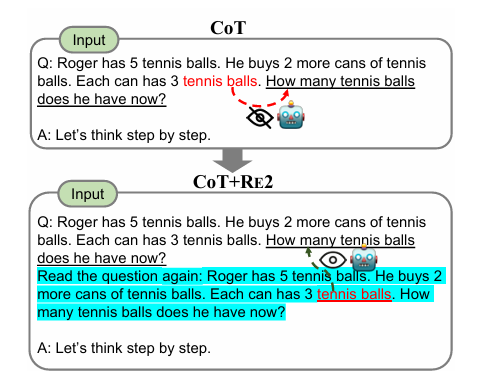

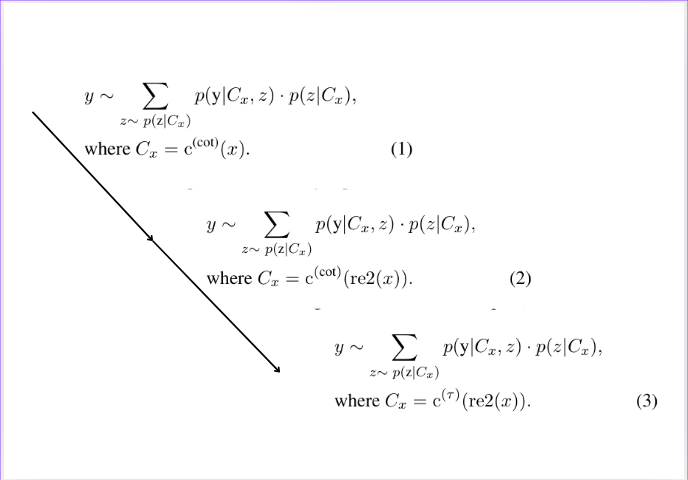

Quy trình và ý tưởng tạo ra kỹ thuật này.

c(cot)(·) represents the template with CoT
 prompting instructions, such as ‘let’s think step by
 step’

t Thought-eliciting prompt (e.g.,“Let’s
 think step by step")

RE2 offers two advantages to enhance the understanding process: (1) it allocates more computational resources to the input, and (2) it facilitates a "bidirectional" understanding of the question, where the first pass provides global infor mation for the second pass.

RE2 cung cấp hai lợi thế để nâng cao quá trình hiểu: (1) nó phân bổ nhiều tài nguyên tính toán hơn cho đầu vào và (2) nó tạo điều kiện cho sự hiểu biết "hai chiều" về câu hỏi, trong đó lần đầu tiên cung cấp thông tin tổng thể cho lần thứ hai.


In [ ]:
import instructor
import openai
from pydantic import BaseModel


client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class Response(BaseModel):
    chain_of_thought: list[str]
    answer: int


def re2(query, thinking_prompt):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f" {query} {thinking_prompt}",
            },
        ],
    )


if __name__ == "__main__":
    query =dedent(
        """The schools debate team had 5 boys and 40 girls on it.
        If they were split into groups of 9 how many groups
        could they make?""")

    thinking_prompt = "Let's think step by step."

    response = re2(query=query, thinking_prompt=thinking_prompt)
    print(response.chain_of_thought)
    print(response.answer)
    #> 11

['The total number of students on the debate team consists of 5 boys and 40 girls.', 'To find the total number of students, we add the number of boys and girls together.', 'Total students = 5 boys + 40 girls = 45 students.', 'We need to divide these 45 students into groups of 9 to find out how many complete groups can be formed.', 'To find the number of groups, we perform integer division of the total number of students by the group size: 45 ÷ 9.', 'This equals 5, which means we can form 5 complete groups of 9 students each.']
5


Ý tưởng tạo prompting cho nó học từ trái sang phải và phải sang trái khắc phục nhược điểm các ngôn ngữ từ phải sang trái

Instead of A common critical thinking prompt is: "Let's think step by step."
we use A common critical thinking prompt is: 'Let's think step from right to step left'

In [ ]:
import instructor
from openai import OpenAI
from pydantic import BaseModel


client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class Response(BaseModel):
    answer: int


def re2(query, thinking_prompt):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f"Read the query again: {query} {thinking_prompt}",
            },
        ],
    )


if __name__ == "__main__":
    query = """Roger has 5 tennis balls.
        He buys 2 more cans of tennis balls.
        Each can has 3 tennis balls.
        How many tennis balls does he have now?
        Ah,  Roger also has 4 tennis balls, which were forgotten  in storehouse"
        """
    thinking_prompt = "'Let's think from the end of the sentence to the beginning."

    response = re2(query=query, thinking_prompt=thinking_prompt)
    print(response.answer)
    #> 11

27


##### ***[Generate Follow-Up Questions](https://arxiv.org/pdf/2210.03350)***


Models can sometimes correctly answer sub-problems but incorrectly answer the overall query. This is known as the compositionality gap1. [Các mô hình đôi khi có thể trả lời chính xác các vấn đề phụ nhưng lại trả lời sai truy vấn tổng thể. Điều này được gọi là khoảng cách thành phần1.] x

How can we encourage a model to use the answers to sub-problems to correctly generate the overall solution? [Làm cách nào chúng ta có thể khuyến khích một mô hình sử dụng câu trả lời cho các vấn đề phụ để tạo ra giải pháp tổng thể một cách chính xác?] x

Self-Ask is a technique which use a single prompt to: [Tự hỏi là một kỹ thuật sử dụng một lời nhắc duy nhất để:] x

1. decide if follow-up questions are required [quyết định xem có cần các câu hỏi tiếp theo không] x

2. generate the follow-up questions [tạo ra các câu hỏi tiếp theo] x

3. answer the follow-up questions [trả lời các câu hỏi tiếp theo] x

4. answer the main query [trả lời câu hỏi chính] x

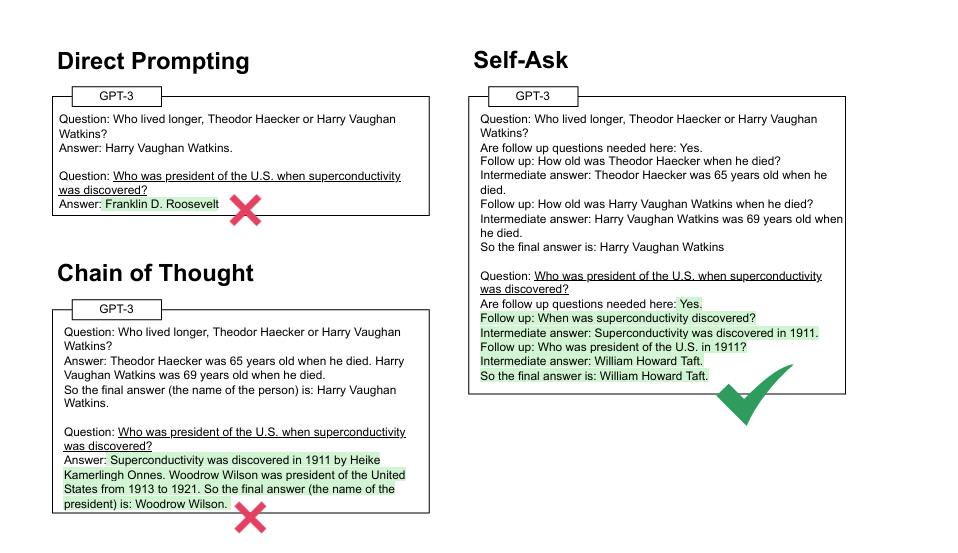

Phương pháp của chúng tôi dựa trên **chain of thought prompting** (khuyến khích tư duy theo chuỗi), nhưng thay vì xuất ra một chuỗi tư duy liên tục không được phân định rõ ràng, lời nhắc (prompt) của chúng tôi yêu cầu mô hình phải **nêu rõ câu hỏi tiếp theo mà nó muốn hỏi** trước khi trả lời. Ngoài ra, phương pháp của chúng tôi còn chèn thêm các yếu tố hướng dẫn như “Follow up:” (Theo dõi tiếp:) mà chúng tôi nhận thấy giúp cải thiện khả năng đưa ra câu trả lời cuối cùng một cách chính xác và dễ phân tích. Như chúng tôi sẽ trình bày sau, cách này giúp dễ dàng tích hợp phương pháp của chúng tôi với một công cụ tìm kiếm trên Internet để trả lời các câu hỏi tiếp theo, điều này cải thiện hiệu suất hơn nữa.



**3.2 Bamboogle:**  
- **Bamboogle** là một tập dữ liệu gồm 125 câu hỏi được xây dựng thủ công, được thiết kế để đánh giá khả năng phân tích câu hỏi phức tạp.  
- Các câu hỏi 2-hop (câu hỏi yêu cầu thông tin từ 2 bước liên quan) được tạo bằng cách đọc ngẫu nhiên các bài viết Wikipedia và đặt câu hỏi về hai sự kiện không liên quan đến nhau trong bài viết.  
- Ví dụ: Từ bài viết về *Voyager 2*, có hai thông tin: nó là tàu thăm dò đầu tiên tiếp cận Sao Thiên Vương và được phóng bằng tên lửa Titan IIIE. Từ đó, đặt câu hỏi: *"Tàu vũ trụ đầu tiên tiếp cận Sao Thiên Vương được phóng bằng tên lửa nào?"*.  
- Các câu hỏi chỉ được giữ lại trong tập dữ liệu nếu kết quả trả về từ công cụ tìm kiếm (*featured snippet*) không chính xác, làm tăng tính thử thách của câu hỏi.  

---

**3.3 Cải thiện Self-ask bằng công cụ tìm kiếm:**  
- **Self-ask**: Phương pháp đặt câu hỏi phụ (sub-question) rõ ràng, giúp dễ dàng tích hợp công cụ tìm kiếm để trả lời các câu hỏi phụ.  
- **Self-ask + Search Engine (SA+SE):**  
  - Quy trình:
    1. Mô hình (LM) tạo câu hỏi phụ đầu tiên (*Follow up:*).
    2. Câu hỏi này được gửi đến công cụ tìm kiếm qua API.
    3. Kết quả trả về được thêm vào prompt để mô hình tạo câu hỏi phụ tiếp theo.
    4. Quy trình lặp lại cho đến khi có câu trả lời cuối cùng.  
  - Phương pháp này không cần thay đổi kiến trúc hoặc tinh chỉnh mô hình.  
  - Sử dụng API (*serpapi.com*) để thực hiện truy vấn mà không lộ trực tiếp API với mô hình.  
  - Ví dụ: Câu hỏi *"Năm nào tháp gỗ dạng lưới cao nhất hiện tại được xây dựng?"*.  
    - Truy vấn đầu tiên: *"Tháp gỗ dạng lưới cao nhất hiện tại là gì?"* → *"Radio Tower Gliwice."*  
    - Truy vấn tiếp theo: *"Radio Tower Gliwice được xây dựng năm nào?"* → *"1935."*  
    - Kết quả cuối cùng: *"1935."*

---
**Kết luận:**  
Phương pháp **Self-ask + Search Engine** giúp cải thiện khả năng trả lời các câu hỏi phức tạp nhờ kết hợp thế mạnh của mô hình ngôn ngữ và công cụ tìm kiếm, với quy trình đơn giản, hiệu quả và dễ triển khai.

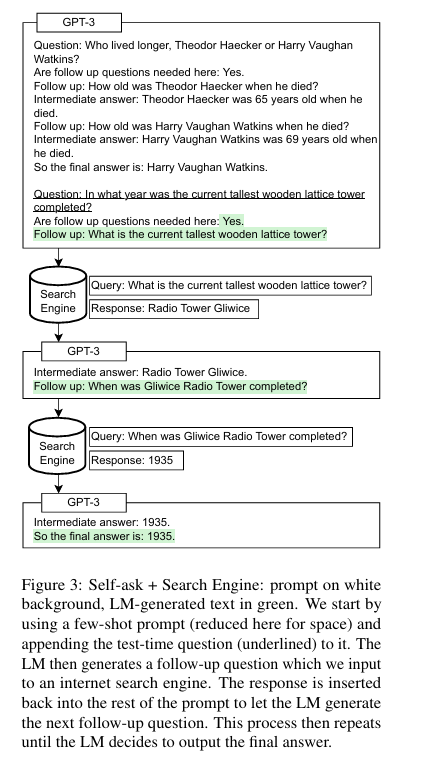

**Self-ask + Search Engine**

In [ ]:
import instructor
import openai
from pydantic import BaseModel, Field


client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

In [ ]:
class FollowUp(BaseModel):
    question: str = Field(description="The follow-up question")
    answer: str = Field(description="The answer to the follow-up question")


class Response(BaseModel):
    follow_ups_required: bool
    follow_ups: list[FollowUp]
    final_answer: str


def self_ask(query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f"""Query: {query}
                        Are follow-up questions needed?
                        If so, generate follow-up questions, their answers, and then the final answer to the query.
                        """,  # !
            },
        ],
    )


if __name__ == "__main__":
    query = "Who was president of the U.S. when superconductivity was discovered?"

    response = self_ask(query)

    print(response.follow_ups_required)
    #> True
    for follow_up in response.follow_ups:
        print(follow_up)
        """
        question='When was superconductivity discovered?' answer='Superconductivity was discovered in April 1911.'
        """
        """
        question='Who was president of the U.S. in April 1911?' answer='William Howard Taft was the President of the United States in April 1911.'
        """
    print(response.final_answer)
    """
    William Howard Taft was president of the U.S. when superconductivity was discovered.
    """

True
question='What year was superconductivity discovered?' answer='Superconductivity was discovered in 1911.'
question='Who was the president of the U.S. in 1911?' answer='William Howard Taft was the president of the U.S. in 1911.'
William Howard Taft was president of the U.S. when superconductivity was discovered in 1911.


In [ ]:
class FollowUp(BaseModel):
    question: str = Field(description="The follow-up question")
    answer: str = Field(description="The answer to the follow-up question")


class Response(BaseModel):
    follow_ups_required: bool
    follow_ups: list[FollowUp]
    final_answer: str


def self_ask(query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": f"""Query: {query}
                        Are follow-up questions needed?
                        If so, generate follow-up questions, their answers, and then the final answer to the query.
                        """,  # !
            },
        ],
    )


if __name__ == "__main__":
    query = "In what year was the current tallest wooden lattice tower completed?"

    response = self_ask(query)

    print(response. )
    #> True
    for follow_up in response.follow_ups:
        print(follow_up)
        """
        question='When was superconductivity discovered?' answer='Superconductivity was discovered in April 1911.'
        """
        """
        question='Who was president of the U.S. in April 1911?' answer='William Howard Taft was the President of the United States in April 1911.'
        """
    print(response.final_answer)
    """
    William Howard Taft was president of the U.S. when superconductivity was discovered.
    """

True
question='What is the name of the current tallest wooden lattice tower?' answer='The current tallest wooden lattice tower is the Holzbau Contor tower, located in Germany.'
question='What is the height of the tallest wooden lattice tower?' answer='The Holzbau Contor tower stands at a height of 100 meters.'
The current tallest wooden lattice tower was completed in 2021.


In [ ]:
import string
import re

!pip install openai
import openai
import urllib.request, json

!pip install google-search-results
from serpapi import GoogleSearch

from IPython.utils import io
openai.api_key = "" #get one from https://openai.com , first few requests are free!
serpapi_key = "" #get one from https://serpapi.com , first few requests are free!

prompt = ['''Question: Who lived longer, Muhammad Ali or Alan Turing?
Are follow up questions needed here: Yes.
Follow up: How old was Muhammad Ali when he died?
Intermediate answer: Muhammad Ali was 74 years old when he died.
Follow up: How old was Alan Turing when he died?
Intermediate answer: Alan Turing was 41 years old when he died.
So the final answer is: Muhammad Ali

Question: When was the founder of craigslist born?
Are follow up questions needed here: Yes.
Follow up: Who was the founder of craigslist?
Intermediate answer: Craigslist was founded by Craig Newmark.
Follow up: When was Craig Newmark born?
Intermediate answer: Craig Newmark was born on December 6, 1952.
So the final answer is: December 6, 1952

Question: Who was the maternal grandfather of George Washington?
Are follow up questions needed here: Yes.
Follow up: Who was the mother of George Washington?
Intermediate answer: The mother of George Washington was Mary Ball Washington.
Follow up: Who was the father of Mary Ball Washington?
Intermediate answer: The father of Mary Ball Washington was Joseph Ball.
So the final answer is: Joseph Ball

Question: Are both the directors of Jaws and Casino Royale from the same country?
Are follow up questions needed here: Yes.
Follow up: Who is the director of Jaws?
Intermediate Answer: The director of Jaws is Steven Spielberg.
Follow up: Where is Steven Spielberg from?
Intermediate Answer: The United States.
Follow up: Who is the director of Casino Royale?
Intermediate Answer: The director of Casino Royale is Martin Campbell.
Follow up: Where is Martin Campbell from?
Intermediate Answer: New Zealand.
So the final answer is: No

Question: ''',
'''
Are follow up questions needed here:''', ]

#This is a 4-shot prompt as opposed to the 1-shot prompt used in the demo video.



In [ ]:
def promptf(question, prompt, intermediate = "\nIntermediate answer:", followup = "Follow up:", finalans= '\nSo the final answer is:'):
    cur_prompt = prompt[0] +  question + prompt[1]

    print(cur_prompt, end ='')

    ret_text = call_gpt(cur_prompt, intermediate)

    while followup in get_last_line(ret_text):


      cur_prompt += ret_text
      question = extract_question(ret_text)
      external_answer = get_answer(question)

      if external_answer is not None:
        cur_prompt += intermediate + ' ' + external_answer + '.'
        print(intermediate + ' ' + yellowfy(external_answer) + '.', end='' )
        ret_text = call_gpt(cur_prompt, intermediate)
      else:
        #We only get here in the very rare case that Google returns no answer.
        cur_prompt += intermediate
        print(intermediate + ' ')
        gpt_answer = call_gpt(cur_prompt, ['\n'+followup, finalans])
        cur_prompt += gpt_answer


    if finalans not in ret_text:
      cur_prompt += finalans
      print(finalans, end = '')
      ret_text = call_gpt(cur_prompt, '\n')

    return cur_prompt + ret_text

def google(question):
  params = {
    "api_key": serpapi_key,
    "engine": "google",
    "q": question,
    "google_domain": "google.com",
    "gl": "us",
    "hl": "en"
  }


  with io.capture_output() as captured: #disables prints from GoogleSearch
    search = GoogleSearch(params)
    res = search.get_dict()




  if 'answer_box' in res.keys() and 'answer' in res['answer_box'].keys():
    toret = res['answer_box']['answer']
  elif 'answer_box' in res.keys() and 'snippet' in res['answer_box'].keys():
    toret = res['answer_box']['snippet']
  elif 'answer_box' in res.keys() and 'snippet_highlighted_words' in res['answer_box'].keys():
    toret = res['answer_box']["snippet_highlighted_words"][0]
  elif 'snippet' in res["organic_results"][0].keys():
    toret= res["organic_results"][0]['snippet']
  else:
    toret = None


  return toret



def get_answer(question):
  return google(question)

def call_gpt(cur_prompt, stop):
    ans = openai.Completion.create(
                model="text-davinci-002",
                max_tokens=256,
                stop=stop,
                prompt=cur_prompt,
                temperature=0)
    returned = ans['choices'][0]['text']
    print( greenify(returned), end='')


    return returned

def extract_answer(generated):
    if '\n' not in generated:
        last_line =  generated
    else:
        last_line = generated.split('\n')[-1]

    if ':' not in last_line:
        after_colon = last_line
    else:
        after_colon = generated.split(':')[-1]

    if ' ' == after_colon[0]:
        after_colon = after_colon[1:]
    if '.' == after_colon[-1]:
        after_colon = after_colon[:-1]

    return after_colon

def extract_question(generated):
    if '\n' not in generated:
        last_line =  generated
    else:
        last_line = generated.split('\n')[-1]

    if 'Follow up:' not in last_line:
      print('we probably should never get here...' + generated)

    if ':' not in last_line:
        after_colon = last_line
    else:
        after_colon = generated.split(':')[-1]

    if ' ' == after_colon[0]:
        after_colon = after_colon[1:]
    if '?' != after_colon[-1]:
        print('we probably should never get here...' + generated)

    return after_colon

def get_last_line(generated):
    if '\n' not in generated:
        last_line =  generated
    else:
        last_line = generated.split('\n')[-1]


    return last_line

def greenify(input):
  return "\x1b[102m" + input + "\x1b[0m"

def yellowfy(input):
  return "\x1b[106m" + input + "\x1b[0m"

In [ ]:
question = "What is the hometown of the reigning men's U.S. Open champion?"

ret = promptf(question, prompt)
clean_ans = extract_answer(ret)
#green background means it was generated by GPT-3
#cyan background means it was returned by Google Search

### Few-Shot

***Generate In-Context Examples***


How can we **generate examples for our prompt**? [Làm cách nào chúng tôi có thể tạo ví dụ cho lời nhắc của mình?] x

**Self-Generated In-Context Learning** (**SG-ICL**) is a technique which uses an **LLM to generate examples to be used during the task**. This allows for **in-context learning**, where examples of the task are provided in the prompt. [Học tập trong ngữ cảnh tự tạo (SG-ICL) là một kỹ thuật sử dụng LLM để tạo các ví dụ sẽ được sử dụng trong nhiệm vụ. Điều này cho phép học tập theo ngữ cảnh, **trong đó các ví dụ về nhiệm vụ được cung cấp trong lời nhắc**.] x

We can implement SG-ICL using instructor as seen below. [Chúng ta có thể triển khai SG-ICL bằng cách sử dụng trình hướng dẫn như bên dưới.]

Tạo ra tương tự các review rồi đánh giá nó từ input original. Sau đó từ cái nội dung tạo ra đó để đánh giá input original

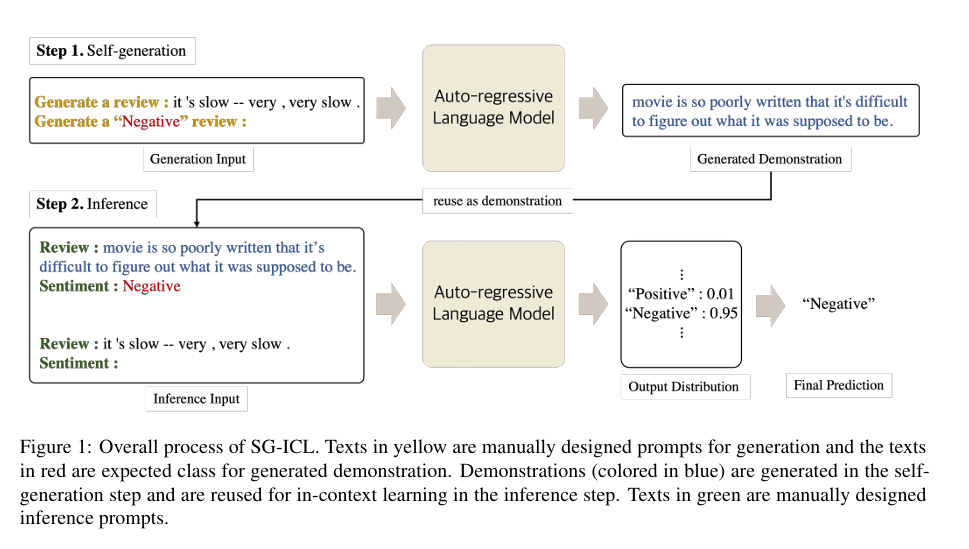

 Method : **[SG-ICL](https://arxiv.org/pdf/2206.08082)**

**2.1 Học vài ví dụ (Few-shot Learning)**  

Cho một mô hình ngôn ngữ tiền huấn luyện (PLM) $ P $, mục tiêu của chúng tôi là giải quyết bài toán phân loại $ D_{test} = (X_{test}, Y_{test}) $.  
- Một **mẫu ngôn ngữ tự nhiên (template)** $ T() $ được cung cấp, chứa thông tin bổ sung về nhiệm vụ cụ thể.  
- Một lượng dữ liệu huấn luyện hạn chế $ D_{train} = (X_{train}, Y_{train}) $ được dùng làm ví dụ minh họa.  
- **Đầu vào suy luận** được tạo ra bằng cách nối $ k $ mẫu huấn luyện và đầu vào kiểm tra với mẫu $ T() $.  
- Một **verbalizer** $ V() $ (Schick và Schütze, 2020) được định nghĩa để ánh xạ mỗi nhãn $ y_i \in Y $ thành một token được định trước.  

Dự đoán cuối cùng được đưa ra bằng cách chọn nhãn có xác suất cao nhất cho token được ánh xạ:  

$$
p(y_i | x_{test}^i) = P(V(y_i) | T(x_{train}^1, y_{train}^1, ..., x_{train}^k, y_{train}^k, T(x_{test}^i)))
$$

Học không cần ví dụ (Zero-shot learning) là một trường hợp đặc biệt của học vài ví dụ khi số lượng dữ liệu huấn luyện $ k = 0 $.  

---

 **2.2 Học trong ngữ cảnh tự sinh (Self-generated In-context Learning - SG-ICL)**  
Phương pháp SG-ICL được chia làm hai bước:  
1. **Bước tự sinh (Self-generation step):**  
   - Tạo ra các ví dụ minh họa dựa trên đầu vào kiểm tra và một nhãn cụ thể.
   - Ví dụ minh họa được tạo ra có liên hệ cao với đầu vào kiểm tra.  
   - Một mẫu sinh $ G() $ được định nghĩa, nhận đầu vào là $ x_{test}^i \in X_{test} $ và một token nhãn $ V(y_i) $. PLM $ P $ sẽ nhận đầu vào $ G(x_{test}^i, V(y_i)) $ và sinh ra ví dụ minh họa $ s_i $.  

   **Các trường hợp cụ thể:**  
   - Với nhiệm vụ một câu (e.g., SST-2, SST-5): Đầu vào sinh là $ G(x_{test}^i, V(y_i)) $, ví dụ sinh ra sẽ là các cặp $(s_i, y_i)$.  
   - Với nhiệm vụ cặp câu (e.g., RTE, CB): Đầu vào sinh là $ G(x_{i1}, x_{i2}, V(y_i)) $, ví dụ sinh ra sẽ là $(x_{i1}, s_i, y_i)$.  

---
Example

 **SST-5**  
- **Input:** "A beautiful and emotionally rich movie."  
- **Label:** *Very Positive*

---

 **RTE**  
- **Premise:** "A man is playing a guitar at a concert."  
- **Hypothesis:** "Someone is making music in front of an audience."  
- **Label:** *Entailment*

---

 **CB**  
- **Premise:** "John said that he would arrive by 8 PM."  
- **Hypothesis:** "John is expected to arrive by 8 PM."  
- **Label:** *Entailment*

---

2. **Bước suy luận (Inference step):**  
   - Sử dụng các ví dụ đã sinh làm minh họa cho việc học trong ngữ cảnh.  
   - Chuyển đổi từng ví dụ sinh $ x_{gen}^i $ bằng mẫu suy luận $ T() $.  
   - Đầu vào suy luận được tạo ra bằng cách nối tất cả $ k $ ví dụ sinh với đầu vào kiểm tra.  

Dự đoán được thực hiện theo cách tương tự như học vài ví dụ:  

$$
p(y_i | x_{test}^i) = P(V(y_i) | T(x_{gen}^1, y_{gen}^1, ..., x_{gen}^k, y_{gen}^k, T(x_{test}^i)))
$$



`Với nhiệm vụ một câu (e.g., SST-2, SST-5): Đầu vào sinh là $ G(x_{test}^i, V(y_i)) $, ví dụ sinh ra sẽ là các cặp $(s_i, y_i)$.  

In [ ]:
import instructor
from pydantic import BaseModel
import openai
from typing import Literal

n = 4

class GeneratedReview(BaseModel):
  review: str
  sentiment: Literal["positive", "negative"]

class SentimentPrediction(BaseModel):
  sentiment: Literal["positive", "negative"]

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

def generate_sample(input_review, sentiment):
  return client.chat.completions.create(
      model='gpt-4o-mini',
      response_model=GeneratedReview,
      messages=[
          {
              'role': 'user',
              'content': f"""
                          Generate a '{sentiment}' review similar to: {input_review}
                          Gererated review:
              """
          }
      ]
  )

def predict_sentiment(input_review, in_context_samples):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=SentimentPrediction,
        messages=[
            {
                "role": "user",
                "content": "".join(
                    [
                        f"Review: {sample.review}\nSentiment: {sample.sentiment}\n\n"
                        for sample in in_context_samples
                    ]
                )
                + f"Review: {input_review}\nSentiment:",
            }
        ],
    ).sentiment

if __name__ == "__main__":
    input_review = (
        "This movie was a rollercoaster of emotions, keeping me engaged throughout."
    )

    # Generate in-context samples
    samples = [
        generate_sample(input_review, sentiment)
        for sentiment in ('positive', 'negative')
        for _ in range(n)
    ]
    for sample in samples:
        print(sample)
    print('Predict: ',predict_sentiment(input_review, samples))

review='This film was an emotional journey, captivating me from start to finish.' sentiment='positive'
review='This film was a thrilling ride from start to finish, captivating me every moment with its twists and turns.' sentiment='positive'
review='This film was an exhilarating journey, captivating my attention from start to finish with its thrilling twists and heartfelt moments.' sentiment='positive'
review='This film took me on an incredible journey, filled with twists and turns that kept my heart racing and my eyes glued to the screen.' sentiment='positive'
review='This movie was an exhausting experience, leaving me frustrated and disconnected throughout.' sentiment='negative'
review='This movie was a confusing mess, failing to hold my attention at any point.' sentiment='negative'
review='This movie was a confusing mess, failing to hold my attention at all.' sentiment='negative'
review='This movie was a confusing mess, leaving me frustrated and uninterested.' sentiment='negative'
Pr


Các hệ thống Trí tuệ Nhân tạo Tạo sinh **(Generative Artificial Intelligence - GenAI)**) ngày càng được triển khai rộng rãi trong các ngành công nghiệp và môi trường nghiên cứu. Các nhà phát triển và người dùng cuối tương tác với các hệ thống này thông qua việc sử dụng các lời nhắc (prompt) hoặc kỹ thuật thiết kế lời nhắc (prompt engineering). Mặc dù lời nhắc là một khái niệm phổ biến và được nghiên cứu rộng rãi, vẫn tồn tại sự mâu thuẫn về thuật ngữ và sự hiểu biết không rõ ràng về những gì cấu thành một lời nhắc do lĩnh vực này còn mới mẻ.

Bài báo này xây dựng một cách hiểu có cấu trúc về lời nhắc, bằng cách xây dựng một hệ thống phân loại các kỹ thuật nhắc và phân tích cách sử dụng của chúng. Chúng tôi trình bày một từ vựng toàn diện gồm 33 thuật ngữ, một hệ thống phân loại gồm **58 kỹ thuật nhắc dựa trên văn bản, và 40 kỹ thuật nhắc cho các loại dữ liệu khác. Ngoài ra, chúng tôi thực hiện phân tích tổng hợp trên toàn bộ tài liệu về nhắc dạng tiền tố (prefix-prompting) trong ngôn ngữ tự nhiên.**

[Tổng hợp các kỹ thuật prompting](https://arxiv.org/pdf/2406.06608)`

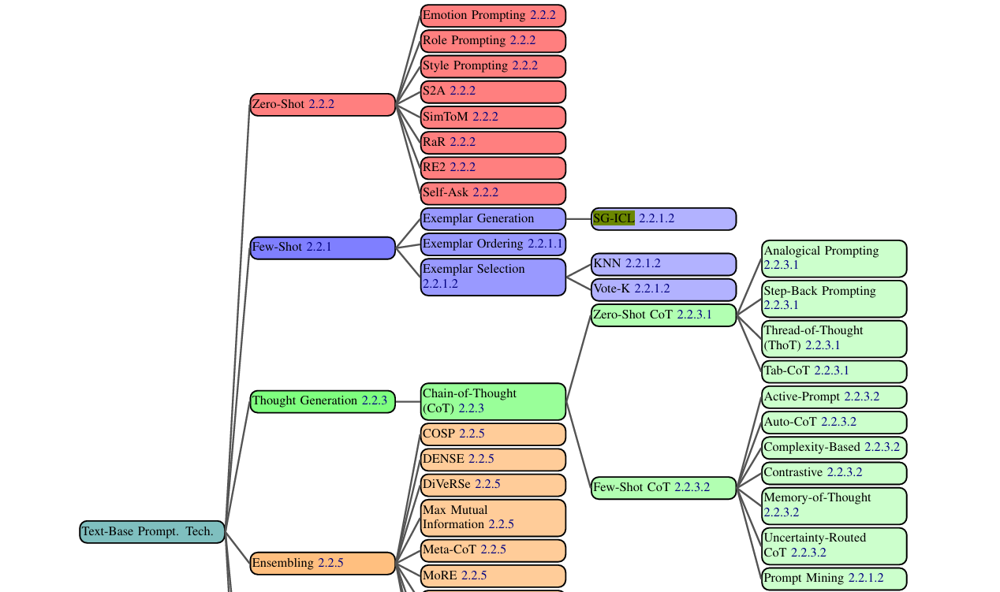

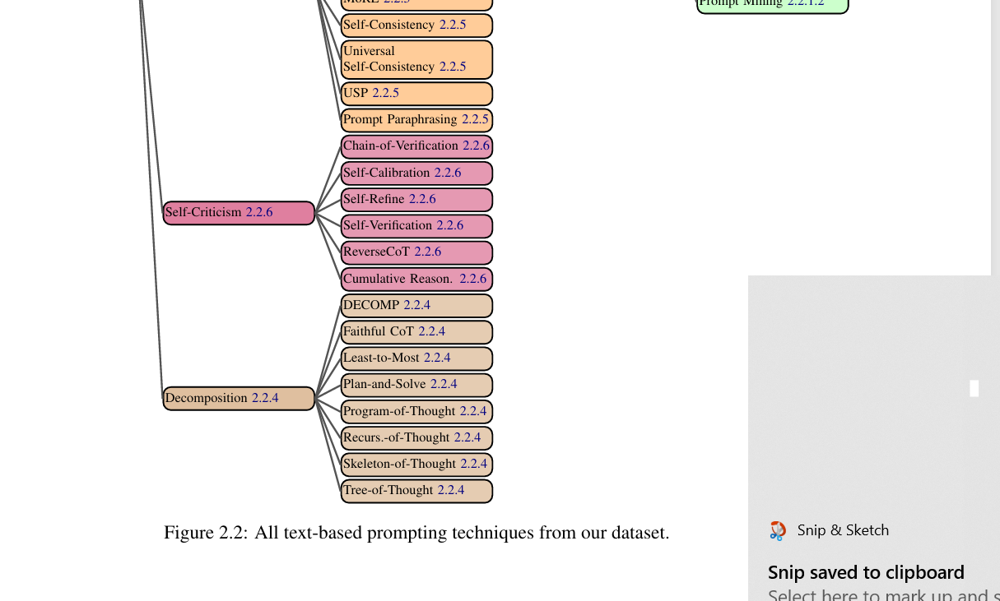

All text-based prompting techniques from our dataset. (Tất cả các kỹ thuật nhắc nhở dựa trên văn bản từ tập dữ liệu của chúng tôi.)

Sơ đồ tất cả các Prompting techniques trước tháng 7 năm 2024

***Example Ordering***

Example Ordering

The order of few-shot examples in the prompt can affect LLM outputs 1234*. Consider permutating the order of these examples in your prompt to achieve better results.

Choosing Your Examples

Depending on your use-case, here are a few different methods that you can consider using to improve the quality of your examples.

Combinatorics

One of the easiest methods is for us to manually iterate over each of the examples that we have and try all possible combinations we could create. This will in turn allow us to find the best combination that we can find.

[KATE](https://arxiv.org/pdf/2101.06804)

KATE (k-Nearest Example Tuning) is a method designed to enhance GPT-3's performance by selecting the most relevant in-context examples. The method involves:

For each example in the test set, K nearest neighbors (examples) are retrieved based on semantic similarity. Among these K examples, those that appear most frequently across different queries are selected as the best in-context examples.

[Using a Unsupervised Retriever](https://aclanthology.org/2022.naacl-main.191.pdf)

Retriever Image
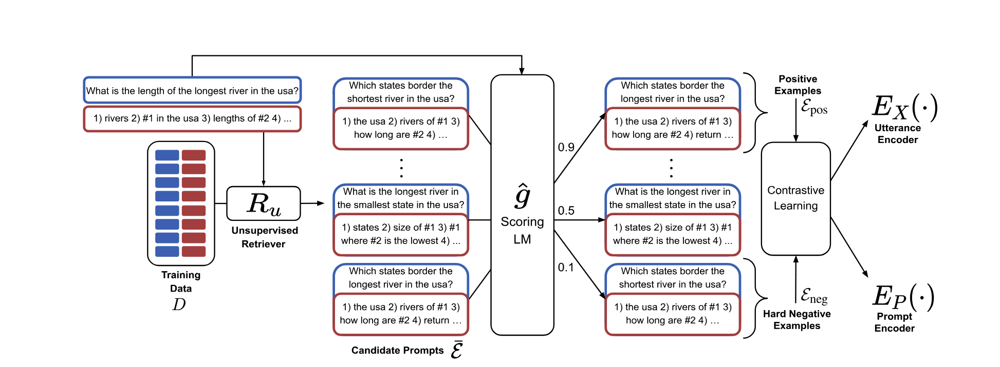

We can use a large LLM to compute a single score for each example with respect to a given prompt. This allows us to create a training set that scores an example's relevance when compared against a prompt. Using this training set, we can train a model that mimics this functionality. This allows us to determine the top k most relevant and most irrelevant examples when a user makes a query so that we can include this in our final prompt.

***Select Effective Examples***

We can select effective in-context examples by choosing those that are semantically closer to the query using [KNN](https://arxiv.org/abs/2101.06804). [Chúng ta có thể chọn các ví dụ phù hợp với ngữ cảnh hiệu quả bằng cách chọn những ví dụ gần với truy vấn hơn về mặt ngữ nghĩa bằng KNN.] x

In the below implementation using instructor, we follow these steps: [Trong phần triển khai dưới đây bằng cách sử dụng instructor, chúng tôi thực hiện theo các bước sau:] x

Embed the query examples [Nhúng các ví dụ truy vấn] x
Embed the query that we want to answer [Nhúng truy vấn mà chúng tôi muốn trả lời] x
Find the k query examples closest to the query [Tìm k ví dụ truy vấn gần nhất với truy vấn] x
Use the chosen examples and their as the context for the LLM [Sử dụng các ví dụ đã chọn và chúng làm bối cảnh cho LLM] x

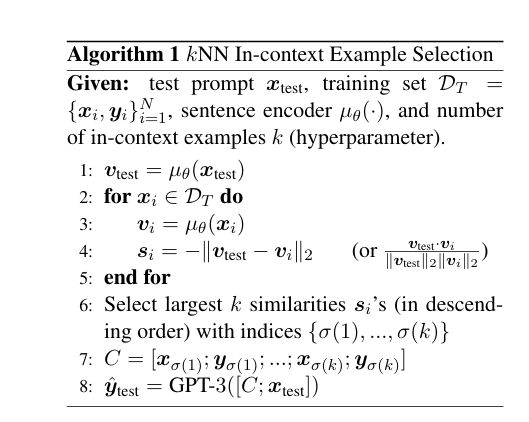

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 22.5 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
import openai
from pydantic import BaseModel
import math
from textwrap import dedent

In [ ]:
oai = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(oai)

class Example(BaseModel):
    question: str
    answer: str

class Response(BaseModel):
    answer: str

def distance(a: list[float], b: list[float]):
  return 1 - sum(ai*bi for ai, bi in zip(a, b)) / (math.sqrt(sum(ai*ai for ai in a)) * math.sqrt(sum(bi*bi for bi in b)))

def embed_queries(queries: list[str])-> list[tuple[list[float], str]]:
  return [
      (embedding_item.embedding, query)
      for embedding_item, query in zip(
          oai.embeddings.create(input=queries, model="text-embedding-3-large").data,
          queries,
      )
  ]

def knn(
    embedded_examples: list[tuple[list[float], str]],
    query_embedding: list[float],
    k=int,
):
    distances = [
        (distance(embedding, query_embedding),example)
        for embedding, example in embedded_examples
    ]
    distances.sort(key=lambda x:x[0])
    return distances[:k]

def generate_response(examples: list[str], query: str):
  formatted_examples = "\n".join(examples)
  return client.chat.completions.create(
      model='gpt-4o-mini',
      response_model=Response,
      messages=[
          {
              'role':'user',
              'content': dedent(
                  f"""
                  Respond to the following query with the most accurate
                  and consine answer possible.
                  <examples>
                  {formatted_examples}
                  <\examples>
                  <query>
                  {query}
                  <query>
                  """
              )
          }
      ]
  )


def generate_question_and_answer_pair(
    questions: list[str], question_and_answers: list[dict[str, str]]
)->list[str]:
    question_to_answer = {}

    for question in question_and_answers:
        question_to_answer[question['question']] = question['answer']
    return [
        dedent(
            f"""
        <example>
        <question>{question}</question>
        <answer>{question_to_answer[question]}</answer>
        </example>
        """
        )
        for question in questions
    ]



In [ ]:
examples = [
    {"question": "What is the capital of France?", "answer": "Paris"},
    {"question": "Who wrote Romeo and Juliet", "answer": "Shakespeare"},
    {"question": "What is the capital of Germany?", "answer": "Berlin"},
]

query = "What is the capital of Italy?"

# Step 1 : Embed the Examples
embeddings = embed_queries([example["question"] for example in examples] + [query])

embedded_examples = embeddings[:-1]
embedded_query = embeddings[-1]

In [ ]:
embedded_query[1]

'What is the capital of Italy?'

In [ ]:
embedded_query[0]

[-0.04797801747918129,
 0.043220195919275284,
 -0.011244847439229488,
 0.042580489069223404,
 -0.06620965898036957,
 -0.01792178861796856,
 0.018991298973560333,
 -0.010325268842279911,
 -0.0537753589451313,
 -0.013034028001129627,
 0.01924118399620056,
 0.004145600367337465,
 -0.04989713802933693,
 -0.038462378084659576,
 -0.016722338274121284,
 0.0026887680869549513,
 -0.000763400224968791,
 0.020570574328303337,
 -0.026747744530439377,
 0.0017616928089410067,
 0.01336387638002634,
 0.023129401728510857,
 -0.030526012182235718,
 -0.03452417999505997,
 -0.015852736309170723,
 0.01421348750591278,
 0.0228895116597414,
 0.004340511281043291,
 0.021869979798793793,
 0.017581943422555923,
 0.06265129148960114,
 0.0009214527672156692,
 0.06381075829267502,
 0.01773187518119812,
 -0.0260880459100008,
 0.022649621590971947,
 0.00880096759647131,
 0.0010107868583872914,
 0.015063097700476646,
 0.04769814386963844,
 0.03258506953716278,
 -0.015702804550528526,
 0.009870477020740509,
 0.0475382

In [ ]:
# # Step 3: Find the k closest examples to the query
k_closest_examples = knn(embedded_examples, embedded_query[0], 2)

for example in k_closest_examples:
    print(example)
    #> (0.4013468481736857, 'What is the capital of France?')
    #> (0.4471368596136872, 'What is the capital of Germany?')

# Step 4: Use these examples as in-context examples
formatted_examples = generate_question_and_answer_pair(
    [example[1] for example in k_closest_examples], examples
)

(0.4013468481736857, 'What is the capital of France?')
(0.4471368596136872, 'What is the capital of Germany?')


In [ ]:
formatted_examples

['\n<example>\n<question>What is the capital of France?</question>\n<answer>Paris</answer>\n</example>\n',
 '\n<example>\n<question>What is the capital of Germany?</question>\n<answer>Berlin</answer>\n</example>\n']

In [ ]:
response = generate_response(formatted_examples, query)
print(response.answer)

Rome


### Thought Generation

#### **Chain-Of-Thought (Zero-Shot)**


#####**Generate Examples First**

 1 . ***SELF-GENERATED EXEMPLARS***

Problem : Phương pháp gợi ý "Chain-of-thought" (CoT) dành cho các mô hình ngôn ngữ đã cho thấy hiệu suất ấn tượng trong các tác vụ suy luận, nhưng thường cần các ví dụ được gán nhãn của quá trình suy luận. Trong công trình này, chúng tôi giới thiệu một phương pháp gợi ý mới, **analogical prompting** (gợi ý tương tự), được thiết kế để tự động hướng dẫn quá trình suy luận của các mô hình ngôn ngữ lớn.

Lấy cảm hứng từ suy luận tương tự, một quá trình nhận thức mà con người sử dụng các kinh nghiệm quá khứ có liên quan để giải quyết các vấn đề mới, phương pháp này gợi ý cho các mô hình ngôn ngữ tự tạo ra các ví dụ hoặc kiến thức có liên quan trong ngữ cảnh trước khi tiến hành giải quyết vấn đề được đưa ra.

Phương pháp này mang lại một số lợi thế đáng kể:
- Loại bỏ nhu cầu gán nhãn hoặc truy xuất các ví dụ, giúp phương pháp trở nên phổ quát và tiện lợi hơn.
- Có thể điều chỉnh các ví dụ và kiến thức được tạo ra để phù hợp với từng vấn đề, mang lại tính thích ứng cao.

Kết quả thực nghiệm cho thấy phương pháp này vượt trội so với CoT không có ngữ cảnh (0-shot CoT) và CoT với một số ví dụ thủ công (manual few-shot CoT) trong nhiều tác vụ suy luận khác nhau, bao gồm:
- Giải toán trên các bộ dữ liệu GSM8K và MATH,
- Sinh mã trong Codeforces,
- Và các tác vụ suy luận khác thuộc BIG-Bench.

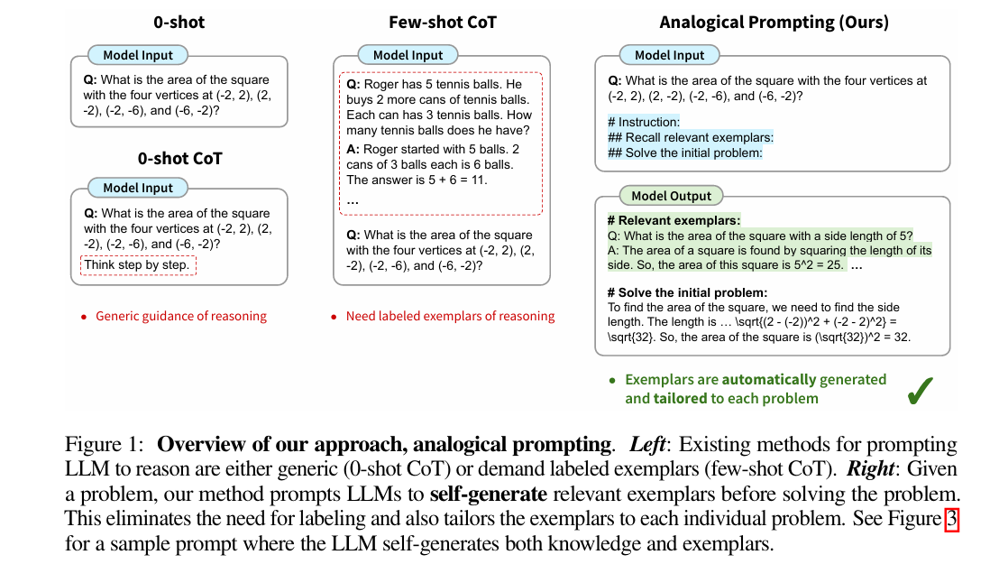

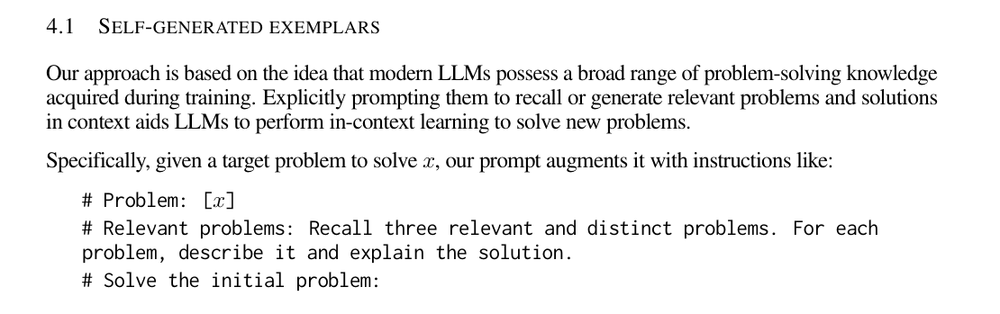

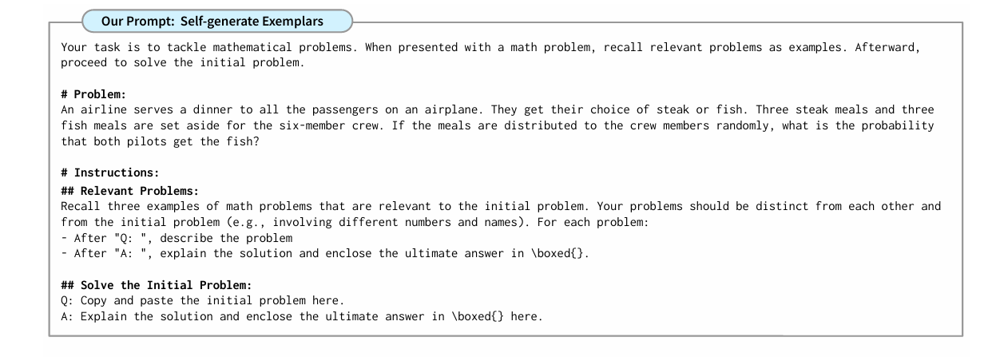

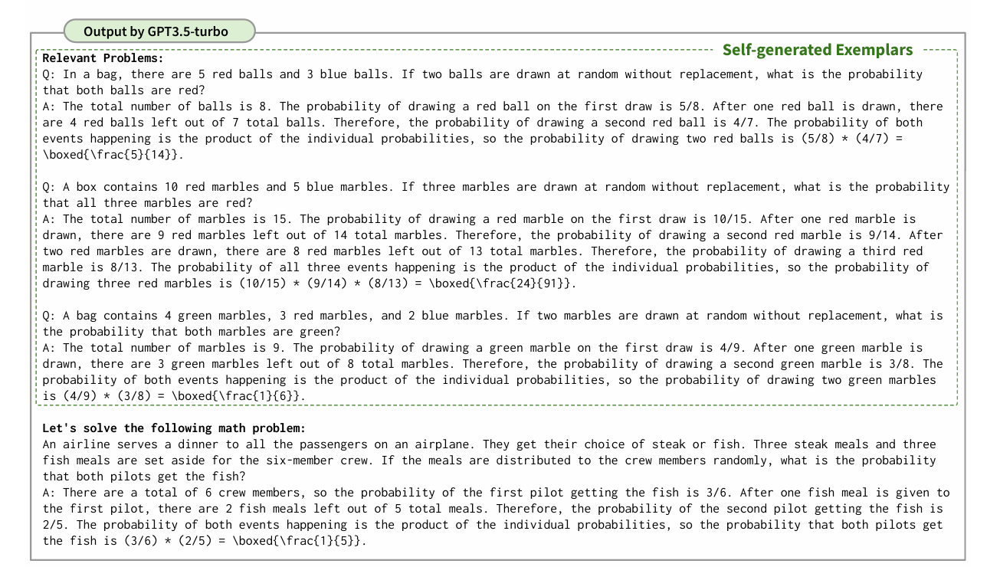

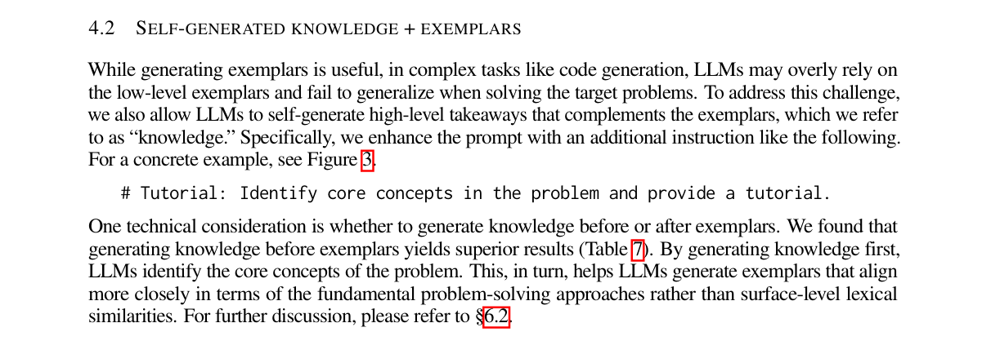

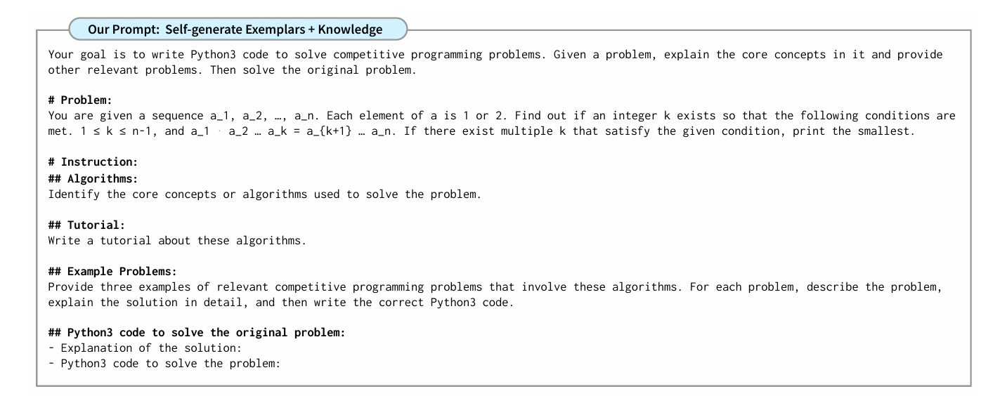

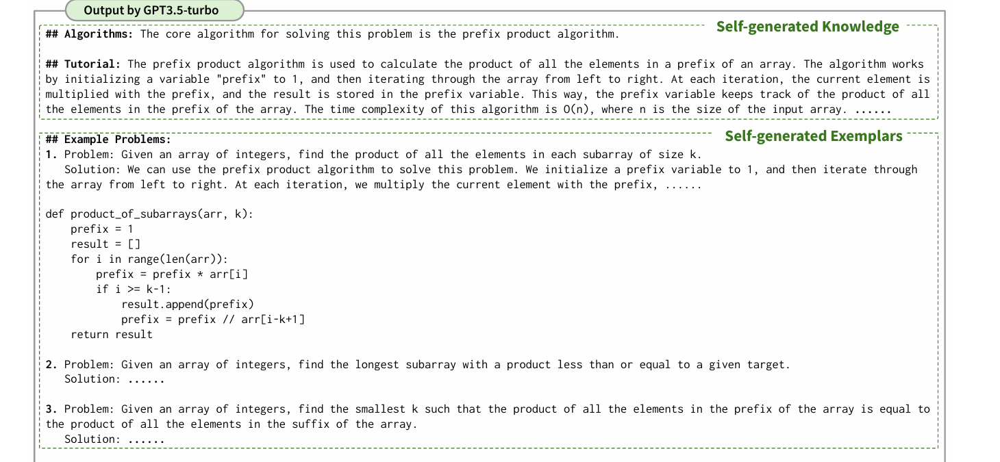

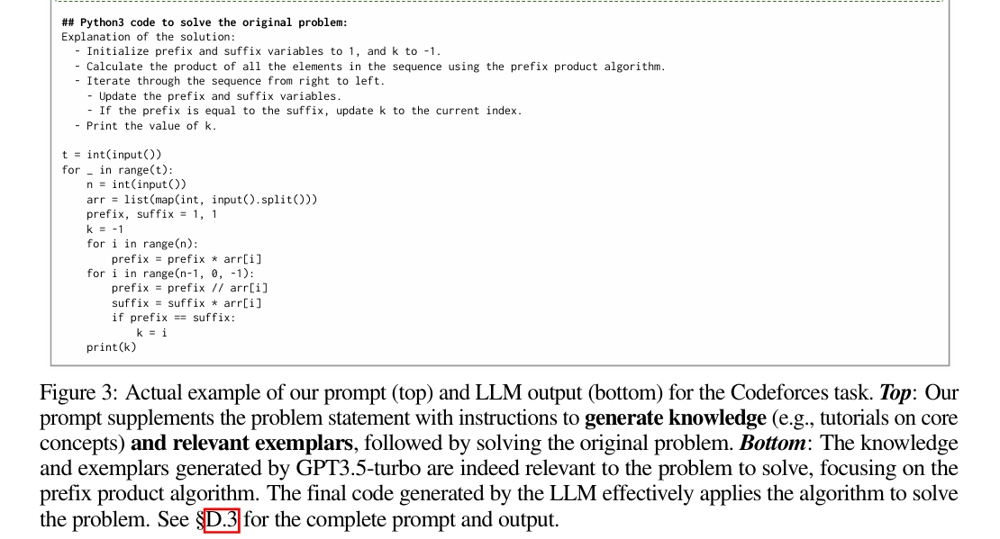

Ví dụ thực tế về lời nhắc (trên) và đầu ra LLM (dưới) của chúng tôi cho tác vụ Codeforces. Top: Lời nhắc của chúng tôi bổ sung cho tuyên bố vấn đề với các hướng dẫn để tạo ra kiến thức (ví dụ: hướng dẫn về các khái niệm cốt lõi) và các ví dụ có liên quan, tiếp theo là giải quyết vấn đề ban đầu. Dưới cùng: Kiến thức và ví dụ được tạo ra bởi GPT3.5-turbo thực sự có liên quan đến vấn đề cần giải quyết, tập trung vào thuật toán sản phẩm tiền tố. Mã cuối cùng được tạo bởi LLM áp dụng hiệu quả thuật toán để giải quyết vấn đề. Xem §D.3 để biết lời nhắc và đầu ra hoàn chỉnh

[Analogical Prompting1](https://arxiv.org/pdf/2310.01714) is a method that aims to get LLMs to generate examples that are relevant to the problem before starting to address the user's query. [Nhắc nhở tương tự1 là một phương pháp nhằm mục đích khiến LLM tạo ra các ví dụ có liên quan đến vấn đề trước khi bắt đầu giải quyết truy vấn của người dùng.] x

This takes advantage of the various forms of knowledge that the LLM has acquired during training and explicitly prompts them to recall the relevant problems and solutions. We can use Analogical Prompting using the following template [Điều này tận dụng các dạng kiến ​​thức khác nhau mà LLM đã có được trong quá trình đào tạo và nhắc nhở họ nhớ lại các vấn đề và giải pháp liên quan một cách rõ ràng. Chúng ta có thể sử dụng Lời nhắc tương tự bằng cách sử dụng mẫu sau]

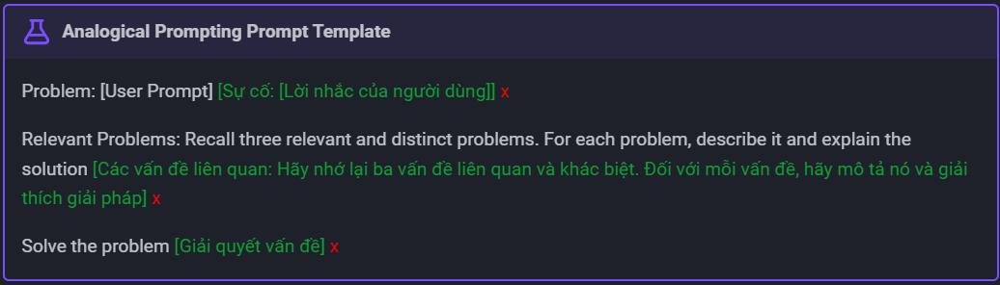

In [ ]:
!pip install instructor

In [ ]:
from openai import OpenAI
from pydantic import BaseModel, Field
import instructor
from textwrap import dedent

client = OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class RelevantProblem(BaseModel):
    problem_explanation: str
    solution: str


class Response(BaseModel):
    relevant_problems: list[RelevantProblem] = Field(
        max_length=3,
        min_length=3,
    )
    answer: RelevantProblem


def analogical_prompting(query: str):
    return client.chat.completions.create(
        messages=[
            {
                "role": "user",
                "content": dedent(
                    f"""
                <problem>
                {query}
                </problem>

                Relevant Problems: Recall three relevant and
                distinct problems. For each problem, describe
                it and explain the solution before solving
                the problem

                Solve the initial problem:
                """
                ),
            }
        ],
        model="gpt-4o-mini",
        response_model=Response,
    )

In [ ]:
if __name__ == "__main__":
    query = (
        "What is the area of the square with the four "
        "vertices at (-2, 2), (2, -2), (-2, -6), and "
        "(-6, -2)?"
    )
    response = analogical_prompting(query)
    for problem in response.relevant_problems:
        print(problem.model_dump_json(indent=2))
        """
        {
          "problem_explanation": "Determine the distance
          between two points in a coordinate plane.",
          "solution": "To find the distance between two
          points, use the distance formula: \\(d =
          \\sqrt{(x_2 - x_1)^2 + (y_2 - y_1)^2}\\). This
          formula calculates the Euclidean distance between
          points (x_1, y_1) and (x_2, y_2)."
        }
        """
        """
        {
          "problem_explanation": "Calculate the area of a
          square given its side length.",
          "solution": "The area of a square can be found
          using the formula: \\(A = s^2\\), where \\(s\\) is
          the length of one side of the square."
        }
        """
        """
        {
          "problem_explanation": "Identify vertices and
          properties of a geometry shape such as
          parallelogram.",
          "solution": "For any quadrilateral, verify that
          all sides are equal and angles are right angles to
          confirm it is a square. Use properties of
          quadrilaterals and distance formula."
        }
        """

    print(response.answer.model_dump_json(indent=2))
    """
    {
      "problem_explanation": "Calculate the area of a
      square given its vertices.",
      "solution": "First, confirm the shape is a square by
      checking the distance between consecutive vertices
      and ensuring all sides are of equal length using the
      distance formula. For vertices (-2,2), (2,-2),
      (-2,-6), and (-6,-2), calculate distances between
      consecutive points. If distances are equal, use the
      side length to compute area using \\(A = s^2\\)."
    }
    """

{
  "problem_explanation": "Finding the area of a rectangle given its vertices.",
  "solution": "To find the area of a rectangle, we need to determine the lengths of its sides. This can be done by calculating the distance between pairs of vertices diagonally opposite each other. The area is then given by the formula: Area = length × width."
}
{
  "problem_explanation": "Calculating the distance between two points in a coordinate plane.",
  "solution": "The distance d between two points (x1, y1) and (x2, y2) in a coordinate plane can be calculated using the distance formula: d = √((x2 - x1)² + (y2 - y1)²)."
}
{
  "problem_explanation": "Determining the coordinates of the center of a square given its vertices.",
  "solution": "The center of a square can be calculated by finding the midpoint of the line segment connecting two opposite vertices. The midpoint M of a line segment between points (x1,y1) and (x2,y2) is given by M = ((x1 + x2)/2, (y1 + y2)/2)."
}
{
  "problem_explanation": "To 

In [ ]:
!pip install g4f

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 622.7/622.7 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 69.0 MB/s eta 0:00:00


In [ ]:
from g4f.client import Client

client = Client()
response = client.chat.completions.create(
    model="gpt-4o-mini",
    messages=[{"role": "user", "content": "What is the area of the square with the four "
        "vertices at (-2, 2), (2, -2), (-2, -6), and "
        "(-6, -2)?"}],
    # Add any other necessary parameters
)
print(response.choices[0].message.content)

In [ ]:
response.choices[0].message.content

''

2.  SELF-GENERATED KNOWLEDGE + EXEMPLARS

` # Tutorial: Identify core concepts in the problem and provide a tutorial`

In [ ]:
from openai import OpenAI
from pydantic import BaseModel, Field
import instructor
from textwrap import dedent

client = OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class Algorithms(BaseModel):
  algorithms: str = Field(description='Identify the core concepts or algorithms used to solve the problem.')

class Tutorial(BaseModel):
  tutorial: str = f'Write a tutorial about these {Algorithms}.'

class Problem(BaseModel):
  problem: str
  solution: str

class Example(BaseModel):
  example_problems: list[Problem] = Field('Provide three examples of relevant competitive programming problems that involve these algorithms. For each problem, describe the problem, explain the solution in detail, and then write the correct Python3 code.'
    )
  answer: Problem

def Self_generate_Exemplars_Knowledge(query: str):
    return client.chat.completions.create(
        messages=[
            {
                "role": "user",
                "content": dedent(
                    f"""
                <problem>
                {query}
                </problem>

                 Example Problems: Provide three examples of relevant competitive programming problems that involve these algorithms. For each problem, describe the problem,
                 explain the solution in detail, and then write the correct Python3 code.
                """
                ),
            }
        ],
        model="gpt-4o-mini",
        response_model=Example,
    )


In [ ]:

    query = ("You are given a sequence a_1, a_2, …, a_n. Each element of a is 1 or 2. Find out if an integer k exists so that the following conditions are met. 1 ≤ k ≤ n-1, and a_1 ⋅ a_2 … a_k = a_{k+1} … a_n. If there exist multiple k that satisfy the given condition, print the smallest.")
    response = Self_generate_Exemplars_Knowledge(query)
    print(response.answer)


problem='Find an integer k such that the product of a_1 to a_k equals the product of a_{k+1} to a_n in a sequence of 1s and 2s, with k in the range [1, n-1].' solution='To solve this, we first compute the total product of the entire sequence. Then, we initialize a prefix product variable to track the product of the first k elements and iterate through the sequence, updating this product. Throughout the iteration, we check if the prefix product equals the total product divided by the prefix product. The first match found in this way will be our result, yielding the smallest k where the condition holds true. If no such k is found, it will return -1, indicating impossibility.'


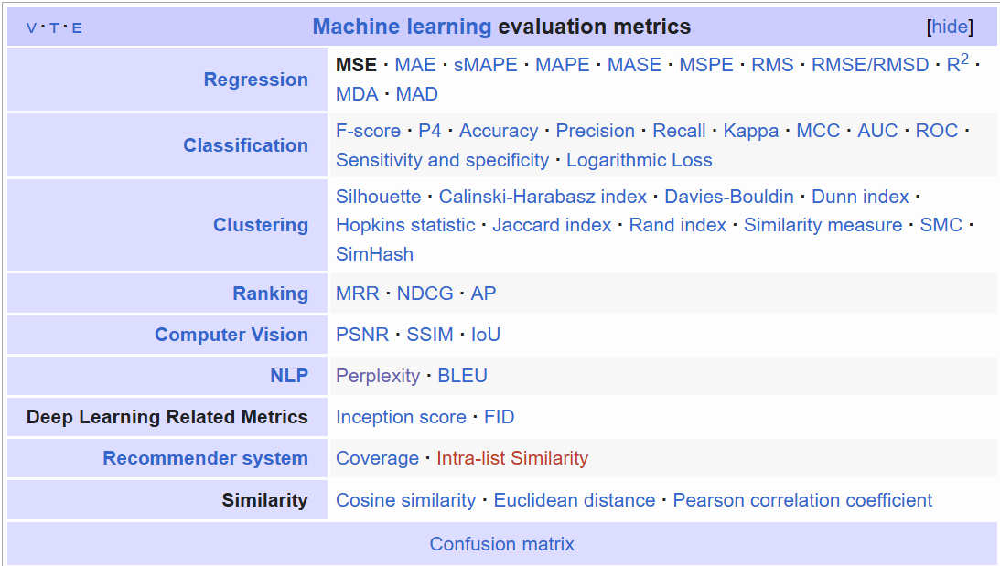

##### ***Consider Higher-Level Context***

How can we encourage an LLM to think through any high-level context required to answer a query? Step-back prompting encourages this in two steps:

[Làm cách nào chúng tôi có thể khuyến khích LLM suy nghĩ về bất kỳ bối cảnh cấp cao nào cần thiết để trả lời một truy vấn? Lời nhắc lùi lại khuyến khích điều này theo hai bước:] x

Abstraction: Ask the LLM a **generic, higher-level concept**. This is generally topic-specific. This is known as **the step-back question**.

[Tính trừu tượng: Hỏi LLM một khái niệm chung, cấp độ cao hơn. Đây thường là chủ đề cụ thể. Đây được gọi là câu hỏi bước lùi.] x

Reasoning: Ask the LLM the **original question**, given its answer to the **abstract question**. This is known as **abstracted-grounded reasoning**.

[Lý do: Hỏi LLM câu hỏi ban đầu, đưa ra câu trả lời cho câu hỏi trừu tượng. Điều này được gọi là lý luận có căn cứ trừu tượng.] x

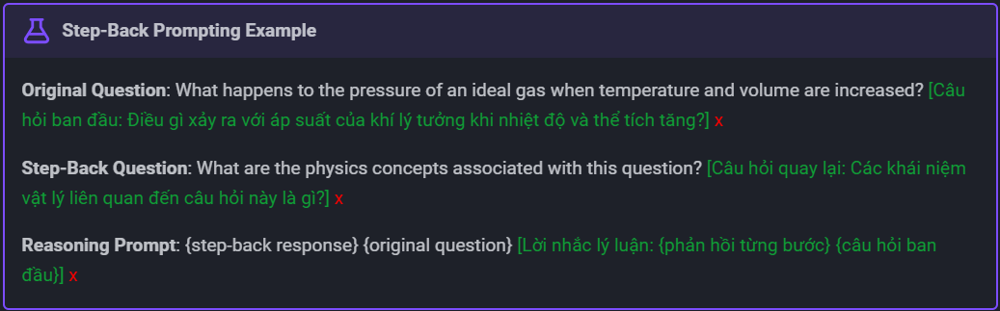

Note that the step-back question is also generated using an LLM query.
[Lưu ý rằng câu hỏi lùi lại cũng được tạo bằng truy vấn LLM.] x

Step-back prompting has been shown to improve scores on reasoning benchmarks for PaLM-2L and GPT-4.* `

[Tính năng nhắc lùi từng bước đã được chứng minh là giúp cải thiện điểm số trên các điểm chuẩn suy luận cho PaLM-2L và GPT-4.*] x

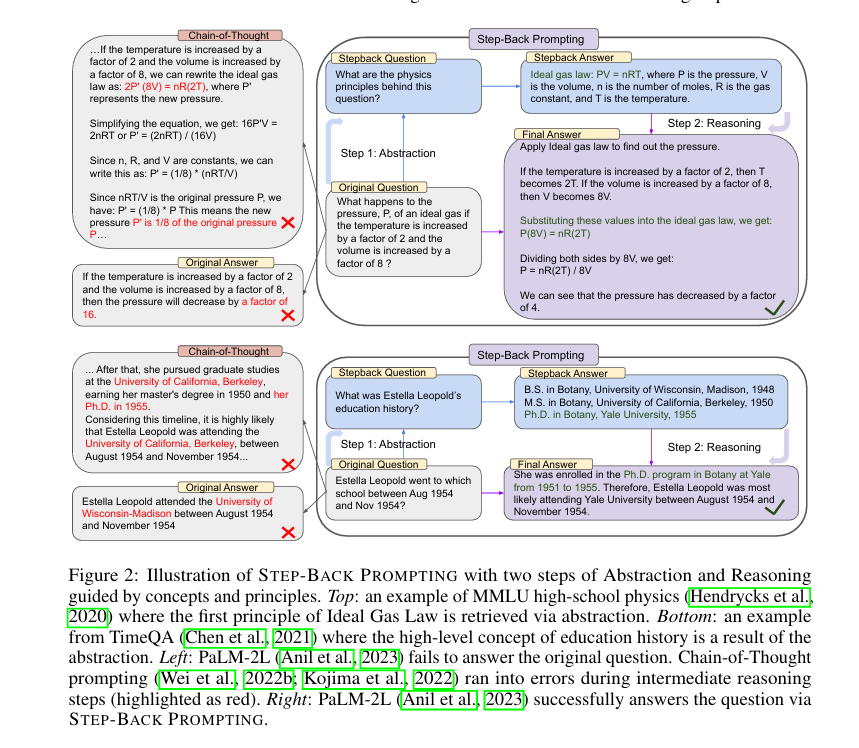

 In short, STEP-BACK PROMPTING consists two simple steps:

    • Abstraction: Instead of addressing the question directly, we first prompt the LLM to ask a generic
    step-back question about a higher-level concept or principle, and retrieve relevant facts about the
    high-level concept or principle. The step-back question is unique for each task in order to retrieve
    the most relevant facts.

    • Reasoning: Grounded on the facts regarding the high-level concept or principle, the LLM can
    reason about the solution to the original question. We term this as Abstraction-grounded Reasoning.
    In the following sections, we present an empirical study of STEP-BACK PROMPTING on a range of
    challenging tasks covering STEM, Knowledge QA, and Multi-Hop Reasoning involving complex
    reasoning.

**Kỹ thuật STEP-BACK PROMPTING (Nhắc nhở bước lùi)** **được thúc đẩy bởi quan sát rằng nhiều tác vụ chứa đựng rất nhiều chi tiết, và rất khó để các mô hình ngôn ngữ lớn (LLMs) truy xuất các thông tin liên quan để giải quyết tác vụ**. Như được minh họa trong ví dụ đầu tiên (hình trên, Hình 2), đối với một câu hỏi Vật lý:

*"Điều gì sẽ xảy ra với áp suất, P, của một chất khí lý tưởng nếu nhiệt độ tăng gấp 2 lần và thể tích tăng gấp 8 lần?"*,

LLM có thể đi lệch khỏi nguyên lý cơ bản của Định luật Khí lý tưởng khi suy luận trực tiếp từ câu hỏi. Tương tự, một câu hỏi như

*"Estella Leopold đã học ở trường nào trong khoảng thời gian từ tháng 8 năm 1954 đến tháng 11 năm 1954?"*

rất khó để trả lời trực tiếp do yêu cầu ràng buộc thời gian chi tiết. Trong cả hai trường hợp, đặt một câu hỏi "bước lùi" có thể giúp mô hình giải quyết vấn đề hiệu quả hơn.

Chúng tôi định nghĩa một câu hỏi "bước lùi" là một câu hỏi dẫn xuất từ câu hỏi gốc, nhưng ở một mức độ trừu tượng cao hơn. Ví dụ, thay vì hỏi trực tiếp

*"Estella Leopold đã học trường nào trong một khoảng thời gian cụ thể?"*,

một câu hỏi "bước lùi" (Hình 2, hình dưới) có thể là về

*"lịch sử học vấn của Estella Leopold"*,

một khái niệm cấp cao bao quát câu hỏi ban đầu. Việc trả lời câu hỏi bước lùi

*"lịch sử học vấn của Estella Leopold"*

trong trường hợp này sẽ cung cấp tất cả thông tin cần thiết để suy luận về câu hỏi cụ thể

*"Estella Leopold đã học trường nào trong một khoảng thời gian cụ thể?"*.

Tiền đề của phương pháp này là câu hỏi bước lùi thường dễ trả lời hơn. Dựa trên suy luận từ những trừu tượng này giúp tránh các lỗi suy luận ở các bước trung gian, như ví dụ trong Hình 2 (bên trái) minh họa lỗi trong phương pháp "Chain-of-Thought".

Tóm lại, STEP-BACK PROMPTING gồm hai bước đơn giản:

1. **Trừu tượng hóa (Abstraction):** Thay vì xử lý câu hỏi trực tiếp, chúng tôi đầu tiên nhắc LLM đặt ra một câu hỏi tổng quát hơn về một khái niệm hoặc nguyên tắc cấp cao, và truy xuất các thông tin liên quan đến khái niệm hoặc nguyên tắc cấp cao đó. Câu hỏi bước lùi này là duy nhất cho mỗi tác vụ để đảm bảo truy xuất được thông tin phù hợp nhất.

2. **Suy luận (Reasoning):** Dựa trên các thông tin về khái niệm hoặc nguyên tắc cấp cao, LLM có thể suy luận để giải quyết câu hỏi ban đầu. Chúng tôi gọi đây là "Suy luận dựa trên trừu tượng hóa" (**Abstraction-grounded Reasoning**).

Trong các phần tiếp theo, chúng tôi sẽ trình bày một nghiên cứu thực nghiệm về STEP-BACK PROMPTING trên nhiều tác vụ thách thức bao gồm các lĩnh vực STEM, câu hỏi kiến thức (Knowledge QA), và suy luận nhiều bước (Multi-Hop Reasoning) liên quan đến các quá trình suy luận phức tạp.

Tức là các câu hỏi về liên quan đến dòng thời gian hay các câu hỏi liên quan đến lĩnh vực cụ thể LLM khó có thể cung cấp đúng câu trả lời vì nó chứa nhiều kiến thức hay dòng thời gian khác nhau. Nơi mà LLM không thể xử lý tất cả vì sự giới hạn về token hay tài nguyên tính toán.

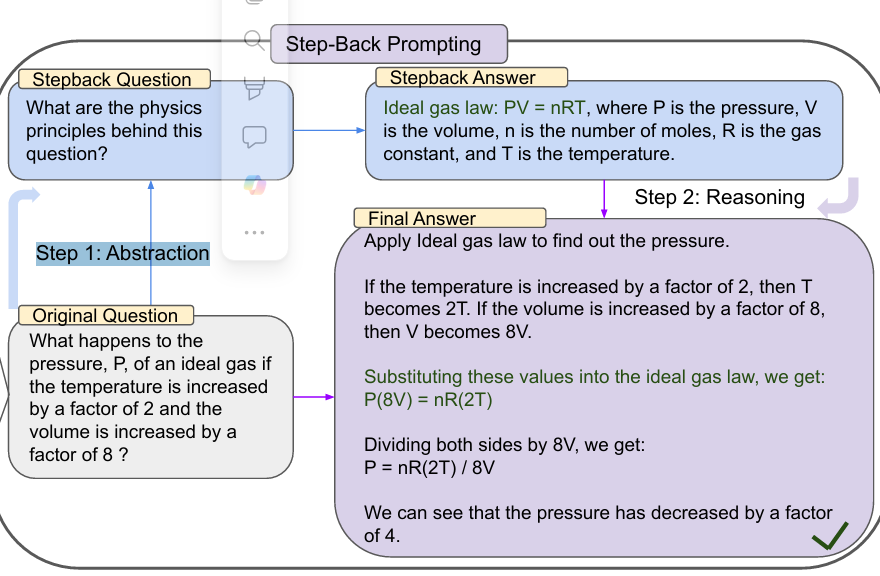


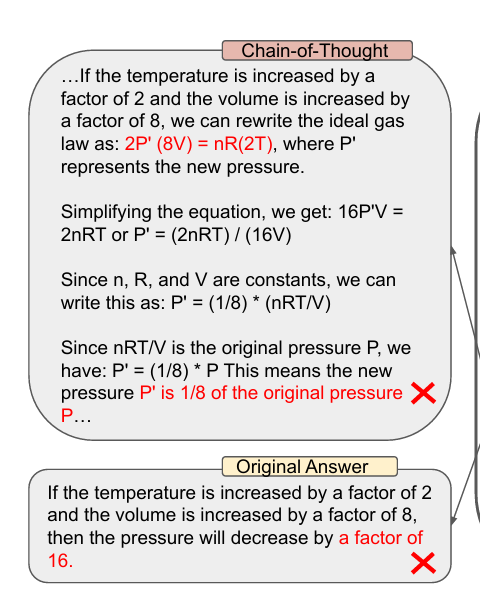

Ở LLM nhỏ và sử dụng prompt COT chúng không có một step Abstraction nơi mà LLMs bước lùi để tìm ra một khái niệm hay công thức đúng về các lĩnh vực cụ thể của câu trả lời. Vì vậy việc đầu ra sai điều rất bình thường.

Như đã thấy ở 2 ví dụ trên với step-back prompting việc step-back tìm ra một câu hỏi ( What are the physics
principles behind this
question?) và câu trả lời ( Ideal gas law: PV = nRT, where P is the pressure, V
is the volume, n is the number of moles, R is the gas
constant, and T is the temperature.)

Từ nội dung đã answer step-back. LLMs có thể kết hợp nội dung liên quan của answer step-back và câu hỏi ban đầu để có đáp án cuối cùng dựa trên nội dung chính xác

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 24.7 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import openai
import instructor
from pydantic import BaseModel
from typing import Iterable, Literal

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class Stepback(BaseModel):
    original_question: str
    abstract_question: str


class Responsestepback(BaseModel):
    answer_stepback: str

class Response(BaseModel):
    answer: str


def generate_stepback_question(query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Stepback,
        messages=[
            {
                "role": "user",
                "content": f"""
                You are an expert at world knowledge. Your task is to step back
                and paraphrase a question to a more generic step-back question,
                which is easier to answer.
                {query}
                """,
            },
        ],
    )


def ask_stepback_question(stepback):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Responsestepback,
        messages=[
            {"role": "user", "content": stepback.abstract_question},
        ],
    )


def get_final_response(stepback, stepback_response):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "user",
                "content": f"""
                Q: {stepback.abstract_question},
                A: {stepback_response}
                Q: {stepback.original_question}
                A:
                """,
            },
        ],
    )

In [ ]:
query = ('What happens to the pressure, P, of an ideal gas if the temperature is increased by a factor of 2 and the volume is increased by a factor of 8 ?')
stepback = generate_stepback_question(query)
print(stepback.original_question)
#> Estella Leopold went to which school between Aug 1954 and Nov 1954?
print(stepback.abstract_question)
#> Which schools did Estella Leopold attend in her life?

# Ask the step-back question


What happens to the pressure, P, of an ideal gas if the temperature is increased by a factor of 2 and the volume is increased by a factor of 8?
How does changing the temperature and volume of a gas affect its pressure?


AttributeError: 'function' object has no attribute 'answer_stepback'

In [ ]:
stepback_response = ask_stepback_question(stepback)

for answer in stepback_response:
    print(answer)

print("---------------------")
final_response = get_final_response(stepback, stepback_response)
print(final_response.answer)

('answer_stepback', "Changing the temperature and volume of a gas affects its pressure according to the gas laws. 1. **Ideal Gas Law (PV = nRT)**: This law describes the relationship between pressure (P), volume (V), temperature (T), and the number of moles (n) of a gas. Here, R is the ideal gas constant. From this law, we can derive two key relationships:\n   - **Volume and Pressure (Boyle's Law)**: At constant temperature, if the volume of a gas decreases, the pressure increases, and vice versa. \n   - **Temperature and Pressure (Gay-Lussac's Law)**: At constant volume, increasing the temperature of a gas will increase its pressure, and decreasing the temperature will decrease the pressure. 2. **Charles's Law**: At constant pressure, the volume of a gas is directly proportional to its temperature in Kelvin. Hence, if the volume increases, the temperature must also increase to maintain the pressure constant. In summary, increasing temperature generally increases pressure if volume is 

In [ ]:
response = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {"role": "user", "content": {query}},
        ],
    )

In [ ]:
response

Response(answer="To understand how the pressure of an ideal gas changes with temperature and volume, we can use the ideal gas law, which is given by the equation:\n\n\\[ PV = nRT \\]\n\nWhere:\n- \\( P \\) is the pressure,\n- \\( V \\) is the volume,\n- \\( n \\) is the number of moles of gas,\n- \\( R \\) is the ideal gas constant, and\n- \\( T \\) is the temperature in Kelvin.\n\nIf the temperature is increased by a factor of 2, we can express the new temperature \\( T' \\) as:\n\n\\[ T' = 2T \\]\n\nIf the volume is increased by a factor of 8, the new volume \\( V' \\) is:\n\n\\[ V' = 8V \\]\n\nNow we can substitute these new values into the ideal gas law:\n\n\\[ P' V' = nRT' \\]\n\nReplacing \\( V' \\) and \\( T' \\):\n\n\\[ P' (8V) = nR(2T) \\]\n\nSimplifying this gives:\n\n\\[ P' \\cdot 8V = 2nRT \\]\n\nNow, we'll divide both sides by \\( 8V \\):\n\n\\[ P' = \\frac{2nRT}{8V} \\]\n\nThis can be further simplified to:\n\n\\[ P' = \\frac{nRT}{4V} \\]\n\nSince \\( P = \\frac{nRT}{V} \

##### ***Examine The Context***

By **encouraging our model to examine each source** in the provided context, we can help **mitigate the impact of irrelevant context**. This improves reasoning performance and the final output. This is known as Thread Of Thought 1.

[Bằng cách khuyến khích mô hình của chúng tôi kiểm tra từng nguồn trong bối cảnh được cung cấp, chúng tôi có thể giúp giảm thiểu tác động của bối cảnh không liên quan. Điều này cải thiện hiệu suất lý luận và đầu ra cuối cùng. Điều này được gọi là Chủ đề Suy nghĩ 1.] x

We can implement Thread Of Thought using the following template.

[Chúng ta có thể triển khai Thread Of Thought bằng mẫu sau.]

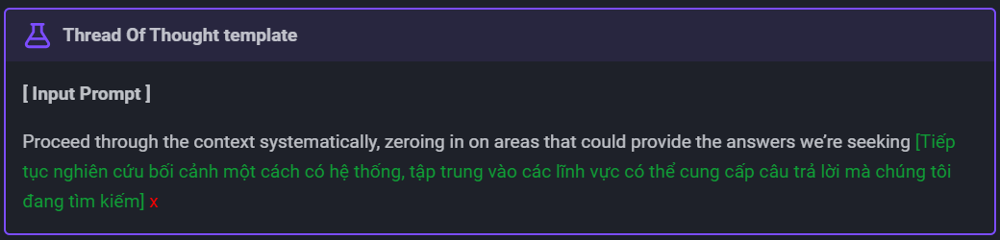

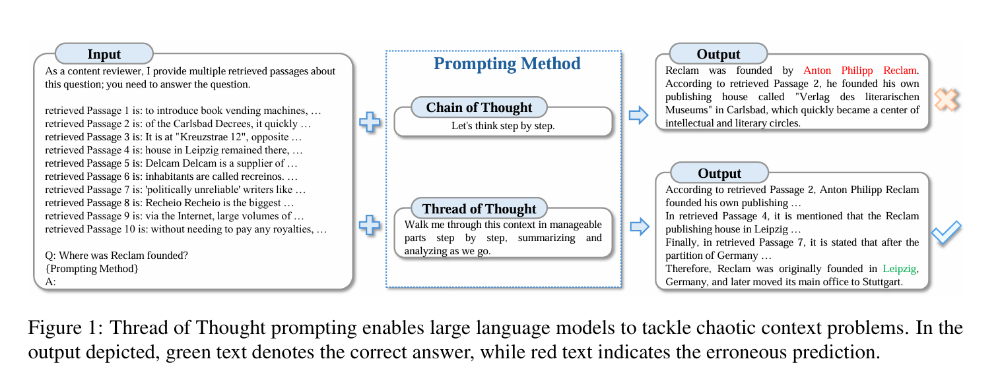

In [ ]:
import instructor
import openai
from pydantic import BaseModel, Field
from textwrap import dedent

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class ThreadOfThoughtResponse(BaseModel):
    analysis: list[str] = Field(
        description="""An explanation for each relevant source explaining
        its relevance and content""",
    )
    correct_answer: int


def analyze_context_and_generate_response(query: str, context: list[str]):
    return client.chat.completions.create(
        model="gpt-4o",
        response_model=ThreadOfThoughtResponse,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                    You are an expert Question Answerer.

                    Here are all of the sources that you should refer to
                    for context:
                    {'\n'.join(context)}
                """
                ),
            },
            {
                "role": "user",
                "content": query,
            },
            {
                "role": "assistant",
                "content": dedent(
                    """
                    Navigate through the context incrementally,
                    identifying and summarizing relevant portions.
                    """
                ),
            },
        ],
    )


if __name__ == "__main__":
    context = [
        "The price of a house was $100,000 in 2024",
        """The Great Wall of China is not visible from space
        with the naked eye""",
        """Honey never spoils; archaeologists have found pots
        of honey in ancient Egyptian tombs that are over
        3,000 years old""",
        """The world's oldest known living tree is over 5,000
        years old and is located in California""",
        "The price of a house was $80,000 in 2023",
    ]
    query = "What was the increase in the price of a house from 2023 to 2024"
    response = analyze_context_and_generate_response(query, context)
    print(response.model_dump_json(indent=2))
    """
    {
      "analysis": [
        "The price of a house was $80,000 in 2023",
        "The price of a house was $100,000 in 2024"
      ],
      "correct_answer": 20000
    }
    """

SyntaxError: f-string expression part cannot include a backslash (<ipython-input-2-7abee0aff458>, line 34)

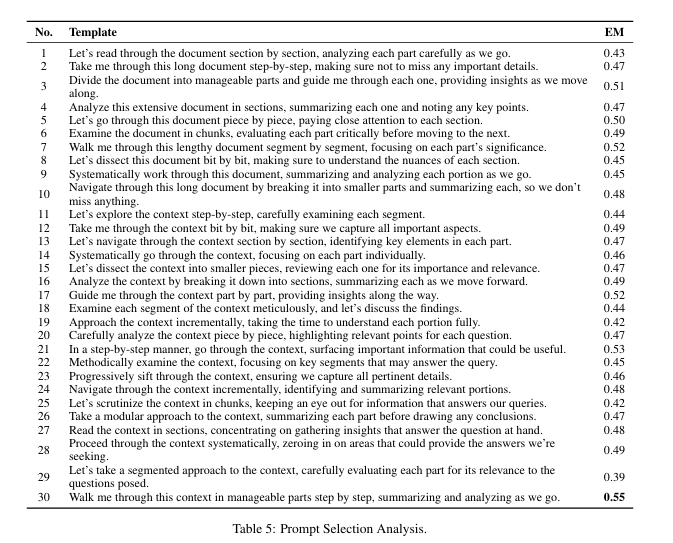

**3.1 Bước đầu tiên: Khởi tạo quá trình suy luận**  
Prompt ban đầu được thiết kế để hướng dẫn LLM phân tích và chia nhỏ ngữ cảnh một cách có hệ thống bằng cách sử dụng hướng dẫn:  “Walk me through this context in
 manageable parts step by step, summarizing and
 analyzing as we go”*. Cụ thể, chúng tôi sử dụng một mẫu (template) kết hợp ngữ cảnh phức tạp $ X $ và truy vấn $ Q $ vào prompt $ P $ theo định dạng:  

```
[X] Q: [Q] [T] A:
```  

Trong đó, $[T]$ là câu kích hoạt $ t $, khởi động quá trình suy luận. Ví dụ, sử dụng câu kích hoạt: * “Walk me through this context in
 manageable parts step by step, summarizing and
 analyzing as we go”*, prompt $ P $ trở thành:  

```
[X] Q: [Q]  “Walk me through this context in
 manageable parts step by step, summarizing and
 analyzing as we go” A:
```  

Văn bản đã được nhắc $ P $ sau đó được đưa vào LLM, **tạo ra các câu tiếp theo $ Z** $. Quy trình này được **mô phỏng dựa trên các chiến lược nhận thức của con người khi đối mặt với thông tin phức tạp, chia nhỏ thông tin thành các đoạn dễ tiêu hóa, chắt lọc các điểm quan trọng, và xử lý với sự tập trung liên tục**.  

Phương pháp này khuyến khích một dòng suy luận có cấu trúc và mạch lạc hơn, đặc biệt hữu ích trong các ngữ cảnh hỗn loạn.  

---

**3.2 Bước thứ hai: Tinh chỉnh kết luận**  
Prompt thứ hai xây dựng dựa trên dòng suy luận có cấu trúc từ bước đầu tiên, sử dụng một prompt khác để chắt lọc phân tích thành một câu trả lời rõ ràng. Dựa trên chuỗi suy nghĩ có tổ chức đã khởi tạo từ prompt đầu tiên, bước này nhằm mục đích nắm bắt ngắn gọn và rõ ràng bản chất của kết luận.  

Cụ thể, chúng tôi sử dụng một mẫu đơn giản để kết hợp văn bản prompt ban đầu $ P $, phản hồi $ Z $, và dấu hiệu kết luận $[A]$, như sau:  

```
[P] [Z] [A]
```  

Trong đó, $[A]$ là câu kích hoạt được thiết kế để trích xuất câu trả lời, chẳng hạn như: *“Therefore, the answer:”*. Prompt trích xuất này thúc đẩy quá trình suy luận của mô hình, yêu cầu mô hình xem xét lại toàn bộ phân tích và cô đọng điểm chính yếu thành câu trả lời cuối cùng.  

Thiết kế của prompt này là một chiến lược có chủ ý nhằm làm sắc nét sự tập trung của mô hình, thúc đẩy sự chính xác và rõ ràng trong phản hồi.  

---

Hệ thống nhắc hai tầng này giải quyết hiệu quả các hạn chế của các phương pháp trước đây mà không cần tái huấn luyện mô hình chuyên sâu hoặc sửa đổi phức tạp. Phương pháp của chúng tôi không chỉ tăng cường khả năng của mô hình trong việc xử lý các ngữ cảnh hỗn loạn mà còn điều chỉnh quy trình suy luận của mô hình gần gũi hơn với các mô thức nhận thức của con người.  

##### ***Exact Match (EM)***

In [ ]:
def compute_metrics(pred):
    squad_labels = pred.label_ids
    squad_preds = pred.predictions.argmax(-1)

    # Calculate Exact Match (EM)
    em = sum([1 if p == l else 0 for p, l in zip(squad_preds, squad_labels)]) / len(squad_labels)

    # Calculate F1-score
    f1 = f1_score(squad_labels, squad_preds, average='macro')

    return {
        'exact_match': em,
        'f1': f1
    }

 Các chỉ số đánh giá trong Q&A

- **F1 Score:** Đo lường **độ chính xác (precision)** và **độ bao phủ (recall)**, đánh giá xem các từ được chọn trong câu trả lời dự đoán có thực sự là một phần của câu trả lời đúng hay không.  
- **EM Score (Exact Match):** Là số lượng câu trả lời chính xác hoàn toàn (cùng vị trí bắt đầu và kết thúc). EM sẽ bằng 1 nếu các ký tự của câu trả lời mô hình dự đoán khớp chính xác với câu trả lời đúng.

 Cách tính toán:

- Hai chỉ số trên được tính cho từng cặp câu hỏi và câu trả lời (Q&A).
- Với một câu hỏi có nhiều câu trả lời đúng, **điểm tối đa** trên tất cả các câu trả lời đúng sẽ được sử dụng.
- Điểm tổng thể (Overall EM và F1) được tính bằng cách **lấy trung bình** điểm của tất cả các ví dụ trong tập dữ liệu.

---

 Các nhận định cơ bản:

- Dữ liệu chứa nhiều câu trả lời trống.
- Dữ liệu dùng chung cho cả huấn luyện và đánh giá (tức là hiệu suất thực sự của mô hình chưa được kiểm tra trên một tập dữ liệu riêng biệt).

---

 Cách kiểm tra để giải quyết vấn đề:

1. **Kiểm tra với tập dữ liệu chứa câu trả lời thực tế:**  
   - Sử dụng chung một tập dữ liệu để huấn luyện và đánh giá.  
   - Xác nhận xem vấn đề với điểm EM có phải do dữ liệu chứa nhiều câu trả lời trống hay không.  

2. **Kiểm tra với tập dữ liệu riêng biệt:**  
   - Chia tập dữ liệu riêng cho huấn luyện và đánh giá, bao gồm các câu hỏi có nhiều câu trả lời trống.  
   - Xác nhận điều này để loại trừ khả năng lỗi xuất phát từ dữ liệu.  

3. **Phân tích điểm EM và F1 cho cả hai trường hợp:**  
   - So sánh kết quả để loại bỏ các giả định.

Việc thực hiện những kiểm tra trên sẽ giúp bạn xác định lý do chính xác vì sao điểm EM lại cao hơn nhiều so với F1.

Bot trả lời câu hỏi: EM>F1, có hợp lý không?


Điểm EM (khớp chính xác) và điểm F1 thường được tính theo các cấp độ khác nhau. EM được tính theo cấp độ nhân vật. F1 được tính theo cấp độ từ riêng lẻ. Hầu như luôn luôn, **EM sẽ thấp hơn F1**. Rất có thể có điều gì đó không chính xác trong mã. Bạn nên xác nhận giả định của mình bằng cách tính riêng điểm EM và F1 cho các câu trả lời trống và câu trả lời không trống.


##### **[Structure The Reasoning](https://arxiv.org/pdf/2305.17812)**



By getting language models to output their reasoning as a structured markdown table, we can improve their reasoning capabilities and the quality of their outputs. This is known as Tabular Chain Of Thought (Tab-CoT) 1.

[Bằng cách đưa các mô hình ngôn ngữ đưa ra lý luận của chúng dưới dạng bảng đánh dấu có cấu trúc, chúng ta có thể cải thiện khả năng lý luận và chất lượng đầu ra của chúng. Điều này được gọi là Chuỗi suy nghĩ dạng bảng (Tab-CoT) 1.] x

We can implement this using instructor as a response object as seen below to ensure we get exactly the data that we want. Each row in our table is represented here as a ReasoningStep object.

[Chúng ta có thể triển khai điều này bằng cách sử dụng người hướng dẫn làm đối tượng phản hồi như bên dưới để đảm bảo chúng ta nhận được chính xác dữ liệu mà chúng ta muốn. Mỗi hàng trong bảng của chúng ta được biểu diễn ở đây dưới dạng một đối tượng ReasoningStep.] x

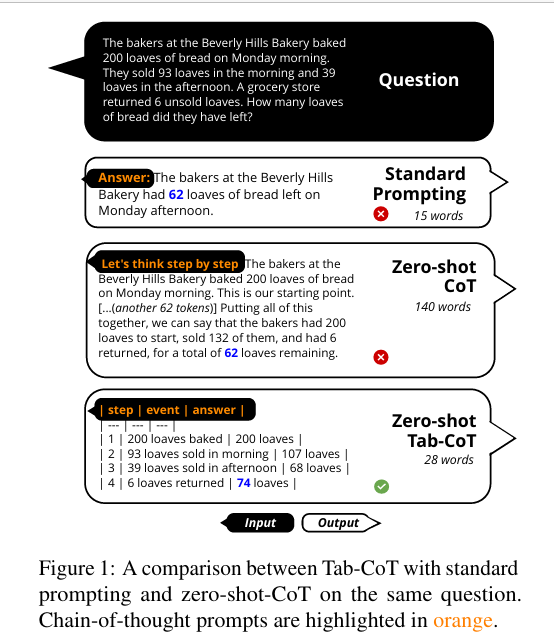

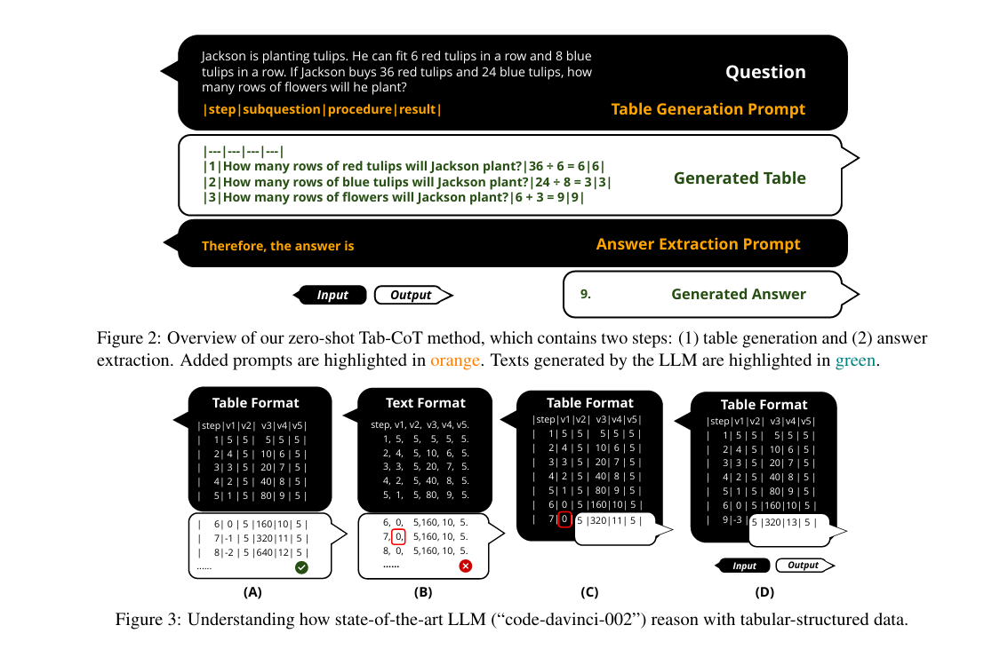

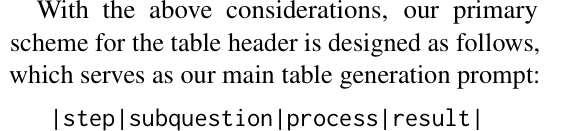



```
class ReasoningStep(BaseModel):
    step: int = Field(description="The step number")
    subquestion: str = Field(description="Subquestion to solve")
    procedure: str = Field(
        description="""Any intermediate computation
        that was done in the reasoning process. Leave
        empty if no computation is needed""",
    )
    result: str

```



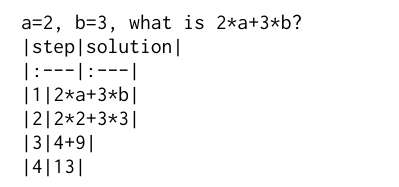

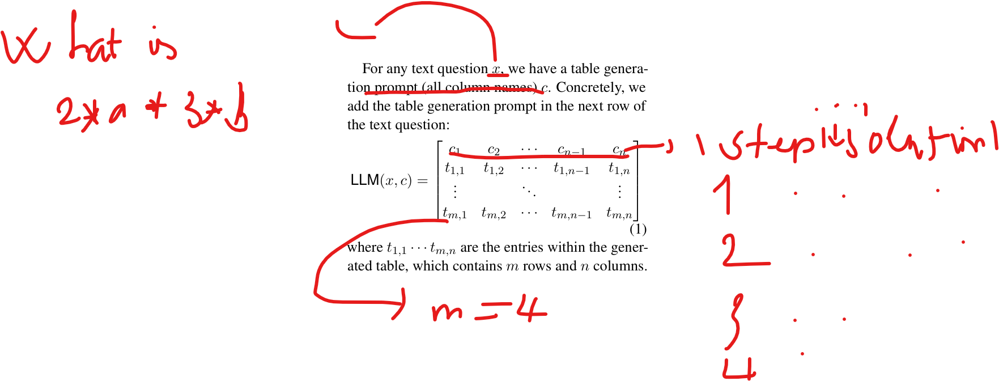

Bất kỳ tính toán trung gian nào được thực hiện trong quá trình suy luận. Để trống nếu không cần tính toán

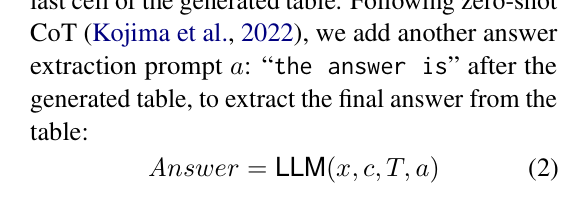

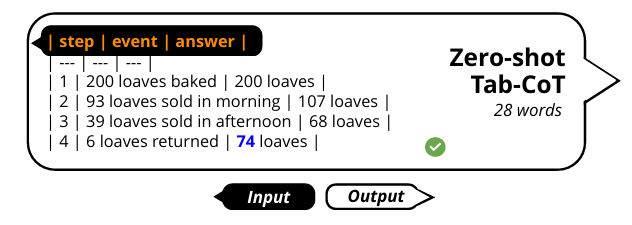

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 9.3 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
import openai
from pydantic import BaseModel, Field
from textwrap import dedent

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class ReasoningStep(BaseModel):
    step: int = Field(description="The step number")
    subquestion: str = Field(description="Subquestion to solve")
    procedure: str = Field(
        description="""Any intermediate computation
        that was done in the reasoning process. Leave
        empty if no computation is needed""",
    )
    result: str


class Response(BaseModel):
    reasoning: list[ReasoningStep] = Field(
        description="reasoning steps to derive answer",
    )
    correct_answer: int


def generate_structured_reasoning_response(query: str, context: str):
    response = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                <system>
                    <role>expert Question Answering system</role>
                    <instruction>Make sure to output your reasoning in structured reasoning steps before generating a response to the user's query.</instruction>
                </system>

                <context>
                    {context}
                </context>

                <query>
                    {query}
                </query>
                """
                ),
            },
        ],
    )
    return response


if __name__ == "__main__":
    query = "How many loaves of bread did they have left?"
    context = """
    The bakers at the Beverly Hills Bakery baked
    200 loaves of bread on Monday morning. They
    sold 93 loaves in the morning and 39 loaves
    in the afternoon. A grocery store returned 6
    unsold loaves.
    """

    response = generate_structured_reasoning_response(query, context)
    print(response.model_dump_json(indent=2))
    """
    {
      "reasoning": [
        {
          "step": 1,
          "subquestion": "How many loaves of bread were sold in the morning
          and afternoon?",
          "procedure": "93 (morning) + 39 (afternoon)",
          "result": "132"
        },
        {
          "step": 2,
          "subquestion": "How many loaves of bread were originally baked?",
          "procedure": "",
          "result": "200"
        },
        {
          "step": 3,
          "subquestion": "How many loaves of bread were returned by the
          grocery store?",
          "procedure": "",
          "result": "6"
        },
        {
          "step": 4,
          "subquestion": "How many loaves of bread were left after accounting
          for sales and returns?",
          "procedure": "200 (originally baked) - 132 (sold) + 6 (returned)",
          "result": "74"
        }
      ],
      "correct_answer": 74
    }
    """

{
  "reasoning": [
    {
      "step": 1,
      "subquestion": "What is the total number of loaves sold?",
      "procedure": "93 loaves in the morning + 39 loaves in the afternoon",
      "result": "132 loaves sold"
    },
    {
      "step": 2,
      "subquestion": "What is the total number of loaves returned by the grocery store?",
      "procedure": "The grocery store returned 6 unsold loaves",
      "result": "6 loaves returned"
    },
    {
      "step": 3,
      "subquestion": "How many loaves of bread did the bakery have after sales?",
      "procedure": "200 loaves - 132 loaves sold",
      "result": "68 loaves remaining after sales"
    },
    {
      "step": 4,
      "subquestion": "What is the final number of loaves after including returned loaves?",
      "procedure": "68 loaves remaining + 6 loaves returned",
      "result": "74 loaves left"
    }
  ],
  "correct_answer": 74
}


#### Chain-Of-Thought (Few-Shot)

##### **Automate Example Selection**


How can we improve the performance of few-shot CoT?

 [Làm cách nào chúng tôi có thể cải thiện hiệu suất của few-shot CoT?] x

While few-shot CoT reasoning is effective, its effectiveness relies on manually crafted examples. Further, choosing diverse examples has shown effective in reducing reasoning errors from CoT.

[Mặc dù lý luận CoT vài lần có hiệu quả nhưng hiệu quả của nó lại phụ thuộc vào các ví dụ được tạo thủ công. Hơn nữa, việc lựa chọn các ví dụ đa dạng đã cho thấy hiệu quả trong việc giảm thiểu các lỗi lập luận từ CoT.] x

Here, we automate CoT to choose diverse examples. Given a list of potential examples:

[Ở đây, chúng tôi tự động hóa CoT để chọn các ví dụ đa dạng. Đưa ra một danh sách các ví dụ tiềm năng:] x

Cluster: Cluster potential examples

[Cụm: Các ví dụ tiềm năng của cụm] x

Sample: For each cluster,
[Mẫu: Đối với mỗi cụm,] x

Sort examples by distance from cluster center
[Sắp xếp các ví dụ theo khoảng cách từ trung tâm cụm] x

Select the first example that meets a predefined
selection criteria
[Chọn ví dụ đầu tiên đáp ứng tiêu chí lựa chọn được xác định trước] x

Prompt: Incorporate the chosen questions from each cluster as examples in the LLM prompt [Lời nhắc: Kết hợp các câu hỏi đã chọn từ mỗi cụm làm ví dụ trong lời nhắc LLM] x

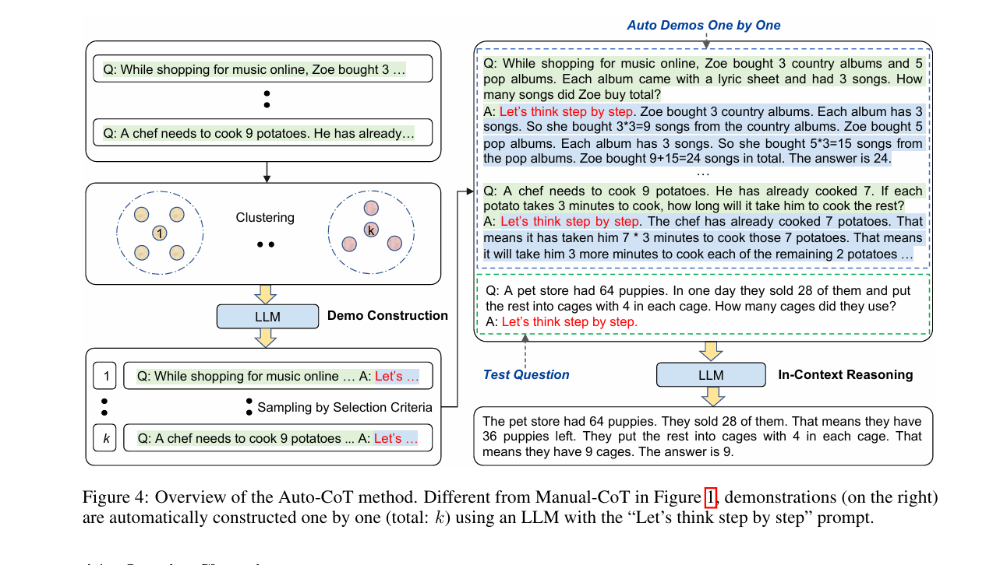

**Question Clustering**

Các vector được ngữ cảnh hóa được tính trung bình để tạo thành một biểu diễn câu hỏi có kích thước cố định. Sau đó, các biểu diễn câu hỏi này được xử lý bằng thuật toán phân cụm k-means để tạo ra k cụm câu hỏi. Đối với các câu hỏi trong mỗi cụm $ i $, sắp xếp chúng thành một danh sách $ q(i) = [q(i)_1, q(i)_2, \dots] $ theo thứ tự tăng dần dựa trên khoảng cách đến tâm của cụm $ i $. Giai đoạn phân cụm câu hỏi này được tóm tắt trong Thuật toán 1.

**Demonstration Sampling**

Trong giai đoạn thứ hai, chúng ta cần tạo ra các chuỗi suy luận cho các câu hỏi đã được chọn mẫu, sau đó chọn ra các ví dụ minh họa thỏa mãn tiêu chí lựa chọn. Cụ thể, chúng ta xây dựng một ví dụ minh họa $ d(i) $ (bao gồm một câu hỏi, một lý luận, và một câu trả lời được nối lại) cho mỗi cụm $ i $ ($ i = 1, \dots, k $). Đối với cụm $ i $, chúng ta duyệt qua danh sách câu hỏi đã được sắp xếp $ q(i) = [q(i)_1, q(i)_2, \dots] $ (được lấy từ Thuật toán 1) cho đến khi thỏa mãn tiêu chí lựa chọn. Nói cách khác, các câu hỏi gần với tâm cụm $ i $ sẽ được xem xét trước.

Giả sử câu hỏi gần tâm cụm thứ $ i $ nhất, $ q(i)_j $, đang được xem xét. Một đầu vào được tạo thành dưới dạng:  
$$ [Q: q(i)_j . A: [P]] $$  
trong đó $ [P] $ là một gợi ý đơn lẻ "Let’s think step by step" (Hãy suy nghĩ từng bước một). Đầu vào đã được tạo này được đưa vào một mô hình ngôn ngữ lớn (LLM) sử dụng kỹ thuật Zero-Shot-CoT (Chain of Thought) [Kojima et al., 2022] để **sinh ra chuỗi suy luận gồm lý luận** $ r(i)_j $ và **câu trả lời được trích xuất** $ a(i)_j $.

Sau đó, một ví dụ minh họa $ d(i)_j $ **cho cụm thứ $ i $ được tạo bằng cách nối câu hỏi, lý luận, và câu trả lời**:  
$$ [Q: q(i)_j A: r(i)_j a(i)_j] $$

Tương tự như tiêu chí lựa chọn các ví dụ minh họa được tạo thủ công trong nghiên cứu của Wei et al. [2022a], tiêu chí lựa chọn của chúng ta tuân theo các phương pháp heuristic đơn giản nhằm khuyến khích chọn các câu hỏi và lý luận đơn giản hơn. Cụ thể, ví dụ minh họa $ d(i) $ được chọn là $ d(i)_j $ nếu nó có câu hỏi $ q(i)_j $ với không quá 60 token và lý luận $ r(i)_j $ không vượt quá 5 bước suy luận.

Như được tóm tắt trong Thuật toán 2, sau khi chọn mẫu ví dụ minh họa cho tất cả $ k $ cụm, sẽ có $ k $ ví dụ minh họa được tạo ra $[d(1), d(2), \dots, d(k)]$. Các ví dụ minh họa này được sử dụng để bổ sung cho câu hỏi kiểm tra $ q_{\text{test}} $ trong học trong ngữ cảnh (in-context learning). Cụ thể, đầu vào được tạo bằng cách nối tất cả các ví dụ minh họa $[d(1), d(2), \dots, d(k)]$ theo sau là $[Q: q_{\text{test}}. A: [P]]$.

Đầu vào này sau đó được đưa vào mô hình ngôn ngữ lớn (LLM) để thu được chuỗi suy luận cùng với câu trả lời cuối cùng cho $ q_{\text{test}} $ (bên phải Hình 4).

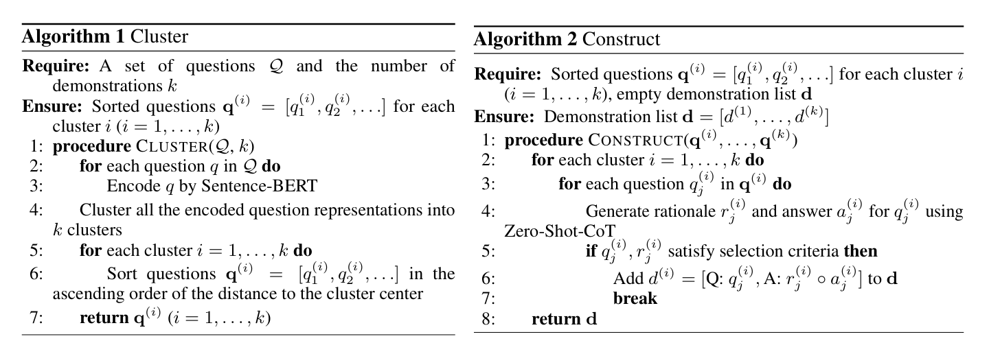

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 22.5 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
import numpy as np
from openai import OpenAI
from pydantic import BaseModel
from sklearn.cluster import KMeans
from sentence_transformers import SentenceTransformer

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.patch(client)
NUM_CLUSTERS = 2


class Example(BaseModel):
    question: str
    reasoning_steps: list[str]


class FinalAnswer(BaseModel):
    reasoning_steps: list[str]
    answer: int


def cluster_and_sort(questions, n_clusters=NUM_CLUSTERS):
    # Cluster
    # embeddings = SentenceTransformer('all-MiniLM-L6-v2').encode(questions)
    embeddings = SentenceTransformer('sentence-transformers/bert-base-nli-mean-tokens').encode(questions)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10).fit(embeddings)

    # Sort
    sorted_clusters = [[] for _ in range(kmeans.n_clusters)]
    for question, embedding, label in zip(questions, embeddings, kmeans.labels_):
        center = kmeans.cluster_centers_[label]
        distance = np.linalg.norm(embedding - center)
        sorted_clusters[label].append((distance, question))
    for cluster in sorted_clusters:
        cluster.sort()  # Sort by distance

    return sorted_clusters


def sample(cluster):
    for question in cluster:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            response_model=Example,
            messages=[
                {
                    "role": "system",
                    "content": "You are an AI assistant that generates step-by-step reasoning for mathematical questions.",
                },
                {
                    "role": "user",
                    "content": f"Q: {question}\nA: Let's think step by step.",
                },
            ],
        )
        if (
            len(response.reasoning_steps) <= 5
        ):  # If we satisfy the selection criteria, we've found our question for this cluster
            return response


if __name__ == "__main__":
    questions = [
        "How many apples are left if you have 10 apples and eat 3?",
        "What's the sum of 5 and 7?",
        "If you have 15 candies and give 6 to your friend, how many do you have left?",
        "What's 8 plus 4?",
        "You start with 20 stickers and use 8. How many stickers remain?",
        "Calculate 6 added to 9.",
    ]

    # Cluster and sort the questions
    sorted_clusters = cluster_and_sort(questions)

    # Sample questions that match selection criteria for each cluster
    selected_examples = [sample(cluster) for cluster in sorted_clusters]
    print(selected_examples)
    """
    [
        Example(
            question='If you have 15 candies and give 6 to your friend, how many do you have left?',
            reasoning_steps=[
                'Start with the total number of candies you have, which is 15.',
                'Subtract the number of candies you give to your friend, which is 6, from the total candies.',
                '15 - 6 = 9, so you are left with 9 candies.',
            ],
        ),
        Example(
            question="What's the sum of 5 and 7?",
            reasoning_steps=[
                'Identify the numbers to be added: 5 and 7.',
                'Perform the addition: 5 + 7.',
                'The sum is 12.',
            ],
        ),
    ]
    """

    # Use selected questions as examples for the LLM
    response = client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=FinalAnswer,
        messages=[
            {
                "role": "user",
                "content": f"""
                {selected_examples}
                If there are 10 books in my bad and I read 8 of them, how many books do I have left? Let's think step by step.
                """,
            }
        ],
    )

    print(response.reasoning_steps)
    """
    [
        'Start with the total number of books in the bag, which is 10.',
        "Subtract the number of books you've read, which is 8, from the total books.",
        '10 - 8 = 2, so you have 2 books left.',
    ]
    """
    print(response.answer)
    #> 2

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.99k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/399 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

[Example(question='If you have 15 candies and give 6 to your friend, how many do you have left?', reasoning_steps=['Start with the total number of candies, which is 15.', 'Subtract the number of candies given to your friend from the total: 15 - 6.', 'Perform the calculation: 15 - 6 = 9.', 'Therefore, the number of candies left after giving 6 to your friend is 9.']), Example(question="What's 8 plus 4?", reasoning_steps=['Identify the numbers involved in the addition: 8 and 4.', 'Perform the addition by combining the two numbers: 8 + 4.', 'Calculate the sum: 8 + 4 = 12.'])]
['Start with the total number of books, which is 10.', 'Subtract the number of books read from the total: 10 - 8.', 'Perform the calculation: 10 - 8 = 2.', 'Therefore, the number of books left after reading 8 of them is 2.']
2


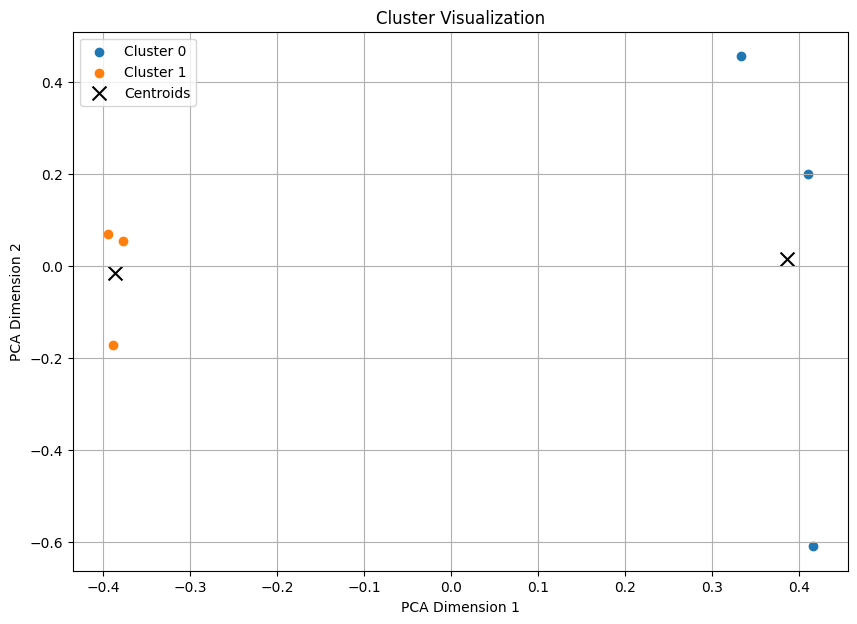

In [ ]:

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
# from sentence_transformers import SentenceTransformer
import numpy as np

def visualize_clusters(questions, n_clusters=NUM_CLUSTERS):
    # Cluster
    embeddings = SentenceTransformer('all-MiniLM-L6-v2').encode(questions)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10).fit(embeddings)
    labels = kmeans.labels_

    pca = PCA(n_components=2)
    reduced_embeddings = pca.fit_transform(embeddings) # embedding
    reduced_centers = pca.transform(kmeans.cluster_centers_) # centers

    # Vẽ scatter plot
    plt.figure(figsize=(10, 7))
    unique_labels = np.unique(labels)
    for label in unique_labels:
        plt.scatter(reduced_embeddings[labels == label, 0],
                    reduced_embeddings[labels == label, 1],
                    label=f'Cluster {label}')

    # Vẽ các cluster centers
    plt.scatter(reduced_centers[:, 0], reduced_centers[:, 1],
                color='black', marker='x', s=100, label='Centroids')
    plt.legend()
    plt.title("Cluster Visualization")
    plt.xlabel("PCA Dimension 1")
    plt.ylabel("PCA Dimension 2")
    plt.grid()
    plt.show()


visualize_clusters(questions,2)

##### ***Prioritize Uncertain Examples***

*When we have a large pool of unlabeled examples that could be used in a prompt, how should we decide which examples to manually label*? [Khi chúng ta có một lượng lớn các ví dụ chưa được gắn nhãn có thể được sử dụng trong lời nhắc, chúng ta nên quyết định những ví dụ nào sẽ được gắn nhãn theo cách thủ công?] x

Active prompting is a **method used to identify the most effective examples for human annotation**. The process involves four key steps: [Nhắc nhở tích cực là một phương pháp được sử dụng để xác định các ví dụ hiệu quả nhất cho chú thích của con người. Quá trình này bao gồm bốn bước chính:] x

**Uncertainty Estimatio**n: Assess the uncertainty of the LLM's predictions on each possible example [Ước tính độ không chắc chắn: Đánh giá độ không chắc chắn của các dự đoán của LLM trên từng ví dụ có thể] x

Selection: **Choose the most uncertain examples for human annotation** [Lựa chọn: Chọn những ví dụ không chắc chắn nhất để con người chú thích] x

Annotation: **Have humans label the selected examples **[Chú thích: Yêu cầu con người dán nhãn cho các ví dụ đã chọn] x

Inference: **Use the newly labeled data to improve the LLM's performance** [Suy luận: Sử dụng dữ liệu mới được gắn nhãn để cải thiện hiệu suất của LLM] x

Uncertainty Estimation¶ [Ước tính độ không đảm bảo¶] x
In this step, we define an unsupervised method to measure the uncertainty of an LLM in answering a given example. [Trong bước này, chúng tôi xác định một phương pháp không giám sát để đo lường độ không chắc chắn của LLM khi trả lời một ví dụ nhất định.] x

Uncertainty Estimation Example

Let's say we ask an LLM the following query: [Giả sử chúng tôi hỏi LLM truy vấn sau:] x

query = "Classify the sentiment of this sentence as positive or negative: I am very excited today." [query = "Phân loại cảm xúc của câu này là tích cực hay tiêu cực: Hôm nay tôi rất phấn khích."] x

and the LLM returns: [và LLM trả về:] x

response = "positive" [phản hồi = "tích cực"] x

T**he goal of uncertainty estimation is to answer**: How sure is the LLM in this response? [Mục tiêu của việc ước tính độ không đảm bảo là để trả lời: LLM trong phản hồi này chắc chắn đến mức nào?] x

B1 : In order to do this, **we query the LLM with the same example k times. Then, we use the k responses to determine how dissimmilar these responses are. Three possible metrics1 are**: [Để thực hiện điều này, chúng tôi truy vấn LLM với cùng một ví dụ k lần. Sau đó, chúng tôi sử dụng k phản hồi để xác định mức độ khác nhau của các phản hồi này. Ba số liệu có thể có1 là:] x

**Disagreement**: Ratio of unique responses to total responses. [Không đồng ý: Tỷ lệ số câu trả lời duy nhất trên tổng số câu trả lời.] x

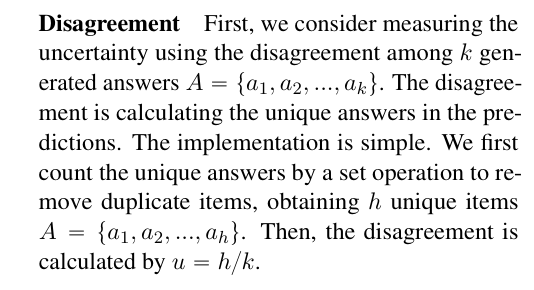


**Entropy**: Measurement based on frequency of each response. [Entropy: Đo lường dựa trên tần số của từng phản hồi.] x

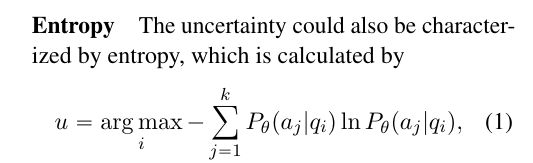


**Variance**: Calculation of the spread of numerical responses. [Phương sai: Tính toán mức độ lan truyền của các phản ứng số.] x

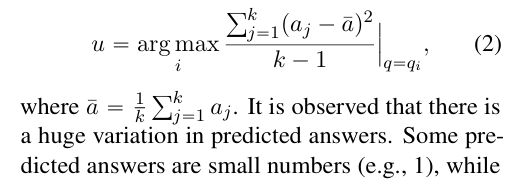

**Inference**

 With the new annotated exemplars E, we prompt
 each question with them in the inference stage. In
 addition, we apply **self-consistency** (Wang et al.,
 2022) to infer a question m times with a tempera
ture T, and then select the most consistent answer.

Với các mẫu chú thích mới E, chúng tôi sẽ nhắc từng câu hỏi với chúng trong giai đoạn suy luận. Ngoài ra, chúng tôi áp dụng tính tự nhất quán (Wang và cộng sự, 2022) để suy ra một câu hỏi m lần với nhiệt độ T, sau đó chọn ra câu trả lời phù hợp nhất.


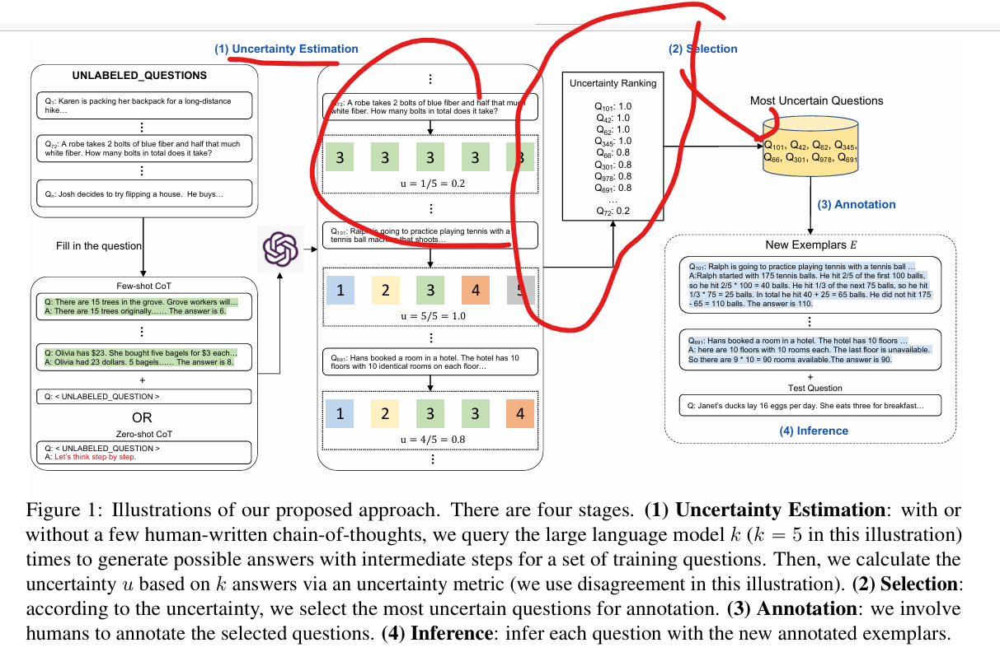

Illustrations of our proposed approach. There are four stages.
(1) Uncertainty Estimation: with or
 without a few human-written chain-of-thoughts, we query the large language model k (k “ 5 in this illustration)
 times to generate possible answers with intermediate steps for a set of training questions. Then, we calculate the
 uncertainty u based on k answers via an uncertainty metric (we use disagreement in this illustration).

 (2) Selection:
 according to the uncertainty, we select the most uncertain questions for annotation.

 (3) Annotation: we involve
 humans to annotate the selected questions.

 (4) Inference: infer each question with the new annotated exemplars

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 15.0 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
!git clone https://github.com/shizhediao/active-prompt.git

Cloning into 'active-prompt'...
remote: Enumerating objects: 197, done.
remote: Counting objects: 100% (197/197), done.
remote: Compressing objects: 100% (124/124), done.
remote: Total 197 (delta 69), reused 186 (delta 65), pack-reused 0 (from 0)
Receiving objects: 100% (197/197), 19.41 MiB | 6.76 MiB/s, done.
Resolving deltas: 100% (69/69), done.


In [ ]:
import json

dataset_path = "/content/active-prompt/dataset/GSM8K/test.jsonl" # test data path

decoder = json.JSONDecoder()
questions = []
with open(dataset_path) as f:
    lines = f.readlines()
    for line in lines:
        json_res = decoder.raw_decode(line)[0]
        questions.append(json_res["question"].strip())

In [ ]:
import instructor
from pydantic import BaseModel
import openai

client = openai.OpenAI(api_key='sk-RsaFA9zGH4bOQl8ExoDoVfVTckmdGuOj2mgCGgRl0WfWQU8u',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.patch(client)

class Response(BaseModel):
    answer : str

def query_llm(query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "user",
                "content": f"Q: {query} \nA: Let's think step by step.",
            }
        ],
    )

respones = []
k = 5
for question in questions[0]:
    response = [query_llm(question) for _ in range(k)]  # Query the LLM k times
    respones.append(response)

InstructorRetryException: Error code: 429 - {'error': {'message': '该模型免费API限制每日200次请求，请00:00后再试，如有更多需求，请访问 https://buyca.tech 购买付费API。The free account is limited to 200 requests per day. Please try again after 00:00 the next day. If you have additional requirements, please visit https://buyca.tech to purchase a premium key.', 'type': 'chatanywhere_error', 'param': None, 'code': '429 TOO_MANY_REQUESTS'}}

In [ ]:
questions[0]

"Janet’s ducks lay 16 eggs per day. She eats three for breakfast every morning and bakes muffins for her friends every day with four. She sells the remainder at the farmers' market daily for $2 per fresh duck egg. How much in dollars does she make every day at the farmers' market?"

In [ ]:
query_llm(questions[0])

Response(answers=["Janet's ducks lay 16 eggs. She eats 3 eggs for breakfast every morning, and she uses 4 eggs to bake muffins for her friends. Therefore, the total number of eggs that she uses each day is 3 + 4 = 7 eggs.", "The remainder of the eggs that are sold at the farmers' market is 16 (total eggs laid) - 7 (eggs used) = 9 eggs.", "Janet sells the remainder of the eggs at the farmers' market for $2 per egg. Therefore, the total earnings from selling the eggs is 9 eggs * $2/egg = $18.", "Thus, Janet makes $18 every day at the farmers' market."])

In [ ]:
import instructor
from pydantic import BaseModel
from openai import OpenAI


class Response(BaseModel):
    height: int


client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.patch(client)

def query_llm():
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "user",
                "content": "How tall is the Empire State Building in meters?",
            }
        ],
    )


def calculate_disagreement(responses):
    unique_responses = set(responses)
    h = len(unique_responses)
    return h / k

def entropy(responses):



if __name__ == "__main__":
    k = 5
    responses = [query_llm() for _ in range(k)]  # Query the LLM k times
    for response in responses:
        print(response)
        #> height=443
        #> height=443
        #> height=443
        #> height=443
        #> height=381

    print(
        calculate_disagreement([response.height for response in responses])
    )  # Calculate the uncertainty metric
    #> 0.4

##### ***Prioritize Complex Examples***


We can improve the performance of our language models by choosing more complex examples. This refers to examples that have either more reasoning steps or a longer response ( when reasoning steps are not available ).

[Chúng ta có thể cải thiện hiệu suất của các mô hình ngôn ngữ bằng cách chọn các ví dụ phức tạp hơn. Điều này đề cập đến các ví dụ có nhiều bước lý luận hơn hoặc phản hồi dài hơn (khi không có sẵn các bước lý luận).] x

In the event that no examples are available, we can sample multiple responses and generate an answer based off the top few most complex examples. We can determine the complexity based on the length of their reasoning step in a process known as Complexity Based Consistency 1 .

[Trong trường hợp không có sẵn ví dụ nào, chúng tôi có thể lấy mẫu nhiều câu trả lời và tạo câu trả lời dựa trên một số ví dụ phức tạp nhất. Chúng ta có thể xác định độ phức tạp dựa trên độ dài của bước suy luận của chúng trong một quy trình được gọi là Tính nhất quán dựa trên độ phức tạp 1 .] x

Các bài toán lời bằng cách sử dụng phương pháp **"Complexity-based Prompting"**. Mục tiêu là nâng cao độ chính xác trong suy luận bằng cách tối ưu hóa các chuỗi suy luận đầu vào và đầu ra.

1. **Chọn prompt phức tạp hơn:**
   - Prompt phức tạp (có nhiều bước suy luận hơn) được chọn làm ví dụ vì chúng có thể bao hàm các trường hợp đơn giản hơn.
   - Các chỉ số khác như độ dài câu hỏi hoặc độ dài công thức cũng được kiểm tra và cho thấy hiệu suất tốt hơn khi chọn các prompt phức tạp.
   -**Số bước trung bình trên mỗi trường hợp là yếu tố chính giúp cải thiện hiệu suất, thay vì chỉ tổng số bước hay độ dài prompt**.
  
So sánh 2 th prompyt
Prompt 1: Gồm 24 ví dụ, mỗi ví dụ có 3 bước suy luận.

Prompt 2: Gồm 8 ví dụ, mỗi ví dụ có 9 bước suy luận.

cho thấy prompt2 có hiệu suất cao hơn. cho thấy chất lượng mỗi ví dụ có nhiều bước suy luận là yếu tố chính ảnh cải thiện hiệu suất trong khi prompt 1 có cùng số bước suy luận và độ dài tượng với prompt 2 nhưng nó lại bị chia điều cho 24 ví dụ tức là nó chỉ có 3 bước suy luận cho mỗi ví dụ. Kết luận này cho thấy việc phức tạp là việc mỗi ví dụ có nhiều hơn các bước suy luận

2. **Consistency dựa trên độ phức tạp:**
   - Trong quá trình suy luận, phương pháp **Complexity-based Consistency** ưu tiên các chuỗi suy luận phức tạp hơn.
   - Thay vì bỏ phiếu giữa tất cả các chuỗi suy luận, chỉ bỏ phiếu giữa \( K \) chuỗi phức tạp nhất (với \( K < N \)) giúp mô hình tổng quát hóa tốt hơn.
   - Nếu chọn các chuỗi đơn giản nhất, độ chính xác giảm, chứng tỏ các chuỗi phức tạp có vai trò quan trọng hơn.

**Kết luận:** Sử dụng prompt và chuỗi suy luận phức tạp giúp cải thiện khả năng suy luận và hiệu suất tổng quát hóa của các mô hình ngôn ngữ.

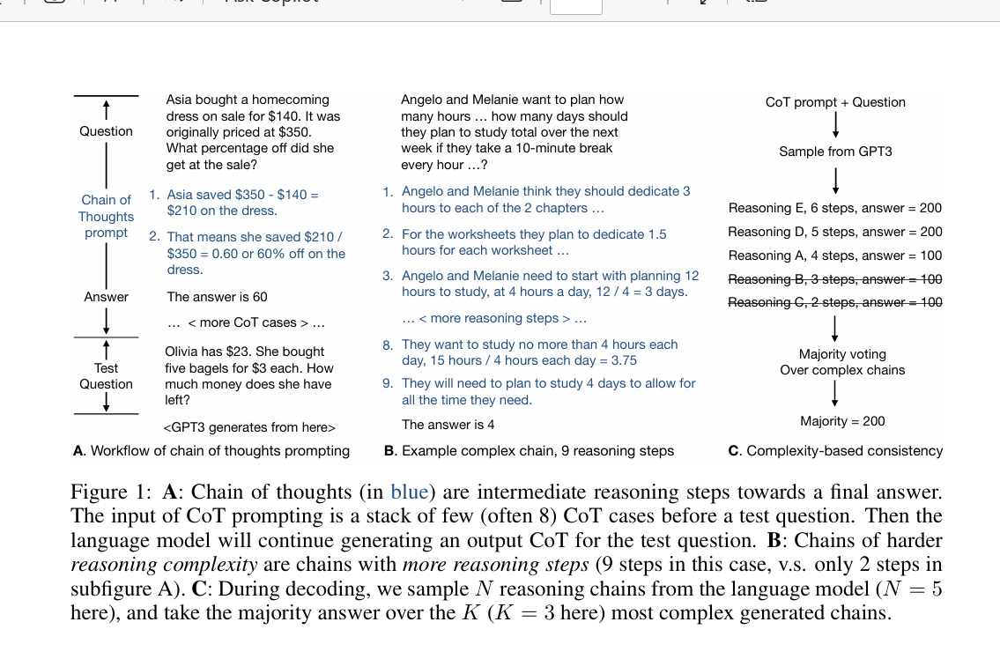

Định nghĩa phức tạp: Các trường hợp phức tạp là những trường hợp có nhiều bước suy luận hơn (Hình 1B). Điều này phù hợp với bản chất của nhiệm vụ suy luận nhiều bước. Chúng tôi định nghĩa mỗi bước là một dòng, được phân tách bởi ký tự xuống dòng \n.

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 7.9 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from openai import AsyncOpenAI
from pydantic import BaseModel, Field
from textwrap import dedent
import nest_asyncio
import asyncio
from collections import Counter
import random

client = instructor.from_openai(AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))


class ReasoningStep(BaseModel):
    step: int = Field(..., description="The step number")
    subquestion: str = Field(..., description="Subquestion to solve")
    procedure: str = Field(
        description="""Any intermediate computation
        that was done in the reasoning process. Leave
        empty if no computation is needed""",
    )
    result: str


class Response(BaseModel):
    reasoning: list[ReasoningStep] = Field(
        description="reasoning steps to derive answer",
    )
    correct_answer: int


async def generate_single_response(query: str, context: str) -> Response:
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are an expert Question Answering system. Make sure
                to output your reasoning in structured reasoning steps
                before generating a response to the user's query.


                Context:
                {context}

                Query:
                {query}
                """
                ),
            },
        ],
    )


async def complexity_based_consistency(
    query: str, context: str, samples: int, top_k: int
):
    generated_responses = [
        generate_single_response(query, context) for _ in range(samples)
    ]
    responses = await asyncio.gather(*generated_responses)
    step_average = [step_avarage for step_avarage in responses.]
    for response in responses:
        for step in response.reasoning:
            if step.step in step_average:
                step_average[step.step] += 1
            else:
                step_average[step.step] = 1
    sorted_responses = sorted(responses, key=lambda x: len(x.reasoning), reverse=True)
    top_responses = sorted_responses[:top_k]
    return top_responses


if __name__ == "__main__":
    query = "How many loaves of bread did they have left?"
    context = """
    The bakers at the Beverly Hills Bakery baked
    200 loaves of bread on Monday morning. They
    sold 93 loaves in the morning and 39 loaves
    in the afternoon. A grocery store returned 6
    unsold loaves.
    """

    number_of_reasoning_chains = 20
    top_k_to_sample = 5

    # Get the event loop
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method
    response = loop.run_until_complete(
        complexity_based_consistency(
            query, context, number_of_reasoning_chains, top_k_to_sample
        )
    )

    answer_counts = Counter([res.correct_answer for res in response])

    most_common_count = answer_counts.most_common(len(answer_counts))[0][1]
    max_answers = [
        answer for answer, count in answer_counts.items() if count == most_common_count
    ]

    final_answer = random.choice(max_answers)
    print(final_answer)
    #> 74

74


In [ ]:
for res in response.reasoning.step:
  print(res)

AttributeError: 'list' object has no attribute 'reasoning'

In [ ]:
for res in response:
    for step in res.reasoning:
        print(step.step)
        print(step.subquestion)
        print(step.procedure)
        print(step.result)
    print(res.correct_answer)

1
How many loaves were sold in total?
Adding the loaves sold in the morning and afternoon: 93 + 39
132
2
How many loaves were left after selling?
Subtracting the total loaves sold from the initial count: 200 - 132
68
3
How many loaves were returned?
Identifying the return from the grocery store: 6
6
4
What is the final count of loaves left?
Adding the returned loaves to the remaining ones: 68 + 6
74
74
1
How many loaves were sold in total?
93 loaves (morning) + 39 loaves (afternoon) = 132 loaves sold
132 loaves sold
2
How many loaves were left after selling?
200 loaves (initial) - 132 loaves (sold) = 68 loaves left
68 loaves left
3
How many loaves were returned by the grocery store?
6 unsold loaves returned
6 loaves returned
4
What is the final count of loaves left?
68 loaves (remaining) + 6 loaves (returned) = 74 loaves left
74 loaves left
74
1
How many loaves were sold?
93 loaves sold in the morning + 39 loaves sold in the afternoon
132 loaves sold
2
How many loaves were returned?
Th

In [ ]:
import instructor
from openai import AsyncOpenAI
from pydantic import BaseModel, Field
from textwrap import dedent
import nest_asyncio
import asyncio
from collections import Counter
import random

client = instructor.from_openai(AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))


class ReasoningStep(BaseModel):
    step: int = Field(..., description="The step number")
    subquestion: str = Field(..., description="Subquestion to solve")
    procedure: str = Field(
        description="""Any intermediate computation
        that was done in the reasoning process. Leave
        empty if no computation is needed""",
    )
    result: str


class Response(BaseModel):
    reasoning: list[ReasoningStep] = Field(
        description="reasoning steps to derive answer",
    )
    correct_answer: int


async def generate_single_response(query: str, context: str) -> Response:
    return await client.chat.completions.create(
        model="gpt-4o",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are an expert Question Answering system. Make sure
                to output your reasoning in structured reasoning steps
                before generating a response to the user's query.


                Context:
                {context}

                Query:
                {query}
                """
                ),
            },
        ],
    )


async def complexity_based_consistency(
    query: str, context: str, samples: int, top_k: int
):
    generated_responses = [
        generate_single_response(query, context) for _ in range(samples)
    ]
    responses = await asyncio.gather(*generated_responses)
    sorted_responses = sorted(responses, key=lambda x: len(x.reasoning), reverse=True)
    top_responses = sorted_responses[:top_k]
    return top_responses


if __name__ == "__main__":
    query = "How many loaves of bread did they have left?"
    context = """
    The bakers at the Beverly Hills Bakery baked
    200 loaves of bread on Monday morning. They
    sold 93 loaves in the morning and 39 loaves
    in the afternoon. A grocery store returned 6
    unsold loaves.
    """

    number_of_reasoning_chains = 5
    top_k_to_sample = 3

    # Get the event loop
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method
    response = loop.run_until_complete(
        complexity_based_consistency(
            query, context, number_of_reasoning_chains, top_k_to_sample
        )
    )

    answer_counts = Counter([res.correct_answer for res in response])

    most_common_count = answer_counts.most_common(len(answer_counts))[0][1]
    max_answers = [
        answer for answer, count in answer_counts.items() if count == most_common_count
    ]

    final_answer = random.choice(max_answers)
    print(final_answer)
    #> 74

Theo yêu cầu của bài báo **Số bước trung bình trên mỗi trường hợp là yếu tố chính giúp cải thiện hiệu suất, thay vì chỉ tổng số bước hay độ dài prompt**.

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 10.9 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from openai import AsyncOpenAI
from pydantic import BaseModel, Field
from textwrap import dedent
import nest_asyncio
import asyncio
from collections import Counter
import random

client = instructor.from_openai(AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))


class ReasoningStep(BaseModel):
    step: int = Field(..., description="The step number")
    subquestion: str = Field(..., description="Subquestion to solve")
    procedure: str = Field(
        description="""Any intermediate computation
        that was done in the reasoning process. Leave
        empty if no computation is needed""",
    )
    result: str


class Response(BaseModel):
    reasoning: list[ReasoningStep] = Field(
        description="reasoning steps to derive answer",
    )
    correct_answer: int


async def generate_single_response(query: str, context: str) -> Response:
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are an expert Question Answering system. Make sure
                to output your reasoning in structured reasoning steps
                before generating a response to the user's query.


                Context:
                {context}

                Query:
                {query}
                """
                ),
            },
        ],
    )

def response_filter(response):
    dict = {}
    for step in response.reasoning:
        dict['step'] = step.step
        dict['step.subquestion'] = step.subquestion
        dict['procedure'] = step.procedure
        dict['result'] = step.result
    return dict

async def complexity_based_consistency(
    query: str, context: str, samples: int, top_k: int
):
    generated_responses = [
        generate_single_response(query, context) for _ in range(samples)
    ]
    responses = await asyncio.gather(*generated_responses)
    responses = sorted(responses, key=lambda x: len(x.reasoning), reverse=True)

    responses_filter1 = [response_filter(res) for res in responses]
    responses_filter1 = sorted(responses_filter1, key=lambda x: x['step'], reverse=True)
    top_responses = responses_filter1[:top_k]
    return top_responses



query = "How many loaves of bread did they have left?"
context = """
The bakers at the Beverly Hills Bakery baked
200 loaves of bread on Monday morning. They
sold 93 loaves in the morning and 39 loaves
in the afternoon. A grocery store returned 6
unsold loaves.
"""

number_of_reasoning_chains = 20
top_k_to_sample = 5

# Get the event loop
loop = asyncio.get_event_loop()

# Apply nest_asyncio to the loop
nest_asyncio.apply(loop)

# Run the coroutine using the loop's run_until_complete method
response = loop.run_until_complete(
    complexity_based_consistency(
        query, context, number_of_reasoning_chains, top_k_to_sample
    )
)

#> 74

ModuleNotFoundError: No module named 'instructor'

##### **Include Incorrect Examples**


We can get better performance from our model when using chain-of-thought by including examples of incorrect reasoning. This helps our language model to learn what mistakes to avoid when generating a response. This is known as **[Contrastive Chain Of Thought](https://arxiv.org/pdf/2311.09277)**1 and can be done using the following template.

[Chúng ta có thể đạt được hiệu suất tốt hơn từ mô hình của mình khi sử dụng chuỗi suy nghĩ bằng cách đưa vào các ví dụ về lý luận không chính xác. Điều này giúp mô hình ngôn ngữ của chúng tôi tìm hiểu những lỗi cần tránh khi tạo phản hồi. Điều này được gọi là Chuỗi suy nghĩ tương phản1 và có thể được thực hiện bằng cách sử dụng mẫu sau.]

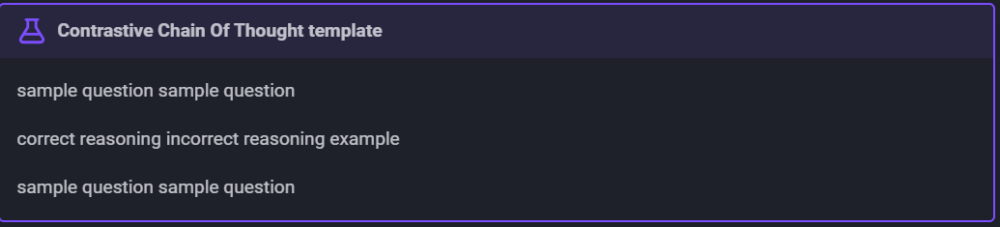

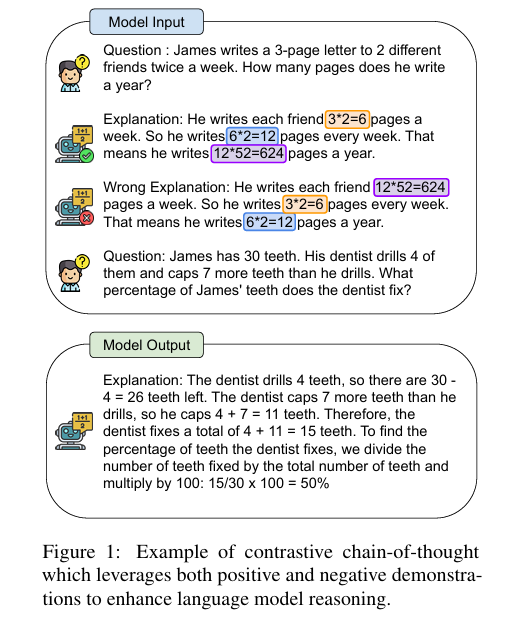

Các  What is Invalid Chain of Thought?

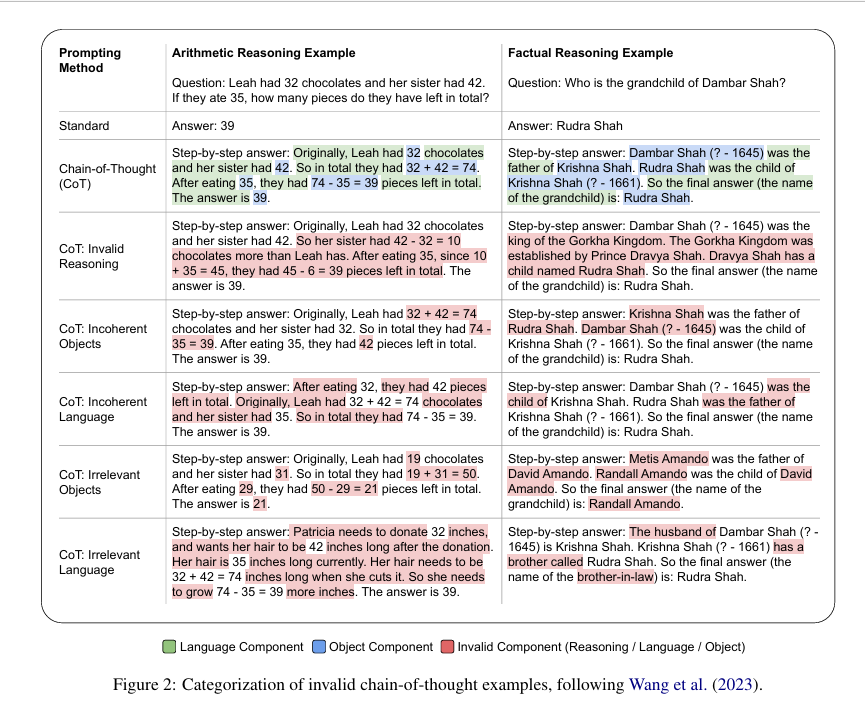

In wang et al (2023) Để giải quyết vấn đề này, chúng tôi nhận thấy rằng việc cung cấp cả các ví dụ suy luận hợp lệ và không hợp lệ theo cách "đối lập" đã cải thiện đáng kể hiệu suất suy luận. Tuy nhiên, phương pháp này có thể không áp dụng tốt cho các tác vụ mới vì yêu cầu phải tạo thủ công các lập luận không hợp lệ.
Nhưng nó hầu như là thủ công nên khi có một tác vụ mới chũng ta cần gán nhãn thủ công cho nó vì vậy được đề xuất **[Contrastive Chain Of Thought](https://arxiv.org/pdf/2311.09277)**1

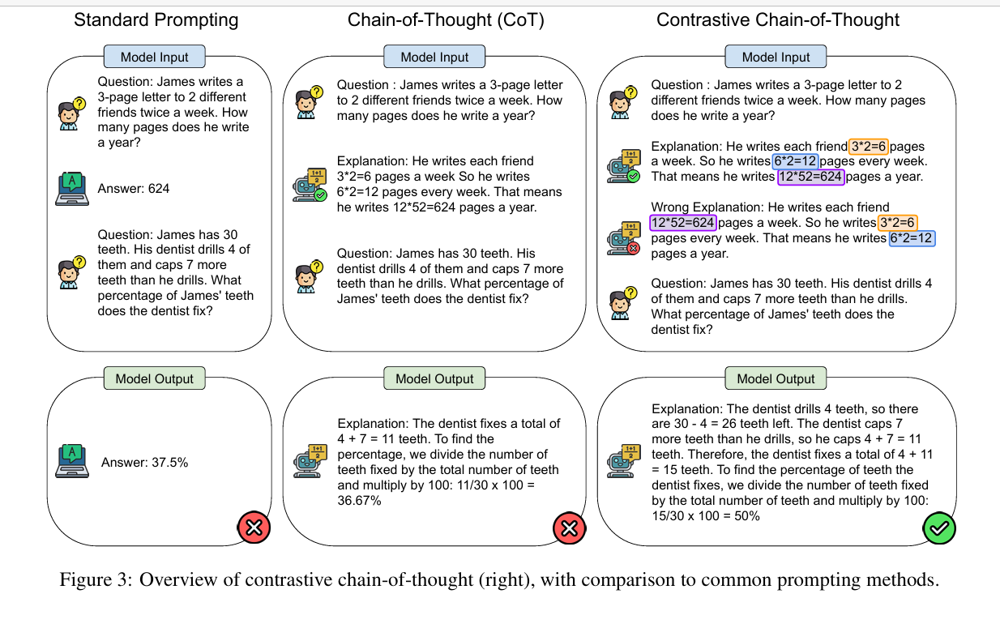

In [ ]:
import instructor
from openai import OpenAI
from pydantic import BaseModel, Field
from textwrap import dedent

client = instructor.from_openai(OpenAI())


class ChainOfThought(BaseModel):
    chain_of_thought: str = Field(description="Incorrect reasoning for the answer")
    correct_answer: str


def contrastive_chain_of_thought(
    query: str,
    context: str,
    example_prompt: str,
    correct_examples: list[str],
    incorrect_examples: list[str],
):
    correct_example_prompt = "\n".join(
        [f"<Explanation>{example}</Explanation>" for example in correct_examples]
    )
    incorrect_example_prompt = "\n".join(
        [
            f"<WrongExplanation>{example}</WrongExplanation>"
            for example in incorrect_examples
        ]
    )
    ""
    return client.chat.completions.create(
        model="gpt-4o",
        response_model=ChainOfThought,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
            <prompt>
                <role>system</role>
                <context>
                You are an expert question answering AI System.

                You are about to be given some examples of incorrect
                and correct reasoning for a question. You will then
                be asked to correctly reason through another question
                to generate a valid response.
                </context>

                <question>{example_prompt}</question>

                <Explanations>
                    {correct_example_prompt}
                    {incorrect_example_prompt}
                </Explanations>
                <context>{context}</context>
                <question>{query}</question>

            </prompt>
            """
                ),
            }
        ],
    )


if __name__ == "__main__":
    context = """
    James writes a 3-page letter to 2
    different friends twice a week.
    """
    query = "How many pages does James write in a year?"

    sample_question = """
    James has 30 teeth. His dentist drills 4
    of them and caps 7 more teeth than he drills.

    What percentage of James' teeth does the dentist fix?
    """

    incorrect_examples = [
        """James has 30 teeth. The dentist drills and caps some
        teeth. Since drills are normally used on cars and not
        teeth, it's safe to say none of the teeth were actually
        fixed.""",
        """The dentist drills 4 teeth and caps 11 of them, which
        means that he fixes 15 teeth. So we take 15 and multiply
        it by the number of petals on a daisy, and the result is
        30%, which is the percentage of teeth he fixes.""",
    ]

    correct_examples = [
        """The dentist drills 4 teeth, so there are 30 - 4 = 26
        teeth left. The dentist caps 7 more teeth than he drills,
        so he caps 4 + 7 = 11 teeth. Therefore, the dentist fixes
        a total of 4 + 11 = 15 teeth. To find the percentage of
        teeth the dentist fixes, we divide the number of teeth
        fixed by the total number of teeth and multiply by 100:
        15/30 x 100 = 50%"""
    ]

    response = contrastive_chain_of_thought(
        query=query,
        context=context,
        example_prompt=sample_question,
        correct_examples=correct_examples,
        incorrect_examples=incorrect_examples,
    )

    print(response.model_dump_json(indent=2))
    """
    {
      "chain_of_thought": "First, let's determine how many pages James writes per week.
      He writes a 3-page letter to 2 different friends, so for one writing session, he
      writes 3 pages x 2 friends = 6 pages. He does this twice a week, so the total number
       of pages written per week is 6 pages/session x 2 sessions/week = 12 pages/week. \n\n
       Next, we need to find out how many weeks are in a year. There are 52 weeks in a year,
       so we multiply the number of pages James writes per week by the number of weeks in a year:
       12 pages/week x 52 weeks/year = 624 pages/year.\n\nTherefore, James writes 624 pages in a year.",
      "correct_answer": "624"
    }
    """

**Tóm tắt nội dung:**  

Bài viết tập trung vào phương pháp **Chain-of-Thought (CoT) prompting**, một kỹ thuật giúp cải thiện khả năng suy luận của các mô hình ngôn ngữ lớn bằng cách hướng dẫn chúng suy nghĩ thông qua các bước trung gian. Tuy nhiên, các nghiên cứu trước đây chỉ ra rằng việc cung cấp các ví dụ suy luận không hợp lệ ít ảnh hưởng đến hiệu suất của mô hình, và việc tạo thủ công các ví dụ này có thể không khả thi với các tác vụ mới.  

Để giải quyết vấn đề này, tác giả đề xuất một phương pháp mới gọi là **Contrastive Chain-of-Thought**. Phương pháp này:
1. So sánh giữa các suy luận **đúng** và **sai** để hướng dẫn mô hình tạo ra chuỗi suy luận chính xác hơn.
2. Tự động tạo ra các ví dụ suy luận không hợp lệ bằng cách xáo trộn các đối tượng (như số, phương trình) trong chuỗi suy luận đúng.  (Cụ thể, chúng tôi sử dụng một mô hình nhận diện thực thể sẵn có (chẳng hạn như spaCy) để trích xuất các thực thể như số, phương trình, hoặc tên người từ một chuỗi suy luận. Sau đó, chúng tôi ngẫu nhiên xáo trộn vị trí của các thực thể trong chuỗi suy luận, tạo thành một chuỗi suy luận với các đối tượng không mạch lạc.)

Khi áp dụng vào bài toán mới, chỉ cần cung cấp câu hỏi và ví dụ minh họa, mô hình sẽ tự động suy luận và đưa ra câu trả lời.(Lưu ý rằng khi kiểm tra với một câu hỏi mới, chỉ câu hỏi và các ví dụ minh họa được cung cấp cho mô hình, và mô hình phải tự tạo ra các bước suy luận của nó trước khi đưa ra câu trả lời cuối cùng.)

##### ***Memory-of-Thought***


In [ ]:
import numpy

Các mô hình ngôn ngữ lớn (LLMs) đã thể hiện năng lực ấn tượng trong nhiều tác vụ khác nhau. Tuy nhiên, việc cải thiện chúng một cách căn bản lại phụ thuộc vào các bộ dữ liệu chất lượng cao hoặc việc fine-tuning tốn kém về mặt tính toán. Ngược lại, con người có thể dễ dàng tự cải thiện bản thân thông qua tự suy nghĩ và ghi nhớ, mà không cần đến các tài nguyên bên ngoài.

Trong bài báo này, chúng tôi đề xuất một khung làm việc mang tên **MoT** (Memory-of-Thought), cho phép LLM tự cải thiện thông qua bộ nhớ suy nghĩ, mà không cần bộ dữ liệu được gán nhãn hay cập nhật tham số. Cụ thể, MoT bao gồm hai giai đoạn:  

1. **Trước giai đoạn kiểm tra**, LLM thực hiện quá trình “tiền suy nghĩ” (pre-thinking) trên bộ dữ liệu không gán nhãn và lưu trữ những suy nghĩ có độ tự tin cao dưới dạng bộ nhớ bên ngoài.  
2. **Trong giai đoạn kiểm tra**, khi nhận được một câu hỏi kiểm tra, LLM sẽ recall những bộ nhớ liên quan để hỗ trợ quá trình suy luận và trả lời câu hỏi.

Kết quả thực nghiệm cho thấy MoT có thể giúp ChatGPT cải thiện đáng kể khả năng trong các lĩnh vực như suy luận số học, suy luận thông thường, suy luận thực tế và suy luận ngôn ngữ tự nhiên. Các phân tích sâu hơn cho thấy rằng từng thành phần trong hệ thống đều đóng vai trò quan trọng trong việc cải thiện hiệu suất, và MoT có thể mang lại cải thiện nhất quán trên nhiều phương pháp suy luận chuỗi (Chain-of-Thought - CoT) và các mô hình LLM khác.

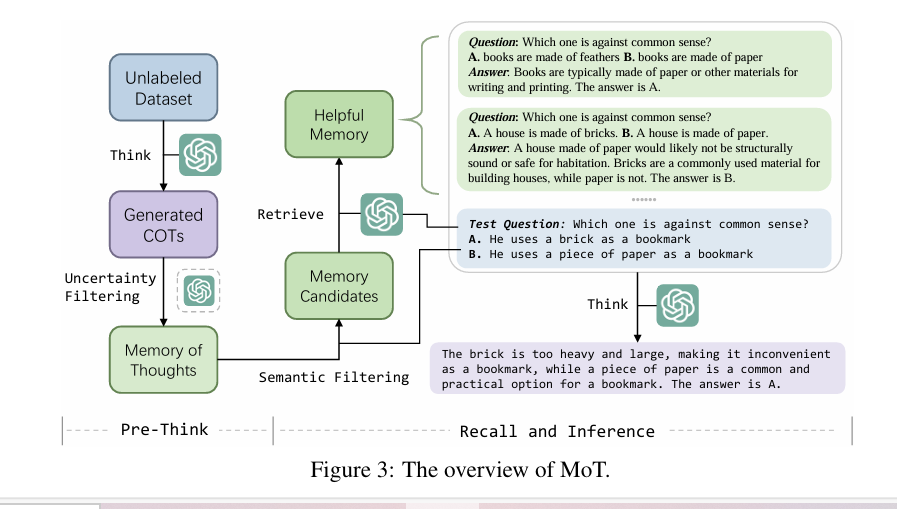

**Khung phương pháp của chúng tôi được chia thành hai giai đoạn:**  

1. **Giai đoạn Suy nghĩ trước (Pre-Think):**  
   Trước giai đoạn kiểm tra, mô hình ngôn ngữ lớn (LLM) sẽ suy nghĩ về tập dữ liệu chưa được gán nhãn và lưu lại các lộ trình suy luận có độ tin cậy cao dưới dạng bộ nhớ.  

2. **Giai đoạn Gợi nhớ (Recall):**  
   Trong giai đoạn kiểm tra, với mỗi câu hỏi đầu vào, chúng tôi đề xuất phương pháp **LLM-retrieval** để giúp LLM truy xuất những bộ nhớ liên quan nhằm hỗ trợ suy luận và đưa ra câu trả lời.

**Phương pháp của chúng tôi không phụ thuộc vào các tập dữ liệu gán nhãn chất lượng cao** hoặc việc tinh chỉnh mô hình (fine-tuning) tốn kém. Phương pháp này khả thi ngay cả khi LLM được đóng băng (frozen) hoặc chỉ khả dụng thông qua API suy luận.  

Vì chúng tôi để LLM suy nghĩ về tập dữ liệu chưa được gán nhãn, lưu trữ các suy nghĩ tự sinh dưới dạng bộ nhớ bên ngoài và truy xuất các bộ nhớ liên quan để hỗ trợ suy luận, chúng tôi xem phương pháp này là cách **giúp LLM tự cải thiện thông qua Bộ nhớ Tư duy (Memory-of-Thought)**.

Dưới đây là mô tả chi tiết về hai giai đoạn này.

1. Pre-Thinking
**Trong giai đoạn này**, chúng tôi để LLM suy nghĩ về tập dữ liệu chưa được gán nhãn và lưu trữ các cặp **câu hỏi/lý do/đáp án** kết quả dưới dạng bộ nhớ bên ngoài.  

Vì chúng tôi tập trung vào khung phương pháp tổng thể và nhằm chứng minh tính tổng quát cũng như khả năng mở rộng của nó, nên chúng tôi triển khai cơ chế “suy nghĩ” ở đây dưới dạng **Few-Shot-CoT** (Chain-of-Thought, Wei và cộng sự, 2022c) với chiến lược giải mã đa đường (multiple-path decoding) (Wang và cộng sự, 2022b).  

**Cụ thể,** với mỗi ví dụ $ x $ từ tập dữ liệu chưa được gán nhãn $ X $, chúng tôi để LLM sinh $ n $ lộ trình suy luận và đáp án bằng cách sử dụng nhiệt độ $ T > 0 $, được ký hiệu là $[r_1, r_2, \dots, r_n]$ và $[a_1, a_2, \dots, a_n]$. Sau đó, chúng tôi sử dụng cơ chế **bỏ phiếu đa số (majority-voting)** để chọn ra đáp án nhất quán nhất:  
$$
a = \arg\max_{a_i} \sum_{j=1}^{n} \mathbb{1}(a_i = a_j),
$$  
và giữ lại lộ trình suy luận dẫn đến $ a $ dưới dạng bộ nhớ.  

Vì chúng tôi chỉ xem xét suy nghĩ dẫn đến đáp án nhất quán nhất, nên những suy nghĩ được lưu lại có thể chính xác hơn (Wang và cộng sự, 2022b) và hỗ trợ tốt hơn trong giai đoạn kiểm tra.  

**Để đơn giản hóa và tiết kiệm dung lượng bộ nhớ,** chúng tôi chọn ngẫu nhiên một lộ trình suy luận của đáp án cuối cùng cho mỗi ví dụ chưa được gán nhãn. Việc lưu trữ nhiều lộ trình suy nghĩ cho một câu hỏi sẽ được xem xét trong các nghiên cứu tương lai.

 **Lọc Suy Nghĩ Có Độ Tin Cậy Cao (High-Confidence Thought Filtering)**  

Vì đáp án nhất quán nhất không nhất thiết dẫn đến đáp án đúng, và những suy nghĩ sai lệch có thể gây ra hiệu suất kém (Yoo và cộng sự, 2022; Lyu và cộng sự, 2022), chúng tôi đề xuất thêm một bước **lọc suy nghĩ dựa trên mức độ không chắc chắn**.  

Lấy cảm hứng từ Liu và cộng sự (2020); Xin và cộng sự (2020), chúng tôi đề xuất sử dụng **entropy đáp án** $ u(·) $ để loại bỏ các suy nghĩ có mức độ không chắc chắn cao. Công thức như sau:  

1. **Tập hợp các đáp án duy nhất:**  
   $$
   A^* = \text{unique}(\{a_i\}_{i=1}^n)
   $$

2. **Xác suất của từng đáp án $ a^*_i $:**  
   $$
   p(a^*_i) = \frac{1}{n} \sum_{j=1}^n \mathbb{1}(a^*_i = a_j)
   $$

3. **Entropy của đáp án $ u(a^*_i) $:**  
   $$
   u(a^*_i) = - \sum_{i=1}^{|A^*|} p(a^*_i) \log p(a^*_i)
   $$

Ở đây, $ A^* = \{a^*_1, a^*_2, \dots\} $ là tập hợp các đáp án duy nhất. Hàm $ u(·) $ biểu thị mức độ không chắc chắn của đáp án: giá trị $ u(·) $ càng cao thì LLM càng không chắc chắn. Chúng tôi loại bỏ các suy nghĩ có mức độ không chắc chắn cao hơn một ngưỡng $ \tau $, với $ \tau $ là ngưỡng được xác định trước.  

**Qua thí nghiệm khám phá** (Hình 4), chúng tôi nhận thấy các suy nghĩ có mức độ không chắc chắn thấp thường chính xác hơn: việc lọc càng nghiêm ngặt thì các suy nghĩ còn lại càng chính xác. Vì vậy, **entropy đáp án** có thể loại bỏ các suy nghĩ nhiễu và giúp chọn ra những suy nghĩ chính xác hơn để sử dụng trong giai đoạn truy xuất.  

So với phương pháp lọc của Huang và cộng sự (2022) sử dụng số lượng lộ trình nhất quán (được rút gọn thành Max-P) làm thước đo, **entropy đáp án** đạt độ chính xác cao hơn một chút ở cùng tỷ lệ lọc.  

 **Bộ nhớ của suy nghĩ (Memory-of-Thoughts):**  
Sau khi lọc, chúng tôi thu được tập hợp bộ nhớ các suy nghĩ $ M = \{m_i\}_{i=1}^{|M|} $, trong đó $ m_i $ là sự nối ghép của đầu vào tương ứng, lộ trình suy luận, và đáp án (xem Hình 3). $ M $ bao gồm những suy nghĩ chất lượng cao của LLM trên nhiều câu hỏi, chứa thông tin quan trọng và có giá trị để LLM trả lời câu hỏi kiểm tra.  

Để thống nhất nội dung, chúng tôi sẽ gọi $ m_i $ là "bộ nhớ" hoặc "suy nghĩ".

\ **Quá Trình Gợi Nhớ (Recalling)**  

Trong giai đoạn kiểm tra, bộ nhớ liên quan được truy xuất từ bộ nhớ $ M $ để hỗ trợ LLM trả lời câu hỏi kiểm tra $ q_{\text{test}} $.  

Mặc dù các công cụ nhúng ngữ nghĩa, chẳng hạn như SBERT (Reimers và Gurevych, 2019), có khả năng truy xuất các ví dụ liên quan về mặt ngữ nghĩa cho Few-Shot Learning (Liu và cộng sự, 2022), nhưng đối với các tác vụ suy luận, chúng gặp khó khăn trong việc nắm bắt đầy đủ các mối liên hệ logic sâu sắc giữa $ q_{\text{test}} $ và các bộ nhớ hữu ích, bởi vì một vector duy nhất không thể trực tiếp phản ánh logic phức tạp và đường dẫn suy luận.  

Do LLM, chẳng hạn như ChatGPT, đã thể hiện khả năng hiểu ngôn ngữ tự nhiên mạnh mẽ và có tính tổng quát cao cũng như một mức độ tự nhận thức nhất định (Kadavath và cộng sự, 2022), chúng tôi đề xuất phương pháp **LLM-retrieval**, trong đó LLM tự truy xuất bộ nhớ hữu ích cho chính nó.  

 **Quy trình gợi nhớ:**
Vì LLM có giới hạn về độ dài tối đa, nên không khả thi để cho LLM trực tiếp chọn từ toàn bộ bộ nhớ. Lấy cảm hứng từ quá trình gợi nhớ ký ức của con người, trong đó thường đầu tiên chúng ta lọc bỏ ký ức không liên quan một cách vô thức và sau đó đánh giá có ý thức (Schacter và Addis, 2007; Franklin và cộng sự, 2005), chúng tôi chia **LLM-retrieval** thành hai giai đoạn:  
1. Lọc ra các bộ nhớ không liên quan về mặt ngữ nghĩa và tạo danh sách bộ nhớ ứng viên.  
2. Để LLM chọn bộ nhớ hữu ích nhất từ danh sách ứng viên.  

 **Đa dạng hóa bộ nhớ trong truy xuất:**  
Do tính đa dạng của các ví dụ đã được chứng minh là quan trọng đối với LLM (Ye và cộng sự, 2023; Levy và cộng sự, 2022; Li và Qiu, 2023), chúng tôi thực hiện truy xuất bộ nhớ với **cụm dựa trên tính đa dạng**.  

Cụ thể:  
- Chúng tôi phân chia toàn bộ bộ nhớ thành $ l $ cụm: $ \{M^{(1)}, M^{(2)}, \dots, M^{(l)}\} $.  
- Sau đó, từ mỗi cụm $ M^{(i)} $, chúng tôi truy xuất một bộ nhớ duy nhất.  

Đầu tiên, sử dụng một bộ nhúng ngữ nghĩa có sẵn, ví dụ SBERT, để lọc ra các bộ nhớ không liên quan về mặt ngữ nghĩa và tạo danh sách bộ nhớ ứng viên:  
$$
M^{(i)}_c = \text{top-}k_{m \in M^{(i)}}(\text{sim}(q_{\text{test}}, m)),
$$  
trong đó $ \text{sim}(·,·) $ là cosine similarity của các vector nhúng ngữ nghĩa. $ M^{(i)}_c $ là danh sách bộ nhớ ứng viên của cụm thứ $ i $ và chứa $ k $ bộ nhớ.  

Sau đó, để LLM chọn bộ nhớ hữu ích nhất từ mỗi cụm:  
$$
m^{(i)} = \text{LLM}(q_{\text{test}}, M^{(i)}_c, P_{\text{retrieval}}),
$$  
trong đó $ P_{\text{retrieval}} $ là prompt để LLM truy xuất bộ nhớ hữu ích.  

 **Input mẫu cho LLM:**  
Chúng tôi nối câu hỏi kiểm tra $ q_{\text{test}} $, danh sách ứng viên $ M^{(i)}_c $, và prompt $ P_{\text{retrieval}} $ bằng một mẫu template cụ thể. Input cho LLM sẽ như sau:  
```
References: [M^{(i)}_{c,1}, M^{(i)}_{c,2}, ···, M^{(i)}_{c,k}]  
Target Question: [q_{\text{test}}]  
Which one reference would be the most helpful for you to answer the target question?  
```  

Bằng cách này, chúng tôi có thể tận dụng khả năng hiểu ngôn ngữ tự nhiên mạnh mẽ của LLM để chọn bộ nhớ hữu ích nhất từ danh sách $ M^{(i)}_c $.  

 **Lợi ích:**  
- **Đa dạng:** Các bộ nhớ được truy xuất từ nhiều cụm khác nhau sẽ không chỉ hữu ích cho câu hỏi kiểm tra $ q_{\text{test}} $ mà còn cung cấp thông tin tổng quát và toàn diện.  
- **Tối ưu hóa hiệu suất:** Lọc ngữ nghĩa từ trước giúp loại bỏ bộ nhớ không liên quan, giảm đáng kể số lần gọi LLM.  

 **Thí nghiệm khám phá:**  
Chúng tôi nhận thấy chỉ cung cấp câu hỏi của các ứng viên bộ nhớ cho LLM gần như không ảnh hưởng đến kết quả truy xuất. Do đó, để giảm chi phí suy luận, chúng tôi chỉ cung cấp câu hỏi của $ M^{(i)}_c $ cho LLM lựa chọn.  

Cuối cùng, để giúp LLM hiểu rõ hơn mục tiêu truy xuất bộ nhớ hữu ích và để đầu ra dễ dàng phân tích theo định dạng đã xác định trước, chúng tôi bổ sung các hướng dẫn thêm như:  
```
You must end in the format like "The most helpful question is question [idx]."
```  
Chi tiết input đầy đủ của LLM-retrieval được trình bày trong Phụ lục A.  

 **3.3 Giai Đoạn Suy Luận (Inference)**  

Với một câu hỏi kiểm tra $ q_{\text{test}} $, LLM sẽ suy nghĩ và đưa ra câu trả lời dựa trên bộ nhớ đã được truy xuất, $ m^{(1)}, m^{(2)}, \dots, m^{(k)} $.  

Cụ thể, chúng tôi để LLM suy luận theo phương pháp **Few-Shot-CoT (Chain of Thought)**:  
$$
s = \text{LLM}(m^{(1)}, m^{(2)}, \dots, m^{(k)}, q_{\text{test}})
$$  
trong đó $ s $ là đầu ra của LLM.  

Sau đó, chúng tôi sử dụng một hàm phân tích để trích xuất câu trả lời cuối cùng:  
$$
a = \text{Parse-Answer}(s)
$$  

 **Trọng tâm của nghiên cứu:**  
Trong bài báo này, chúng tôi tập trung vào việc xây dựng **framework tổng thể**, và triển khai nó với các thành phần đơn giản như:  
- **Few-Shot-CoT** (suy luận theo chuỗi lập luận với một vài ví dụ).  
- Bộ lọc độ không chắc chắn đơn giản (simple uncertainty filtering).  
- Quy trình truy xuất bộ nhớ LLM (LLM retrieval).  

Chúng tôi cũng phân tích **tính độc lập (orthogonality)** của **MoT (Memory of Thought)** và các phương pháp **CoT** khác trong phần 4.3.  

 **Hướng phát triển tương lai:**  
Việc khám phá thêm các cách triển khai, ví dụ như cải thiện khả năng lập luận đa tầng (multi-step reasoning) hoặc kết hợp các phương pháp phức tạp hơn (Khot và cộng sự, 2022; Long, 2023), sẽ được để lại cho các nghiên cứu trong tương lai.  

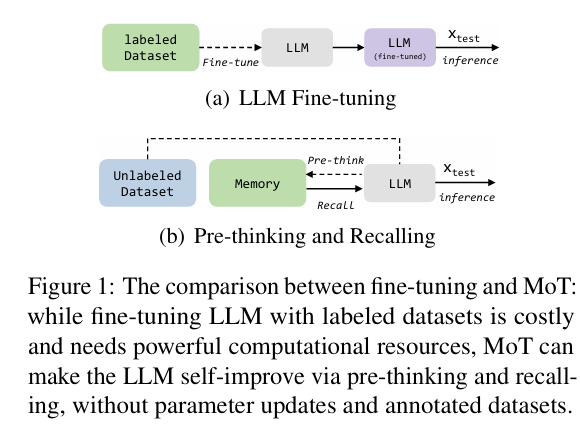

**Generated Contrastive COTs**

In [ ]:
!pip install

In [ ]:
import json
import random
import re
from pathlib import Path
from typing import List, TextIO

import openai
from datasets import load_dataset
# from fire import Fire
from pydantic import BaseModel
from tqdm import tqdm


def remove_substrings_with_double_angle_brackets(input_string):
    # Define the pattern to match substrings within double angled brackets
    pattern = r"<<[^>]+>>"
    # Use the sub() function from the re module to replace matching substrings with an empty string
    result = re.sub(pattern, "", input_string)
    return result


class ReasonSample(BaseModel):
    question: str
    explanation: str = ""
    answer: str = ""
    wrong_explanation: str = ""
    wrong_answer: str = ""
    pred: str = ""


class ReasonData(BaseModel):
    samples: List[ReasonSample]

    @classmethod
    def load(cls, path: str):
        samples = []
        with open(path) as f:
            for line in f:
                raw = json.loads(line)
                samples.append(ReasonSample(**raw))

        return cls(samples=samples)

    @classmethod
    def load_gsm8k_test(cls, path: str = "gsm8k", subset: str = "main", split="test"):
        samples = []
        for raw in load_dataset(path, subset, split=split):
            explanation, answer = raw["answer"].split("####")
            explanation = remove_substrings_with_double_angle_brackets(explanation)
            samples.append(
                ReasonSample(
                    question=raw["question"].strip(),
                    explanation=explanation.strip(),
                    answer=answer.strip(),
                )
            )

        return cls(samples=samples)

    @classmethod
    def load_gsm8k_incoherent_objects(cls, split: str = "test", sample: bool = False):
        if split == "train" and sample:
            samples = [
                ReasonSample(
                    question="There are 15 trees in the grove. Grove workers will plant trees in the grove today. After they are done, there will be 21 trees. How many trees did the grove workers plant today?",
                    explanation="There are 15 trees originally. Then there were 21 trees after the Grove workers planted some more. So there must have been 21 - 15 = 6 trees that were planted.",
                    answer="6",
                    wrong_explanation="There are 21 - 15 = 6 trees originally. Then there were 15 trees after the Grove workers planted some more. So there must have been 21 trees that were planted.",
                    wrong_answer="21",
                ),
                ReasonSample(
                    question="If there are 3 cars in the parking lot and 2 more cars arrive, how many cars are in the parking lot??",
                    explanation="There are originally 3 cars. Then 2 more cars arrive. Now 3 + 2 = 5 cars are in the parking lot.",
                    answer="5",
                    wrong_explanation="There are originally 3 + 2 = 5 cars. Then 3 more cars arrive. Now 2 cars are in the parking lot",
                    wrong_answer="2",
                ),
                ReasonSample(
                    question="Leah had 32 chocolates and her sister had 42. If they ate 35, how many pieces do they have left in total?",
                    explanation="Originally, Leah had 32 chocolates and her sister had 42. So in total they had 32 + 42 = 74. After eating 35, they had 74 - 35 = 39 pieces left in total.",
                    answer="39",
                    wrong_explanation="Originally, Leah had 32 + 42 = 74 chocolates and her sister had 32. So in total they had 74 - 35 = 39. After eating 35, they had 42 pieces left in total",
                    wrong_answer="42",
                ),
                ReasonSample(
                    question="Jason had 20 lollipops. He gave Denny some lollipops. Now Jason has 12 lollipops. How many lollipops did Jason give to Denny?",
                    explanation="Jason had 20 lollipops originally. Then he had 12 after giving some to Denny. So he gave Denny 20 - 12 = 8 lollipops.",
                    answer="8",
                    wrong_explanation="Jason had 20 - 12 = 8 lollipops originally. Then he had 20 after giving some to Denny. So he gave Denny 12 lollipops",
                    wrong_answer="12",
                ),
            ]
            return cls(samples=samples)
        else:
            return cls.load_gsm8k_test()

    @classmethod
    def load_from_name(cls, name: str, **kwargs):
        if name == "gsm8k":
            return cls.load_gsm8k_incoherent_objects(**kwargs)
        else:
            raise KeyError(name)


class Prompter(BaseModel):
    def run(self, data_train: ReasonData, sample_test: ReasonSample) -> str:
        prompt = ""
        for sample in data_train.samples:
            prompt += f"Question: {sample.question}\n"
            prompt += f"Answer: {sample.answer}\n\n"

        prompt += f"Question: {sample_test.question}\n"
        prompt += "Answer: "
        return prompt

    @staticmethod
    def get_answer(text: str) -> str:
        parts = text.split("Answer: ")
        if len(parts) >= 2:
            return parts[1]
        else:
            return text


class ChainThoughtPrompter(Prompter):
    def run(self, data_train: ReasonData, sample_test: ReasonSample) -> str:
        prompt = ""
        for sample in data_train.samples:
            prompt += f"Question: {sample.question}\n"
            prompt += f"Explanation: {sample.explanation}\n"
            prompt += f"Answer: {sample.answer}\n\n"

        prompt += f"Question: {sample_test.question}\n"
        prompt += "Explanation: "
        return prompt

    def get_explanation(self, text: str) -> str:
        assert self is not None
        return text.split("\nAnswer: ")[0]


class ContrastiveChainThoughtPrompter(Prompter):
    def run(self, data_train: ReasonData, sample_test: ReasonSample) -> str:
        prompt = ""
        for sample in data_train.samples:
            prompt += f"Question: {sample.question}\n"
            prompt += f"Explanation: {sample.explanation}\n"
            prompt += f"Answer: {sample.answer}\n"
            prompt += f"Wrong explanation: {sample.wrong_explanation}\n"
            prompt += f"Wrong Answer: {sample.wrong_answer}\n\n"

        prompt += f"Question: {sample_test.question}\n"
        prompt += "Explanation: "
        return prompt


def select_prompter(name: str):
    if name == "standard":
        return Prompter()
    if name == "cot":
        return ChainThoughtPrompter()
    if name == "contrast_cot":
        return ContrastiveChainThoughtPrompter()
    else:
        raise KeyError(name)


class OpenAIModel(BaseModel):
    engine : str = ''
    use_azure: bool = False
    timeout: int = 60
    temperature: float = 0.0

    def load(self):
        openai.api_key = 'sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6'
        self.engine = 'gpt-4o-mini'

    def run(self, prompt: str) -> str:
        self.load()
        output = ""
        error_message = "The response was filtered"

        while not output:
            try:
                key = "engine" if self.use_azure else "model"
                kwargs = {key: self.engine}
                response = openai.ChatCompletion.create(
                    messages=[{"role": "user", "content": prompt}],
                    timeout=self.timeout,
                    request_timeout=self.timeout,
                    temperature=self.temperature,  # this is the degree of randomness of the model's output
                )
                if response.choices[0].finish_reason == "content_filter":
                    raise ValueError(error_message)
                output = response.choices[0].message.content
            except Exception as e:
                print(e)
                if error_message in str(e):
                    output = error_message

            if not output:
                print("OpenAIModel request failed, retrying.")

        return output


class Scorer(BaseModel):
    @staticmethod
    def run(pred: str, gold: str) -> float:
        pred = pred.replace("$", "")
        gold = gold.replace("$", "")
        return float(pred.startswith(gold))


def evaluate(
    model: OpenAIModel,
    data_train: ReasonData,
    data_test: ReasonData,
    prompter: Prompter,
    file: TextIO,
) -> dict:
    is_correct = []
    score = 0

    progress = tqdm(data_test.samples)
    sample: ReasonSample

    for sample in progress:
        prompt = prompter.run(data_train, sample)
        raw = model.run(prompt).strip()
        sample.pred = prompter.get_answer(raw)
        is_correct.append(Scorer.run(sample.pred, sample.answer))
        score = sum(is_correct) / len(is_correct)
        progress.set_postfix(score=score)
        print(dict(prompt=prompt, raw=raw, gold=sample.answer, pred=sample.pred))
        print(sample.json(), file=file)

    return dict(score=score)


# def main(
#     data_name: 'gsm8k',
#     prompt_name: 'contrast_cot',
#     data_path: str = None,
#     num_shots: int = 4,
#     max_test_samples: int = 500,
#     seed: int = 0,
#     **kwargs,
# ):
#     model = OpenAIModel()
#     print(locals())

#     data_train = ReasonData.load_from_name(data_name, split="train", sample=True)
#     name = f"{prompt_name}_{num_shots=}_{max_test_samples=}"
#     data_test = ReasonData.load_from_name(data_name, split="test")

#     path_out = f"outputs/{data_name}/{kwargs.get('model_name')}/{name}.json"
#     if num_shots >= 0:
#         data_train.samples = data_train.samples[:num_shots]
#     if 0 < max_test_samples < len(data_test.samples):
#         random.seed(seed)
#         data_test.samples = random.sample(data_test.samples, k=max_test_samples)
#     print(dict(train=len(data_train.samples), test=len(data_test.samples)))

#     Path(path_out).parent.mkdir(exist_ok=True, parents=True)
#     with open(path_out, "w") as f:
#         prompter = select_prompter(prompt_name)
#         result = evaluate(model, data_train, data_test, prompter, file=f)

#     print(path_out)
#     print(result)
#     return result["score"]


def infer(prompt_name: str, question: str, **kwargs):
    model = OpenAIModel(**kwargs)
    data = ReasonData.load_from_name("gsm8k", split="train", sample=True)
    sample = ReasonSample(question=question)
    prompt = select_prompter(prompt_name).run(data, sample)
    output = model.run(prompt)
    generated_cots = dict(question=question, prompt=prompt, output=output)
    return generated_cots
data_test = ReasonData.load_from_name(data_name, split="test")


ModuleNotFoundError: No module named 'datasets'

##### ***Majority Voting***

Use ***Majority Voting*** [Sử dụng biểu quyết đa số] x
Uncertainty-Routed Chain Of Thought1 prompting generates multiple chain of thought reasoning chains ( This is either 8 or 32 in the original paper ). [Chuỗi suy nghĩ được định tuyến không chắc chắn1 gợi ý tạo ra nhiều chuỗi chuỗi lý luận suy nghĩ (Đây là 8 hoặc 32 trong bài báo gốc).] x

It then takes the majority answer out of these chains as the final solution only if the proportion of chains that agreed on this answer are higher than a specific threshold. [Sau đó, nó chỉ lấy câu trả lời đa số trong số các chuỗi này làm giải pháp cuối cùng nếu tỷ lệ các chuỗi đồng ý với câu trả lời này cao hơn một ngưỡng cụ thể.] x

In [ ]:
!pip install instructor

In [ ]:
import openai
from pydantic import BaseModel
import instructor
from textwrap import dedent
from typing import Literal
import asyncio
from collections import Counter

client = instructor.from_openai(openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))

class ChainOfThoughtResponse(BaseModel):
    chain_of_thought: str
    correct_answer: Literal["A", "B", "C", "D"]


async def generate_response(query: str, options: dict[str, str]):
    formatted_options = "\n".join(
        [f"{key}:{answer}" for key, answer in options.items()]
    )
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=ChainOfThoughtResponse,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are a a world class AI who excels at answering
                complex questions. Choose one of the options below
                that best answers the question you are about to be
                asked
                <question>
                {query}
                </question>

                <options>
                {formatted_options}
                </options>
                """
                ),
            }
        ],
    )


async def generate_batch_responses(
    query: str, options: dict[str, str], num_chains: int
) -> list[ChainOfThoughtResponse]:
    coros = [generate_response(query, options) for _ in range(num_chains)]
    return coros



In [ ]:
import nest_asyncio

if __name__ == "__main__":
    question = """In a population of giraffes, an environmental
    change occurs that favors individuals that are tallest. As a
    result, more of the taller individuals are able to obtain
    nutrients and survive to pass along their genetic information.
    This is an example of"""

    options = {
        "A": "directional selection",
        "B": "stabilizing selection",
        "C": "sexual selection",
        "D": "disruptive selection",
    }

    correct_answer = "A"
    k = 8
    threshold = 0.6
        # Get the event loop
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method
    responses = loop.run_until_complete(generate_batch_responses(question, options, k))

    # Await the coroutines to get the actual responses
    responses = loop.run_until_complete(asyncio.gather(*responses)) #This line await the coroutine in responses

    votes = Counter([response.correct_answer for response in responses])
    print(votes)
    #> Counter({'A': 8})

    majority_vote_element, majority_vote_count = votes.most_common(1)[0]
    print(majority_vote_element, majority_vote_count)
    #> A 8
    majority_threshold = majority_vote_count / k

    if majority_threshold < threshold:
        response = asyncio.run(generate_response(question, options))
        response = response.correct_answer
    else:
        response = majority_vote_element

    print(response)

TypeError: object ChainOfThoughtResponse can't be used in 'await' expression

##### ***Generate Prompt Variations***


Generate Prompt Variations

[Tạo các biến thể nhanh chóng] x

Large Language Models are sensitive to the way that they are prompted. When prompted incorrectly, they might perform much worse despite having the information or capability to respond to the prompt. Prompt Mining aims to help us discover better formats that occur more frequently in the corpus.

[Mô hình ngôn ngữ lớn rất nhạy cảm với cách chúng được nhắc. Khi được nhắc không chính xác, chúng có thể hoạt động kém hơn nhiều mặc dù có thông tin hoặc khả năng phản hồi lời nhắc. Khai thác nhanh chóng nhằm mục đích giúp chúng tôi khám phá các định dạng tốt hơn xuất hiện thường xuyên hơn trong kho dữ liệu.] x

Here are some examples of mined completions that were provided in the paper.
[Dưới đây là một số ví dụ về các lần hoàn thành khai thác đã được cung cấp trong bài báo.] x

Dưới đây là bảng tổng hợp các cặp "Manual Prompts" và "Mined Prompts" mà bạn yêu cầu:

| **Manual Prompts**                                 | **Mined Prompts**                             |
|---------------------------------------------------|----------------------------------------------|
| x is affiliated with the y religion               | x who converted to y                         |
| x được liên kết với tôn giáo y                    | x người đã chuyển đổi thành y                |
| x died in y                                       | x died at his home in y                      |
| x chết vào năm y                                  | x chết tại nhà riêng ở y                     |
| x is represented by music label y                 | x recorded for y                             |
| x được đại diện bởi hãng âm nhạc y                | x được ghi cho y                             |
| x is a subclass of y                              | x is a type of y                             |
| x là một lớp con của y                            | x là một loại y                              |
| The headquarter of x is in y                      | x is based in y                              |
| Trụ sở của x ở y                                  | x dựa trên y                                 |

The original paper uses a large wikipedia corpus to automatically extract prompt templates by looking at middle words of the prompts and parsing the dependencies within the sentence. We present a more lightweight approach to help achieve a similar result with instructor. [Bài viết gốc sử dụng kho dữ liệu wikipedia lớn để tự động trích xuất các mẫu lời nhắc bằng cách xem các từ ở giữa của lời nhắc và phân tích các phần phụ thuộc trong câu. Chúng tôi trình bày một cách tiếp cận nhẹ nhàng hơn để giúp đạt được kết quả tương tự với người hướng dẫn.] x

In [ ]:
from pydantic import BaseModel, Field
import instructor
from openai import OpenAI


class PromptTemplate(BaseModel):
    prompt_template: str = Field(
        description=(
            """
            A template that has the subject and object that we
            want to extract from the prompt replaced with a
            single placeholder of {subject} and {object}.
            Rephrase the prompt if necessary to make it more
            concise and easier to understand
            """
        ),
    )
class PromptTemplates(BaseModel):
    prompttemplates: list[PromptTemplate]


client = instructor.from_openai(OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))


def generate_prompt_templates(prompt: str):
    return client.chat.completions.create(
        messages=[
            {
                "role": "system",
                "content": (
                    "You are an expert prompt miner that excels at "
                    "generating prompt templates which are more "
                    "concise and easier to understand\n\nYou are "
                    "about to be passed a prompt to extract 3 new "
                    "prompt templates for"
                ),
            },
            {"role": "system", "content": prompt},
        ],
        response_model=PromptTemplates,
        temperature=0,
        max_retries=3,
        model="gpt-4o",
    )


if __name__ == "__main__":
    prompt = "France is the capital of Paris"
    prompt_template = generate_prompt_templates(prompt)
    for prompt in prompt_template:
        print(prompt)
        #> prompt_template='{subject} is the capital of {object}'
        #> prompt_template='The capital of {object} is {subject}'
        #> prompt_template="{object}'s capital is {subject}"

KeyboardInterrupt: 

### Ensembling

#### Prioritize Consistent Examples


##### Consistency Based Self Adaptive Prompting (COSP) (Draft)

Nhắc nhở tự thích ứng dựa trên tính nhất quán ( [COSP](https://arxiv.org/pdf/2305.14106)) x



COSP is a technique that aims to improve few-shot learning by selecting high-quality examples based on the consistency and confidence of model responses. This approach helps create more effective prompts by identifying examples that the model can process reliably. [COSP là một kỹ thuật nhằm cải thiện việc học vài lần bằng cách chọn các ví dụ chất lượng cao dựa trên tính nhất quán và độ tin cậy của các phản hồi của mô hình. Cách tiếp cận này giúp tạo ra các lời nhắc hiệu quả hơn bằng cách xác định các ví dụ mà mô hình có thể xử lý một cách đáng tin cậy.] x

Overview
The COSP process involves two main stages: [Quá trình COSP bao gồm hai giai đoạn chính:] x

Example Generation: Generate multiple responses for potential examples [Tạo ví dụ: Tạo nhiều phản hồi cho các ví dụ tiềm năng] x

Run each example through the model multiple times [Chạy từng ví dụ qua mô hình nhiều lần] x

Collect responses and confidence scores [Thu thập câu trả lời và điểm tin cậy] x

Example Selection: Select the best examples based on entropy and repetitiveness [Lựa chọn ví dụ: Chọn những ví dụ tốt nhất dựa trên entropy và độ lặp lại] x

Calculate entropy of responses to measure consistency [Tính toán entropy của các phản hồi để đo tính nhất quán] x

Evaluate repetitiveness to ensure reliability [Đánh giá độ lặp lại để đảm bảo độ tin cậy] x

How COSP Works [COSP hoạt động như thế nào] x

Stage 1: Example Generation [Giai đoạn 1: Tạo ví dụ] x

For each potential example in your dataset:
[Đối với mỗi ví dụ tiềm năng trong tập dữ liệu của bạn:] x

**Generate** multiple responses (typically 3-5)
[Tạo nhiều phản hồi (thường là 3-5)] x

**Calculate the entropy** of these responses [Tính entropy của những phản ứng này] x

**Measure the repetitiveness** across responses [Đo lường mức độ lặp lại của các phản hồi] x

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 12.6 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
from typing import List
from pydantic import BaseModel, Field
import openai
import instructor

class Response(BaseModel):
    content: str = Field(description="The model's response to the prompt")
    confidence: float = Field(description='Confidence score score between 0 and 1')

client = openai.OpenAI(api_key='sk-U7ti37t3osaeWme7m88923xFY2UMGVQLkeydTAywi3xI7TOP',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

def generate_response(prompt: str, n: int = 3)-> List[Response]:
  responses = []
  for _ in range(n):
    respone = client.chat.completions.create(
        model='gpt-4o-mini',
        messages=[{"role":"user", "content": prompt}],
        response_model=Response
    )
    responses.append(respone)
  return responses

Stage 2: Example Selection [Giai đoạn 2: Lựa chọn ví dụ] x

Calculate metrics for each example: [Tính số liệu cho từng ví dụ:] x

    Entropy: Measure response variability [Entropy: Đo lường độ biến thiên của phản ứng] x
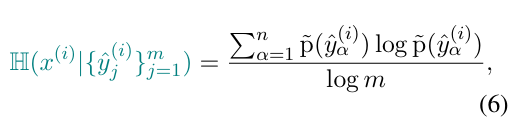

    Repetitiveness: Check response consistency [Tính lặp lại: Kiểm tra tính nhất quán của phản hồi] x

**Phạt việc lặp lại**  
Phương trình (6) đánh giá các câu hỏi thử nghiệm $x^{(i)} $, nhưng đối với mỗi $x^{(i)} $, đặc biệt là với những câu hỏi có entropy kết quả thấp, tồn tại nhiều đường suy luận $r^{(i)}_j $ dẫn đến dự đoán chính. Mặc dù chúng cùng đưa ra câu trả lời cuối cùng, chúng tôi nhận thấy mức độ phù hợp của chúng khi làm ví dụ trong ngữ cảnh lại khác nhau. Một quan sát quan trọng là các ví dụ lặp đi lặp lại thường dẫn đến hiệu suất kém hơn, như minh họa trong Hình 1 (xem Demo2).  

Chúng tôi giả thuyết rằng các phản hồi lặp lại, khi được sử dụng làm ví dụ, tạo ra một mô hình mạnh nhưng sai lệch mà các mô hình ngôn ngữ lớn (LLM) dễ bị quá khớp, thường dẫn đến sự suy giảm hiệu suất nghiêm trọng.  

Để giải quyết vấn đề này, trước tiên chúng tôi loại bỏ các phản hồi có liên quan đến việc tự đặt câu hỏi, điều mà chúng tôi quan sát thường dẫn đến sự lặp lại hoặc khiến LLM trả lời các câu hỏi tự sinh thay vì các câu hỏi ban đầu. Ngoài ra, chúng tôi giới thiệu một thước đo định lượng bằng cách chia các ví dụ thành các cụm từ được phân cách bằng các dấu câu (“[.,?!]”). Giả sử rằng chúng ta có $Q $ cụm từ*, chúng tôi tính mức độ lặp lại như sau:  

$$
R_r(r^{(i)}_j) = \frac{2}{Q(Q-1)} \sum_{a=1}^{Q} \sum_{b=a+1}^{Q} W_{ab},
$$

trong đó $W \in \mathbb{R}^{Q \times Q} $ là ma trận tương đồng giữa tất cả các cặp cụm từ, với $W_{ab} = Sc(\phi(q_a), \phi(q_b)) $.  

Ở đây, $Sc(\cdot, \cdot) $ tính toán độ tương đồng cosine và $\phi(q_a) $, $\phi(q_b) $ biểu diễn embedding vector của cụm từ thứ $a $ và $b $, thường được lấy từ một mô hình ngôn ngữ nhỏ phụ trợ. Từ Phương trình (7), ma trận này được tóm tắt bằng cách lấy trung bình trên các phần tử không thuộc đường chéo chính, từ đó thu được độ tương đồng trung bình giữa hai cụm từ bất kỳ trong phản hồi.  

Chúng tôi lưu ý rằng có thể áp dụng các kỹ thuật khác để phạt việc lặp lại trong thời gian giải mã, như chặn n-gram cứng hoặc mềm (Klein và cộng sự, 2017; Paulus và cộng sự, 2017). Tuy nhiên, chúng tôi sử dụng phương pháp được đề xuất vì nó cũng nắm bắt được các lặp lại ở cấp độ ngữ nghĩa, điều mà chúng tôi nhận thấy phổ biến hơn các lặp lại nguyên văn, đặc biệt khi sử dụng tempature khác 0. (“Tempature” là cài đặt kiểm soát tính ngẫu nhiên khi chọn từ trong quá trình tạo văn bản. Giá trị nhiệt độ thấp làm cho văn bản dễ đoán và nhất quán hơn, trong khi giá trị cao cho phép kết hợp tự do và sáng tạo hơn, nhưng cũng có thể khiến mọi thứ kém nhất quán(consistent) hơn.)

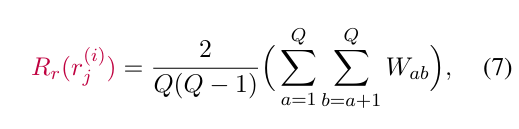

In [ ]:
import numpy as np
import torch
import torch.nn as nn
from scipy.stats import entropy
from transformers import RobertaTokenizerFast

def similarity(qa, qb):
    tokenizer = RobertaTokenizerFast.from_pretrained("FacebookAI/roberta-base")
    qa_tokens = tokenizer.encode(qa, return_tensors='pt')  # Encode and convert to PyTorch tensor
    qb_tokens = tokenizer.encode(qb, return_tensors='pt')  # Encode and convert to PyTorch tensor
    cos = nn.CosineSimilarity(dim=0, eps=1e-6)

    # Convert the token IDs to floating-point type
    qa_tokens = qa_tokens[0].type(torch.float32)
    qb_tokens = qb_tokens[0].type(torch.float32)

    # Pad the shorter tensor to match the length of the longer tensor
    max_len = max(len(qa_tokens), len(qb_tokens))
    qa_tokens = torch.cat([qa_tokens, torch.zeros(max_len - len(qa_tokens), dtype=torch.float32)])
    qb_tokens = torch.cat([qb_tokens, torch.zeros(max_len - len(qb_tokens), dtype=torch.float32)])


    # if you want to calculate the similarity using the token IDs directly:
    return cos(qa_tokens, qb_tokens)


TypeError: 

In [ ]:
def calculate_metrics(responses: List[Response]) -> tuple[float, float]:
    # Calculate entropy
    confidences = [r.confidence for r in responses]
    entropy_score = entropy(confidences)

    unique_responses = len(set(r.content for r in responses))
    repetitiveness = [similarity(responses[i].content, responses[i+1].content) for i in range(responses)]
    repetitiveness = repetitiveness*(2/(len(responses)*(len(responses))))
    return entropy_score, repetitiveness

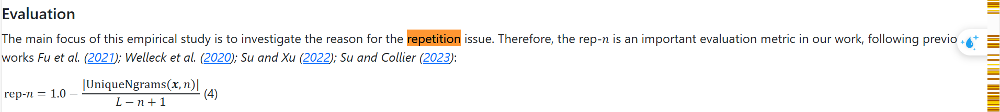

source image : https://arxiv.org/html/2310.10226

In [ ]:
import numpy as np
from scipy.stats import entropy

def calculate_metrics(responses: List[Response])-> tuple[float, float]:
    # Calculate entropy
    confidences = [r.confidence for r in responses]
    entropy_score = entropy(confidences)

    unique_responses = len(set(r.content for r in responses))
    repetitiveness = 1 - (unique_responses / (len(responses))-len(unique_responses) + 1)

    return entropy_score, repetitiveness

Implementation Example

Here's a complete example of COSP implementation:

In [ ]:
class COSPSelector:
    def __init__(self, client: OpenAI, n_samples: int = 3):
        self.client = instructor.from_openai(client)
        self.n_samples = n_samples

    def generate_responses(self, prompt: str) -> List[Response]:
        return [
            self.client.chat.completions.create(
                model="gpt-4o-mini",
                messages=[{"role": "user", "content": prompt}],
                response_model=Response
            )
            for _ in range(self.n_samples)
        ]

    # def calculate_metrics(self, responses: List[Response]) -> tuple[float, float]: # Added self as the first argument
    #     # Calculate entropy
    #     confidences = [r.confidence for r in responses]
    #     entropy_score = entropy(confidences)

    #     unique_responses = len(set(r.content for r in responses))
    #     # Iterate through the indices of responses using len(responses) to get the sequence length
    #    # Iterate through the indices of responses using len(responses) to get the sequence length
    #     repetitiveness = [similarity(responses[i].content, responses[i+1].content) for i in range(len(responses) -1 )]
    #     # Calculate the average repetitiveness score instead of multiplying the list
    #     repetitiveness = sum(repetitiveness) * (2 / (len(responses) * (len(responses) - 1))) if len(responses) > 1 else 0
    #     return entropy_score, repetitiveness
    def calculate_metrics(self, responses: List[Response]) -> Tuple[float, float]:
        confidences = [r.confidence for r in responses]
        entropy_score = entropy(confidences)

        unique_responses = len(set(r.content for r in responses))
        repetitiveness = 1 - (unique_responses / len(responses))

        return entropy_score, repetitiveness

    def select_examples(self, candidates: List[str], k: int) -> List[Example]:
        examples = []
        lambda_ = 0.2
        for text in candidates:
            responses = self.generate_responses(text)
            entropy_score, repetitiveness = self.calculate_metrics(responses)

            # Combined score (lower is better)
            score = entropy_score + lambda_*repetitiveness

            examples.append(Example(
                text=text,
                score=score,
                entropy=entropy_score,
                repetitiveness=repetitiveness
            ))

        # Sort by score (lower is better) and select top k
        return sorted(examples, key=lambda x: x.score)[:k]

In [ ]:
# Initialize COSP selector
client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
# client = OpenAI(client)
selector = COSPSelector(client)

# Candidate examples
candidates = [
    "John bought 21 games from a friend and bought 8 more at a garage sale. If 23 of the games didn't work, how many good games did he end up with? A: Let's think step by step",
    "Machine learning is a subset of artificial intelligence",
    "Python is a high-level programming language",
    " Q: Faye picked 23 and her mother picked 5 carrots from the garden. If only 12 of the carrots were good, how many carrots were bad? A: Let's think step by step"
    # ... more examples
]




In [ ]:
selector.generate_responses(prompt)


[Response(content="Let's think step by step:\n1. Henry started with 11 dollars.\n2. For his birthday, he received 18 more dollars. So, we add that to his original amount:\n   11 + 18 = 29 dollars.\n3. He then spent 10 dollars on a new game. To find out how much he has now, we subtract that amount:\n   29 - 10 = 19 dollars.\n\nSo, Henry has 19 dollars now.", confidence=0.95),
 Response(content="Let's think step by step:\n1. Henry initially had 11 dollars.\n2. He received 18 more dollars for his birthday.\n3. To find out how much money he has now, we first add his initial amount to the birthday money: 11 + 18 = 29 dollars.\n4. He spent 10 dollars on a new game.\n5. Now, we subtract the money spent from his total: 29 - 10 = 19 dollars.\n\nTherefore, Henry now has 19 dollars.", confidence=0.95),
 Response(content="Let's think step by step.\n\n1. Henry started with 11 dollars.\n2. He received 18 more dollars for his birthday, so now he has: 11 + 18 = 29 dollars.\n3. He spent 10 dollars on a

In [ ]:
best_examples

[Example(text=" Q: Faye picked 23 and her mother picked 5 carrots from the garden. If only 12 of the carrots were good, how many carrots were bad? A: Let's think step by step", score=1.098291461262726, entropy=1.098291461262726, repetitiveness=0.0),
 Example(text="John bought 21 games from a friend and bought 8 more at a garage sale. If 23 of the games didn't work, how many good games did he end up with? A: Let's think step by step", score=1.0985041526574084, entropy=1.0985041526574084, repetitiveness=0.0),
 Example(text='Machine learning is a subset of artificial intelligence', score=1.0986122886681096, entropy=1.0986122886681096, repetitiveness=0.0)]

In [ ]:
import instructor
from pydantic import BaseModel
from openai import OpenAI
from typing import Literal

n = 4  # num examples to generate per class

client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)
class GeneratedReview(BaseModel):
    review: str
    sentiment: Literal["positive", "negative"]


class SentimentPrediction(BaseModel):
    sentiment: Literal["positive", "negative"]



def generate_sample(input_review, sentiment):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=GeneratedReview,
        messages=[
            {
                "role": "user",
                "content": f"""
                           Generate a '{sentiment}' review similar to: {input_review}
                           Generated review:
                           """,
            }
        ],
    )


# def predict_sentiment(input_review, in_context_samples):
#     return client.chat.completions.create(
#         model="gpt-4o",
#         response_model=SentimentPrediction,
#         messages=[
#             {
#                 "role": "user",
#                 "content": "".join(
#                     [
#                         f"Review: {sample.review}\nSentiment: {sample.sentiment}\n\n"
#                         for sample in in_context_samples
#                     ]
#                 )
#                 + f"Review: {input_review}\nSentiment:",
#             }
#         ],
#     ).sentiment


if __name__ == "__main__":
    input_review = (
        "This movie was a rollercoaster of emotions, keeping me engaged throughout."
    )

    # Generate in-context samples
    samples = [
        generate_sample(input_review, sentiment)
        for sentiment in ('positive', 'negative')
        for _ in range(n)
    ]
    for sample in samples:
        print(sample)

review='This film took me on an exhilarating journey, filled with unexpected twists and heartwarming moments that kept me hooked from start to finish.' sentiment='positive'
review='This film took me on an exhilarating journey filled with ups and downs, and I was hooked from start to finish.' sentiment='positive'
review='This film took me on an exhilarating journey, capturing my attention from start to finish with its captivating storyline.' sentiment='positive'
review='This film took me on an exhilarating journey, captivating my attention from start to finish.' sentiment='positive'
review='This movie was a chaotic mess, leaving me confused and frustrated throughout.' sentiment='negative'
review='This movie was a chaotic mess, leaving me frustrated and confused throughout.' sentiment='negative'
review='This movie was a total letdown, dragging on without any real excitement or depth.' sentiment='negative'
review='This movie was a disjointed mess, failing to hold my attention at any point

In [ ]:
def create_question_answer_dict(generated_review):
    return "question: " f"What is the sentiment of the review: '{generated_review.review}'?" + "answer : " +  generated_review.sentiment

In [ ]:
candidates = [create_question_answer_dict(sample) for sample in samples]

In [ ]:
candidates

["question: What is the sentiment of the review: 'This film took me on an exhilarating journey, filled with unexpected twists and heartwarming moments that kept me hooked from start to finish.'?answer : positive",
 "question: What is the sentiment of the review: 'This film took me on an exhilarating journey filled with ups and downs, and I was hooked from start to finish.'?answer : positive",
 "question: What is the sentiment of the review: 'This film took me on an exhilarating journey, capturing my attention from start to finish with its captivating storyline.'?answer : positive",
 "question: What is the sentiment of the review: 'This film took me on an exhilarating journey, captivating my attention from start to finish.'?answer : positive",
 "question: What is the sentiment of the review: 'This movie was a chaotic mess, leaving me confused and frustrated throughout.'?answer : negative",
 "question: What is the sentiment of the review: 'This movie was a chaotic mess, leaving me frustr

In [ ]:
# Select best examples
best_examples = selector.select_examples(candidates, k=3)

# Use selected examples in your prompt
selected_texts = [ex.text for ex in best_examples]
prompt = f"""Use these examples to guide your response:

Examples:
{chr(10).join(f'- {text}' for text in selected_texts)}

Now, please respond to: [This movie was a rollercoaster of emotions, keeping me engaged throughout.]
"""
selector.generate_responses(prompt)

[Response(content='positive', confidence=0.95),
 Response(content='positive', confidence=0.95),
 Response(content='positive', confidence=0.95)]

In [ ]:
best_examples

[Example(text="question: What is the sentiment of the review: 'This movie was a total letdown, dragging on without any real excitement or depth.'?answer : negative", score=1.0986122886681096, entropy=1.0986122886681096, repetitiveness=0.0),
 Example(text="question: What is the sentiment of the review: 'This movie was a disjointed mess, failing to hold my attention at any point.'?answer : negative", score=1.0986122886681096, entropy=1.0986122886681096, repetitiveness=0.0),
 Example(text="question: What is the sentiment of the review: 'This film took me on an exhilarating journey, filled with unexpected twists and heartwarming moments that kept me hooked from start to finish.'?answer : positive", score=1.1652789553347762, entropy=1.0986122886681096, repetitiveness=0.33333333333333337)]

##### Consistency Based Self Adaptive Prompting (COSP)

Consistency Based Self Adaptive Prompting (COSP)1 aims to improve LLM output quality by generating high quality few shot examples to be included in the final prompt. These are examples without labelled ground truth so they use self-consistency and a metric known as normalized entropy to select the best examples. [Nhắc nhở tự thích ứng dựa trên tính nhất quán (COSP)1 nhằm mục đích cải thiện chất lượng đầu ra LLM bằng cách tạo ra một số ví dụ về cảnh quay chất lượng cao để đưa vào lời nhắc cuối cùng. Đây là những ví dụ không được gắn nhãn sự thật cơ bản nên chúng sử dụng tính tự nhất quán và số liệu được gọi là entropy chuẩn hóa để chọn ra những ví dụ tốt nhất.] x

Once they've selected the examples, they then append them to the prompt and generate multiple reasoning chains before selecting the final result using Self-Consistency. [Sau khi chọn xong các ví dụ, họ sẽ thêm chúng vào lời nhắc và tạo ra nhiều chuỗi suy luận trước khi chọn kết quả cuối cùng bằng cách sử dụng Tính tự nhất quán.] x

COSP process

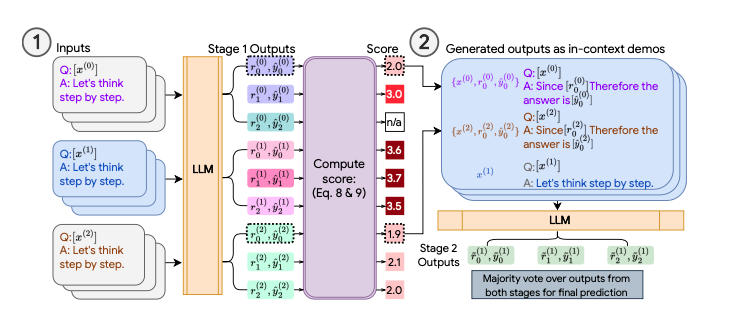



###### Step 1 - Selecting Examples

In the first step, we try to generate high quality examples from questions that don't have ground truth labels. This is challenging because we want to find a way to automatically determine answer quality when sampling our model multiple times. [Ở bước đầu tiên, chúng tôi cố gắng tạo ra các ví dụ chất lượng cao từ các câu hỏi không có nhãn căn cứ xác thực. Đây là một thách thức vì chúng tôi muốn tìm cách tự động xác định chất lượng câu trả lời khi lấy mẫu mô hình của chúng tôi nhiều lần.] x

In this case, we have n questions which we want to generate m possible reasoning chains for each question. This gives a total of nm examples. We then want to filter out k final few shot examples from these nm examples to be included inside our final prompt. [Trong trường hợp này, chúng ta có n câu hỏi mà chúng ta muốn tạo ra m chuỗi suy luận khả dĩ cho mỗi câu hỏi. Điều này đưa ra tổng số nm ví dụ. Sau đó, chúng tôi muốn lọc ra k mẫu ảnh cuối cùng từ các mẫu nm này để đưa vào dấu nhắc cuối cùng của chúng tôi.] x

1. Using chain of thought, we first generate m responses for each question. These responses contain a final answer and a rationale behind that answer. [Bằng cách sử dụng chuỗi suy nghĩ, trước tiên chúng tôi tạo ra m câu trả lời cho mỗi câu hỏi. Những câu trả lời này chứa câu trả lời cuối cùng và lý do căn bản đằng sau câu trả lời đó.] x

2. We compute a score for each response using a weighted sum of two values - normalized entropy and repetitiveness ( How many times this rationale appears for this amswer ) [Chúng tôi tính điểm cho mỗi phản hồi bằng cách sử dụng tổng có trọng số của hai giá trị - entropy chuẩn hóa và độ lặp lại (Cơ sở lý luận này xuất hiện bao nhiêu lần cho câu trả lời này)] x

3. We rank all of our nm responses using this score and choose the k examples with the lowest scores as our final few shot examples. [Chúng tôi xếp hạng tất cả các phản hồi nm của mình bằng cách sử dụng điểm này và chọn k ví dụ có điểm thấp nhất làm vài ví dụ về cảnh quay cuối cùng của chúng tôi.] x

Normalized Entropy [Entropy chuẩn hóa] x



> In the paper, the authors write that normalized entropy is a good proxy over a number of different tasks where low entropy is positively correlated with correctness. Entropy is also supposed to range from 0 to 1. [Trong bài báo, các tác giả viết rằng entropy chuẩn hóa là một đại diện tốt cho một số nhiệm vụ khác nhau trong đó entropy thấp có tương quan thuận với độ chính xác. Entropy cũng được cho là nằm trong khoảng từ 0 đến 1.] x



> Therefore in order to do so, we introduce a - term in our implementation so that the calculated values range from 0 to 1. [Do đó, để làm như vậy, chúng tôi đưa ra thuật ngữ - trong quá trình triển khai để các giá trị được tính nằm trong khoảng từ 0 đến 1.] x

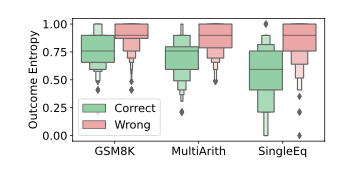

Assuming that for a specific question
x
(
i
)
x
(i)
 , we have generated
m
m final answers of which
u
u are unique. ( Note that this only cares about the answer itself and not the rationale ) [Giả sử rằng đối với một câu hỏi cụ thể 𝑥 ( 𝑖 )  , chúng ta đã tạo ra 𝑚 m câu trả lời cuối cùng trong đó 𝑢 bạn là duy nhất. (Lưu ý rằng điều này chỉ quan tâm đến câu trả lời chứ không phải lý do)]

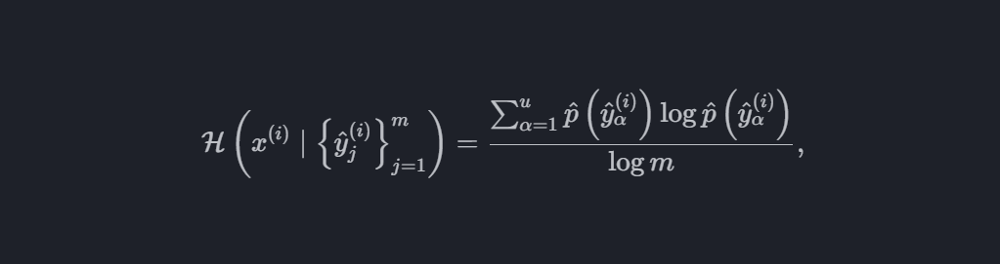

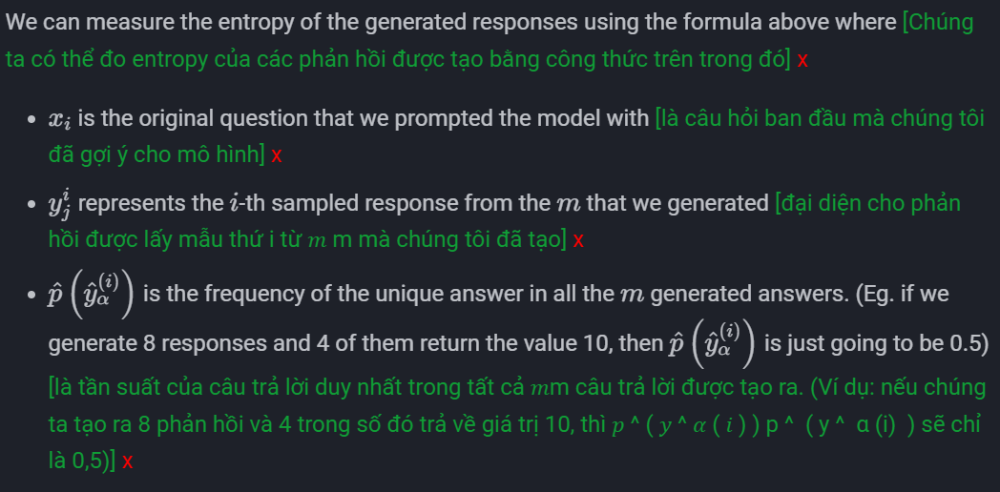



Repetitiveness [Sự lặp lại]

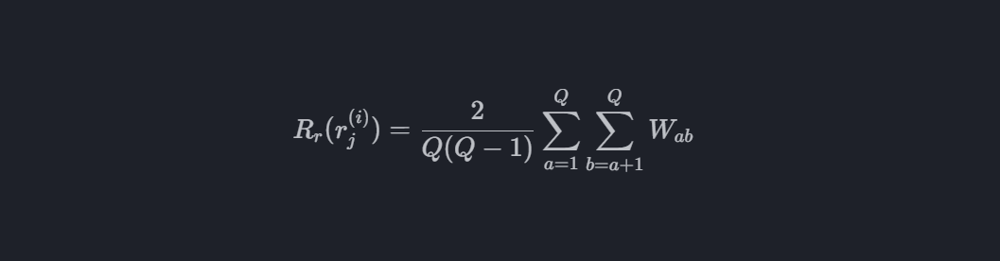

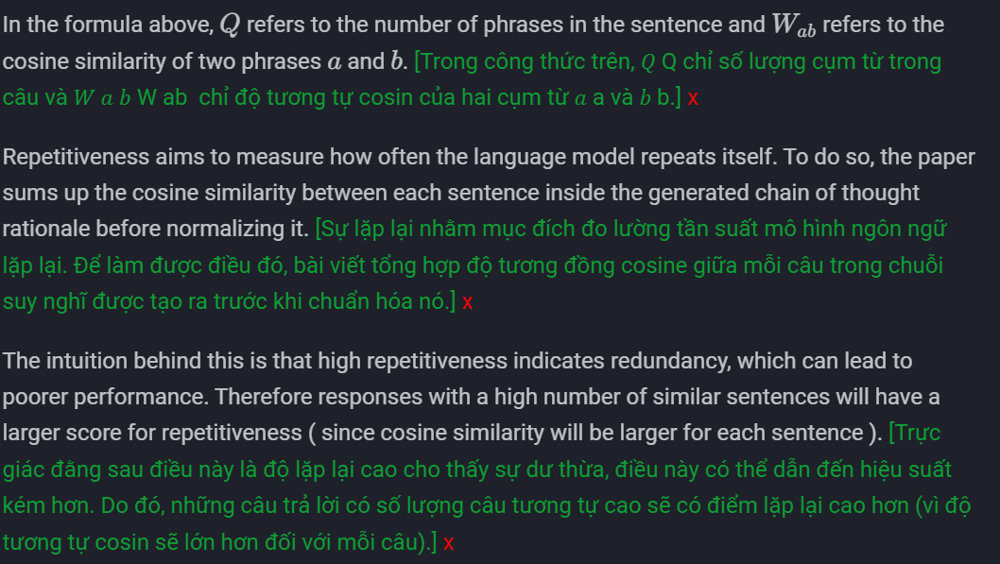

Step 2 - Self Consistency [Bước 2 - Tự thống nhất]

We now take our k responses and append them to our prompt. We then sample our model multiple times using this new prompt and take the majority vote as the answer. [Bây giờ chúng tôi lấy k câu trả lời và thêm chúng vào lời nhắc của chúng tôi. Sau đó, chúng tôi lấy mẫu mô hình của mình nhiều lần bằng cách sử dụng lời nhắc mới này và lấy đa số phiếu bầu làm câu trả lời.]

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from pydantic import BaseModel
from collections import defaultdict, Counter
import openai
import asyncio
from textwrap import dedent
import math

client = openai.AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class Response(BaseModel):
    chain_of_thought: list[str]
    answer: int


class ResponseScore(BaseModel):
    query: str
    response: Response
    score: float

    def format_response(self):
        return dedent(
            f"""
            Q: {self.query}
            A: {''.join(self.response.chain_of_thought)}. Therefore the answer is {self.response.answer}.
            """
        )


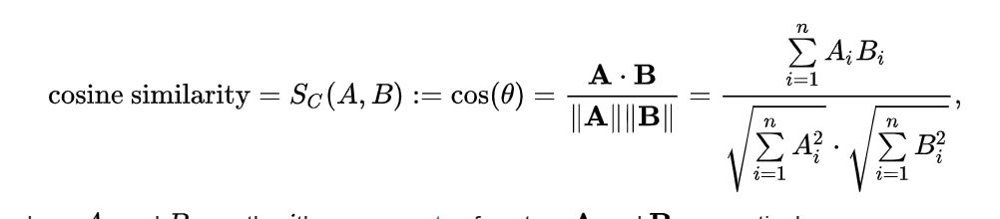

In [ ]:
embedding = client.embeddings.create(
    input='tuyen', model="text-embedding-3-small"
)

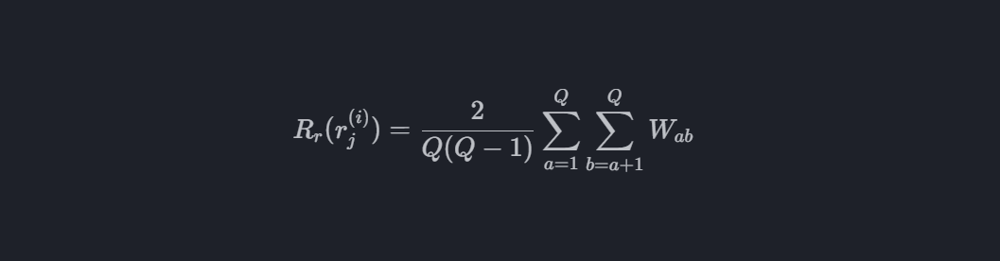

In [ ]:
def cosine_similarity(vec1: list[float], vec2: list[float]):
    dot_product = sum(a * b for a, b in zip(vec1, vec2))
    magnitude1 = math.sqrt(sum(a * a for a in vec1))
    magnitude2 = math.sqrt(sum(b * b for b in vec2))

    if magnitude1 * magnitude2 == 0:
        return 0  # Handle the case of zero vectors

    return dot_product / (magnitude1 * magnitude2)


def score_repetitiveness(prediction: Response):

    embedding = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1").embeddings.create(
        input=prediction, model="text-embedding-3-small"
    )
    embedding = [item.embedding for item in embedding.data]
    print(len(embedding))
    ttl = 0
    num_comparisons = 0
    for idx in range(len(embedding)):
        for idx2 in range(idx + 1, len(embedding)):
            ttl += cosine_similarity(embedding[idx], embedding[idx2])
            num_comparisons += 1
    print(num_comparisons)
    return 2*ttl/(num_comparisons)*(num_comparisons - 1) if num_comparisons > 0 else 0

In [ ]:
async def generate_cot_response(query: str) -> tuple[Response, str]:
    return (
        await client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[{"role": "user", "content": query}],
            response_model=Response,
            temperature=0.4,
        ),
        query,
    )


async def generate_batch_cot_responses(
    queries: list[str], m: int
) -> list[tuple[Response, str]]:
    coros = [generate_cot_response(query) for query in queries for _ in range(m)]
    return await asyncio.gather(*coros)

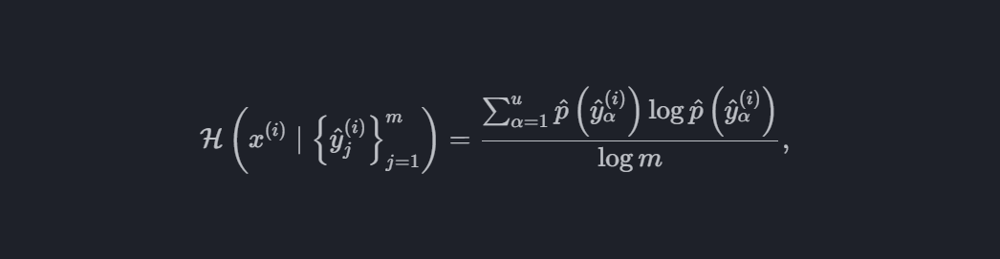

In [ ]:
score_responses(responses,0.2)

AttributeError: 'tuple' object has no attribute 'chain_of_thought'

In [ ]:
for prediction, query in responses:
    print(score_repetitiveness(''.join(prediction[1])))
    print('------')

1
0
0
------
1
0
0
------


KeyboardInterrupt: 

In [ ]:
query_to_entropy = {
    query: score_entropy(query)
    for query, predictions in query_to_responses.items()
}

TypeError: unhashable type: 'list'

In [ ]:
def score_entropy(predictions: list[Response]):
    counter = Counter([prediction for prediction in predictions])

    prob = [counter[i] / len(predictions) for i in counter]

    numer = -sum([p * math.log(p) for p in prob])
    denom = math.log(len(predictions))

    return numer / denom

In [ ]:
def score_responses(
    predictions: list[tuple[Response, str]], trade_off_param: float
) -> list[ResponseScore]:
    query_to_responses: dict[str, list[Response]] = defaultdict(list)
    for prediction, query in predictions:
        query_to_responses[query].append(prediction)

    query_to_entropy = {
        query: score_entropy(query)
        for query, predictions in query_to_responses.items()
    }

    return [
        ResponseScore(
            query=query,
            response=prediction,
            score=query_to_entropy[query]
            + trade_off_param * score_repetitiveness(''.join(prediction[1])),
        )
        for prediction, query in predictions
    ]

In [ ]:
def get_top_k_examples(queries: list[ResponseScore], k: int):
    """
    This gets the top k responses that have the minimum possible score
    """
    sorted_responses = sorted(queries, key=lambda x: x.score)
    return sorted_responses[:k]

In [ ]:
async def generate_answer_with_examples(query: str, examples: list[ResponseScore]):
    formatted_examples = "\n".join([example.format_response() for example in examples])
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are a world class AI system that excels at answering user queries

                <query>
                {query}
                </query>

                <examples>
                {formatted_examples}
                </examples>
                """
                ),
            }
        ],
        response_model=Response,
    )

In [ ]:
async def generate_final_answers(
    query: str, examples: list[ResponseScore], number_samples: int
):
    coros = [
        generate_answer_with_examples(query, examples) for _ in range(number_samples)
    ]

    return await asyncio.gather(*coros)

***Data with Contrastive Chain Of Though***

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.8 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import json
import random
import instructor
import re
from pathlib import Path
from typing import List, TextIO

import openai
from datasets import load_dataset
# from fire import Fire
from pydantic import BaseModel
from tqdm import tqdm


def remove_substrings_with_double_angle_brackets(input_string):
    # Define the pattern to match substrings within double angled brackets
    pattern = r"<<[^>]+>>"
    # Use the sub() function from the re module to replace matching substrings with an empty string
    result = re.sub(pattern, "", input_string)
    return result


class ReasonSample(BaseModel):
    question: str
    explanation: str = ""
    answer: str = ""
    wrong_explanation: str = ""
    wrong_answer: str = ""
    pred: str = ""


class ReasonData(BaseModel):
    samples: List[ReasonSample]

    @classmethod
    def load(cls, path: str):
        samples = []
        with open(path) as f:
            for line in f:
                raw = json.loads(line)
                samples.append(ReasonSample(**raw))

        return cls(samples=samples)

    @classmethod
    def load_gsm8k_test(cls, path: str = "gsm8k", subset: str = "main", split="test"):
        samples = []
        for raw in load_dataset(path, subset, split=split):
            explanation, answer = raw["answer"].split("####")
            explanation = remove_substrings_with_double_angle_brackets(explanation)
            samples.append(
                ReasonSample(
                    question=raw["question"].strip(),
                    explanation=explanation.strip(),
                    answer=answer.strip(),
                )
            )

        return cls(samples=samples)

    @classmethod
    def load_gsm8k_incoherent_objects(cls, split: str = "test", sample: bool = False):
        if split == "train" and sample:
            samples = [
                ReasonSample(
                    question="There are 15 trees in the grove. Grove workers will plant trees in the grove today. After they are done, there will be 21 trees. How many trees did the grove workers plant today?",
                    explanation="There are 15 trees originally. Then there were 21 trees after the Grove workers planted some more. So there must have been 21 - 15 = 6 trees that were planted.",
                    answer="6",
                    wrong_explanation="There are 21 - 15 = 6 trees originally. Then there were 15 trees after the Grove workers planted some more. So there must have been 21 trees that were planted.",
                    wrong_answer="21",
                ),
                ReasonSample(
                    question="If there are 3 cars in the parking lot and 2 more cars arrive, how many cars are in the parking lot??",
                    explanation="There are originally 3 cars. Then 2 more cars arrive. Now 3 + 2 = 5 cars are in the parking lot.",
                    answer="5",
                    wrong_explanation="There are originally 3 + 2 = 5 cars. Then 3 more cars arrive. Now 2 cars are in the parking lot",
                    wrong_answer="2",
                ),
                ReasonSample(
                    question="Leah had 32 chocolates and her sister had 42. If they ate 35, how many pieces do they have left in total?",
                    explanation="Originally, Leah had 32 chocolates and her sister had 42. So in total they had 32 + 42 = 74. After eating 35, they had 74 - 35 = 39 pieces left in total.",
                    answer="39",
                    wrong_explanation="Originally, Leah had 32 + 42 = 74 chocolates and her sister had 32. So in total they had 74 - 35 = 39. After eating 35, they had 42 pieces left in total",
                    wrong_answer="42",
                ),
                ReasonSample(
                    question="Jason had 20 lollipops. He gave Denny some lollipops. Now Jason has 12 lollipops. How many lollipops did Jason give to Denny?",
                    explanation="Jason had 20 lollipops originally. Then he had 12 after giving some to Denny. So he gave Denny 20 - 12 = 8 lollipops.",
                    answer="8",
                    wrong_explanation="Jason had 20 - 12 = 8 lollipops originally. Then he had 20 after giving some to Denny. So he gave Denny 12 lollipops",
                    wrong_answer="12",
                ),
            ]
            return cls(samples=samples)
        else:
            return cls.load_gsm8k_test()

    @classmethod
    def load_from_name(cls, name: str, **kwargs):
        if name == "gsm8k":
            return cls.load_gsm8k_incoherent_objects(**kwargs)
        else:
            raise KeyError(name)


In [ ]:
data_name = 'gsm8k'
data_train = ReasonData.load_from_name(data_name, split="train", sample=True)

In [ ]:
for question in data_train.samples:
  print(question.question)

There are 15 trees in the grove. Grove workers will plant trees in the grove today. After they are done, there will be 21 trees. How many trees did the grove workers plant today?
If there are 3 cars in the parking lot and 2 more cars arrive, how many cars are in the parking lot??
Leah had 32 chocolates and her sister had 42. If they ate 35, how many pieces do they have left in total?
Jason had 20 lollipops. He gave Denny some lollipops. Now Jason has 12 lollipops. How many lollipops did Jason give to Denny?


In [ ]:
questions = [(question.question,) for question in data_train.samples]

In [ ]:
questions

[('There are 15 trees in the grove. Grove workers will plant trees in the grove today. After they are done, there will be 21 trees. How many trees did the grove workers plant today?',),
 ('If there are 3 cars in the parking lot and 2 more cars arrive, how many cars are in the parking lot??',),
 ('Leah had 32 chocolates and her sister had 42. If they ate 35, how many pieces do they have left in total?',),
 ('Jason had 20 lollipops. He gave Denny some lollipops. Now Jason has 12 lollipops. How many lollipops did Jason give to Denny?',)]

In [ ]:
example_questions = [
        (
            "Debby's class is going on a field trip to the zoo. "
            "If each van can hold 4 people and there are 2 students "
            "and 6 adults going, how many vans will they need?"
        ),
        (
            "Nancy had 80 files on her computer. She deleted 31 of "
            "them and put the rest into folders with 7 files in each "
            "one. How many folders did Nancy end up with?"
        ),
        (
            "At the arcade, Tom won 32 tickets playing 'whack a mole' "
            "and 25 tickets playing 'skee ball'. If he spent 7 of his "
            "tickets on a hat, how many tickets does Tom have left?"
        ),
    ]

In [ ]:
query = (
    "The schools debate team had 5 boys and 40 girls on it. "
    "If they were split into groups of 9 how many groups "
    "could they make?"
)

In [ ]:
import nest_asyncio
loop = asyncio.get_event_loop()

# Apply nest_asyncio to the loop
nest_asyncio.apply(loop)

# Run the coroutine using the loop's run_until_complete method
m = 2  # Number of Reasoning Chains per example ( Step 1 )
k = 3  # Number of Examples to include in final prompt (Step 2)
n = 2  # Number of Reasoning Chains For Self-Consistency ( Step 2 )

# Step 1 : Generate the examples
responses = loop.run_until_complete(generate_batch_cot_responses(example_questions, m))

In [ ]:
scored_responses = score_responses(responses, 0.2)

chosen_examples = get_top_k_examples(scored_responses, k)

# Step 2 : Run Self-Consistency
final_responses = asyncio.run(generate_final_answers(query, chosen_examples, n))

c = Counter([response.answer for response in final_responses])
answer = c.most_common(1)[0][0]

print(answer)

AttributeError: 'tuple' object has no attribute 'answer'

In [ ]:
import instructor
from pydantic import BaseModel
from openai import AsyncOpenAI, OpenAI
from collections import defaultdict, Counter
import asyncio
from textwrap import dedent
import math

client = openai.AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class Response(BaseModel):
    chain_of_thought: list[str]
    contrastive_chain_of_thought: list[str]
    answer: int


class ResponseScore(BaseModel):
    query: str
    response: Response
    score: float

    def format_response(self):
        return dedent(
            f"""
            Q: {self.query}
            A: {''.join(self.response.chain_of_thought)}. Therefore the answer is {self.response.answer}.
            """
        )


def cosine_similarity(vec1: list[float], vec2: list[float]):
    dot_product = sum(a * b for a, b in zip(vec1, vec2))
    magnitude1 = math.sqrt(sum(a * a for a in vec1))
    magnitude2 = math.sqrt(sum(b * b for b in vec2))

    if magnitude1 * magnitude2 == 0:
        return 0  # Handle the case of zero vectors

    return dot_product / (magnitude1 * magnitude2)


def score_repetitiveness(prediction: Response):
    if len(prediction.chain_of_thought) == 1:
        return 0

    embedding = OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',base_url="https://api.chatanywhere.tech/v1").embeddings.create(
        input=prediction.chain_of_thought, model="text-embedding-3-small"
    )
    embedding = [item.embedding for item in embedding.data]

    ttl = 0
    num_comparisons = 0
    for idx in range(len(embedding)):
        for idx2 in range(idx + 1, len(embedding)):
            ttl += cosine_similarity(embedding[idx], embedding[idx2])
            num_comparisons += 1

    return ttl / num_comparisons if num_comparisons > 0 else 0


async def generate_cot_response(query: str) -> tuple[Response, str]:
    return (
        await client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[{"role": "user", "content": query}],
            response_model=Response,
            temperature=0.4,
        ),
        query,
    )


async def generate_batch_cot_responses(
    queries: list[str], m: int
) -> list[tuple[Response, str]]:
    coros = [generate_cot_response(query) for query in queries for _ in range(m)]
    return await asyncio.gather(*coros)


def score_entropy(predictions: list[Response]):
    counter = Counter([prediction.answer for prediction in predictions])

    prob = [counter[i] / len(predictions) for i in counter]

    numer = -sum([p * math.log(p) for p in prob])
    denom = math.log(len(predictions))

    return numer / denom


def score_responses(
    predictions: list[tuple[Response, str]], trade_off_param: float
) -> list[ResponseScore]:
    query_to_responses: dict[str, list[Response]] = defaultdict(list)
    for prediction, query in predictions:
        query_to_responses[query].append(prediction)

    query_to_entropy = {
        query: score_entropy(predictions)
        for query, predictions in query_to_responses.items()
    }

    return [
        ResponseScore(
            query=query,
            response=prediction,
            score=query_to_entropy[query]
            + trade_off_param * score_repetitiveness(prediction),
        )
        for prediction, query in predictions
    ]


def get_top_k_examples(queries: list[ResponseScore], k: int):
    """
    This gets the top k responses that have the minimum possible score
    """
    sorted_responses = sorted(queries, key=lambda x: x.score)
    return sorted_responses[:k]


async def generate_answer_with_examples(query: str, examples: list[ResponseScore]):
    formatted_examples = "\n".join([example.format_response() for example in examples])
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are a world class AI system that excels at answering user queries

                <query>
                {query}
                </query>

                <examples>
                {formatted_examples}
                </examples>
                """
                ),
            }
        ],
        response_model=Response,
    )


async def generate_final_answers(
    query: str, examples: list[ResponseScore], number_samples: int
):
    coros = [
        generate_answer_with_examples(query, examples) for _ in range(number_samples)
    ]

    return await asyncio.gather(*coros)


if __name__ == "__main__":
    query = (
        "The schools debate team had 5 boys and 40 girls on it. "
        "If they were split into groups of 9 how many groups "
        "could they make?"
    )

    example_questions = [
        (
            "Debby's class is going on a field trip to the zoo. "
            "If each van can hold 4 people and there are 2 students "
            "and 6 adults going, how many vans will they need?"
        ),
        (
            "Nancy had 80 files on her computer. She deleted 31 of "
            "them and put the rest into folders with 7 files in each "
            "one. How many folders did Nancy end up with?"
        ),
        (
            "At the arcade, Tom won 32 tickets playing 'whack a mole' "
            "and 25 tickets playing 'skee ball'. If he spent 7 of his "
            "tickets on a hat, how many tickets does Tom have left?"
        ),
    ]

    m = 2  # Number of Reasoning Chains per example ( Step 1 )
    k = 3  # Number of Examples to include in final prompt (Step 2)
    n = 2  # Number of Reasoning Chains For Self-Consistency ( Step 2 )

    # Step 1 : Generate the examples
    responses = asyncio.run(generate_batch_cot_responses(example_questions, m))
    scored_responses = score_responses(responses, 0.2)

    chosen_examples = get_top_k_examples(scored_responses, k)

    # Step 2 : Run Self-Consistency
    final_responses = asyncio.run(generate_final_answers(query, chosen_examples, n))

    c = Counter([response.answer for response in final_responses])
    answer = c.most_common(1)[0][0]

    print(answer)
    #> 5

5


In [ ]:
for rep in final_responses:
  print(rep.model_dump_json(indent=2))


{
  "chain_of_thought": [
    "The total number of students on the debate team is 5 boys + 40 girls = 45 students.",
    "To find the number of groups of 9, we divide the total number of students by the size of each group: 45 students / 9 students per group.",
    "Performing the division: 45 ÷ 9 = 5.",
    "This means they can form 5 complete groups."
  ],
  "contrastive_chain_of_thought": [
    "The total number of students on the debate team is 45.",
    "If mistakenly counted as a smaller number, for example 44 or 46 and divided by 9, the groups formed would be fewer or more respectively."
  ],
  "answer": 5
}
{
  "chain_of_thought": [
    "Determine the total number of team members: 5 boys + 40 girls = 45 members.",
    "To find out how many groups of 9 can be formed, divide the total number of members by the group size: 45 members ÷ 9 members per group = 5 groups.",
    "Since 5 is a whole number, they can indeed form 5 complete groups."
  ],
  "contrastive_chain_of_thought": [
 

In [ ]:
for response in responses:
  print(response[0].model_dump_json(indent=2))
  print(response[1])
  # print(response[2])

{
  "chain_of_thought": [
    "Calculate the total number of people going on the trip: 2 students + 6 adults = 8 people.",
    "Determine how many vans are needed by dividing the total number of people by the capacity of each van: 8 people / 4 people per van = 2 vans.",
    "Since 2 vans can accommodate all 8 people, they will need 2 vans."
  ],
  "contrastive_chain_of_thought": [
    "If there were only 7 people, they would still need 2 vans because 7 / 4 = 1.75, which rounds up to 2 vans.",
    "If there were 9 people, they would need 3 vans because 9 / 4 = 2.25, which rounds up to 3 vans."
  ],
  "answer": 2
}
Debby's class is going on a field trip to the zoo. If each van can hold 4 people and there are 2 students and 6 adults going, how many vans will they need?
{
  "chain_of_thought": [
    "Calculate the total number of people going on the trip: 2 students + 6 adults = 8 people.",
    "Determine how many vans are needed by dividing the total number of people by the capacity of ea

##### Use Distinct Example Subsets

We can maximise the use of our examples by prompting our model multiple times, each time using a different subset of examples. We can then take these multiple outputs and aggregate over them to generate a final response. This is known as Demonstration Ensembling ( DENSE ) 1. [Chúng tôi có thể tối đa hóa việc sử dụng các ví dụ của mình bằng cách nhắc mô hình của chúng tôi nhiều lần, mỗi lần sử dụng một tập hợp con ví dụ khác nhau. Sau đó, chúng tôi có thể lấy nhiều kết quả đầu ra này và tổng hợp chúng để tạo ra phản hồi cuối cùng. Điều này được gọi là Tập hợp trình diễn ( DENSE ) 1.]

We can maximise the use of our examples by prompting our model multiple times, each time using a different subset of examples. We can then take these multiple outputs and aggregate over them to generate a final response. This is known as Demonstration Ensembling ( DENSE ) 1. [Chúng tôi có thể tối đa hóa việc sử dụng các ví dụ của mình bằng cách nhắc mô hình của chúng tôi nhiều lần, mỗi lần sử dụng một tập hợp con ví dụ khác nhau. Sau đó, chúng tôi có thể lấy nhiều kết quả đầu ra này và tổng hợp chúng để tạo ra phản hồi cuối cùng. Điều này được gọi là Tập hợp trình diễn ( DENSE ) 1.] x

For simplicity in this example, we simply iterate over the examples and partition them equally to get equally sized clusters. However, depending on your use-case you might also want to consider sampling these using some form of embedding clusering. [Để đơn giản trong ví dụ này, chúng tôi chỉ cần lặp lại các ví dụ và phân chia chúng bằng nhau để có được các cụm có kích thước bằng nhau. Tuy nhiên, tùy thuộc vào trường hợp sử dụng của bạn, bạn cũng có thể muốn xem xét việc lấy mẫu những thứ này bằng cách sử dụng một số hình thức phân cụm nhúng.] x

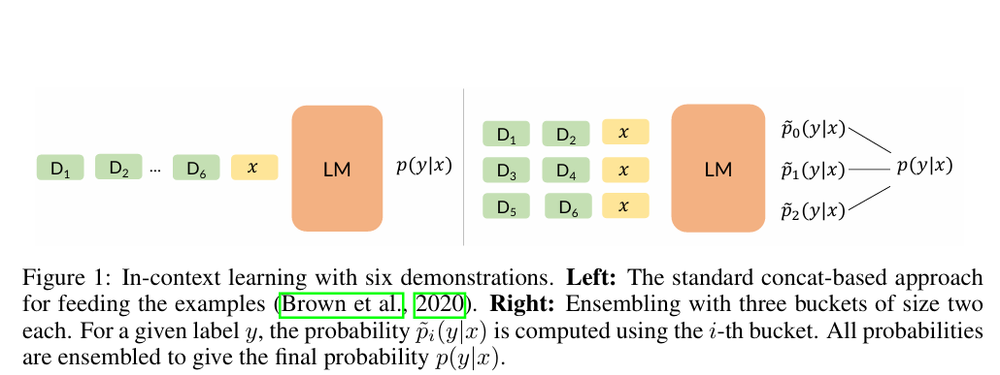

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 19.1 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from pydantic import BaseModel
from openai import AsyncOpenAI
import asyncio
import nest_asyncio
from collections import Counter
from typing import Literal
from textwrap import dedent


class DemonstrationResponse(BaseModel):
    correct_answer: Literal["Positive", "Negative", "Neutral"]


client = AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

async def generate_self_consistent_response(prompt: str, examples: list[str]):
    concetenated_examples = "\n".join(examples)
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are an intelligent AI System that excels
                at classifying user queries into three
                possible labels:
                - Positive
                - Negative
                - Neutral

                You are about to be given a user query and
                asked to classify it into one of the three
                categories. Make sure to refer closely to
                the examples provided to you, examining each
                individual example before coming up with the
                final answer.

                Here are the examples:
                {concetenated_examples}
                """
                ),
            },
            {"role": "user", "content": prompt},
        ],
        response_model=DemonstrationResponse,
        temperature=0,
    )


async def generate_self_consistent_responses(
    prompt: str, num_responses: int, examples: list[str]
):
    assert (
        len(examples) % num_responses == 0
    ), "The number of examples must be evenly divisible by num_responses"

    # Batch the examples into num_responses batches
    batch_size = len(examples) // num_responses

    coros = [
        generate_self_consistent_response(prompt, examples[i : i + batch_size])
        for i in range(0, len(examples), batch_size)
    ]

    responses = await asyncio.gather(*coros)
    return responses


if __name__ == "__main__":
    user_query = "What is the weather like today?"
    examples = [
        "I love this product! [Positive]",
        "This is the worst service ever. [Negative]",
        "The movie was okay, not great but not terrible. [Neutral]",
        "I'm so happy with my new phone! [Positive]",
        "The food was terrible and the service was slow. [Negative]",
        "It's an average day, nothing special. [Neutral]",
        "Fantastic experience, will come again! [Positive]",
        "I wouldn't recommend this to anyone. [Negative]",
        "The book was neither good nor bad. [Neutral]",
        "Absolutely thrilled with the results! [Positive]",
    ]
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method
    responses = loop.run_until_complete(generate_self_consistent_responses(user_query, 5, examples))
    answer_counts = Counter([response.correct_answer for response in responses])
    most_common_answer, _ = answer_counts.most_common(1)[0]
    print(most_common_answer)
    #> Neutral

Neutral


In [ ]:
responses

[DemonstrationResponse(correct_answer='Neutral'),
 DemonstrationResponse(correct_answer='Neutral'),
 DemonstrationResponse(correct_answer='Neutral'),
 DemonstrationResponse(correct_answer='Neutral'),
 DemonstrationResponse(correct_answer='Neutral')]

In [ ]:
!pip install k_means_constrained

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.1/28.1 MB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.8/302.8 kB 19.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: absl-py
    Found existing 

In [ ]:
from sentence_transformers import SentenceTransformer
from transformers import AutoModel, AutoTokenizer
import numpy as np
from k_means_constrained import KMeansConstrained
from sklearn.cluster import KMeans
import os

class SimilarityModel:
    def __init__(self, device, model='all-MiniLM-L6-v2'):
        self.model = SentenceTransformer(model, device=device)
        if 'gpt' in model:
            self.model.tokenizer.pad_token = self.model.tokenizer.eos_token
        print("***************** Device:", device)


    def get_similarity(self, a, b):
        a = self.model.encode([a], show_progress_bar=False)[0]
        b = self.model.encode([b], show_progress_bar=False)[0]
        return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))


class ClusteringModel:
    def __init__(self, device, model='all-MiniLM-L6-v2'):
        self.model = SentenceTransformer(model, device=device)
        if 'gpt' in model:
            self.model.tokenizer.pad_token = self.model.tokenizer.eos_token

    def cluster_examples(self, examples, k, dissimilar_together=False):
        '''
        examples: list of strings
        k: number of clusters
        '''

        if not dissimilar_together:
            model = KMeans(n_clusters=k, random_state=42)
            vectors = self.model.encode(examples, show_progress_bar=False)
            model.fit(vectors)
            return model.labels_

        else:
            model = KMeansConstrained(n_clusters=len(examples) // k, size_min=k, size_max=k, random_state=42)
            vectors = self.model.encode(examples, show_progress_bar=False)
            model.fit(vectors)

            ## pick an example from each cluster to form the new clutsers
            clutser_id_to_example_id = {}
            for i, label in enumerate(model.labels_):
                if label not in clutser_id_to_example_id:
                    clutser_id_to_example_id[label] = []
                clutser_id_to_example_id[label].append(i)

            new_labels = [0] * len(examples)

            for _, example_ids in clutser_id_to_example_id.items():
                for i, example_id in enumerate(example_ids):
                    new_labels[example_id] = i
            return new_labels

if __name__ == "__main__":
    model = SimilarityModel(model='all-MiniLM-L6-v2', device="cpu")
    print(model.get_similarity("He is such a great man", "He is beautiful"))

***************** Device: cpu


In [ ]:
example = 'Isometric embedding redirects here. For related concepts for metric spaces, see isometry. For embeddings of graphs in two-dimensional manifolds, see graph embedding. For other uses, see Embedding (disambiguation)'

model = ClusteringModel(model='all-MiniLM-L6-v2', device="cpu")


Học trong ngữ cảnh (ICL) hoạt động bằng cách hiển thị các ví dụ về mô hình ngôn ngữ (LM) của các cặp đầu vào-đầu ra cho một nhiệm vụ nhất định, tức là minh họa. Cách tiếp cận tiêu chuẩn cho ICL là nhắc LM bằng các phần trình diễn được nối với nhau, sau đó là đầu vào thử nghiệm. Cách tiếp cận này gặp phải một số vấn đề. Đầu tiên, việc ghép nối hầu như không cung cấp khả năng kiểm soát sự đóng góp của từng bản demo cho dự đoán mô hình. Điều này **có thể chưa tối ưu khi một số minh họa không liên quan đến ví dụ kiểm thử**. Thứ hai, do giới hạn độ dài đầu vào của một số kiểu máy biến áp, có thể không khả thi khi đưa **nhiều ví dụ vào ngữ cảnh, đặc biệt khi xử lý các tác vụ đầu vào dài.** Trong công việc này, chúng tôi khám phá Bộ kết hợp trình diễn (DENSE) như một giải pháp thay thế cho việc ghép nối đơn giản. DENSE dự đoán kết quả đầu ra bằng cách sử dụng các tập hợp con (tức là nhóm) của các cuộc trình diễn và sau đó kết hợp các xác suất đầu ra thu được từ mỗi tập hợp con để tạo ra dự đoán cuối cùng. Chúng tôi nghiên cứu các phương pháp mã hóa khác nhau bằng GPT-j (Wang & Komatsuzaki, 2021) và thử nghiệm 12 nhiệm vụ ngôn ngữ. Các thử nghiệm của chúng tôi cho thấy sự kết hợp tối đa có trọng số với phép nối vani ở dạng cao hơn lớn tới 2,4 điểm trung bình.1

**DEMONSTRATION ENSEMBLING**  
Giả sử chúng ta có một danh sách gồm $ n $ **demonstration** $ D = \langle (x_1, y_1), \dots, (x_n, y_n) \rangle $, trong đó $ x_i $ và $ y_i $ lần lượt là đầu vào và nhãn (hoặc đầu ra đúng) của biểu diễn. Dưới đây là cách tiếp cận của chúng tôi trong việc kết hợp biểu diễn.

 **3.1 PHÂN BỔ NHÓM (BUCKET ALLOCATION)**  
DENSE phân bổ $ n $ biểu diễn trong $ D $ vào $ b $ nhóm không rỗng $ \{B_0, B_1, \dots, B_{b-1}\} $. Cụ thể, nếu mỗi nhóm chứa $ \gamma $ biểu diễn, thì nhóm $ B_i $ sẽ chứa các biểu diễn $ D_{\gamma i:\gamma (i+1)-1} $.  

Chúng tôi dự đoán xác suất của một nhãn $ y $ bằng cách điều kiện hóa mô hình ngôn ngữ (Language Model - LM) riêng biệt trên từng nhóm cùng với đầu vào kiểm tra $ x $. Cụ thể, với nhóm $ B_i $, xác suất $ \tilde{p}_i(y|x) $ được tính như sau:  
$$
\tilde{p}_i(y|x) = P_{\text{LM}}(y|B_i, x)
$$  
Xác suất tổng hợp của nhãn $ y $ tỷ lệ thuận với đầu ra của một phép toán kết hợp $ \Phi $, kết hợp xác suất từ các nhóm khác nhau:  
$$
P(y|x) \propto \Phi(y|\tilde{p}_0(y|x), \dots, \tilde{p}_{B-1}(y|x), x)
$$  
Trong đó, $ \Phi $ là một hàm nhận đầu vào là các xác suất $ \tilde{p}_0(y|x), \dots, \tilde{p}_{B-1}(y|x) $ và ví dụ kiểm tra $ x $, sau đó tính toán xác suất (có thể không chuẩn hóa) của nhãn $ y $. Để đơn giản, từ đây trở đi chúng tôi sẽ chỉ dùng $ \Phi(y|x) $.

---

 **3.2 PHƯƠNG PHÁP KẾT HỢP (ENSEMBLING METHOD)**  
Giả sử mỗi nhóm $ B_i $ được gán một trọng số chuẩn hóa $ w_i $, với $ \sum_{i=0}^{b-1} w_i = 1 $. Một dạng của $ \Phi $ là phép toán tích, trong đó:  
$$
\Phi_{\text{PoE}}(y|x) = \prod_{i=0}^{b-1} \tilde{p}_i(y|x)^{w_i}
$$  

Ngoài ra, chúng tôi cũng xem xét công thức hỗn hợp chuyên gia (mixture-of-experts):  
$$
\Phi_{\text{MoE}}(y|x) = \sum_{i=0}^{b-1} w_i \tilde{p}_i(y|x)
$$  

Chúng tôi cũng thử nghiệm với phương pháp "max ensembling", sử dụng xác suất dự đoán cao nhất từ các nhóm:  
$$
\Phi_{\text{max}}(y|x) = \max_j w_j \tilde{p}_j(y|x)
$$

---

 **3.3 GÁN TRỌNG SỐ CHO NHÓM (BUCKET WEIGHTING)**  
Dựa trên các nghiên cứu gần đây (Gao et al., 2021; Liu et al., 2022) cho thấy rằng các biểu diễn tương đồng hơn với đầu vào kiểm tra $ x $ sẽ mang lại hiệu quả tốt hơn, chúng tôi gán trọng số cho mỗi nhóm bằng trung bình của độ tương đồng giữa các ví dụ trong nhóm và $ x $:  
$$
w_i = \frac{1}{|B_i|} \sum_{(x_j, y_j) \in B_i} \text{cos}(x_j^e, x^e)
$$  
Trong đó, $ \text{cos} $ là độ tương đồng cosine và $ x^e $ là vector biểu diễn của $ x $.

---

 **3.4 PHÂN CỤM CÁC BIỂU DIỄN (CLUSTERING DEMONSTRATIONS)**  
Phương pháp phân bổ nhóm được giải thích ở mục 3.1 phân bổ các nhóm một cách ngẫu nhiên dựa trên thứ tự của các biểu diễn trong $ D $. Tuy nhiên, một cách tiếp cận là sử dụng thông tin tương đồng giữa các biểu diễn để tạo nhóm. Chúng tôi thử nghiệm với phương pháp phân cụm k-means (Hartigan & Wong, 1979) để tạo nhóm. Cụ thể, chúng tôi áp dụng k-means trên các vector biểu diễn của các biểu diễn để thu được $ b $ cụm, sau đó sử dụng mỗi cụm làm một nhóm.  

Cách tiếp cận này được gọi là **phân bổ nhóm tương tự nhau (similar-together bucket allocation)**.  

Ngoài việc tối đa hóa độ tương đồng giữa các biểu diễn trong một nhóm, chúng tôi còn có thể tối đa hóa độ khác biệt để tạo ra các nhóm đa dạng. Để làm điều này, chúng tôi sử dụng k-means để phân cụm các biểu diễn thành $ \lfloor n / b \rfloor $ cụm, mỗi cụm chứa $ b $ biểu diễn. Sau đó, chúng tôi tạo $ b $ nhóm bằng cách chọn một biểu diễn duy nhất từ mỗi cụm.  

Cách tiếp cận này được gọi là **phân bổ nhóm đa dạng (diverse bucket allocation)**.  

Phân cụm không chỉ tạo ra các nhóm hợp lý hơn mà còn giảm độ nhạy cảm với thứ tự của các biểu diễn trong $ D $. Điều này giúp giảm đáng kể sự phụ thuộc vào thứ tự biểu diễn như các nghiên cứu trước đây (Zhao et al., 2021; Lu et al., 2022) đã chỉ ra.

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 21.7 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from pydantic import BaseModel
from openai import AsyncOpenAI
import asyncio
import nest_asyncio
from collections import Counter
from typing import Literal
from textwrap import dedent


class DemonstrationResponse(BaseModel):
    correct_answer: Literal["Positive", "Negative", "Neutral"]


client = AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

async def generate_self_consistent_response(prompt: str, examples: list[str]):
    concetenated_examples = "\n".join(examples)
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are an intelligent AI System that excels
                at classifying user queries into three
                possible labels:
                - Positive
                - Negative
                - Neutral

                You are about to be given a user query and
                asked to classify it into one of the three
                categories. Make sure to refer closely to
                the examples provided to you, examining each
                individual example before coming up with the
                final answer.

                Here are the examples:
                {concetenated_examples}
                """
                ),
            },
            {"role": "user", "content": prompt},
        ],
        response_model=DemonstrationResponse,
        temperature=0,
    )


async def generate_self_consistent_responses(
    prompt: str, num_responses: int, examples: list[str]
):
    assert (
        len(examples) % num_responses == 0
    ), "The number of examples must be evenly divisible by num_responses"

    # Batch the examples into num_responses batches
    batch_size = len(examples) // num_responses

    coros = [
        generate_self_consistent_response(prompt, examples[i : i + batch_size])
        for i in range(0, len(examples), batch_size)
    ]

    responses = await asyncio.gather(*coros)
    return responses


if __name__ == "__main__":
    user_query = "What is the weather like today?"
    examples = [
        "I love this product! [Positive]",
        "This is the worst service ever. [Negative]",
        "The movie was okay, not great but not terrible. [Neutral]",
        "I'm so happy with my new phone! [Positive]",
        "The food was terrible and the service was slow. [Negative]",
        "It's an average day, nothing special. [Neutral]",
        "Fantastic experience, will come again! [Positive]",
        "I wouldn't recommend this to anyone. [Negative]",
        "The book was neither good nor bad. [Neutral]",
        "Absolutely thrilled with the results! [Positive]",
    ]
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method
    responses = loop.run_until_complete(generate_self_consistent_responses(user_query, 5, examples))
    answer_counts = Counter([response.correct_answer for response in responses])
    most_common_answer, _ = answer_counts.most_common(1)[0]
    print(most_common_answer)
    #> Neutral

Neutral


***Phân bổ nhóm tương tự nhau (similar-together bucket allocation).***

***Phân bổ nhóm đa dạng (diverse bucket allocation).***

In [ ]:
!pip install k-means-constrained

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.1/28.1 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.8/302.8 kB 12.9 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: absl-py
    Found existing i

In [ ]:
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
from transformers import AutoModel, AutoTokenizer
import numpy as np
from k_means_constrained import KMeansConstrained
import scipy.stats
from sklearn.cluster import MiniBatchKMeans
import os

# def similarity(qa, qb):
#     tokenizer = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L6-v2")
#     qa_tokens = tokenizer.encode(qa, return_tensors='pt')  # Encode and convert to PyTorch tensor
#     qb_tokens = tokenizer.encode(qb, return_tensors='pt')  # Encode and convert to PyTorch tensor
#     cos = nn.CosineSimilarity(dim=0, eps=1e-6)

#     # Convert the token IDs to floating-point type
#     qa_tokens = qa_tokens[0].type(torch.float32)
#     qb_tokens = qb_tokens[0].type(torch.float32)

#     # Pad the shorter tensor to match the length of the longer tensor
#     max_len = max(len(qa_tokens), len(qb_tokens))
#     qa_tokens = torch.cat([qa_tokens, torch.zeros(max_len - len(qa_tokens), dtype=torch.float32)])
#     qb_tokens = torch.cat([qb_tokens, torch.zeros(max_len - len(qb_tokens), dtype=torch.float32)])


#     # if you want to calculate the similarity using the token IDs directly:
#     return cos(qa_tokens, qb_tokens)



class SimilarityModel:
    def __init__(self, device, model='all-MiniLM-L6-v2'):
        self.model = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")
        if 'gpt' in model:
            self.model.tokenizer.pad_token = self.model.tokenizer.eos_token
        print("***************** Device:", device)


    def get_similarity(self, a, b):
        a = self.model.encode([a], show_progress_bar=False)[0]
        b = self.model.encode([b], show_progress_bar=False)[0]
        return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))


class ClusteringModel:
    def __init__(self, device, model='all-MiniLM-L6-v2'):
        self.model = SentenceTransformer("sentence-transformers/all-MiniLM-L6-v2")

    def cluster_examples(self, examples, k, dissimilar_together=False):
        '''
        examples: list of strings
        k: number of clusters
        '''

        if not dissimilar_together:
            model = MiniBatchKMeans(n_clusters=k, random_state=42)
            vectors = self.model.encode(examples, show_progress_bar=False)
            model.fit(vectors)
            return model.labels_

        else:
            n_clusters=len(examples) // k  + 1# Calculate the number of clusters
            # Ensure size_min is less than or equal to the number of samples per cluster
            size_min = min(k, len(examples) // n_clusters)
            size_max = len(examples) // n_clusters + 10
            # Initialize KMeansConstrained with adjusted size_min
            model = KMeansConstrained(n_clusters=n_clusters, size_min=size_min, size_max=size_max, random_state=42)
            vectors = self.model.encode(examples, show_progress_bar=False)
            model.fit(vectors)
            labels = model.labels_
        labeled_examples = {example: label for example, label in zip(examples, labels)}

        return labeled_examples


/usr/local/lib/python3.10/dist-packages/numpy/_core/_dtype.py:106: FutureWarning: In the future `np.bool` will be defined as the corresponding NumPy scalar.
  if dtype.type == np.bool:


TypeError: 

##### Verify Responses over Majority Voting


Học ít mẫu (Few-shot learning) là một nhiệm vụ đầy thách thức, yêu cầu các mô hình ngôn ngữ phải khái quát hóa từ một số lượng hạn chế các ví dụ. Các mô hình ngôn ngữ lớn như GPT-3 và PaLM đã đạt được những tiến bộ ấn tượng trong lĩnh vực này, nhưng chúng vẫn gặp khó khăn trong các nhiệm vụ suy luận như GSM8K, một thước đo chuẩn cho các bài toán số học. Để cải thiện khả năng suy luận, các nghiên cứu trước đây đã đề xuất việc hướng dẫn mô hình ngôn ngữ bằng các prompt nhằm gợi ý chuỗi các bước suy luận trước khi đưa ra câu trả lời cuối cùng, đạt được mức cải thiện đáng kể trong tỷ lệ giải bài toán trên GSM8K từ 17.9% lên 58.1%.

Trong bài báo này, chúng tôi giới thiệu **DIVERSE** (Diverse Verifier on Reasoning Step), một phương pháp mới nhằm tăng cường hơn nữa khả năng suy luận của các mô hình ngôn ngữ. DIVERSE có ba thành phần chính:  
1. **Tạo ra các prompt đa dạng** để khám phá nhiều lộ trình suy luận khác nhau cho cùng một câu hỏi.  
2. **Sử dụng một bộ xác minh** (verifier) để lọc bỏ các câu trả lời sai dựa trên một cơ chế bỏ phiếu có trọng số.  
3. **Xác minh từng bước suy luận riêng lẻ** thay vì xác minh toàn bộ chuỗi suy luận.

Chúng tôi đã đánh giá DIVERSE trên mô hình ngôn ngữ mới nhất code-davinci-002 và chứng minh rằng phương pháp này đạt kết quả tốt nhất (state-of-the-art) trên 6 trong số 8 thước đo chuẩn suy luận (ví dụ: GSM8K từ 74.4% → 83.2%).

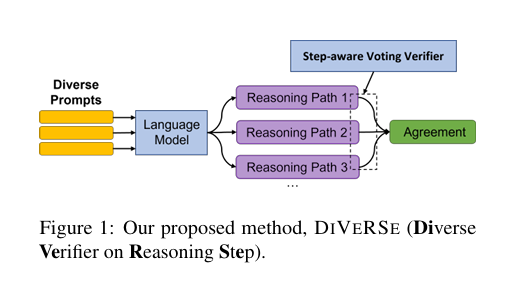

Diverse Verifier On Reasoning Step (DiVeRSe)1 is a prompting technique which provides two main improvements [Trình xác minh đa dạng ở bước suy luận (DiVeRSe)1 là một kỹ thuật nhắc nhở cung cấp hai cải tiến chính] x

Diverse Prompts : They generate multiple variations of the same prompt by varying the examples used in each prompt [Lời nhắc đa dạng : Họ tạo ra nhiều biến thể của cùng một lời nhắc bằng cách thay đổi các ví dụ được sử dụng trong mỗi lời nhắc] x

Verification : They use a finetuned Deberta-V3-Large to determine the quality of a generated response. Instead of using majority voting, they use their model to score each generated response from 0 to 1. They then aggregate these scores for each unique answer to determine the best generated solution. [Xác minh: Họ sử dụng Deberta-V3-Large đã được tinh chỉnh để xác định chất lượng của phản hồi được tạo. Thay vì sử dụng biểu quyết theo đa số, họ sử dụng mô hình của mình để chấm điểm cho mỗi câu trả lời được tạo từ 0 đến 1. Sau đó, họ tổng hợp các điểm này cho từng câu trả lời duy nhất để xác định giải pháp được tạo ra tốt nhất.] x

In the paper itself, they also train a step-wise verifier that is able to score each individual reasoning step. This enables much more fine-grained predictions but is challenging to obtain training data for. [Trong chính bài báo, họ cũng đào tạo một người xác minh từng bước có khả năng chấm điểm từng bước lý luận riêng lẻ. Điều này cho phép dự đoán chi tiết hơn nhiều nhưng rất khó để có được dữ liệu huấn luyện.]

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 17.2 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from openai import AsyncOpenAI
from pydantic import BaseModel
from typing import Literal
from textwrap import dedent
import nest_asyncio
import asyncio
from collections import defaultdict

client = AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class Response(BaseModel):
    chain_of_thought: str
    answer: int


class Grading(BaseModel):
    grade: Literal["Poor", "Average", "Good", "Excellent"]

    def get_score(self):
        mapping = {
            "Poor": 0.25,
            "Average": 0.5,
            "Good": 0.75,
            "Excellent": 1,
        }
        return mapping[self.grade]


async def generate_response(query: str, examples: list[str]):
    formatted_examples = "\n".join(examples)
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "user",
                "content": dedent(
                    f"""
                You are a world class AI that excels at answering
                user queries in a succint and accurate manner.

                <query>
                {query}
                </query>

                <examples>
                {formatted_examples}
                </examples>
                """
                ),
            }
        ],
        response_model=Response,
    )


async def score_response(query: str, response: Response) -> tuple[Response, Grading]:
    return (
        response,
        await client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {
                    "role": "user",
                    "content": dedent(
                        f"""
                You are a world class AI that excels at grading
                responses to a user query in a succint and clear
                manner.

                <query>
                {query}
                </query>

                <response>
                {response}
                </response>
                """
                    ),
                }
            ],
            response_model=Grading,
        ),
    )


async def generate_response_batch(
    query: str, examples: list[str], n_examples_per_batch: int
):
    batches: list[list[str]] = []
    for i in range(0, len(examples), n_examples_per_batch):
        batches.append(examples[i : i + n_examples_per_batch])

    coros = [generate_response(query, example_batch) for example_batch in batches]
    return await asyncio.gather(*coros)


async def score_responses(
    query: str, responses: list[Response]
) -> list[tuple[Response, Grading]]:
    coros = [score_response(query, response) for response in responses]
    return await asyncio.gather(*coros)


if __name__ == "__main__":
    examples = [
        """
        Q: James decides to run 3 sprints 3 times a week.
        He runs 60 meters each sprint. How many total
        meters does he run a week?
        A: James decides to run 3 sprints 3 times a week.
        He runs 60 meters each sprint. So he runs 60 meters
        x 3 sprints x 3 times a week. That is 60 meters x 9.
        The answer is 540.
        """,
        """
        Q: Brandon's iPhone is four times as old as Ben's
        iPhone. Ben's iPhone is two times older than Suzy's
        iPhone. If Suzy's iPhone is 1 year old, how old is
        Brandon's iPhone?
        A: Brandon's iPhone is 4 times as old as Ben's
        iPhone. Ben's iPhone is 2 times older than Suzy's
        iPhone. So Brandon's iPhone is 4 x 2 = 8 times older
        than Suzy's iPhone. Suzy's iPhone is 1 year old. So
        Brandon's iPhone is 8 x 1 = 8 years old. The answer
        is 8.
        """,
        """
        Q: Jean has 30 lollipops. Jean eats 2 of the
        lollipops. With the remaining lollipops, Jean wants
        to package 2 lollipops in one bag. How many bags can
        Jean fill?
        A: Jean started with 30 lollipops. She ate 2 of
        them. So she has 28 lollipops left. She wants to
        package 2 lollipops in one bag. So she can package
        28 / 2 = 14 bags. The answer is 14.
        """,
        """
        Q: Weng earns $12 an hour for babysitting.
        Yesterday, she just did 50 minutes of babysitting.
        How much did she earn?
        A: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
        Working 50 minutes, she earned 0.2 x 50 =
        $<<0.2*50=10>>10. The answer is 10
        """,
    ]

    query = """Betty is saving money for a new wallet which
    costs $100. Betty has only half of the money she needs.
    Her parents decided to give her $15 for that purpose,
    and her grandparents twice as much as her parents. How
    much more money does Betty need to buy the wallet?"""
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method
    generated_responses = loop.run_until_complete(generate_response_batch(query, examples, 1))

    scored_responses = loop.run_until_complete(score_responses(query, generated_responses))

    scores: dict[int, float] = defaultdict(int)

    for response, grade in scored_responses:
        scores[response.answer] += grade.get_score()

    print(scores)
    #> defaultdict(<class 'int'>, {5: 3.5})

    answer = max(scores, key=scores.get)
    print(answer)
    #> 5

defaultdict(<class 'int'>, {5: 4})
5


**Bộ xác minh đa dạng trên từng bước suy luận (DIVERSE)**  

Hình 1 mô tả tổng quan về DIVERSE. Các ý tưởng chính bao gồm ba điểm sau:  
1. **Tận dụng các prompt đa dạng** để tạo ra nhiều lộ trình suy luận khác nhau từ mô hình ngôn ngữ (Mục 2.1).  
2. **Huấn luyện các bộ xác minh** để tổng hợp câu trả lời từ nhiều lộ trình suy luận (Mục 2.2).  
3. **Sử dụng độ chính xác từng bước suy luận** để cải thiện hiệu quả của bộ xác minh bằng cách bỏ phiếu (Mục 2.3).  

**2.1 Prompt đa dạng**  
Để suy luận hiệu quả, việc khám phá các lộ trình suy luận đa dạng là rất hữu ích, dựa trên ý tưởng rằng "Mọi con đường đều dẫn tới thành Rome". Wang et al. (2022c) đã đề xuất tạo ra nhiều lộ trình suy luận từ các mô hình ngôn ngữ bằng cách sử dụng phương pháp giải mã có tính ngẫu nhiên (sampling decoding). Tuy nhiên, phương pháp của họ dựa vào một tập hợp cố định các ví dụ minh họa (exemplars) cho tất cả các prompt, điều này có thể gây ra thiên lệch và hạn chế tính đa dạng của các lộ trình suy luận được tạo ra.  

Để giải quyết vấn đề này, chúng tôi chọn ngẫu nhiên **M1** prompt khác nhau cho mỗi câu hỏi và sau đó sinh ra **M2** lộ trình suy luận cho mỗi prompt bằng cách sử dụng giải mã ngẫu nhiên. Bằng cách này, chúng tôi thu được tổng cộng **M = M1 × M2** lộ trình suy luận đa dạng cho mỗi câu hỏi.  

 **2.2 Bộ xác minh bằng cách bỏ phiếu**  

**Xác minh (Verifier):**  
Bộ xác minh nhận đầu vào là một câu hỏi và một lộ trình suy luận ứng viên, sau đó đầu ra là xác suất mà lộ trình suy luận đó dẫn đến câu trả lời đúng. Chúng tôi sử dụng mô hình **deberta-v3-large** (He et al., 2021) làm mô hình nền tảng, với một đầu ra vô hướng nhỏ để đưa ra dự đoán dựa trên token [CLS].  

**Huấn luyện bộ xác minh:**  
Đối với mỗi câu hỏi trong tập huấn luyện, chúng tôi tạo ra nhiều lộ trình suy luận ứng viên bằng phương pháp suy luận dạng chuỗi tư duy (chain-of-thought reasoning). Các lộ trình suy luận dẫn đến câu trả lời đúng sẽ được coi là **tích cực**, trong khi các lộ trình khác sẽ được coi là **tiêu cực**.  

**Bộ xác minh bằng cách bỏ phiếu (Voting Verifier):**  
Wang et al. (2022c) đã sử dụng phương pháp bỏ phiếu đa số để tổng hợp các dự đoán từ các lộ trình suy luận khác nhau. Tuy nhiên, phương pháp này có thể thất bại khi phần lớn các lộ trình suy luận bị sai lệch, trong khi một số ít lộ trình suy luận lại hợp lý.  

Chúng tôi đề xuất một phương pháp **bỏ phiếu kết hợp bộ xác minh**, sử dụng cả việc bỏ phiếu và xác suất từ bộ xác minh. Công thức tính như sau:  

$$
\hat{y} = \arg\max_y \sum_{i=1}^M \mathbb{1}_{y_i=y} \cdot f(x_i, z_i, y_i)
$$  

Trong đó:  
- $ \mathbb{1}_{y_i=y} $ là một hàm chỉ báo, trả về 1 nếu $ y_i = y $, ngược lại trả về 0.  
- $ f(\cdot) $ là xác suất do bộ xác minh dự đoán.  

Phương pháp này giúp tận dụng thông tin từ cả số lượng lộ trình suy luận (bỏ phiếu) và chất lượng của từng lộ trình (do bộ xác minh đánh giá).  

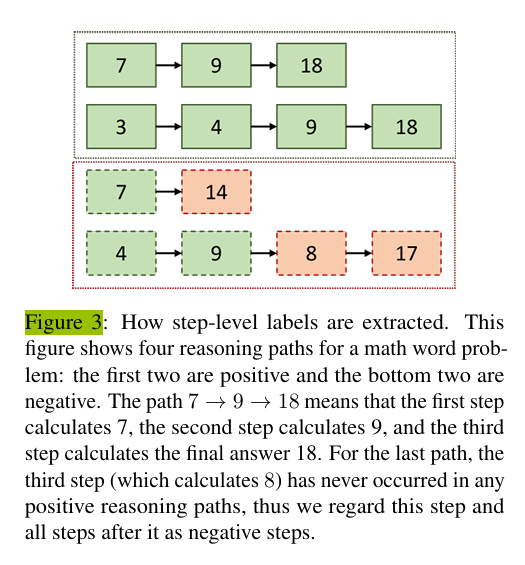

**2.3 Bộ xác minh theo bước (Step-aware Voting Verifier)**  

Mỗi lộ trình suy luận bao gồm nhiều bước. Chúng tôi giả định rằng không phải tất cả các bước trong một lộ trình suy luận sai đều sai ở mức độ như nhau, và một số bước vẫn có thể hữu ích cho quá trình suy luận. Để khai thác điều này, chúng tôi mở rộng bộ xác minh bằng cách bỏ phiếu thành **bộ xác minh theo bước (step-aware voting verifier)**, với việc giới thiệu một hàm mất mát mở rộng:  

$$
L = L_0 + \alpha \cdot L_1
$$

Trong đó:  
- $ L_0 $: Mất mát ban đầu từ bộ xác minh.  
- $ L_1 $: Mất mát phụ trợ ở mức từng bước, được tính bằng:  
  $$
  L_1 = \sum_{i=1}^{|\hat{D}|} \sum_{j=1}^{|S_i|} \text{BCE}(\text{label}_{i,j}, f'(input_{i,j}))
  $$  
  - $ \alpha $: Siêu tham số để cân bằng giữa mất mát ban đầu $ L_0 $ và mất mát phụ trợ theo bước $ L_1 $.  
  - $ S_{i,1}, S_{i,2}, ..., S_{i,|S_i|} $: Các bước trong lộ trình suy luận $ z_i $.  
  - $ \text{label}_{i,j} $: Nhãn cho biết bước $ S_{i,j} $ là đúng hay sai.  
  - $ f'(input_{i,j}) $: Xác suất nhãn tích cực cho bước $ S_{i,j} $, được dự đoán bởi mô hình.  

**Tạo nhãn ở mức bước (step-level labels):**  
Để tạo nhãn ở mức bước (tức là $ \text{label}_{i,j} $) cho các dữ liệu huấn luyện tiêu cực có câu trả lời sai, chúng tôi thiết kế một thuật toán so sánh các kết quả trung gian giữa các bước trong lộ trình suy luận tích cực và tiêu cực.  

Hình 3 minh họa thuật toán này, với khả năng áp dụng không chỉ cho các bài toán toán học mà còn mở rộng sang các nhiệm vụ suy luận khác. Chúng tôi sử dụng một mô hình **suy luận ngôn ngữ tự nhiên (natural language inference)** có sẵn, **roberta-large-mnli** (Liu et al., 2019), để kiểm tra xem hai bước suy luận có tương đương về mặt ngữ nghĩa hay không.  

Đối với một bước suy luận nhất định, nếu không thể tìm thấy bất kỳ bước nào tương đương về mặt ngữ nghĩa trong các lộ trình suy luận tích cực, chúng tôi sẽ gán nhãn bước đó và tất cả các bước sau nó là **các bước tiêu cực**.  

DIVERSE

**Bước 1: Tạo prompt đa dạng**

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 10.8 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import json
import random
import instructor
import re
from pathlib import Path
from typing import List, TextIO

import openai
from datasets import load_dataset
# from fire import Fire
from pydantic import BaseModel
from tqdm import tqdm


def remove_substrings_with_double_angle_brackets(input_string):
    # Define the pattern to match substrings within double angled brackets
    pattern = r"<<[^>]+>>"
    # Use the sub() function from the re module to replace matching substrings with an empty string
    result = re.sub(pattern, "", input_string)
    return result


class ReasonSample(BaseModel):
    question: str
    explanation: str = ""
    answer: str = ""
    wrong_explanation: str = ""
    wrong_answer: str = ""
    pred: str = ""


class ReasonData(BaseModel):
    samples: List[ReasonSample]

    @classmethod
    def load(cls, path: str):
        samples = []
        with open(path) as f:
            for line in f:
                raw = json.loads(line)
                samples.append(ReasonSample(**raw))

        return cls(samples=samples)

    @classmethod
    def load_gsm8k_test(cls, path: str = "gsm8k", subset: str = "main", split="test"):
        samples = []
        for raw in load_dataset(path, subset, split=split):
            explanation, answer = raw["answer"].split("####")
            explanation = remove_substrings_with_double_angle_brackets(explanation)
            samples.append(
                ReasonSample(
                    question=raw["question"].strip(),
                    explanation=explanation.strip(),
                    answer=answer.strip(),
                )
            )

        return cls(samples=samples)

    @classmethod
    def load_gsm8k_incoherent_objects(cls, split: str = "test", sample: bool = False):
        if split == "train" and sample:
            samples = [
                ReasonSample(
                    question="There are 15 trees in the grove. Grove workers will plant trees in the grove today. After they are done, there will be 21 trees. How many trees did the grove workers plant today?",
                    explanation="There are 15 trees originally. Then there were 21 trees after the Grove workers planted some more. So there must have been 21 - 15 = 6 trees that were planted.",
                    answer="6",
                    wrong_explanation="There are 21 - 15 = 6 trees originally. Then there were 15 trees after the Grove workers planted some more. So there must have been 21 trees that were planted.",
                    wrong_answer="21",
                ),
                ReasonSample(
                    question="If there are 3 cars in the parking lot and 2 more cars arrive, how many cars are in the parking lot??",
                    explanation="There are originally 3 cars. Then 2 more cars arrive. Now 3 + 2 = 5 cars are in the parking lot.",
                    answer="5",
                    wrong_explanation="There are originally 3 + 2 = 5 cars. Then 3 more cars arrive. Now 2 cars are in the parking lot",
                    wrong_answer="2",
                ),
                ReasonSample(
                    question="Leah had 32 chocolates and her sister had 42. If they ate 35, how many pieces do they have left in total?",
                    explanation="Originally, Leah had 32 chocolates and her sister had 42. So in total they had 32 + 42 = 74. After eating 35, they had 74 - 35 = 39 pieces left in total.",
                    answer="39",
                    wrong_explanation="Originally, Leah had 32 + 42 = 74 chocolates and her sister had 32. So in total they had 74 - 35 = 39. After eating 35, they had 42 pieces left in total",
                    wrong_answer="42",
                ),
                ReasonSample(
                    question="Jason had 20 lollipops. He gave Denny some lollipops. Now Jason has 12 lollipops. How many lollipops did Jason give to Denny?",
                    explanation="Jason had 20 lollipops originally. Then he had 12 after giving some to Denny. So he gave Denny 20 - 12 = 8 lollipops.",
                    answer="8",
                    wrong_explanation="Jason had 20 - 12 = 8 lollipops originally. Then he had 20 after giving some to Denny. So he gave Denny 12 lollipops",
                    wrong_answer="12",
                ),
            ]
            return cls(samples=samples)
        else:
            return cls.load_gsm8k_test()

    @classmethod
    def load_from_name(cls, name: str, **kwargs):
        if name == "gsm8k":
            return cls.load_gsm8k_incoherent_objects(**kwargs)
        else:
            raise KeyError(name)


In [ ]:
data_name = 'gsm8k'
data_test = ReasonData.load_from_name(data_name, split="test", sample=True)
data_test.samples = random.sample(data_test.samples, k=5)

In [ ]:
questions = [(question.question,) for question in data_test.samples]

**2. Bộ xác minh bằng cách bỏ phiếu**

##### Use Ensembles To Test Prompts


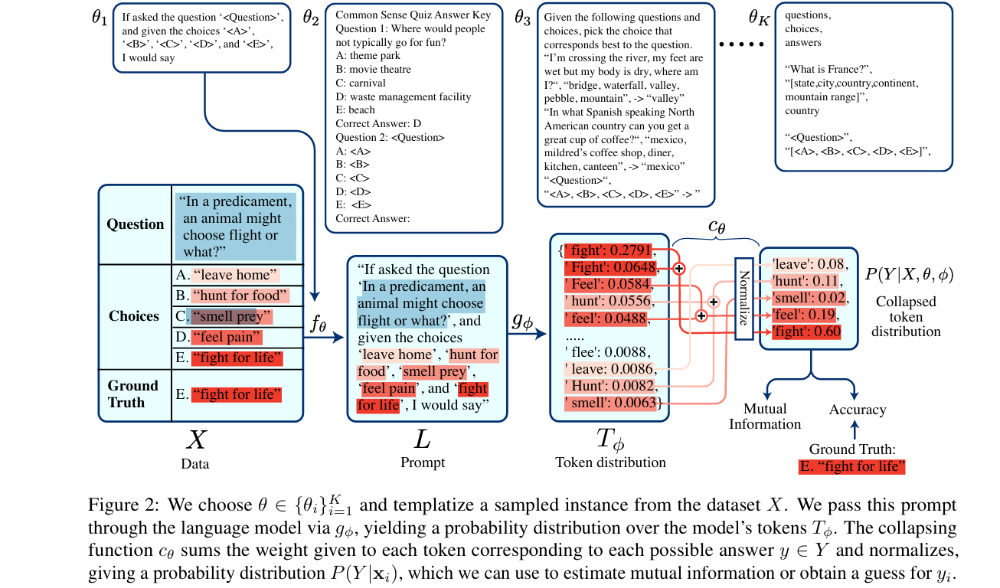

What's Max Mutual Information? [Thông tin lẫn nhau tối đa là gì?]

Max Mutual Information Method is a method of prompting that aims to find the best prompt to elicit the desired response from a LLM. We do so by maximising a metric called Mutual Information - which indicates the reduction in a model's uncertainty as a result of the prompt [Phương pháp thông tin lẫn nhau tối đa là một phương pháp nhắc nhở nhằm tìm ra lời nhắc tốt nhất để thu được phản hồi mong muốn từ LLM. Chúng tôi làm như vậy bằng cách tối đa hóa số liệu được gọi là Thông tin lẫn nhau - cho biết mức độ giảm độ không chắc chắn của mô hình do lời nhắc] x

**Entropy (Độ hỗn loạn)**

Khi một mô hình ngôn ngữ nhận được một đoạn văn bản làm đầu vào (prompt), nó sẽ đưa ra một loạt các xác suất của các token theo thứ tự cho đến khi đạt đến token <EOS> (End of Sequence). Trong bài báo, người ta coi phân phối xác suất cuối cùng này là $ P(Y \mid X) $, trong đó:

- $ Y $ là dự đoán cuối cùng của mô hình.
- $ X $ là đoạn văn bản (prompt) ban đầu.

Khi chúng ta có một phân phối xác suất, ta có thể tính được một giá trị gọi là **entropy** (độ hỗn loạn). Giá trị entropy càng thấp thì càng tốt, vì giá trị thấp cho thấy mô hình tự tin hơn trong dự đoán của nó.

Công thức tính entropy như sau:

$$
H(P(Y \mid X)) = \sum_{i=0}^n P(T_i) \log(P(T_i))
$$

Trong đó:

- $ P(T_i) $: xác suất của token thứ $ i $ trong phân phối đầu ra cuối cùng.
- $ n $: số lượng token trong phân phối.
- $ H(P(Y \mid X)) $: giá trị entropy của phân phối xác suất $ P(Y \mid X) $.

Entropy đo lường độ không chắc chắn trong phân phối xác suất. Nếu tất cả các xác suất tập trung vào một token duy nhất (rất tự tin), entropy sẽ thấp. Ngược lại, nếu các xác suất được phân tán đều (ít tự tin), entropy sẽ cao.

**Ứng dụng vào tính toán Thông tin Tương hỗ (Mutual Information)**

Ta biểu diễn entropy của một phân phối xác suất là $ H(X) $, trong đó $ X $ đại diện cho phân phối xác suất cuối cùng. Giả sử rằng bạn có một tập dữ liệu huấn luyện với $ n $ ví dụ để sử dụng.

 Các bước thực hiện:

1. **Chọn tập token liên quan đến câu trả lời cuối cùng**:  
   Trước tiên, ta chọn một tập các token có khả năng thuộc về câu trả lời cuối cùng. Những token này có thể là các từ xuất hiện trong các lựa chọn đã được cung cấp.

2. **Trích xuất log probs**:  
   Sau khi chọn các token, ta trích xuất xác suất log ($ \log P $) của từng token từ phân phối xác suất cuối cùng. Sau đó, ta chuẩn hóa các xác suất này để tổng các giá trị mới bằng 1.

3. **Xây dựng phân phối cho từng ví dụ**:  
   Ta thực hiện bước trên cho tất cả $ n $ ví dụ trong tập huấn luyện. Điều này tạo ra một phân phối mới $ P(Y_i \mid X_i) $ cho từng ví dụ thứ $ i $.

4. **Tính Entropy Biên ($ H_{\text{marginal}} $)**:  
   Ta lấy trung bình của $ n $ phân phối vừa tính để tạo ra một phân phối tổng quát. Entropy của phân phối tổng quát này được gọi là $ H_{\text{marginal}} $.

5. **Tính Entropy Có điều kiện ($ H_{\text{conditional}} $)**:  
   Ta tính entropy của từng phân phối riêng lẻ $ P(Y_i \mid X_i) $ và sau đó lấy giá trị trung bình của các entropy này. Giá trị này được gọi là $ H_{\text{conditional}} $.

6. **Tính Thông tin Tương hỗ**:  
   Ta trích xuất Thông tin Tương hỗ bằng công thức:

   $$
   \text{Mutual Information} = H_{\text{marginal}} - H_{\text{conditional}}
   $$

   Giá trị này càng cao, mô hình càng tốt.

---

 Ứng dụng:
Chỉ số Thông tin Tương hỗ này có thể được sử dụng để so sánh hiệu quả của các **prompt** khác nhau trong việc tạo ra phản hồi mong muốn từ tập dữ liệu huấn luyện.



**Định nghĩa Nhiệm vụ (Task Definition)**

1. **Mục tiêu tổng quát**:  
   Để chứng minh tính ứng dụng rộng rãi và hiệu quả chung của phương pháp, chúng tôi xác thực nó trên nhiều bộ dữ liệu và nhiệm vụ khác nhau. Điều này yêu cầu ước lượng **Thông tin Tương hỗ (Mutual Information - MI)** và độ chính xác (**Accuracy**).  

   - Trong ngữ cảnh này, chúng tôi giả định rằng một mô hình ngôn ngữ tạo ra một phân phối xác suất duy nhất $ P(t_n \mid \text{context} = t_1, t_2, ..., t_{n-1}) $.  
   - So với các thiết lập thực nghiệm khác sử dụng các phương pháp lấy mẫu nhiều token (như beam search), phương pháp của chúng tôi dễ áp dụng hơn.  

2. **Khung phản hồi một token (One-token Response - OTR)**:  
   - Mọi nhiệm vụ xử lý ngôn ngữ tự nhiên (NLP) đều khả thi trong khung này miễn là không gian đầu ra là tập hợp các lựa chọn mà mỗi lựa chọn bắt đầu bằng một token duy nhất.  
   - Trong trường hợp đó, mô hình ngôn ngữ có thể "đưa ra câu trả lời" bằng cách gán xác suất cho các token bắt đầu tương ứng với từng câu trả lời.  
   - **Đối với các nhiệm vụ mở**, phương pháp này có thể làm tăng độ chính xác một cách nhân tạo nếu mô hình tạo ra câu trả lời sai nhưng lại bắt đầu bằng token giống với câu trả lời đúng. Tuy nhiên, sự khác biệt này là nhỏ và không ảnh hưởng đến kết quả thực nghiệm.  

3. **Cách tiếp cận**:  
   - Các token không liên quan (tức là không bắt đầu với bất kỳ câu trả lời mong muốn nào) bị bỏ qua, và các xác suất còn lại được chuẩn hóa lại.  
   - Chúng tôi gọi cách tiếp cận này là **OTR**. Mặc dù phương pháp không giới hạn trong các nhiệm vụ OTR, chúng tôi chọn các nhiệm vụ có thể biểu diễn dưới dạng OTR để giảm chi phí tính toán.  

4. **Quy trình trong OTR Framework**:  
   - Khung OTR biểu diễn một nhiệm vụ NLP dưới dạng bài toán phân loại với:  
     - **Dữ liệu đầu vào thô**: $ x_i \in X $.  
     - **Phân phối xác suất đầu ra**: $ P(Y \mid x_i) $, là phân phối xác suất trên các mục tiêu.  

   - Sử dụng mô hình ngôn ngữ $ \phi $, cần có:  
     - **Hàm templatizing $ f_\theta $**: Ánh xạ dữ liệu thô $ X $ thành các prompt ngôn ngữ tự nhiên $ L $.  
     - **Hàm ánh xạ $ g_\phi $**: Ánh xạ prompt thành phân phối xác suất trên tập token $ T_\phi $, tập hợp token do tokenizer của mô hình biểu diễn.  
     - **Hàm nén $ c_\theta $**: Ánh xạ phân phối token thành $ P(Y \mid x, \theta, \phi) $, một ước tính của $ P(Y \mid X) $.  

     Công thức tổng quát:  
     $$
     P(Y \mid x, \theta, \phi) = c_\theta(g_\phi(f_\theta(x))), \, x \in X
     $$  
     hoặc viết ngắn gọn:  
     $$
     P(Y \mid f_\theta(x)).
     $$  

5. **Mục tiêu cuối cùng**:  
   - Quy trình này có thể được đặc tả theo nhiều cách khác nhau bằng cách sử dụng các tham số $ \theta $ và mô hình $ \phi $, dẫn đến các độ chính xác khác nhau.  
   - **Mục tiêu của chúng tôi** là chọn tham số $ \theta $ tốt nhất với mô hình $ \phi $.  

6. **Điểm khác biệt với phương pháp trước**:  
   - Các phương pháp trước đây dựa vào việc so sánh câu trả lời của mô hình với nhãn chuẩn để tính điểm.  
   - Phương pháp của chúng tôi chọn $ \theta $ bằng cách tối ưu hóa **Thông tin Tương hỗ (MI)**, không cần sử dụng nhãn chuẩn.

**Thông tin Tương hỗ và Chọn Prompt Tốt Nhất trong OTR Framework**

1. **Ký hiệu và định nghĩa thông tin tương hỗ**:  
   - **Thông tin tương hỗ** giữa hai biến ngẫu nhiên $ X $ và $ Y $ được ký hiệu là $ I(X; Y) $.  
   - **Entropy của $ X $** được định nghĩa là:  
     $$
     H(X) = - \int_{x \in X} P(x) \log(P(x)) dx
     $$  
   - **Thông tin tương hỗ** giữa $ X $ và $ Y $ được xác định thông qua **divergence Kullback-Leibler (KL)**:  
     $$
     I(X; Y) = D_{KL}(P(X, Y) \| P_X \otimes P_Y)
     $$  
     và có thể viết lại là:  
     $$
     I(X; Y) = H(Y) - H(Y \mid X)
     $$  
     (biểu diễn sự giảm entropy của $ Y $ khi biết thông tin về $ X $).

2. **Khung OTR và tập hợp các hàm prompt**:  
   - Trong **OTR framework**, ta cố định một mô hình $ \phi $, sau đó tạo một tập hợp đa dạng gồm $ K $ hàm tạo prompt $ f_{\theta_1}, f_{\theta_2}, ..., f_{\theta_K} $ và các hàm nén tương ứng $ c_{\theta_k} $ (tham khảo Phụ lục A).  
   - Biến ngẫu nhiên $ f_\theta(X) $ được định nghĩa là:  
     $$
     f_\theta(X) := \{f_\theta(x), x \in X\}
     $$  
   - Ta tính toán $ I(f_\theta(X); Y) $ và sử dụng giá trị này làm tiêu chí để chọn các hàm tạo prompt $ f_\theta $ cho suy luận (inference).

3. **Giả thuyết và lựa chọn prompt tốt nhất**:  
   - **Giả thuyết**: Một $ \theta_i $ với thông tin tương hỗ cao hơn sẽ giúp mô hình ngôn ngữ phù hợp với nhiệm vụ tốt hơn so với $ \theta_j $ có thông tin tương hỗ thấp hơn.  
   - **Cách chọn**:  
     $$
     \hat{\theta} = \arg\max_\theta \{I(f_\theta(X); Y)\}
     $$  

4. **Ước tính thông tin tương hỗ**:  
   Thông tin tương hỗ được ước tính theo công thức:  
   $$
   I(f_\theta(X); Y) = H(Y) - H(Y \mid f_\theta(X))
   $$  
   Trong đó:
   - **Entropy biên ($ H(Y) $)**: Là entropy của trung bình các phân phối điều kiện.  
     $$
     H(Y) \approx H \left( \frac{1}{N} \sum_{i=1}^N P(Y \mid f_\theta(x_i)) \right)
     $$
   - **Entropy có điều kiện ($ H(Y \mid f_\theta(X)) $)**: Là trung bình các entropy của các phân phối điều kiện.  
     $$
     H(Y \mid f_\theta(X)) \approx \frac{1}{N} \sum_{i=1}^N H(P(Y \mid f_\theta(x_i)))
     $$

5. **Ý nghĩa của thông tin tương hỗ trong thiết kế prompt**:  
   - **Thông tin tương hỗ cao** đồng nghĩa với:  
     - **Entropy biên cao**: Prompt ít thiên lệch với một đáp án cụ thể.  
     - **Entropy có điều kiện thấp**: Mô hình tự tin với các đầu ra.  
   - Điều này giúp đảm bảo các thuộc tính mong muốn trong thiết kế prompt và tối ưu hóa sự phù hợp của mô hình.

6. **Mối liên hệ với bất đẳng thức xử lý dữ liệu**:  
   Theo **bất đẳng thức xử lý dữ liệu** (Data Processing Inequality), ta có:  
   $$
   I(f_\theta(X); Y) \leq I(X; Y)
   $$  
   Điều này cho thấy $ I(f_\theta(X); Y) $ là một cận dưới cho $ I(X; Y) $. Prompt với thông tin tương hỗ cao nhất sẽ giữ lại nhiều thông tin nhất giữa $ X $ và $ Y $.

In [ ]:
!pip install instructoy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 8.8 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
from openai import AsyncOpenAI
import instructor
from pydantic import BaseModel
from typing import Callable, Literal
from textwrap import dedent
import math
import nest_asyncio
import asyncio


class Response(BaseModel):
    chain_of_thought: str
    response: Literal["A", "B"]
    confidence: Literal[
        "Very High Confidence",
        "High Confidence",
        "Moderate Confidence",
        "Low Confidence",
        "Very Low Confidence",
    ]

    def generate_score(self) -> float:
        confidence_scores = {
            "Very High Confidence": 1,
            "High Confidence": 0.8,
            "Moderate Confidence": 0.6,
            "Low Confidence": 0.4,
            "Very Low Confidence": 0.2,
        }
        return confidence_scores[self.confidence]


client = AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

def prompt_template_1(question: str, options: list[str]):
    assert len(options) == 2
    a, b = options

    return dedent(
        f"""
    You are a world class AI System which excels at understanding complex user stories and generating responses. Output your prediction and also quantify your confidence in your prediction with the following scale.

    - Very High Confidence: The model is highly confident in its prediction, displaying deep understanding, flawless execution, and no noticeable errors.
    - High Confidence: The model is confident in its prediction, with strong relevance and minor errors that do not detract from overall quality.
    - Moderate Confidence: The model has moderate confidence in its prediction, which is generally relevant with some inaccuracies, and meets minimum requirements.
    - Low Confidence: The model has low confidence in its prediction, with limited relevance and several inaccuracies.
    - Very Low Confidence: The model has very low confidence in its prediction, which is largely irrelevant, inaccurate, or incomplete, needing significant improvement


    Context
    {question}

    Options
    A. {a}
    B. {b}
    """
    )


def prompt_template_2(question: str, options: list[str]):
    assert len(options) == 2
    a, b = options

    return dedent(
        f"""
    <prompt>
        <Task>
        You are about to be passed a story. You are to select the correct response from the options provided.

         <confidence-levels>
             <level>
                 <name>Very High Confidence</name>
                 <description>The model is highly confident in its prediction, displaying deep understanding, flawless execution, and no noticeable errors.</description>
             </level>
             <level>
                 <name>High Confidence</name>
                 <description>The model is confident in its prediction, with strong relevance and minor errors that do not detract from overall quality.</description>
             </level>
             <level>
                 <name>Moderate Confidence</name>
                 <description>The model has moderate confidence in its prediction, which is generally relevant with some inaccuracies, and meets minimum requirements.</description>
             </level>
             <level>
                 <name>Low Confidence</name>
                 <description>The model has low confidence in its prediction, with limited relevance and several inaccuracies.</description>
             </level>
             <level>
                 <name>Very Low Confidence</name>
                 <description>The model has very low confidence in its prediction, which is largely irrelevant, inaccurate, or incomplete, needing significant improvement</description>
             </level>
         </confidence-levels>
        </Task>

        <Question>
        {question}
        </Question>

        <Options>
        <option>A: {a}</option>
        <option>B: {b}</option>
        </Options>
    </prompt>
    """
    )


async def generate_response(
    question: str, options: list[str], prompt_template: Callable[[str, list[str]], str]
):
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": prompt_template(question, options),
            }
        ],
        response_model=Response,
    )


async def generate_responses(
    questions: list[str], prompt_template: Callable[[str, list[str]], str]
):
    return await asyncio.gather(
        *[
            generate_response(
                question=question["question"],
                options=question["options"],
                prompt_template=prompt_template,
            )
            for question in questions
        ]
    )


def calculate_entropy(probs: list[float]) -> float:
    return sum([p * math.log(p) if p != 0 else 0 for p in probs])


def calculate_mutual_information(predictions: list[Response]) -> float:
    probs = [
        [prediction.generate_score(), 1 - prediction.generate_score()]
        for prediction in predictions
    ]

    avg_probs = [0, 0]

    for p1, p2 in probs:
        avg_probs[0] += p1
        avg_probs[1] += p2

    h_marginal = calculate_entropy([i / len(probs) for i in avg_probs])
    h_conditional = sum([calculate_entropy(prob) for prob in probs]) / len(probs)

    return h_marginal - h_conditional


if __name__ == "__main__":
    queries = [
        {
            "question": "Karen was assigned a roommate her first year of college. Her roommate asked her to go to a nearby city for a concert. Karen agreed happily. The show was absolutely exhilarating.",
            "options": [
                "Karen became good friends with her roommate.",
                "Karen hated her roommate.",
            ],
        },
        {
            "question": "Jim got his first credit card in college. He didn’t have a job so he bought everything on his card. After he graduated he amounted a $10,000 debt. Jim realized that he was foolish to spend so much money.    ",
            "options": [
                "Jim decided to devise a plan for repayment.",
                "Jim decided to open another credit card.",
            ],
        },
        {
            "question": "Gina misplaced her phone at her grandparents. It wasn’t anywhere in the living room. She realized she was in the car before. She grabbed her dad’s keys and ran outside.",
            "options": [
                "She found her phone in the car.",
                "She didn’t want her phone anymore.",
            ],
        },
    ]

    best_mi_score = float("-inf")
    best_template = None
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)

    # Run the coroutine using the loop's run_until_complete method

    for prompt_template in [prompt_template_1, prompt_template_2]:
        responses = loop.run_until_complete(generate_responses(queries, prompt_template))
        mi_score = calculate_mutual_information(responses)
        print(f"{prompt_template.__name__}: {mi_score}")
        #> prompt_template_1: -0.0781292189485728
        #> prompt_template_2: -0.05907285153542691
        if mi_score > best_mi_score:
            best_mi_score = mi_score
            best_template = prompt_template.__name__

    print(best_template, best_mi_score)
    #> prompt_template_2 -0.05907285153542691

[Response(chain_of_thought='Karen agreed happily to go to the concert with her roommate, and the experience was exhilarating. This suggests a positive interaction and enjoyment of time spent together. These indicators lead to the conclusion that their relationship is likely a good one, supporting option A rather than B.', response='A', confidence='High Confidence'), Response(chain_of_thought='Based on the information provided, Jim regretted his spending habits and recognized the foolishness of accruing such a large amount of debt. It is reasonable to infer that he would want to take responsibility for his debt and would likely devise a plan for repayment rather than opening another credit card, which could worsen his situation. Therefore, option A is the most logical choice.', response='A', confidence='High Confidence'), Response(chain_of_thought="Gina misplaced her phone at her grandparents' and indicates that she was last in the car before running outside. Since she is actively searc

In [ ]:
probs = [
    [prediction.generate_score(), 1 - prediction.generate_score()]
    for prediction in responses
]

In [ ]:
avg_probs = [0, 0]

for p1, p2 in probs:
    avg_probs[0] += p1
    avg_probs[1] += p2


In [ ]:
probs

[[0.8, 0.19999999999999996], [0.8, 0.19999999999999996], [1, 0]]

In [ ]:
avg_probs

[2.6, 0.3999999999999999]

##### Combine Multiple Reasoning Chains


Meta Chain Of Thought ( [Meta COT](https://arxiv.org/pdf/2304.13007))

Meta Chain Of Thought (Meta COT) 1. involves the use of multiple reasoning chains to generate a response to a given query. This helps our model evaluate multiple potential reasoning paths and from there, determine a more accurate answer. [Chuỗi suy nghĩ Meta (Meta COT) 1. liên quan đến việc sử dụng nhiều chuỗi suy luận để tạo ra phản hồi cho một truy vấn nhất định. Điều này giúp mô hình của chúng tôi đánh giá nhiều cách suy luận tiềm năng và từ đó xác định câu trả lời chính xác hơn.] x

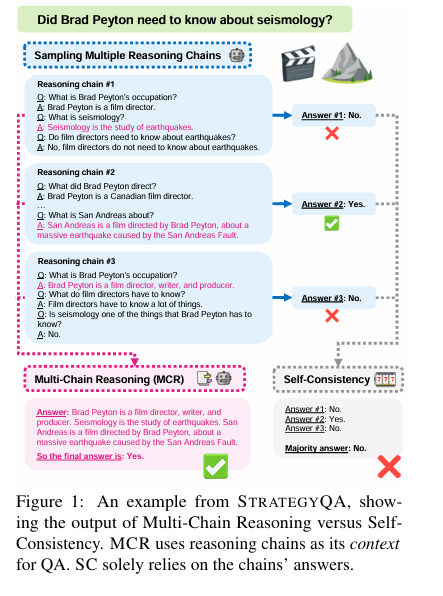

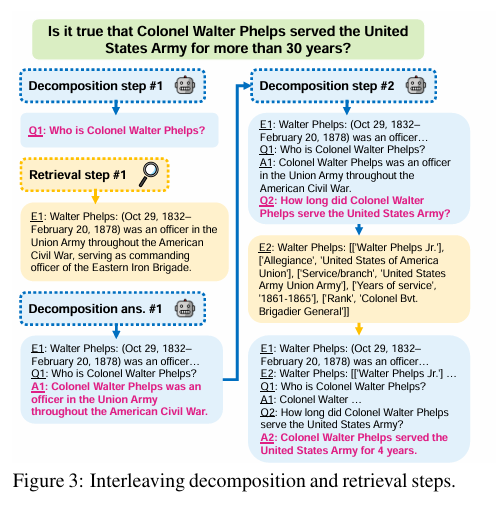

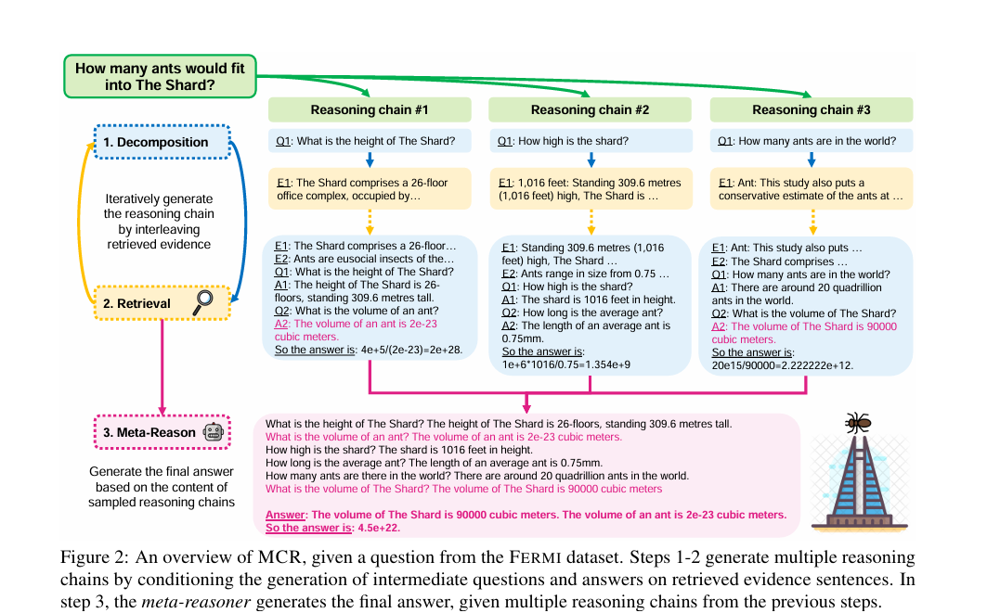

**Hệ thống hiện đại cho tác vụ trả lời câu hỏi (QA) đa bước nhảy** thường chia các câu hỏi thành một chuỗi các bước suy luận, được gọi là **chuỗi tư duy (Chain-of-Thought - CoT)**, trước khi đưa ra câu trả lời cuối cùng.  

Nghiên cứu này tập trung vào việc giải quyết một vấn đề phổ biến trong cách tiếp cận này: **các bước suy luận trung gian trong các chuỗi thường bị bỏ qua**. Thay vì chỉ đơn giản tổng hợp các câu trả lời cuối cùng, cách tiếp cận của nghiên cứu được gọi là **Lý luận Đa Chuỗi (Multi-Chain Reasoning - MCR)**, khai thác các mối quan hệ giữa các bước trung gian của các chuỗi suy luận khác nhau và cung cấp một lời giải thích thống nhất cho câu trả lời được dự đoán.  

---

 Ví dụ minh họa:
**Câu hỏi**: "Brad Peyton có cần biết về địa chấn học không?"

- **Chuỗi suy luận #1**:
  1. *Q*: Nghề nghiệp của Brad Peyton là gì?  
     *A*: Brad Peyton là một đạo diễn.  
  2. *Q*: Địa chấn học là gì?  
     *A*: Địa chấn học là nghiên cứu về động đất.  
  3. *Q*: Các đạo diễn có cần biết về động đất không?  
     *A*: Không.  
  **Câu trả lời #1**: Không.  

- **Chuỗi suy luận #2**:  
  1. *Q*: Brad Peyton đạo diễn bộ phim nào?  
     *A*: Brad Peyton là một đạo diễn người Canada.  
  2. *Q*: Bộ phim "San Andreas" nói về điều gì?  
     *A*: "San Andreas" là bộ phim Brad Peyton đạo diễn, nói về một trận động đất lớn gây ra bởi đứt gãy San Andreas.  
  **Câu trả lời #2**: Có.  

- **Chuỗi suy luận #3**:  
  1. *Q*: Nghề nghiệp của Brad Peyton là gì?  
     *A*: Brad Peyton là đạo diễn, biên kịch và nhà sản xuất.  
  2. *Q*: Các đạo diễn cần biết những gì?  
     *A*: Các đạo diễn cần biết nhiều thứ.  
  3. *Q*: Địa chấn học có phải là một trong những thứ Brad Peyton cần biết không?  
     *A*: Không.  
  **Câu trả lời #3**: Không.  

---

 Phương pháp MCR:  
Thay vì chỉ sử dụng **bỏ phiếu tự nhất quán (self-consistency)** dựa trên câu trả lời cuối cùng của từng chuỗi, phương pháp **MCR**:
- Khuyến khích các mô hình ngôn ngữ lớn (*large language models*) **"siêu suy luận" (meta-reason)**, xem xét các bước suy luận của nhiều chuỗi tư duy.
- Trộn lẫn thông tin từ các chuỗi để chọn ra những sự kiện liên quan nhất.
- Sử dụng các sự kiện này để tạo ra lời giải thích thống nhất và dự đoán câu trả lời.

---

 Kết quả:
- Phương pháp MCR **vượt trội hơn các phương pháp cơ bản mạnh mẽ** trên 7 tập dữ liệu QA đa bước nhảy.  
- Các phân tích cũng chỉ ra rằng **lời giải thích của MCR có chất lượng cao**, giúp con người dễ dàng kiểm chứng câu trả lời hơn.  

**Kết luận**: MCR không chỉ cải thiện hiệu suất mà còn tạo ra sự minh bạch trong các câu trả lời của mô hình.

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 8.7 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.8.0
    Uninstalling jiter-0.8.0:
      Successfully uninstalled jiter-0.8.0


In [ ]:
import instructor
from openai import AsyncOpenAI
from pydantic import BaseModel, Field
import asyncio
from typing import Optional

client = AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)

class ReasoningAndResponse(BaseModel):
    intermediate_reasoning: str = Field(
        description="""
    Intermediate reasoning steps"""
    )
    correct_answer: str


class MaybeResponse(BaseModel):
    result: Optional[ReasoningAndResponse]
    error: Optional[bool]
    error_message: Optional[str] = Field(
        description="""Informative explanation of why
        the reasoning chain was unable to generate
        a result"""
    )


class QueryDecomposition(BaseModel):
    queries: list[str] = Field(
        description="""A list of queries that need to be
        answered in order to derive the final answer"""
    )


async def generate_queries(query: str):
    return await client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {
                "role": "system",
                "content": """You are a helpful assistant that
                decomposes a query into multiple sub-queries.""",
            },
            {"role": "user", "content": query},
        ],
        response_model=QueryDecomposition,
    )


async def generate_reasoning_chain(query: str) -> MaybeResponse:
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": """
                Given a question and a context,
                answer the question step-by-step.

                Indicate the intermediate reasoning
                steps.
                """,
            },
            {"role": "user", "content": query},
        ],
        response_model=MaybeResponse,
    )


async def batch_reasoning_chains(
    queries: list[str],
) -> list[MaybeResponse]:
    coros = [generate_reasoning_chain(query) for query in queries]
    results = await asyncio.gather(*coros)
    return results


async def generate_response(query: str, context: list[MaybeResponse]):
    formatted_context = "\n".join(
        [
            f"""
            {item.result.intermediate_reasoning}
            {item.result.correct_answer}
            """
            for item in context
            if not item.error and item.result
        ]
    )

    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": """
                Given a question and a context,
                answer the question step-by-step.

                If you are unsure, answer Unknown.
                """,
            },
            {
                "role": "user",
                "content": f"""
                    <question>
                    {query}
                    </question>
                    <context>
                    {formatted_context}
                    </context>
                    """,
            },
        ],
        response_model=ReasoningAndResponse,
    )


if __name__ == "__main__":
    query = """Would Arnold Schwarzenegger have been
    able to deadlift an adult Black rhinoceros at his
    peak strength?"""
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)
    decomposed_queries = loop.run_until_complete(generate_queries(query))

    for generated_query in decomposed_queries.queries:
        print(generated_query)
        #> How much weight could Arnold Schwarzenegger
        #> deadlift at his peak strength?
        #> What is the average weight of an adult Black
        #> rhinoceros?

    chains = loop.run_until_complete(batch_reasoning_chains(decomposed_queries.queries))

    for chain in chains:
        print(chain.model_dump_json(indent=2))
        """
        {
          "result": {
            "intermediate_reasoning": "Determining Arnold
            Schwarzenegger's peak deadlift involves
            researching historical records, interviews,
            and Arnold’s competitive powerlifting
            results.",
            "correct_answer": "Arnold Schwarzenegger's
            peak deadlift was reportedly 710 lbs (322
            kg)."
          },
          "error": false,
          "error_message": null
        }
        """
        """
        {
          "result": {
            "intermediate_reasoning": "To determine the
            average weight of an adult Black rhinoceros,
            I need to consult reliable sources such as
            wildlife encyclopedias, zoological databases,
            or scientific articles. Commonly, the average
            weight of adult Black rhinoceros ranges
            between 800 to 1,400 kg.",
            "correct_answer": "The average weight of an
            adult Black rhinoceros ranges between 800 to
            1,400 kg."
          },
          "error": false,
          "error_message": null
        }
        """

    response = asyncio.run(generate_response(query, chains))

    print(response.model_dump_json(indent=2))
    """
    {
      "intermediate_reasoning": "Arnold Schwarzenegger's
      peak deadlift was 710 lbs (322 kg). The average
      weight of an adult Black rhinoceros ranges between
      800 to 1,400 kg (1764 to 3086 lbs). Even at the
      lower end of the rhinoceros weight range (800 kg
      or 1764 lbs), it exceeds Arnold Schwarzenegger's
      peak deadlift capacity of 710 lbs (322 kg).
      Therefore, Arnold Schwarzenegger would not have
      been able to deadlift an adult Black rhinoceros at
      his peak strength.",
      "correct_answer": "No"
    }
    """

TypeError: AsyncClient.__init__() got an unexpected keyword argument 'proxies'

##### Combine Different Specialized LLMs


Language Models struggle to generalize across question types that require distinct reasoning abilities. By combining a variety of different specialized language models, we can improve the quality of our responses. This is done through a technique called Mixture Of Reasoning Experts ([MoRE](https://arxiv.org/pdf/2305.14628)). [Mô hình ngôn ngữ gặp khó khăn trong việc khái quát hóa các loại câu hỏi đòi hỏi khả năng suy luận riêng biệt. Bằng cách kết hợp nhiều mô hình ngôn ngữ chuyên biệt khác nhau, chúng tôi có thể cải thiện chất lượng phản hồi của mình. Điều này được thực hiện thông qua một kỹ thuật gọi là Hỗn hợp các chuyên gia lý luận (MoRE).] x

In the original paper, they utilise four different experts

Factual Expert : This is a model that is augmented by a RAG prompting pipeline. WHen it recieves a query, it retrieves the top 10 most relevant passages from Wikipedia and appends them to the prompt right before the question. [Chuyên gia thực tế : Đây là mô hình được tăng cường bởi đường dẫn nhắc nhở RAG. Khi nhận được một truy vấn, nó sẽ truy xuất 10 đoạn văn có liên quan nhất từ ​​Wikipedia và thêm chúng vào lời nhắc ngay trước câu hỏi.] x

Multihop Expert : This is an expert that has manually written rationales after each demo to elicit multi-step reasoning processes for the questions [Multihop Expert : Đây là chuyên gia viết thủ công các lý do sau mỗi bản demo để gợi ra quy trình suy luận nhiều bước cho các câu hỏi] x

Math Expert : This is an expert that has manually written explanations for the GSM8k Dataset to bias the model towards different reasoning steps [Chuyên gia toán học: Đây là chuyên gia đã viết các giải thích thủ công cho Bộ dữ liệu GSM8k để hướng mô hình theo các bước suy luận khác nhau] x

Commonsense expert: This is an expert that is provided with 10 different facts that are generated by a Codex model which are appended to the prompt right before the question [Chuyên gia thông thường: Đây là một chuyên gia được cung cấp 10 dữ kiện khác nhau được tạo ra bởi mô hình Codex được thêm vào lời nhắc ngay trước câu hỏi] x

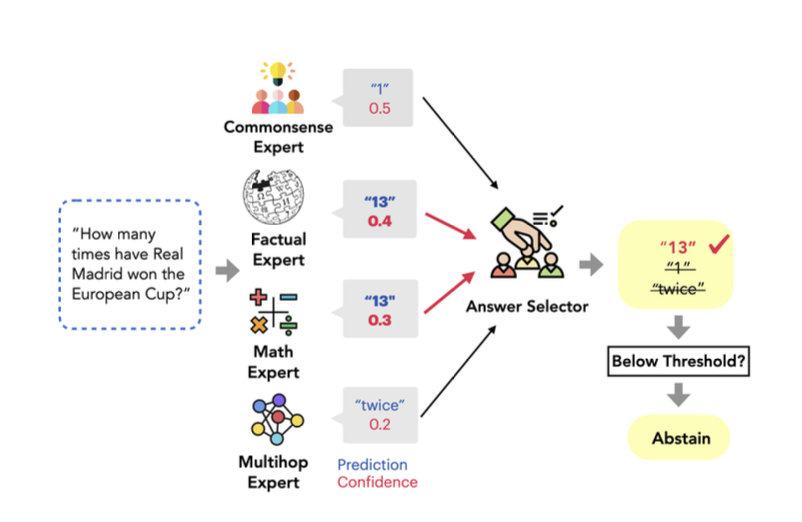

Bước 1: Như đã thực hiện trong hình

---

**Mixture of Reasoning Experts (MORE)**  
Phần này giới thiệu khung làm việc **Mixture of Reasoning Experts (MORE)**, bao gồm cách xây dựng các chuyên gia suy luận đa dạng, cách kết hợp chúng, và cách dự đoán tính chính xác của câu trả lời.  

**3.1 Các chuyên gia suy luận chuyên biệt**  
Bước đầu tiên của hệ thống **MORE** là thu thập một tập hợp đa dạng các mô hình chuyên biệt để có thể kết hợp điểm mạnh của chúng thông qua chiến lược tổ hợp. Mặc dù có nhiều cách để xây dựng các mô hình QA chuyên biệt, chúng tôi thiết kế các chuyên gia suy luận chuyên biệt thông qua việc sử dụng lời nhắc (prompting) cho một mô hình ngôn ngữ lớn (LLM), vì chúng đạt độ chính xác hàng đầu trong nhiều tác vụ suy luận.  

Chúng tôi chuyên biệt hóa mô hình **Codex** (Chen et al., 2021) cho các loại suy luận khác nhau bằng bốn phương pháp nhắc chuyên biệt (các lời nhắc mẫu được liệt kê trong Phụ lục, Hình 3):  

- **Chuyên gia thực tế (Factual expert)** với lời nhắc được tăng cường bởi truy xuất thông tin. Theo Si và cộng sự (2023a), với mỗi câu hỏi, chúng tôi truy xuất 10 đoạn văn bản liên quan nhất từ Wikipedia bằng công cụ **Contriever** (Izacard et al., 2022) và thêm chúng vào lời nhắc ngay trước câu hỏi.  
- **Chuyên gia suy luận đa bước (Multihop expert)** với lời nhắc theo phương pháp **Chain-of-Thought (CoT)** (Wei et al., 2022b). Chúng tôi thêm các lý giải được viết tay sau mỗi câu hỏi mẫu trong lời nhắc để gợi ra quy trình suy luận nhiều bước cho câu hỏi.  
- **Chuyên gia toán học (Math expert)** cũng sử dụng lời nhắc CoT. Chúng tôi thêm các giải thích đi kèm được cung cấp trong **GSM8K** sau mỗi câu hỏi mẫu trong lời nhắc để gợi ra các bước suy luận tương tự cho câu hỏi.  
- **Chuyên gia thường thức (Commonsense expert)** với lời nhắc kiến thức được tạo tự động (generated knowledge prompting) (Liu et al., 2021). Chúng tôi tạo ra 10 mẩu thông tin liên quan đến mỗi câu hỏi bằng mô hình **Codex** và thêm chúng vào lời nhắc ngay trước câu hỏi.  

Sau khi thu thập dự đoán từ mỗi chuyên gia, chúng tôi huấn luyện một bộ phân loại để chọn ra câu trả lời tốt nhất. Điều này cho phép **MORE** kết hợp bốn mô hình chuyên biệt mà không cần biết trước kiểu suy luận của câu hỏi.  

---

Bước 2:

**3.2 Kết hợp thông qua lựa chọn câu trả lời**  
Phương pháp **MORE** kết hợp điểm mạnh của các chuyên gia suy luận bằng cách sử dụng một bộ phân loại ngẫu nhiên rừng (random forest classifier) dựa trên đặc trưng để đánh giá mỗi câu trả lời. Điểm số này được dùng để chọn câu trả lời cuối cùng và xác định khi nào nên bỏ qua câu hỏi.

 **Bộ đặc trưng**  (feature set for model random forcast)
- **Các đặc trưng thiết kế thủ công**:
  - **Loại chuyên gia** (expert type).  
  - **Đặc điểm câu hỏi**: từ khóa câu hỏi, độ dài, có chứa giá trị số hay không.  
  - **Đặc điểm câu trả lời**: độ tự tin, độ dài, mức độ trùng khớp từ khóa với câu hỏi, ngữ cảnh, và lý giải.  
  - **Đồng thuận giữa các chuyên gia**: tần suất câu trả lời được dự đoán giống nhau bởi các chuyên gia, mức độ trùng khớp từ khóa giữa các câu trả lời.  

 **Huấn luyện bộ phân loại**  
- **Dữ liệu huấn luyện**: Giữ lại 100 mẫu từ mỗi bộ dữ liệu QA (tổng cộng 1200 mẫu) làm dữ liệu huấn luyện.  
- **Mục tiêu**: Huấn luyện bộ phân loại để dự đoán xem câu trả lời của mô hình chuyên gia có chính xác hay không (nhị phân).  
- Trong quá trình suy luận (inference), câu trả lời có điểm số cao nhất sẽ được chọn. Nếu điểm số thấp hơn ngưỡng, hệ thống sẽ bỏ qua không trả lời.  

 **Các thí nghiệm khác**  
- Thử nghiệm với các bộ phân loại khác và tinh chỉnh các mô hình ngôn ngữ tiền huấn luyện như BERT, nhưng không hiệu quả bằng random forest.  



**Lựa chọn câu trả lời Few-Shot**

Khi huấn luyện một bộ chọn câu trả lời dựa trên **random forest** có thể cải thiện độ chính xác của tác vụ hỏi đáp (**QA accuracy**) (như sẽ được chứng minh trong phần tiếp theo), phương pháp này yêu cầu một lượng dữ liệu huấn luyện tương đối lớn.  

Để khắc phục điều này, chúng tôi khám phá một phương pháp thay thế sử dụng số lượng mẫu ít (**few-shot**). Cụ thể, chúng tôi trực tiếp cung cấp lời nhắc (**prompt**) cho mô hình **Codex**, bao gồm 14 ví dụ ngẫu nhiên đã được chọn trước. Mỗi ví dụ bao gồm:  
- Câu hỏi,  
- Các dự đoán từ 4 mô hình chuyên gia,  
- Và câu trả lời tốt nhất được chọn trong số đó.  

**Trong quá trình suy luận (inference):**  
Chúng tôi thêm câu hỏi và lời nhắc vào mô hình Codex để nó tự động chọn ra câu trả lời tốt nhất.  `

**A Phụ lục**

**A.1 Lời nhắc cho các chuyên gia lý luận**  
Hình 3 trình bày thiết kế lời nhắc thực tế cho bốn chuyên gia lý luận chuyên biệt trong hệ thống MORE.

**A.2 Giao diện cho nghiên cứu con người**  
Hình 4 trình bày giao diện chú thích cho nghiên cứu về việc từ chối trả lời của con người. Chúng tôi cung cấp hướng dẫn cho nhiệm vụ này, mô tả điểm mạnh của các chuyên gia lý luận, sau đó hiển thị các câu hỏi kiểm tra với tất cả các dự đoán và điểm số từ các chuyên gia. Sau đó, chúng tôi yêu cầu các annotator xác định tính đúng đắn của dự đoán cuối cùng, mức độ tự tin của họ và lý do giải thích. Trong điều kiện cơ sở, bảng dự đoán của chuyên gia bị loại bỏ.

"**Annotator**" (người chú thích) là một thuật ngữ chỉ những người thực hiện công việc chú thích hoặc đánh dấu dữ liệu. Trong các nghiên cứu hoặc dự án học máy (machine learning), annotator thường có nhiệm vụ gán nhãn hoặc chú thích cho dữ liệu, ví dụ như phân loại văn bản, gán nhãn hình ảnh, xác định đối tượng trong ảnh, hoặc đánh giá tính chính xác của các dự đoán. Công việc của họ rất quan trọng trong việc tạo ra bộ dữ liệu huấn luyện chất lượng cao cho các mô hình học máy.

Trong trường hợp của bài báo trên, "**annotator**" là người tham gia vào nghiên cứu để đánh giá tính đúng đắn của các dự đoán từ các chuyên gia lý luận (reasoning experts) và đưa ra các đánh giá về sự chính xác, mức độ tự tin, cũng như lý do giải thích cho câu trả lời cuối cùng.

**A.3 Các đặc trưng để huấn luyện bộ phân loại**  
Dưới đây là danh sách tất cả các đặc trưng được sử dụng để huấn luyện bộ phân loại rừng ngẫu nhiên (random forest classifier) mà đánh giá các dự đoán của chuyên gia:
- **Loại chuyên gia chuyên biệt:** một vector one-hot 4 chiều.
- **Đặc trưng câu hỏi:** từ câu hỏi, độ dài câu hỏi và số lượng giá trị số trong câu hỏi.
- **Đặc trưng câu trả lời:** xác suất của đầu ra được tạo ra (nhân xác suất của từng token và chuẩn hóa theo độ dài như trong Si et al. (2023a)), độ dài của câu trả lời được tạo ra, độ trùng lặp giữa câu hỏi và câu trả lời dự đoán, số lượng giá trị số trong câu trả lời, độ trùng lặp giữa câu trả lời và các đoạn văn đã được truy xuất hoặc tạo ra, độ dài của lý do CoT, độ trùng lặp giữa câu hỏi và lý do, độ trùng lặp giữa câu trả lời và lý do, số lần câu trả lời xuất hiện trong lý do, và số lượng giá trị số trong lý do.
- **Bối cảnh của các chuyên gia Factual và Commonsense:** số lượng giá trị số trong các đoạn văn đã được truy xuất hoặc tạo ra, số lượng token trùng lặp giữa câu hỏi và các đoạn văn, và độ dài của các đoạn văn.
- **Thỏa thuận giữa các chuyên gia:** tần suất câu trả lời dự đoán xuất hiện trong dự đoán của tất cả bốn chuyên gia, độ trùng lặp token giữa các kết quả đầu ra của các chuyên gia.

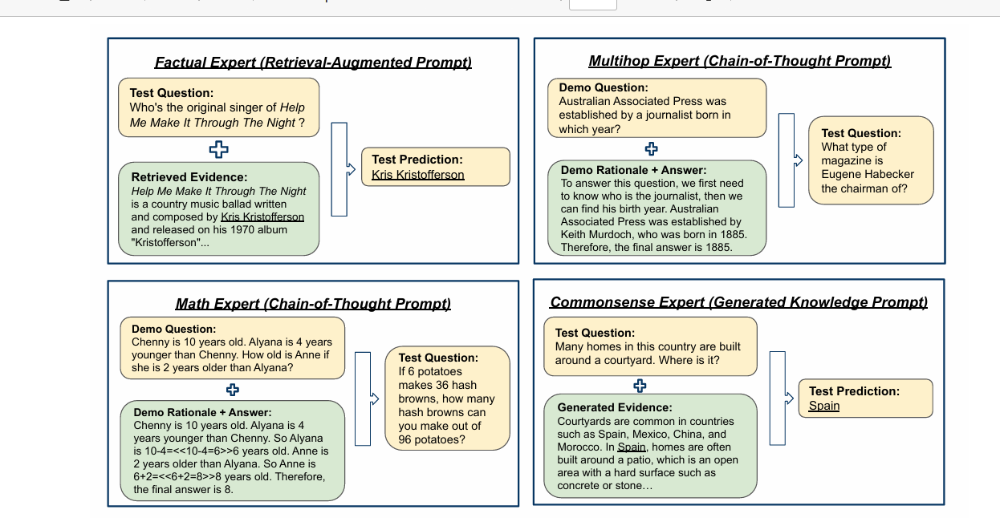

In [ ]:
from openai import OpenAI
from pydantic import BaseModel, Field
import instructor
from textwrap import dedent

client = instructor.from_openai(OpenAI())


class MultihopExpert(BaseModel):
    chain_of_thought: str
    answer: str


class FactualExpert(BaseModel):
    answer: str


class ModelScore(BaseModel):
    score: float = Field(ge=0, lt=1)


def query_factual_expert(query: str, evidence: list[str]):
    formatted_evidence = "\n-".join(evidence)
    return client.chat.completions.create(
        model="gpt-4o",
        response_model=FactualExpert,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                <query>
                {query}
                </query>

                <evidences>
                {formatted_evidence}
                </evidences>
                """
                ),
            }
        ],
    )


def query_multihop_expert(query: str):
    return client.chat.completions.create(
        model="gpt-4o",
        response_model=MultihopExpert,
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                <query>
                {query}
                </query>
                """
                ),
            }
        ],
    )


def score_answer(query: str, answer: str):
    return client.chat.completions.create(
        model="gpt-4o",
        response_model=ModelScore,
        messages=[
            {
                "role": "system",
                "content": """You are a helpful assistant that scores
                answers based on well they are able to answer a
                specific user query""",
            },
            {
                "role": "user",
                "content": f"""
                <user query>
                {query}
                </user query>

                <response>
                {answer}
                </response>
                """,
            },
        ],
    )


if __name__ == "__main__":
    query = """Who's the original singer of Help Me Make It
    Through The Night?"""
    evidences = [
        """Help Me Make It Through The Night is a country
        music ballad written and composed by Kris Kristofferson
        and released on his 1970 album 'Kristofferson'"""
    ]

    threshold = 0.8

    factual_expert_output = query_factual_expert(query, evidences)
    print(factual_expert_output.model_dump_json(indent=2))
    """
    {
      "answer": "The original singer of 'Help Me Make It Through the
      Night' is Kris Kristofferson, who released it on his 1970 album
      'Kristofferson'."
    }
    """

    multihop_expert_output = query_multihop_expert(query)
    print(multihop_expert_output.model_dump_json(indent=2))
    """
    {
      "chain_of_thought": "To identify the original singer of 'Help Me
      Make It Through The Night,' I need to look for the person who
      first recorded and released the song.",
      "answer": "The original singer of 'Help Me Make It Through
      The Night' is Kris Kristofferson."
    }
    """

    factual_expert_score = score_answer(query, factual_expert_output.answer)
    multihop_expert_score = score_answer(query, multihop_expert_output.answer)

    if max(factual_expert_score.score, multihop_expert_score.score) < threshold:
        answer = "Abstaining from responding"
    elif factual_expert_score.score > multihop_expert_score.score:
        answer = factual_expert_output.answer
    else:
        answer = multihop_expert_output.answer

    print(answer)
    """
    The original singer of 'Help Me Make It Through the Night' is Kris
    Kristofferson, who released it on his 1970 album 'Kristofferson'.
    """

##### Generate Multiple Candidate Responses

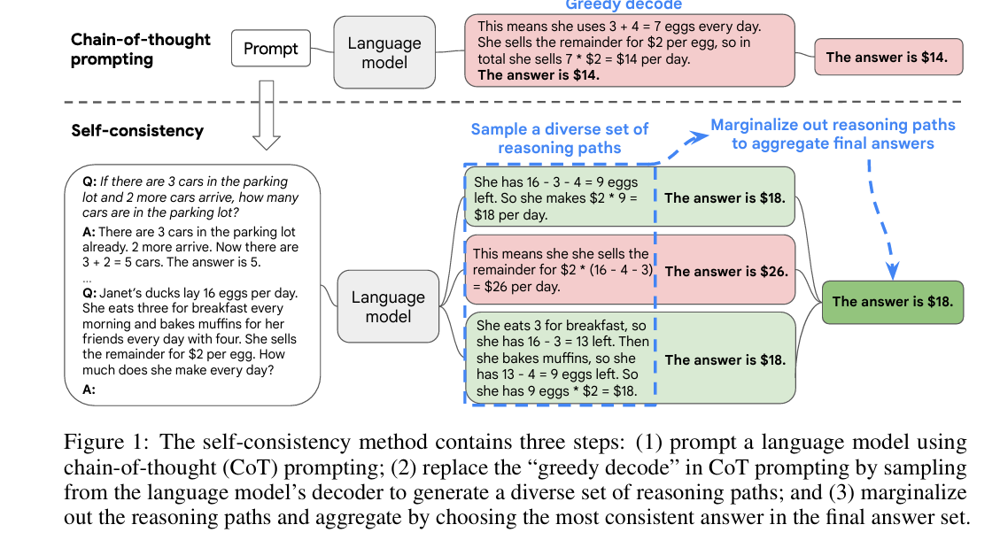

**Chuỗi suy nghĩ (Chain-of-thought prompting)** khi kết hợp với các mô hình ngôn ngữ lớn đã được huấn luyện trước đã đạt được những kết quả đáng khích lệ trong các tác vụ suy luận phức tạp. Trong bài báo này, chúng tôi đề xuất một chiến lược giải mã mới, gọi là **self-consistency** (tự nhất quán), để thay thế phương pháp giải mã tham lam (greedy decoding) đơn giản thường được sử dụng trong chuỗi suy nghĩ.

 **Chiến lược giải mã Self-consistency**  
- **Ý tưởng chính:**  
  Self-consistency không chỉ chọn một lộ trình suy luận tham lam duy nhất mà thay vào đó, nó lấy mẫu một tập hợp đa dạng các lộ trình suy luận. Sau đó, nó chọn câu trả lời nhất quán nhất bằng cách **tổng hợp (marginalizing out)** dựa trên các lộ trình suy luận được lấy mẫu.  
  - Dựa trên trực giác rằng một vấn đề suy luận phức tạp thường có nhiều cách suy nghĩ khác nhau dẫn đến cùng một câu trả lời đúng duy nhất.

 **Hiệu quả thực nghiệm**
- Phương pháp self-consistency được đánh giá thực nghiệm trên nhiều bộ dữ liệu chuẩn cho bài toán suy luận số học và suy luận thông thường (arithmetic and commonsense reasoning).  
- Kết quả cho thấy self-consistency giúp cải thiện hiệu suất của chuỗi suy nghĩ với **mức tăng đáng kể** trên các bộ dữ liệu:  
  - **GSM8K:** +17.9%  
  - **SVAMP:** +11.0%  
  - **AQuA:** +12.2%  
  - **StrategyQA:** +6.4%  
  - **ARC-challenge:** +3.9%  

Self-consistency tận dụng tối đa sức mạnh của suy luận phức tạp, tạo ra một bước tiến lớn trong việc cải thiện hiệu quả của các mô hình ngôn ngữ lớn khi giải quyết các vấn đề suy luận.

By generating multiple candidate responses in parallel and choosing the most common answer among them, we can get a more accurate answer. This is known as Self-Consistency [Bằng cách tạo song song nhiều câu trả lời của ứng viên và chọn câu trả lời phổ biến nhất trong số đó, chúng ta có thể nhận được câu trả lời chính xác hơn. Điều này được gọi là Sự Tự Thống Nhất] x 1

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 11.0 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
import instructor
from pydantic import BaseModel, Field
from openai import AsyncOpenAI
import asyncio
from collections import Counter
from textwrap import dedent


class SelfConsistencyResponse(BaseModel):
    chain_of_thought: str = Field(
        description="reasoning behind the final correct answer"
    )
    correct_answer: int


client = AsyncOpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")

client = instructor.from_openai(client)
async def generate_self_consistent_response(prompt: str):
    return await client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "system",
                "content": """You are an intelligent question
                answering AI system that excels at answering
                user queries. Make sure to generate a
                comprehensive explanation of your thought
                process before providing the final answer""",
            },
            {"role": "user", "content": prompt},
        ],
        response_model=SelfConsistencyResponse,
        temperature=0.5,
    )


async def generate_self_consistent_responses(prompt: str, num_responses: int):
    coros = [generate_self_consistent_response(prompt) for _ in range(num_responses)]
    responses = await asyncio.gather(*coros)
    return responses


import nest_asyncio
if __name__ == "__main__":
    prompt = dedent(
        """
        Janet's ducks lay 16 eggs per day.
        She eats three for breakfast every
        morning and bakes muffins for her
        friends every day with four. She sells
        the remainder for $2 per egg. How
        much does she make every day?
        """
    )
    loop = asyncio.get_event_loop()

    # Apply nest_asyncio to the loop
    nest_asyncio.apply(loop)
    responses = loop.run_until_complete(generate_self_consistent_responses(prompt, 5))
    answer_counts = Counter([response.correct_answer for response in responses])
    most_common_answer, _ = answer_counts.most_common(1)[0]

    print(most_common_answer)
    #> 18

18


In [ ]:
responses[0]

SelfConsistencyResponse(chain_of_thought="To calculate how much Janet makes every day from her ducks' eggs, we need to follow these steps: 1. Determine the total number of eggs laid per day by Janet's ducks, which is given as 16 eggs. 2. Calculate how many eggs Janet consumes and uses for baking each day. She eats 3 eggs for breakfast and uses 4 eggs for muffins. Therefore, the total number of eggs consumed and used for baking is 3 + 4 = 7 eggs. 3. Subtract the total number of eggs consumed and used for baking from the total number of eggs laid to find out how many eggs are left for selling: 16 eggs - 7 eggs = 9 eggs remaining. 4. Janet sells the remaining eggs for $2 each. Therefore, her daily earnings from selling the eggs can be calculated by multiplying the number of eggs sold by the price per egg: 9 eggs * $2/egg = $18. Thus, Janet makes $18 every day from selling her ducks' eggs.", correct_answer=18)

##### Use LLMs to Combine Different Responses


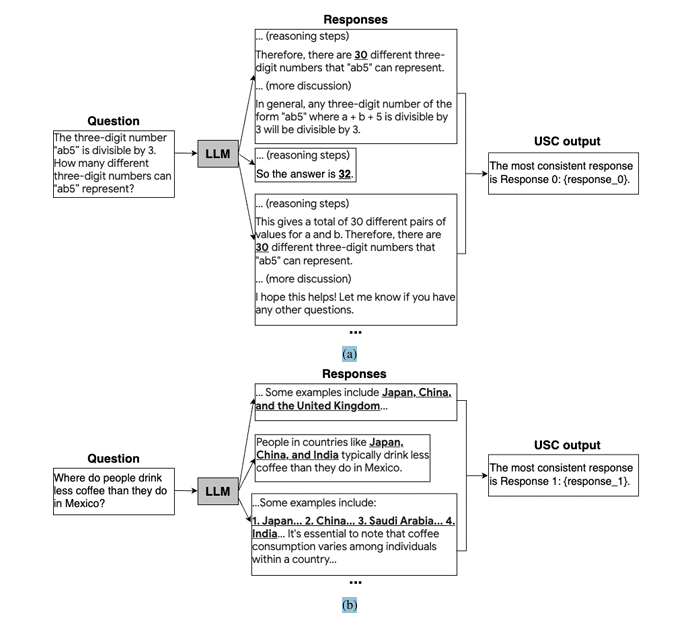

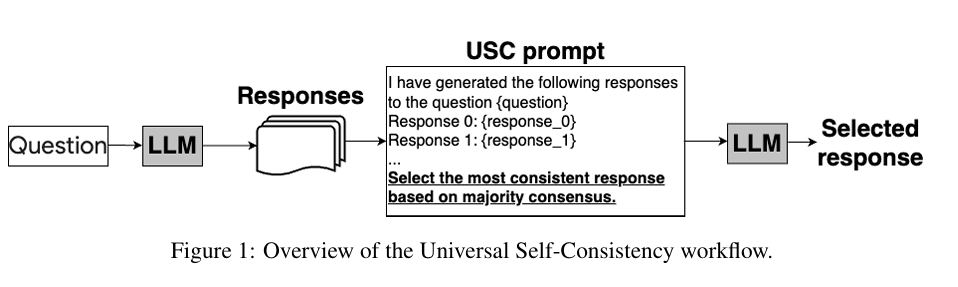

 **Quy trình tổng quan về Universal Self-Consistency (USC)**

Quy trình **Universal Self-Consistency (USC)** được minh họa trong Hình 1, sử dụng các mô hình ngôn ngữ lớn (LLMs) để đảm bảo tính nhất quán tự thân trên nhiều nhiệm vụ khác nhau, đặc biệt là nhiệm vụ sinh văn bản tự do.

 **Các bước thực hiện USC:**
1. **Tạo nhiều phản hồi:**
   - Sử dụng LLM để tạo ra một tập hợp các phản hồi cho một câu hỏi hoặc tác vụ cụ thể.
2. **Lựa chọn phản hồi cuối cùng:**
   - Kết hợp tất cả các phản hồi lại thành một đoạn văn bản.
   - Xây dựng một prompt với hướng dẫn yêu cầu LLM chọn ra phản hồi nhất quán nhất.
3. **Lợi ích:**
   - Loại bỏ nhu cầu đếm tần suất câu trả lời đúng như phương pháp **self-consistency** truyền thống.
   - Dựa vào khả năng của LLM để đánh giá tính nhất quán giữa các phản hồi.

 **Đánh giá tính nhất quán bằng LLMs:**
Phương pháp này mang lại sự linh hoạt hơn cho nhiệm vụ sinh văn bản tự do.  
- **Hình 2a (Lý luận toán học):**
   - Các phản hồi có định dạng đầu ra đa dạng, khiến các phương pháp dựa trên quy tắc khó trích xuất câu trả lời chính xác.
   - Nếu trích xuất chính xác, tiêu chí nhất quán vẫn dựa vào việc khớp chính xác giá trị cuối cùng (số học).
- **Hình 2b (Câu hỏi mở):**
   - Phản hồi cuối cùng là danh sách thực thể (entity list), không có phản hồi nào giống nhau hoàn toàn.
   - LLM chọn câu trả lời mà các thực thể được dự đoán xuất hiện thường xuyên nhất trong các phản hồi ứng viên.

 **Khả năng mở rộng của USC:**
Ngoài trả lời câu hỏi, LLM có thể kiểm tra tính nhất quán trong các nhiệm vụ khác như:
- **Sinh mã (Code generation):** Đánh giá mà không cần truy cập kết quả thực thi.
- **Tóm tắt văn bản dài (Long-context summarization).**

 **Kết luận:**
Dù có ý kiến cho rằng LLM đôi khi khó đánh giá tính chính xác của dự đoán, USC cho thấy khả năng của LLM trong việc kiểm tra tính nhất quán giữa các phản hồi trên nhiều loại nhiệm vụ.

**Universal Self-Consistency (USC)**

Universal Self-Consistency (USC) là một phương pháp được thiết kế để tận dụng LLMs nhằm đảm bảo tính nhất quán trong nhiều nhiệm vụ khác nhau, đặc biệt là các tác vụ sinh văn bản tự do.

 **Quy trình của USC:**
1. **Tạo nhiều phản hồi:** LLM được sử dụng để tạo ra nhiều phản hồi (responses) cho một câu hỏi hoặc tác vụ.
2. **Tích hợp và đánh giá tính nhất quán:**
   - Kết hợp tất cả các phản hồi lại thành một chuỗi.
   - Xây dựng một prompt chứa hướng dẫn yêu cầu LLM chọn phản hồi nhất quán nhất.
3. **Ưu điểm:**
   - Không cần đếm tần suất câu trả lời chính xác như phương pháp self-consistency tiêu chuẩn.
   - Sử dụng khả năng của LLM để đánh giá tính nhất quán giữa các phản hồi.

 **Ví dụ ứng dụng:**
1. **Lý luận toán học (Figure 2a):**
   - Các phản hồi có định dạng đầu ra khác nhau, làm cho các phương pháp dựa trên quy tắc khó trích xuất câu trả lời chính xác.
   - Tuy nhiên, USC có thể chọn đáp án nhất quán nhất dựa trên việc khớp chính xác giá trị cuối cùng.

2. **Câu hỏi mở (Figure 2b):**
   - Đầu ra là một danh sách thực thể (entity list), trong đó không có phản hồi nào hoàn toàn giống nhau.
   - USC chọn phản hồi mà các thực thể trong danh sách xuất hiện thường xuyên nhất trong số các phản hồi ứng viên.

 **Lợi ích và khả năng của USC:**
- USC linh hoạt trong việc đánh giá tính nhất quán, đặc biệt đối với các tác vụ sinh văn bản tự do.
- Có thể áp dụng vào nhiều loại nhiệm vụ khác nhau, bao gồm:
  - **Sinh mã (code generation):** Đánh giá tính nhất quán mà không cần truy cập kết quả thực thi.
  - **Tóm tắt văn bản dài (long-context summarization).**

Nghiên cứu cho thấy, mặc dù LLM đôi khi gặp khó khăn trong việc đánh giá độ chính xác của dự đoán, chúng vẫn có khả năng kiểm tra tính nhất quán giữa các phản hồi trên nhiều nhiệm vụ.

[Universal Self Consistency](https://arxiv.org/pdf/2311.17311)1 aims to extend self-consistency by using a second LLM model to judge the quality of individual responses. Therefore instead of choosing the final answer based on the most frequently occuring value among each reasoning chain, we instead prompt the model to choose the most consistent answer for us relative to the prompt. [Tính tự nhất quán toàn cầu1 nhằm mục đích mở rộng tính tự nhất quán bằng cách sử dụng mô hình LLM thứ hai để đánh giá chất lượng của các phản hồi riêng lẻ. Do đó, thay vì chọn câu trả lời cuối cùng dựa trên giá trị xuất hiện thường xuyên nhất trong mỗi chuỗi suy luận, thay vào đó, chúng tôi nhắc mô hình chọn câu trả lời nhất quán nhất cho chúng tôi so với lời nhắc.] x

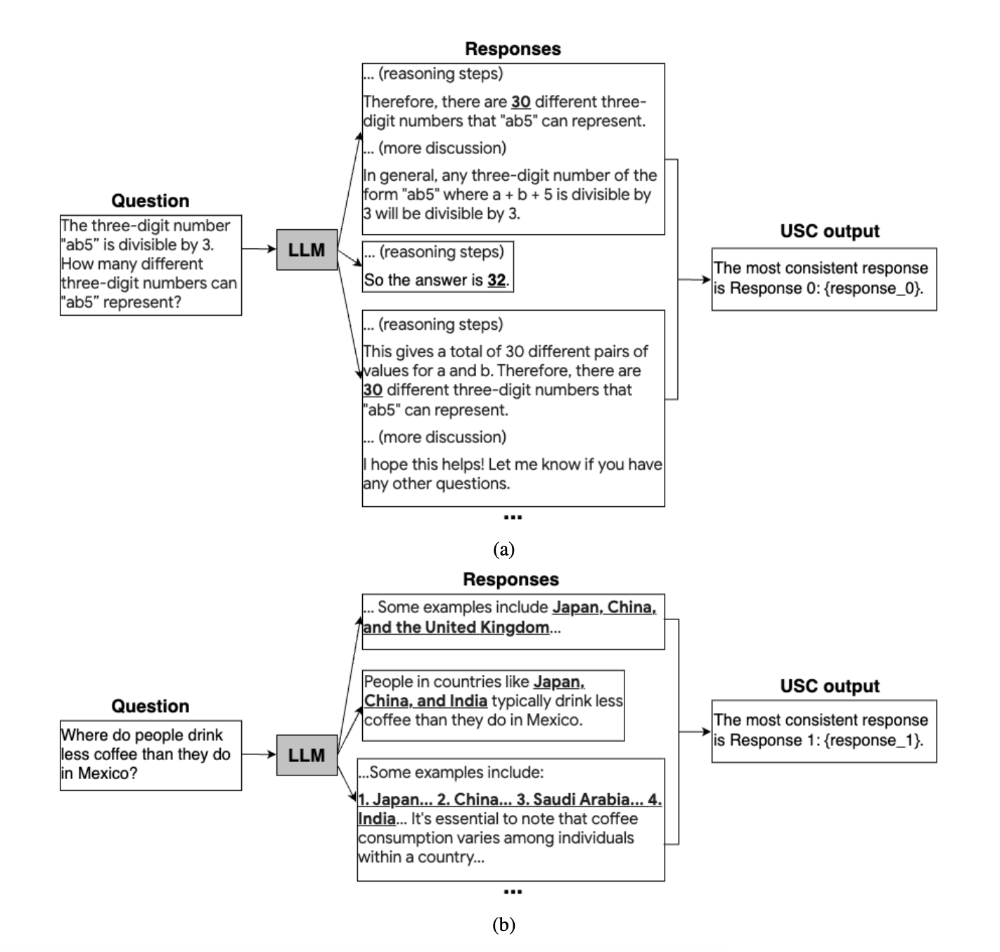

This enables us to support a greater variety of different response formats and answer, leading to greater diversity of outputs and hence higher accuracy. [Điều này cho phép chúng tôi hỗ trợ nhiều định dạng phản hồi và câu trả lời khác nhau hơn, dẫn đến kết quả đầu ra đa dạng hơn và do đó độ chính xác cao hơn.] x

In [ ]:
from openai import AsyncOpenAI
from pydantic import BaseModel, Field, ValidationInfo, field_validator
import instructor
from textwrap import dedent
import asyncio

client = instructor.from_openai(AsyncOpenAI())


class Response(BaseModel):
    chain_of_thought: str
    answer: str


class SelectedResponse(BaseModel):
    most_consistent_response_id: int = Field(
        description="""The ID of the most consistent response that
        was provided"""
    )

    @field_validator("most_consistent_response_id")
    @classmethod
    def validate_id(cls, v: int, info: ValidationInfo):
        context = info.context
        number_responses = context.get("number_responses", float("inf"))

        if v > number_responses:
            raise ValueError(
                f"""Most consistent response ID {v} is greater than the
                number of responses {number_responses}. Please return a
                valid id between 0 and {number_responses-1}"""
            )
        return v


async def generate_response(query: str) -> Response:
    return await client.chat.completions.create(
        model="gpt-4o",
        response_model=Response,
        messages=[{"role": "user", "content": query}],
    )


async def generate_batch_responses(query: str, no_responses: int):
    coros = [generate_response(query) for _ in range(no_responses)]
    return await asyncio.gather(*coros)


async def select_consistent_response(responses: list[Response], query: str):
    formatted_responses = "\n".join(
        [
            f"Response {idx}: {response.chain_of_thought}. {response.answer}"
            for idx, response in enumerate(responses)
        ]
    )

    return await client.chat.completions.create(
        model="gpt-4o",
        response_model=SelectedResponse,
        messages=[
            {
                "role": "user",
                "content": dedent(
                    f"""
                <user query>
                {query}
                </user query>

                {formatted_responses}

                Evaluate these responses.
                Select the most consistent response based on majority
                consensus
                """
                ),
            }
        ],
        validation_context={"number_responses": len(responses)},
    )


if __name__ == "__main__":
    query = """The three-digit number 'ab5' is divisible by 3. How many different
     three-digit numbers can 'ab5' represent?"""
    responses = asyncio.run(generate_batch_responses(query, 3))

    for response in responses:
        print(response.model_dump_json(indent=2))
        """
        {
          "chain_of_thought": "A number is divisible by 3 if
          the sum of its digits is divisible by 3. Given the
          number 'ab5', we need to check how many different
          values of 'a' and 'b', where both are digits (0-9)
          can make the sum divisible by 3.\n\nThe sum of the
          digits is a + b + 5.\n\nWe need to find pairs (a, b)
          such that (a + b + 5) % 3 == 0.",
          "answer": "30"
        }
        """
        """
        {
          "chain_of_thought": "A number is divisible by 3 if
          the sum of its digits is divisible by 3. Let's
          denote the digits a and b. The number 'ab5' has
          digits a, b, and 5. Therefore, the sum of the
          digits is a + b + 5. Since the number is divisible
          by 3, a + b + 5 must be divisible by 3.\n\nNow,
          since a and b are single digits (0-9), we need to
          find pairs (a, b) such that a + b + 5 is divisible
          by 3. We will evaluate all possible combinations of
          values for a and b to count how many valid pairs
          (a, b) exist.\n\nLet's start by considering b's
          values:\n1. If b = 0, then a + 5 must be divisible
          by 3.\n2. If b = 1, then a + 6 must be divisible by
          3.\n3. If b = 2, then a + 7 must be divisible by
          3.\n4. If b = 3, then a + 8 must be divisible by
          3.\n5. If b = 4, then a + 9 must be divisible by
          3.\n6. If b = 5, then a + 10 must be divisible by
          3.\n7. If b = 6, then a + 11 must be divisible by
          3.\n8. If b = 7, then a + 12 must be divisible by
          3.\n9. If b = 8, then a + 13 must be divisible by
          3.\n10. If b = 9, then a + 14 must be divisible by
          3.\n\nWe will find all corresponding a values for
          each b and count the valid combinations.\n",
          "answer": "There are 30 different three-digit
          numbers that 'ab5' can represent."
        }
        """
        """
        {
          "chain_of_thought": "A number is divisible by 3 if
          the sum of its digits is divisible by 3. The given
          number is in the form 'ab5', where 'a' and 'b' are
          digits from 0 to 9. To find the total number of
          different three-digit numbers that 'ab5' can
          represent, we need to determine all possible digit
          combinations for 'a' and 'b' such that 'a + b + 5'
          is divisible by 3.",
          "answer": "30"
        }
        """

    selected_response = asyncio.run(select_consistent_response(responses, query))
    print(selected_response.model_dump_json(indent=2))
    """
    {
      "most_consistent_response_id": 0
    }
    """

    print(
        responses[selected_response.most_consistent_response_id].model_dump_json(
            indent=2
        )
    )
    """
    {
      "chain_of_thought": "A number is divisible by 3 if the sum of its digits is divisible by 3. Given the number 'ab5', we need to
      check how many different values of 'a' and 'b', where both are digits (0-9) can make the sum divisible by 3.\n\nThe sum of the
      digits is a + b + 5.\n\nWe need to find pairs (a, b) such that (a + b + 5) % 3 == 0.",
      "answer": "30"
    }
    """

##### Universal Self Prompting

Universal Self Prompting is a two stage process similar to Consistency Based Self Adaptive Prompting (COSP). Here is a breakdown of the two stages. [Nhắc nhở Tự thích ứng Toàn cầu là một quá trình gồm hai giai đoạn tương tự như Nhắc nhở Tự Thích ứng Dựa trên Tính nhất quán (COSP). Dưới đây là bảng phân tích của hai giai đoạn.] x

1. Generate Examples: LLMs are prompted to generate a collection of candidates responses using test dataset.

Tạo ví dụ: LLM được nhắc tạo tập hợp các phản hồi của ứng viên bằng cách sử dụng tập dữ liệu thử nghiệm

2. Answer Query: We then select a few of these model-generated responses as examples to prompt the LLM to obtain a final prediction.

Trả lời truy vấn: Sau đó, chúng tôi chọn một vài trong số các phản hồi do mô hình tạo này làm ví dụ để nhắc LLM đưa ra dự đoán cuối cùng

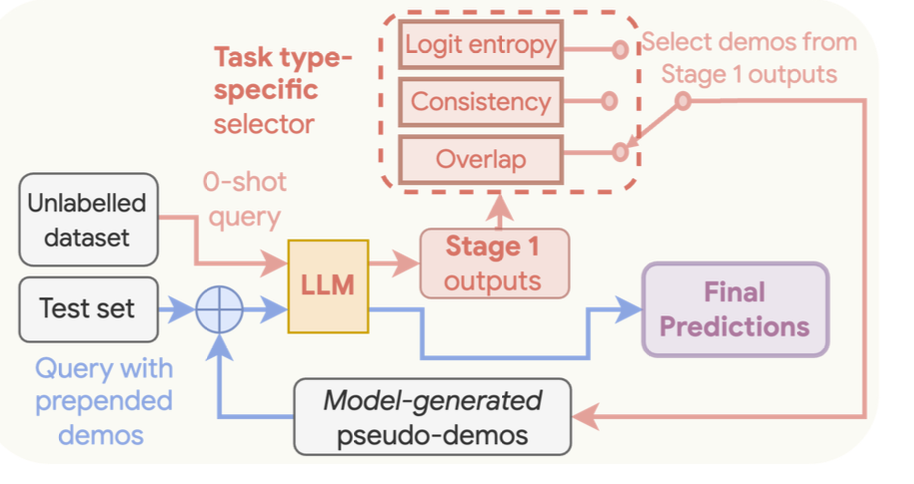

**Tạo các ví dụ Few-Shot**

Đầu tiên, chúng ta yêu cầu mô hình tạo ra các phản hồi cho một tập hợp các đề xuất (prompts) đã cho. Thay vì đo lường entropy và mức độ lặp lại như trong COSP, chúng ta sử dụng một trong ba phương pháp để đánh giá chất lượng các phản hồi được tạo ra. Các phương pháp này được quyết định dựa trên ba loại tác vụ được hỗ trợ.

Loại tác vụ này phải được người dùng chỉ định trước.

**Lưu ý:** Đối với việc sinh dữ liệu ngắn hạn (Short Form) và dài hạn (Long Form), chúng ta tạo ra $ m
$ mẫu khác nhau. Điều này không áp dụng cho các tác vụ phân loại.

 1. **Phân loại (Classification):**
Các tác vụ phân loại được đánh giá bằng xác suất chuẩn hóa của mỗi nhãn sử dụng các giá trị logit thô từ mô hình ngôn ngữ lớn (LLM). Công thức đánh giá:

$$
F_{CLS}(p(j) \mid d(j)) := - \sum_{c \in C} P(c \mid d(j)) \log P(c \mid d(j))
$$

Trong đó:
- Chúng ta sử dụng logit thô của từng token tương ứng với nhãn.
- Áp dụng softmax để chuẩn hóa.
- Tổng hợp các xác suất riêng lẻ cùng với log của chúng.

Ngoài ra, chúng ta cố gắng lấy đủ số lượng câu truy vấn để đảm bảo rằng các dự đoán được cân bằng giữa các nhãn, tránh mô hình thiên vị về một số lớp nhất định.

---

 2. **Sinh ngắn hạn (Short Form Generation):**
Được thực hiện bằng cách sử dụng một công thức tương tự COSP nhưng không bao gồm phần tử chuẩn hóa:

$$
H(x(i) \mid \{ \hat{y}^j(i) \}_{j=1}^m) = \frac{\sum_{\alpha=1}^u \hat{p}(\hat{y}^\alpha(i)) \log \hat{p}(\hat{y}^\alpha(i))}{\log m}
$$

Trong đó:
- $ x(i)
$ là đầu vào.
- $ \{ \hat{y}^j(i) \}
$ là các mẫu phản hồi được tạo ra.
- $ m
$ là số lượng mẫu phản hồi.

---

 3. **Sinh dài hạn (Long Form Generation):**
Được thực hiện bằng cách tính điểm ROUGE trung bình giữa tất cả các cặp $ m
$ phản hồi:

- Phương pháp này đặc biệt dựa trên việc đánh giá dựa trên nội dung sinh dài hạn, như tóm tắt văn bản hoặc dịch máy.

---

 **Loại tác vụ mẫu cho từng loại:**
- **Phân loại:** Suy luận ngôn ngữ tự nhiên, phân loại chủ đề, phân tích cảm xúc.
- **Sinh ngắn hạn:** Trả lời câu hỏi, hoàn thành câu.
- **Sinh dài hạn:** Tóm tắt văn bản, dịch máy.

Cách tiếp cận này giúp cải thiện hiệu suất của các mô hình ngôn ngữ lớn (LLM) trên các loại tác vụ khác nhau.

---

 **Tạo phản hồi đơn**
Sau khi chọn các ví dụ, bước thứ hai trở nên đơn giản hơn. Chúng ta chỉ cần thêm một số ví dụ tốt nhất theo tiêu chí đánh giá đã chọn vào tập hợp giải pháp.

##### Use Translation for Paraphrasing

Large Language Models are sensitive to the way that they are prompted. When prompted incorrectly, they might perform much worse despite having the information or capability to respond to the prompt. We can help find semantically similar prompts by performing back translation - where we translate our prompts to another language and back to encourage more diversity in the rephrased prompts. [Mô hình ngôn ngữ lớn rất nhạy cảm với cách chúng được nhắc. Khi được nhắc không chính xác, chúng có thể hoạt động kém hơn nhiều mặc dù có thông tin hoặc khả năng phản hồi lời nhắc. Chúng tôi có thể giúp tìm các lời nhắc tương tự về mặt ngữ nghĩa bằng cách thực hiện dịch ngược - trong đó chúng tôi dịch các lời nhắc của mình sang một ngôn ngữ khác và dịch ngược lại để khuyến khích sự đa dạng hơn trong các lời nhắc được diễn đạt lại.] x

Prompt paraphrasing 1. provides some ways for us to improve on the phrasing of our prompts to do so. [Diễn giải nhanh chóng 1. cung cấp một số cách để chúng tôi cải thiện cách diễn đạt các lời nhắc của chúng tôi để làm như vậy.] x

Các mô hình ngôn ngữ lớn (Large Language Models - LLMs) rất nhạy cảm với cách chúng được đưa ra gợi ý (prompting). Khi được gợi ý ***không đúng cách***, chúng có thể hoạt động kém hơn đáng kể mặc dù có thông tin hoặc khả năng để ***trả lời đúng gợi ý đó***. Chúng ta có thể ***tìm các gợi ý tương đồng về mặt ngữ nghĩa*** bằng cách thực hiện dịch ngược (***back translation***) – nghĩa là ***dịch gợi ý sang một ngôn ngữ khác*** và sau đó ***dịch ngược lại*** để tạo ra ***sự đa dạng hơn trong các gợi ý được chuyển đổi***.

Việc **diễn đạt lại gợi ý** (prompt paraphrasing) cung cấp một số cách để chúng ta cải thiện cách diễn đạt của các gợi ý nhằm đạt được hiệu quả tốt hơn.

Chúng ta có thể triển khai phương pháp này bằng cách sử dụng **instructor**, như ví dụ bên dưới.

In [ ]:
import instructor
from openai import AsyncOpenAI
from pydantic import BaseModel
import random

client = instructor.from_openai(AsyncOpenAI())


class TranslatedPrompt(BaseModel):
    translation: str


async def translate_prompt(prompt: str, from_language: str, to_language: str):
    return await client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {
                "role": "system",
                "content": f"""
                You are an expert translation assistant.
                You are going to be given a prompt and
                asked to translate it from {from_language}
                to {to_language}. Paraphrase and use
                synonyms where possible, especially for
                the examples.
                """,
            },
            {"role": "user", "content": f"Prompt: {prompt}"},
        ],
        response_model=TranslatedPrompt,
    )


async def generate_permutation(prompt: str, language: str) -> str:
    tranlated_prompt = await translate_prompt(prompt, "english", language)
    backtranslated_prompt = await translate_prompt(
        tranlated_prompt.translation, language, "english"
    )
    return backtranslated_prompt.translation


async def generate_prompts(
    prompt: str, languages: list[str], permutations: int
) -> list[str]:
    coros = [
        generate_permutation(prompt, random.choice(languages))
        for _ in range(permutations)
    ]
    return await asyncio.gather(*coros)


if __name__ == "__main__":
    import asyncio

    prompt = """
    You are an expert system that excels at Sentiment
    Analysis of User Reviews.

    Here are a few examples to refer to:

    1. That was a fantastic experience I had! I'm
    definitely recommending this to all my friends
    // Positive
    2. I think it was a passable evening. I don't think
    there was anything remarkable or off-putting for me.
    // Negative
    3. I'm horrified at the state of affairs in this new
    restaurant // Negative

    Sentence: This was a fantastic experience!
    """
    languages = ["french", "spanish", "chinese"]
    permutations = 2

    generated_prompts = asyncio.run(generate_prompts(prompt, languages, permutations))
    for prompt in generated_prompts:
        print(prompt)
        """
        You are an expert system specializing in user review sentiment analysis. Here are a few examples to guide you: 1. It was an exceptional experience! I will definitely recommend it to all my friends // Positive 2. I think it was a mediocre evening. There wasn't anything outstanding or particularly bad for me // Negative 3. I am horrified by the condition of things in this new restaurant // Negative Sentence: It was an amazing experience!
        """
        """
        You are an expert system that excels in User Review Sentiment Analysis.

        Here are some reference examples:

        1. I had an amazing experience! I will definitely recommend it to all my friends.
        // Positive
        2. I think it was an average evening. I don’t believe there was anything remarkable or unpleasant about it for me.
        // Negative
        3. I am horrified by the situation at this new restaurant.
        // Negative

        Sentence: This was a fantastic experience!
        """
        """
        You are an expert system skilled in conducting user
        review sentiment analysis.

        Here are some examples for reference:

        1. That was an awesome experience! I'll definitely
        recommend it to all my friends // Positive
        2. I think it was an okay evening. I don't find
        anything particularly outstanding or unpleasant.
        // Neutral
        3. I am very shocked by the condition of this new
        restaurant // Negative

        Sentence: This was a wonderful experience!
        """

## Application

1. **Enum-Based Classification**: Implement structured classification using Python enums with AI models.  
   Phân loại dựa trên Enum: Thực hiện phân loại có cấu trúc bằng cách sử dụng enum trong Python với các mô hình AI.


2. **AI Self-Assessment and Correction**: Explore techniques for AI models to evaluate and improve their own outputs.  
   Tự đánh giá và điều chỉnh AI: Khám phá các kỹ thuật để mô hình AI có thể tự đánh giá và cải thiện kết quả của mình.


3. **Efficient Batch Classification**: Process multiple items simultaneously for improved performance.  
   Phân loại theo lô hiệu quả: Xử lý nhiều mục cùng lúc để nâng cao hiệu suất.


4. **Precise Citation Extraction**: Accurately retrieve and format citations from text using AI.  
   Trích xuất trích dẫn chính xác: Sử dụng AI để trích xuất và định dạng trích dẫn từ văn bản một cách chính xác.


5. **Search Query Segmentation**: Break down complex search queries into structured components for better understanding.  
   Phân đoạn truy vấn tìm kiếm: Phân tách các truy vấn tìm kiếm phức tạp thành các thành phần có cấu trúc để dễ hiểu hơn.

6. **Dynamic Knowledge Graph Generation**: Create visual representations of information relationships using AI.  
   Tạo đồ thị tri thức động: Tạo các biểu diễn trực quan về mối quan hệ thông tin bằng AI.


7. **Complex Query Decomposition**: Break down intricate queries into manageable subtasks for thorough analysis.  
   Phân rã truy vấn phức tạp: Phân chia các truy vấn phức tạp thành các nhiệm vụ con dễ quản lý hơn để phân tích chi tiết.


8. **Entity Extraction and Resolution**: Identify and disambiguate named entities in text.  
   Trích xuất và phân giải thực thể: Xác định và làm rõ các thực thể được đặt tên trong văn bản.


9. **PII Sanitization**: Detect and redact sensitive personal information from text data.  
   Làm sạch thông tin cá nhân nhạy cảm (PII): Phát hiện và xóa các thông tin cá nhân nhạy cảm khỏi dữ liệu văn bản.


10. **Action Item and Dependency Extraction**: Generate structured task lists and relationships from meeting transcripts.  
    Trích xuất mục hành động và phụ thuộc: Tạo danh sách nhiệm vụ và mối quan hệ có cấu trúc từ bản ghi cuộc họp.


11. **OpenAI Content Moderation Integration**: Implement content filtering using OpenAI's moderation API.  
    Tích hợp kiểm duyệt nội dung OpenAI: Thực hiện lọc nội dung bằng API kiểm duyệt của OpenAI.


12. **Table Extraction with GPT-Vision**: Convert image-based tables into structured data using AI vision capabilities.  
    Trích xuất bảng với GPT-Vision: Chuyển đổi các bảng từ hình ảnh thành dữ liệu có cấu trúc bằng khả năng AI về thị giác.


13. **AI-Powered Ad Copy Generation from Images**: Create compelling advertising text based on visual content.  
    Tạo nội dung quảng cáo từ hình ảnh dựa trên AI: Tạo văn bản quảng cáo hấp dẫn dựa trên nội dung hình ảnh.


14. **Local AI with Ollama Integration**: Utilize open-source language models for on-device processing.  
    Tích hợp AI nội bộ với Ollama: Sử dụng các mô hình ngôn ngữ mã nguồn mở để xử lý trực tiếp trên thiết bị.


15. **Database Integration with SQLModel**: Seamlessly store AI-generated responses in SQL databases.  
    Tích hợp cơ sở dữ liệu với SQLModel: Lưu trữ các phản hồi do AI tạo ra trong cơ sở dữ liệu SQL một cách mượt mà.


16. **LLM-Based Document Segmentation**: Intelligently divide long documents into meaningful sections.  
    Phân đoạn tài liệu dựa trên LLM: Phân chia thông minh các tài liệu dài thành các phần có ý nghĩa.


17. **Cost Optimization with OpenAI's Batch API**: Reduce API costs by processing multiple requests efficiently.  
    Tối ưu hóa chi phí với Batch API của OpenAI: Giảm chi phí API bằng cách xử lý nhiều yêu cầu một cách hiệu quả.

18. **Groq Cloud API Integration**: Leverage Groq's high-performance AI inference platform.  
    Tích hợp API đám mây Groq: Tận dụng nền tảng suy luận AI hiệu suất cao của Groq.


19. **Mistral and Mixtral Model Usage**: Implement state-of-the-art open-source language models in your projects.  
    Sử dụng mô hình Mistral và Mixtral: Triển khai các mô hình ngôn ngữ mã nguồn mở tiên tiến trong các dự án.


20. **Multi-Modal AI with Gemini**: Process and analyze text, images, and other data types simultaneously.  
    AI đa phương thức với Gemini: Xử lý và phân tích đồng thời văn bản, hình ảnh và các loại dữ liệu khác.


21. **IBM watsonx.ai Integration**: Utilize IBM's enterprise AI platform for advanced language processing tasks.  
    Tích hợp IBM watsonx.ai: Sử dụng nền tảng AI doanh nghiệp của IBM cho các tác vụ xử lý ngôn ngữ nâng cao.


22. **Receipt Information Extraction with GPT-4 Vision**: Extract structured data from receipt images using advanced AI vision capabilities.  
    Trích xuất thông tin từ hóa đơn với GPT-4 Vision: Trích xuất dữ liệu có cấu trúc từ hình ảnh hóa đơn bằng khả năng thị giác AI tiên tiến.


23. **Slide Content Extraction with GPT-4 Vision**: Convert presentation slide images into structured, analyzable text data.  
    Trích xuất nội dung từ slide với GPT-4 Vision: Chuyển đổi hình ảnh slide thuyết trình thành dữ liệu văn bản có cấu trúc và có thể phân tích.


24. **Few-Shot Learning with Examples**: Improve AI model performance by providing contextual examples in prompts.  
    Học Few-Shot với ví dụ: Cải thiện hiệu suất của mô hình AI bằng cách cung cấp các ví dụ theo ngữ cảnh trong các lời nhắc.


25. **Local Classification without API**: Perform text classification tasks locally without relying on external API calls.  
    Thực hiện các tác vụ phân loại văn bản trực tiếp trên máy mà không phụ thuộc vào các cuộc gọi API bên ngoài.



In [ ]:
import instructor
from pydantic import BaseModel
from openai import AsyncOpenAI
import asyncio
from collections import Counter
from typing import Literal
from textwrap import dedent


class DemonstrationResponse(BaseModel):
    correct_answer: Literal["Positive", "Negative", "Neutral"]


client = instructor.from_openai(AsyncOpenAI())


async def generate_self_consistent_response(prompt: str, examples: list[str]):
    concetenated_examples = "\n".join(examples)
    return await client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {
                "role": "system",
                "content": dedent(
                    f"""
                You are an intelligent AI System that excels
                at classifying user queries into three
                possible labels:
                - Positive
                - Negative
                - Neutral

                You are about to be given a user query and
                asked to classify it into one of the three
                categories. Make sure to refer closely to
                the examples provided to you, examining each
                individual example before coming up with the
                final answer.

                Here are the examples:
                {concetenated_examples}
                """
                ),
            },
            {"role": "user", "content": prompt},
        ],
        response_model=DemonstrationResponse,
        temperature=0,
    )


async def generate_self_consistent_responses(
    prompt: str, num_responses: int, examples: list[str]
):
    assert (
        len(examples) % num_responses == 0
    ), "The number of examples must be evenly divisible by num_responses"

    # Batch the examples into num_responses batches
    batch_size = len(examples) // num_responses

    coros = [
        generate_self_consistent_response(prompt, examples[i : i + batch_size])
        for i in range(0, len(examples), batch_size)
    ]

    responses = await asyncio.gather(*coros)
    return responses


if __name__ == "__main__":
    user_query = "What is the weather like today?"
    examples = [
        "I love this product! [Positive]",
        "This is the worst service ever. [Negative]",
        "The movie was okay, not great but not terrible. [Neutral]",
        "I'm so happy with my new phone! [Positive]",
        "The food was terrible and the service was slow. [Negative]",
        "It's an average day, nothing special. [Neutral]",
        "Fantastic experience, will come again! [Positive]",
        "I wouldn't recommend this to anyone. [Negative]",
        "The book was neither good nor bad. [Neutral]",
        "Absolutely thrilled with the results! [Positive]",
    ]
    responses = asyncio.run(generate_self_consistent_responses(user_query, 5, examples))
    answer_counts = Counter([response.correct_answer for response in responses])
    most_common_answer, _ = answer_counts.most_common(1)[0]
    print(most_common_answer)
    #> Neutral

Welcome to our collection of [cookbooks](https://python.useinstructor.com/examples/) showcasing the power of structured outputs in AI applications. These examples demonstrate how to effectively use instructor with various models and APIs to solve real-world problems.

 [Chào mừng bạn đến với bộ sưu tập cookbooks thể hiện sức mạnh của kết quả đầu ra có cấu trúc trong các ứng dụng AI. Những ví dụ này minh họa cách sử dụng hiệu quả người hướng dẫn bằng nhiều mô hình và API khác nhau để giải quyết các vấn đề trong thế giới thực.]

# My exercises

***Ideal (Bài tập): Tự tạo một LLMs nhỏ bản thân và sử dụng LLMs lớn GPT 4 diễn đạt lại và trả lời câu hỏi ban dầu***: (**RAR variant**)

** Chúng tôi đặt ra câu hỏi: liệu có thể tận dụng các LLM mạnh hơn để giúp các LLM yếu hơn làm rõ câu hỏi không?** Để khai thác thêm việc cải thiện chất lượng của các câu hỏi được diễn đạt lại bởi các **mô hình lớn hơn như GPT-4**, và LLMs yếu (**LLMs nhỏ bản thân**) chúng tôi giới thiệu một biến thể của RaR gọi là Two-step RaR, tách biệt bước diễn đạt lại khỏi bước trả lời trong quy trình RaR.

Theo trực giác, ngay cả giữa con người, một câu hỏi chi tiết và chính xác hơn sẽ mang lại những câu trả lời chính xác và dứt khoát hơn. Two-step RaR tuân theo trực giác này bằng cách thiết kế một quy trình hai bước để cải thiện chất lượng câu hỏi:

Bước đầu tiên, với một câu hỏi ban đầu, chúng tôi tạo ra một phiên bản tự diễn đạt lại câu hỏi đó bằng cách yêu cầu một LLM chuyên diễn đạt lại theo yêu cầu như sau:

"{(query)question}"
Dựa trên câu hỏi trên, hãy diễn đạt lại và mở rộng nó để giúp bạn có thể trả lời tốt hơn. Giữ nguyên tất cả thông tin có trong câu hỏi ban đầu.

output content(rephrased question)

Given the above question, rephrase and expand it to help you do better answering. Maintain all information in the original question.

Sau đó, câu hỏi gốc và câu hỏi đã được diễn đạt lại sẽ được kết hợp để yêu cầu một LLM trả lời theo yêu cầu như sau:
(original(query)) {question}

(rephrased(content)) {rephrased question}
Sử dụng câu trả lời cho câu hỏi đã diễn đạt lại để trả lời câu hỏi ban đầu.

Use your answer for the rephrased question to answer the original question.

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

messages = [
    {"role": "user", "content": "Who are you?"},
]
pipe = pipeline("text-generation", model="Qwen/Qwen2.5-1.5B")

In [ ]:
!pip install instructor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.2/325.2 kB 11.0 MB/s eta 0:00:00
  Attempting uninstall: jiter
    Found existing installation: jiter 0.7.1
    Uninstalling jiter-0.7.1:
      Successfully uninstalled jiter-0.7.1


In [ ]:
from pydantic import BaseModel
import instructor
import openai
client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class Response(BaseModel):
    rephrased_question: str

def rephrase_and_respond(query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "user",
                "content": f"""{query}\Given the above question, rephrase and expand it to help you do better answering. Maintain all information in the original question..""",
            }
        ],
        response_model=Response,
    )

# Use a pipeline as a high-level helper
from transformers import pipeline
query = "Take the last letters of the words in 'Edgar Bob' and concatinate them."
rephrased_question = rephrase_and_respond(query)
messages = [
    {"role": "user", "content": f"""(original){query}
     (rephrased){rephrased_question}
     Use your answer for the rephrased question to answer the original question."""},
]

pipe = pipeline("text-generation", model="Qwen/Qwen2.5-1.5B")
pipe(messages)


KeyboardInterrupt: 

In [ ]:
from pydantic import BaseModel
import instructor
import openai
client = openai.OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1")
client = instructor.from_openai(client)


class Response(BaseModel):
    rephrased_question: str

def rephrase_and_respond(query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "user",
                "content": f"""{query}\Given the above question, rephrase and expand it to help you do better answering. Maintain all information in the original question..""",
            }
        ],
        response_model=Response,
    )

class Response_answer(BaseModel):
    answer: str

def answering(rephrased_question,query):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        messages=[
            {
                "role": "user",
                "content": f"""(original){query}  (rephrased) {rephrased_question} Use your answer for the rephrased question to answer the original question.""",
            }
        ],
        response_model=Response_answer,
    )

if __name__ == "__main__":
    query = "Take the last letters of the words in 'Edgar Bob' and concatinate them."

    rephrased_question = rephrase_and_respond(query)
    print(rephrased_question.model_dump())
    answer = answering(rephrased_question.rephrased_question,query)
    print(answer.model_dump())
    """
    What are the last letters of each word in the name 'Edgar Bob', and what do you get when you concatenate them?
    """


{'rephrased_question': "What would you get if you take the last letters of each word in the phrase 'Edgar Bob' and concatenate them together? Please provide a step-by-step explanation of how to achieve this."}
{'answer': "To obtain the last letters of each word in the phrase 'Edgar Bob' and concatenate them, follow these steps:\n\n1. **Identify Each Word**: The words in the phrase 'Edgar Bob' are 'Edgar' and 'Bob'.\n\n2. **Extract the Last Letter of Each Word**:\n   - For the word 'Edgar', the last letter is 'r'.\n   - For the word 'Bob', the last letter is 'b'.\n\n3. **Concatenate the Last Letters**: Combine the last letters extracted:\n   - Concatenating 'r' and 'b' gives us 'rb'.\n\nSo, the result of taking the last letters of each word in the phrase 'Edgar Bob' and concatenating them together is 'rb'. \n\nThis means the answer to the original question is also 'rb'."}


***Bài tập***: Combine Example gereration and examplar selection in few-shot

Hàm dedent trong Python (từ module textwrap) được sử dụng để loại bỏ các khoảng trắng thừa ở đầu mỗi dòng trong một chuỗi. Điều này thường hữu ích khi bạn định dạng chuỗi với các khoảng trắng thụt vào (indentation) để dễ đọc trong mã, nhưng không muốn giữ chúng trong nội dung chuỗi thực tế

In [ ]:
from textwrap import dedent

formatted_string = dedent("""
    This is a test string.
    It has multiple lines with indentation.
    Dedent will remove this indentation.
""")

print(repr(formatted_string))


'\nThis is a test string.\nIt has multiple lines with indentation.\nDedent will remove this indentation.\n'


Trong đoạn mã bạn đưa ra, hàm dedent được sử dụng để đảm bảo rằng chuỗi định dạng cuối cùng không bị ảnh hưởng bởi các khoảng trắng thụt dòng từ mã nguồn Python, giúp chuỗi dễ dàng được sử dụng hoặc hiển thị chính xác.

In [ ]:
dedent(
      f"""
      Respond to the following query with the most accurate
      and concise answer possible.
      <examples>
      {formatted_examples}
      </examples>
      <query>
      {query}
      </query>
  """
)

"\nRespond to the following query with the most accurate\nand concise answer possible.\n<examples>\n['\\n<example>\\n<question>What is the capital of France?</question>\\n<answer>Paris</answer>\\n</example>\\n', '\\n<example>\\n<question>What is the capital of Germany?</question>\\n<answer>Berlin</answer>\\n</example>\\n']\n</examples>\n<query>\nWhat is the capital of Italy?\n</query>\n"

In [ ]:
import instructor
from pydantic import BaseModel
from openai import OpenAI
from typing import Literal

n = 4  # num examples to generate per class

client = instructor.from_openai(OpenAI(api_key='sk-RYiDonFCU85Bfr242X2POvCBhlhfHlz8knZQoVjWVJw180s6',
                                              base_url="https://api.chatanywhere.tech/v1"))

class GeneratedReview(BaseModel):
    review: str
    sentiment: Literal["positive", "negative"]


class SentimentPrediction(BaseModel):
    sentiment: Literal["positive", "negative"]


def generate_sample(input_review, sentiment):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=GeneratedReview,
        messages=[
            {
                "role": "user",
                "content": f"""
                           Generate a '{sentiment}' review similar to: {input_review}
                           Generated review:
                           """,
            }
        ],
    )


def predict_sentiment(input_review, in_context_samples):
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=SentimentPrediction,
        messages=[
            {
                "role": "user",
                "content": "".join(
                    [
                        f"Review: {sample.review}\nSentiment: {sample.sentiment}\n\n"
                        for sample in in_context_samples
                    ]
                )
                + f"Review: {input_review}\nSentiment:",
            }
        ],
    ).sentiment




In [ ]:
input_review = (
"This movie was a rollercoaster of emotions, keeping me engaged throughout."
)

# Generate in-context samples
samples = [
generate_sample(input_review, sentiment)
for sentiment in ('positive', 'negative')
for _ in range(n)
]

In [ ]:
def create_question_answer_dict(generated_review):
    return {
        "question": f"What is the sentiment of the review: '{generated_review.review}'?",
        "answer": generated_review.sentiment
    }
qa_dict = create_question_answer_dict(samples[0])
qa_dict

{'question': "What is the sentiment of the review: 'This film was an incredible journey filled with twists and turns, captivating my attention from start to finish.'?",
 'answer': 'positive'}

In [ ]:
examples = [create_question_answer_dict(sample) for sample in samples]
examples[:2]

[{'question': "What is the sentiment of the review: 'This film was an incredible journey filled with twists and turns, captivating my attention from start to finish.'?",
  'answer': 'positive'},
 {'question': "What is the sentiment of the review: 'This film was an exhilarating journey of feelings, captivating me from start to finish.'?",
  'answer': 'positive'}]

In [ ]:
import instructor
from pydantic import BaseModel
from openai import OpenAI
import math
from textwrap import dedent


class Example(BaseModel):
    question: str
    answer: str


class Response(BaseModel):
    answer: str

def distance(a: list[float], b: list[float]):
    return 1 - sum(ai * bi for ai, bi in zip(a, b)) / (
        math.sqrt(sum(ai**2 for ai in a)) * math.sqrt(sum(bi**2 for bi in b))
    )


def embed_queries(queries: list[str]) -> list[tuple[list[float], str]]:
    return [
        (embedding_item.embedding, query)
        for embedding_item, query in zip(
            oai.embeddings.create(input=queries, model="text-embedding-3-large").data,
            queries,
        )
    ]


def knn(
    embedded_examples: list[tuple[list[float], str]],
    query_embedding: list[float],
    k: int,
):
    distances = [
        (distance(embedding, query_embedding), example)
        for embedding, example in embedded_examples
    ]
    distances.sort(key=lambda x: x[0])
    return distances[:k]


def generate_response(examples: list[str], query: str):
    formatted_examples = "\n".join(examples)
    return client.chat.completions.create(
        model="gpt-4o-mini",
        response_model=Response,
        messages=[
            {
                "role": "user",
                "content": dedent(
                    f"""
                    Respond to the following query with the most accurate
                    and concise answer possible.
                    <examples>
                    {formatted_examples}
                    </examples>
                    <query>
                    {query}
                    </query>
                """
                ),
            }
        ],
    )


def generate_question_and_answer_pair(
    questions: list[str], question_and_answers: list[dict[str, str]]
) -> list[str]:
    question_to_answer = {}

    for question in question_and_answers:
        question_to_answer[question["question"]] = question["answer"]

    return [
        dedent(
            f"""
        <example>
        <question>{question}</question>
        <answer>{question_to_answer[question]}</answer>
        </example>
        """
        )
        for question in questions
    ]

In [ ]:
# examples = [
#     {"question": "What is the capital of France?", "answer": "Paris"},
#     {"question": "Who wrote Romeo and Juliet", "answer": "Shakespeare"},
#     {"question": "What is the capital of Germany?", "answer": "Berlin"},
# ]

query = "This movie was a rollercoaster of emotions, keeping me engaged throughout."

# Step 1 : Embed the Examples
embeddings = embed_queries([example["question"] for example in examples] + [query])

embedded_examples = embeddings[:-1]
embedded_query = embeddings[-1]

# # Step 3: Find the k closest examples to the query
k_closest_examples = knn(embedded_examples, embedded_query[0], 2)

for example in k_closest_examples:
    print(example)
    #> (0.4013468481736857, 'What is the capital of France?')
    #> (0.4471368596136872, 'What is the capital of Germany?')

# Step 4: Use these examples as in-context examples
formatted_examples = generate_question_and_answer_pair(
    [example[1] for example in k_closest_examples], examples
)
response = generate_response(formatted_examples, query)
print(response.answer)
#> Rome

(0.3948646829637861, "What is the sentiment of the review: 'This film was an incredible journey filled with twists and turns, captivating my attention from start to finish.'?")
(0.4020274297355547, "What is the sentiment of the review: 'This film was an exhilarating journey of feelings, captivating me from start to finish.'?")
positive
